In [1]:
import msoffcrypto
import numpy as np
import pandas as pd
import io
import seaborn as sns
import matplotlib.pyplot as plt

## Pobieranie danych i łączenie danych

In [2]:
file_path = 'strain_baza.xlsx'  
password = 'strain'  

decrypted = io.BytesIO()
with open(file_path, 'rb') as file:
    office_file = msoffcrypto.OfficeFile(file)
    office_file.load_key(password=password)
    office_file.decrypt(decrypted)

decrypted.seek(0)

df = pd.read_excel(decrypted, engine='openpyxl')

print(df.head())

       ID_OPI  patient ID  intrahospital death -0-no, 1 yes Date of birth  \
0  27408493.0     3931351                               NaN    2023-11-07   
1  26976667.0     3913669                               NaN    2023-07-26   
2  27610485.0     3939063                               NaN    2023-12-20   
3  27392875.0     3930745                               NaN    2023-11-03   
4  27368200.0     3929703                               NaN    2023-10-27   

   Exam no.  DM (0-no, 1-diet, 2-insulin)  GA    BW    BW (pc)  BW(Z Score)  \
0         1                           0.0  38  2.70  15.846512    -1.000786   
1         1                           0.0  30  1.66  74.195084     0.649371   
2         1                           0.0  29  1.50  77.593456     0.758535   
3         1                           1.0  39  3.62  67.978320     0.467093   
4         1                           0.0  33  2.15  57.413268     0.186906   

   ...   Ht     Hb   Rbc  CRP    Il6  NTProBNP  Trop Ths Album

In [3]:
columns_ver_2 = ['patient ID', 'Date of exama', 'LV A2C', 'LVA3C', 'LVA4C', 'LV GLS', 'LASr_ED', 'LAScd_ED',
'LASct_ED', 'LASr_AC', 'LAScd_AC', 'LASct_AC', 'RVFWSL', 'RV4CSL', 'HC - WYPI', 'HC (pc) -WYPI', 
'HC (Z Score) -WYPI', 'dni  hospitalizacji', 'P27.1', 'H35.1']
df_ver_2 = df[columns_ver_2]
df_ver_2.describe()

,patient ID,Date of exama,LV A2C,LVA3C,LVA4C,LV GLS,LASr_ED,LAScd_ED,LASct_ED,LASr_AC,LAScd_AC,LASct_AC,RVFWSL,RV4CSL,HC - WYPI,HC (pc) -WYPI,HC (Z Score) -WYPI,dni hospitalizacji
count,1.690000e+02,169,161.000000,161.000000,161.000000,161.000000,160.000000,160.000000,160.000000,160.000000,160.000000,160.000000,161.000000,161.000000,168.000000,168.000000,165.000000,166.000000
mean,3.931870e+06,2023-12-03 01:25:12.426035456,-20.222795,-19.621988,-20.096957,-20.097143,39.255000,-22.863750,-17.520625,34.114375,-19.775000,-14.456250,-24.576398,-20.862733,33.520833,38.078814,-0.250368,46.554217
min,3.895251e+06,2023-09-25 00:00:00,-28.200000,-32.700000,-30.500000,-27.300000,-43.900000,-46.500000,-39.000000,-24.800000,-37.300000,-28.500000,-39.000000,-33.700000,25.000000,0.000000,-5.940406,0.000000
25%,3.926649e+06,2023-11-02 00:00:00,-22.600000,-21.500000,-21.800000,-21.900000,34.075000,-28.425000,-22.300000,29.400000,-24.200000,-18.100000,-29.300000,-24.700000,33.000000,17.126796,-0.949167,11.250000
50%,3.932190e+06,2023-11-27 00:00:00,-20.200000,-19.600000,-19.800000,-19.800000,38.750000,-22.750000,-17.250000,34.000000,-19.250000,-14.750000,-24.300000,-21.000000,34.000000,35.449004,-0.255449,38.500000
75%,3.938181e+06,2023-12-21 00:00:00,-18.300000,-17.700000,-18.400000,-18.500000,48.225000,-17.825000,-13.175000,39.300000,-15.300000,-11.500000,-20.300000,-17.300000,35.000000,58.000000,0.210000,69.000000
max,3.950186e+06,2024-04-07 00:00:00,26.000000,-11.100000,-11.900000,-12.600000,75.800000,32.400000,17.300000,56.800000,-3.600000,16.600000,-9.300000,-4.000000,37.000000,100.000000,12.225605,233.000000
std,9.964142e+03,NaN,4.793280,2.860900,2.988623,2.417542,15.977786,9.028721,7.148515,9.925920,6.765358,5.921602,6.405335,4.962923,2.347348,27.248929,2.046035,43.243708


In [4]:
df_image = pd.read_excel("odczyt_obrazki.xlsx", engine='openpyxl')
print(df_image.head())

   patient ID  A2C_1  A2C_2  A2C_3  A2C_4  A2C_5  A2C_6  A3C_1  A3C_2  A3C_3  \
0     3931351  -11.9  -19.7  -26.2  -20.3  -15.1  -16.8  -16.7  -13.8  -15.7   
1     3913669  -17.1  -24.5  -25.4  -23.6  -29.4  -24.1  -20.6  -23.4  -16.9   
2     3939063  -24.3  -31.4  -32.3  -30.2  -21.9  -32.9  -23.2  -17.0  -17.5   
3     3930745  -10.9  -14.7  -17.8  -18.4  -14.0   -8.5  -11.7  -17.1  -19.1   
4     3929703  -20.6  -24.0  -32.9  -25.8  -10.7  -19.3  -14.7  -13.6  -27.8   

   ...  A3C_5  A3C_6  A4C_1  A4C_2  A4C_3  A4C_4  A4C_5  A4C_6  Date of exama  \
0  ...  -15.0  -20.2  -17.5  -16.4  -21.6  -22.9  -20.9  -21.5     2023-11-09   
1  ...  -25.3  -35.9  -20.2  -21.1  -24.5  -27.9  -11.6  -30.7     2023-10-02   
2  ...  -18.6  -20.3  -14.2  -23.0  -22.9  -21.1  -20.7  -24.8     2023-12-21   
3  ...   -9.9  -23.4   -9.4  -17.5  -22.3  -10.0   -8.1  -30.6     2023-11-03   
4  ...  -25.6  -23.7  -11.3  -16.4  -28.9  -28.2  -15.9  -10.9     2023-10-31   

       date   
0 2023-11-09  
1 

In [5]:
df_ver_2.shape

(169, 20)

In [6]:
df_image.shape

(169, 21)

In [7]:
df_merge = pd.merge(df_ver_2, df_image, on=['patient ID','Date of exama'])
df_merge['P27.1'] = df_merge['P27.1'].fillna(0)
df_merge['H35.1'] = df_merge['H35.1'].fillna(0)
df_merge['P27.1'] = df_merge['P27.1'].replace({'T': 1})
df_merge['H35.1'] = df_merge['H35.1'].replace({'T': 1})
df_merge = df_merge.dropna()

/tmp/ipykernel_54919/1389671221.py:4: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df_merge['P27.1'] = df_merge['P27.1'].replace({'T': 1})
/tmp/ipykernel_54919/1389671221.py:5: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df_merge['H35.1'] = df_merge['H35.1'].replace({'T': 1})


## Przygotowanie zbioru X

In [8]:
X = df_merge.drop(columns=['patient ID','Date of exama','date ','HC - WYPI', 'HC (pc) -WYPI', 
                           'HC (Z Score) -WYPI', 'dni  hospitalizacji', 'P27.1', 'H35.1'])

In [9]:
X[['LV A2C', 'LVA3C', 'LVA4C', 'LV GLS', 'LASr_ED', 'LAScd_ED',
'LASct_ED', 'LASr_AC', 'LAScd_AC', 'LASct_AC', 'RVFWSL', 'RV4CSL']].describe()

,LV A2C,LVA3C,LVA4C,LV GLS,LASr_ED,LAScd_ED,LASct_ED,LASr_AC,LAScd_AC,LASct_AC,RVFWSL,RV4CSL
count,142.000000,142.000000,142.000000,142.000000,142.000000,142.000000,142.000000,142.000000,142.000000,142.000000,142.000000,142.000000
mean,-20.147887,-19.545070,-20.061972,-20.050000,38.935211,-22.508451,-17.588732,33.968310,-19.569014,-14.526056,-24.121127,-20.607746
std,5.021623,2.921856,2.937861,2.455873,15.493262,8.990377,6.436301,9.109821,6.510790,5.339544,6.225136,4.666693
min,-28.200000,-32.700000,-30.500000,-27.300000,-43.900000,-46.500000,-39.000000,-24.800000,-37.100000,-28.500000,-39.000000,-30.200000
25%,-22.550000,-21.200000,-21.775000,-21.975000,34.050000,-27.625000,-21.675000,29.400000,-24.050000,-17.975000,-28.550000,-23.875000
50%,-20.200000,-19.600000,-19.850000,-19.800000,38.600000,-22.700000,-17.150000,33.600000,-19.150000,-14.650000,-24.050000,-20.550000
75%,-18.300000,-17.700000,-18.425000,-18.250000,46.675000,-17.675000,-13.125000,38.775000,-15.300000,-11.300000,-19.825000,-17.125000
max,26.000000,-11.100000,-11.900000,-12.600000,75.800000,32.400000,-1.900000,56.800000,-3.600000,15.900000,-9.300000,-10.800000


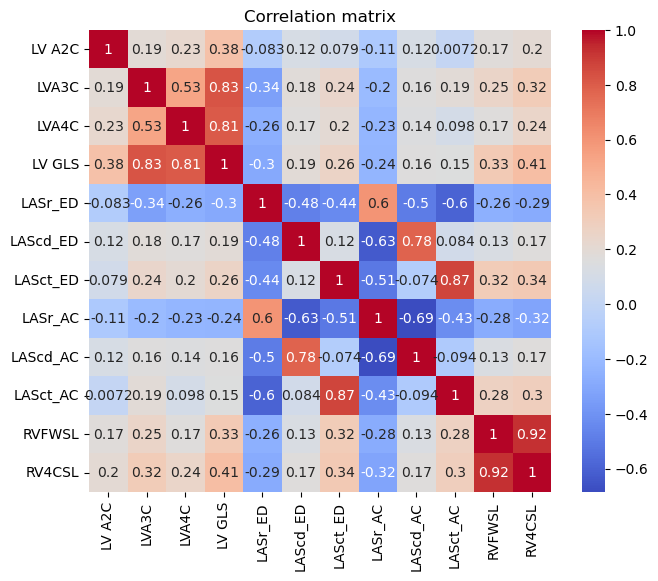

In [10]:
correlation_matrix = X[['LV A2C', 'LVA3C', 'LVA4C', 'LV GLS', 'LASr_ED', 'LAScd_ED',
'LASct_ED', 'LASr_AC', 'LAScd_AC', 'LASct_AC', 'RVFWSL', 'RV4CSL']].corr()

# Wykres macierzy korelacji
plt.figure(figsize=(8, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', square=True)
plt.title('Correlation matrix')
plt.savefig("matrix_scen2.png")
plt.show()


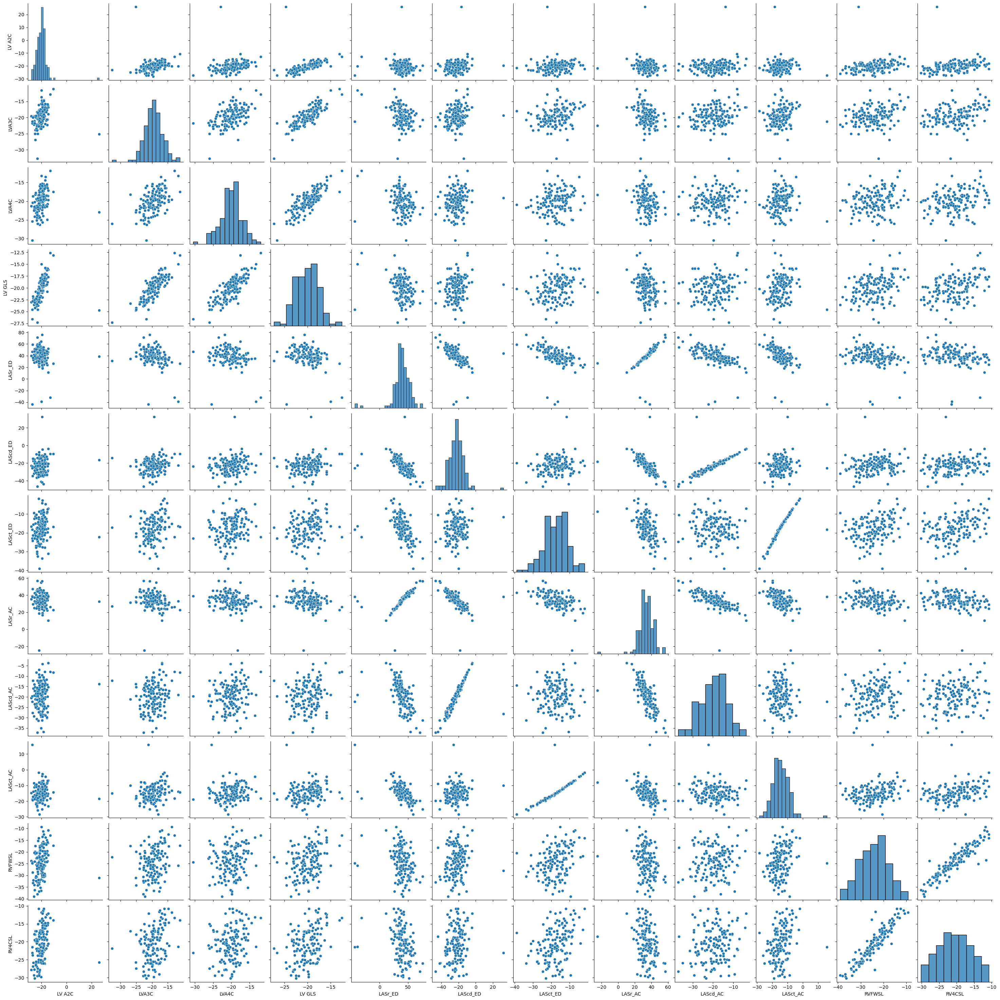

In [11]:
sns.pairplot(X[['LV A2C', 'LVA3C', 'LVA4C', 'LV GLS', 'LASr_ED', 'LAScd_ED',
'LASct_ED', 'LASr_AC', 'LAScd_AC', 'LASct_AC', 'RVFWSL', 'RV4CSL']])
plt.savefig("hist_scen2.png")
plt.show()

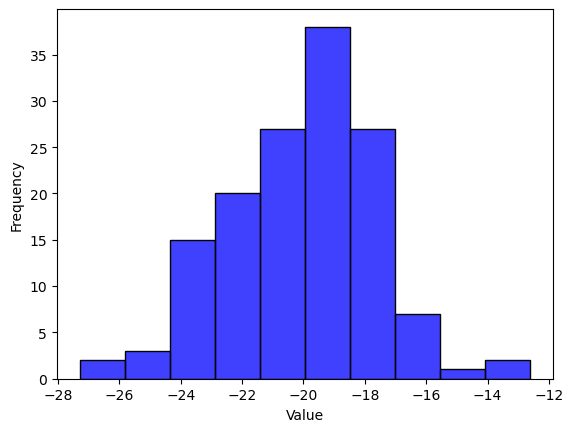

In [12]:
sns.histplot(data=X, x='LV GLS', bins=10, kde=False, color='blue')
plt.xlabel("Value")
plt.ylabel("Frequency")
plt.savefig("hist_scen2.png")
plt.show()

## Przygotowanie zbioru Y

In [13]:
columns_ver_2_res = ['HC - WYPI', 'HC (pc) -WYPI', 'HC (Z Score) -WYPI', 'dni  hospitalizacji', 'P27.1', 'H35.1']
y = df_merge[columns_ver_2_res]

In [14]:
y.info()

<class 'pandas.core.frame.DataFrame'>
Index: 142 entries, 0 to 168
Data columns (total 6 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   HC - WYPI            142 non-null    float64
 1   HC (pc) -WYPI        142 non-null    float64
 2   HC (Z Score) -WYPI   142 non-null    float64
 3   dni  hospitalizacji  142 non-null    float64
 4   P27.1                142 non-null    int64  
 5   H35.1                142 non-null    int64  
dtypes: float64(4), int64(2)
memory usage: 7.8 KB


In [15]:
y.shape

(142, 6)

### anomalie

Anomaly detection and classification evaluation for target column P27.1 with 5-fold cross-validation
Fold 1/5
Best parameters: {'contamination': 0.3, 'max_samples': 0.8, 'n_estimators': 50}
F1 Score for Test in Fold 1: 0.58


/home/michaltajak/anaconda3/envs/tensorplease/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/michaltajak/anaconda3/envs/tensorplease/lib/python3.9/site-packages/sklearn/model_selection/_validation.py", line 765, in _score
    scores = scorer(estimator, X_test)
TypeError: __call__() missing 1 required positional argument: 'y_true'

  warnings.warn(
/home/michaltajak/anaconda3/envs/tensorplease/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/michaltajak/anaconda3/envs/tensorplease/lib/python3.9/site-packages/sklearn/model_selection/_validation.py", line 765, in _score
    scores = scorer(estimator, X_test)
Typ

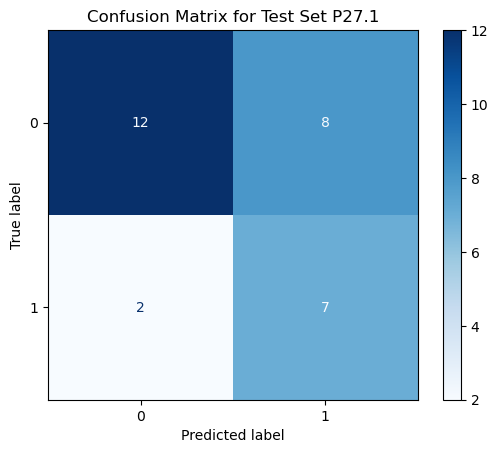

Fold 2/5


/home/michaltajak/anaconda3/envs/tensorplease/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/michaltajak/anaconda3/envs/tensorplease/lib/python3.9/site-packages/sklearn/model_selection/_validation.py", line 765, in _score
    scores = scorer(estimator, X_test)
TypeError: __call__() missing 1 required positional argument: 'y_true'

  warnings.warn(
/home/michaltajak/anaconda3/envs/tensorplease/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/michaltajak/anaconda3/envs/tensorplease/lib/python3.9/site-packages/sklearn/model_selection/_validation.py", line 765, in _score
    scores = scorer(estimator, X_test)
Typ

Best parameters: {'contamination': 0.3, 'max_samples': 0.8, 'n_estimators': 50}
F1 Score for Test in Fold 2: 0.29


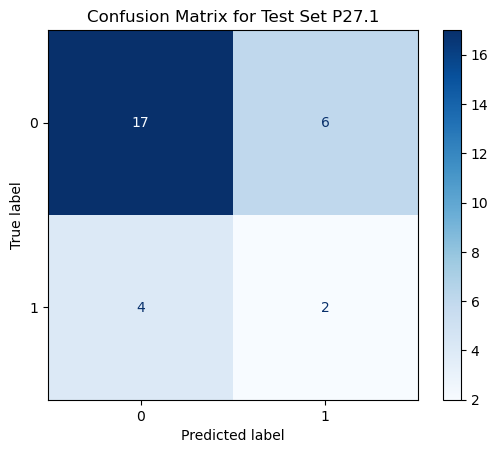

Fold 3/5
Best parameters: {'contamination': 0.3, 'max_samples': 0.8, 'n_estimators': 50}
F1 Score for Test in Fold 3: nan


/home/michaltajak/anaconda3/envs/tensorplease/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/michaltajak/anaconda3/envs/tensorplease/lib/python3.9/site-packages/sklearn/model_selection/_validation.py", line 765, in _score
    scores = scorer(estimator, X_test)
TypeError: __call__() missing 1 required positional argument: 'y_true'

  warnings.warn(
/home/michaltajak/anaconda3/envs/tensorplease/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/michaltajak/anaconda3/envs/tensorplease/lib/python3.9/site-packages/sklearn/model_selection/_validation.py", line 765, in _score
    scores = scorer(estimator, X_test)
Typ

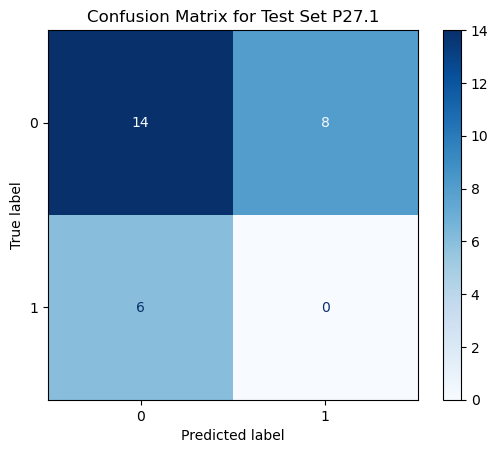

Fold 4/5
Best parameters: {'contamination': 0.3, 'max_samples': 0.8, 'n_estimators': 50}
F1 Score for Test in Fold 4: 0.29


/home/michaltajak/anaconda3/envs/tensorplease/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/michaltajak/anaconda3/envs/tensorplease/lib/python3.9/site-packages/sklearn/model_selection/_validation.py", line 765, in _score
    scores = scorer(estimator, X_test)
TypeError: __call__() missing 1 required positional argument: 'y_true'

  warnings.warn(
/home/michaltajak/anaconda3/envs/tensorplease/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/michaltajak/anaconda3/envs/tensorplease/lib/python3.9/site-packages/sklearn/model_selection/_validation.py", line 765, in _score
    scores = scorer(estimator, X_test)
Typ

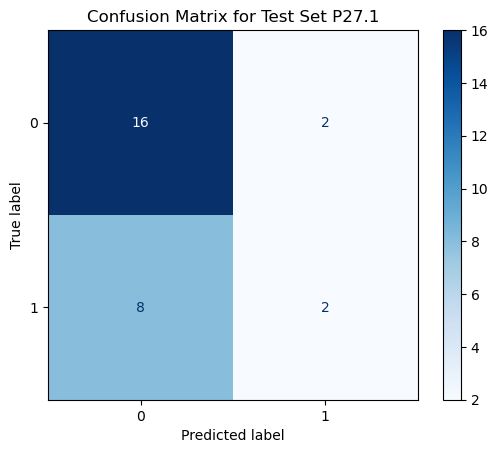

Fold 5/5
Best parameters: {'contamination': 0.3, 'max_samples': 0.8, 'n_estimators': 50}
F1 Score for Test in Fold 5: 0.25


/home/michaltajak/anaconda3/envs/tensorplease/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/michaltajak/anaconda3/envs/tensorplease/lib/python3.9/site-packages/sklearn/model_selection/_validation.py", line 765, in _score
    scores = scorer(estimator, X_test)
TypeError: __call__() missing 1 required positional argument: 'y_true'

  warnings.warn(
/home/michaltajak/anaconda3/envs/tensorplease/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/michaltajak/anaconda3/envs/tensorplease/lib/python3.9/site-packages/sklearn/model_selection/_validation.py", line 765, in _score
    scores = scorer(estimator, X_test)
Typ

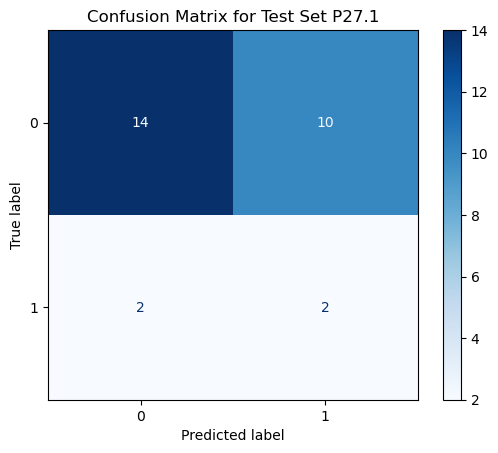

Anomaly detection and classification evaluation for target column H35.1 with 5-fold cross-validation
Fold 1/5
Best parameters: {'contamination': 0.3, 'max_samples': 0.8, 'n_estimators': 50}
F1 Score for Test in Fold 1: 0.12


/home/michaltajak/anaconda3/envs/tensorplease/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/michaltajak/anaconda3/envs/tensorplease/lib/python3.9/site-packages/sklearn/model_selection/_validation.py", line 765, in _score
    scores = scorer(estimator, X_test)
TypeError: __call__() missing 1 required positional argument: 'y_true'

  warnings.warn(
/home/michaltajak/anaconda3/envs/tensorplease/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/michaltajak/anaconda3/envs/tensorplease/lib/python3.9/site-packages/sklearn/model_selection/_validation.py", line 765, in _score
    scores = scorer(estimator, X_test)
Typ

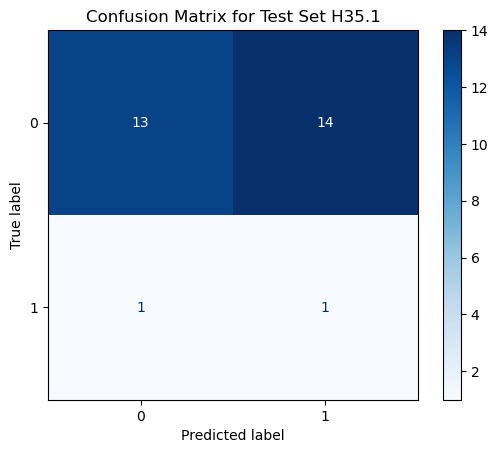

Fold 2/5
Best parameters: {'contamination': 0.3, 'max_samples': 0.8, 'n_estimators': 50}
F1 Score for Test in Fold 2: nan


/home/michaltajak/anaconda3/envs/tensorplease/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/michaltajak/anaconda3/envs/tensorplease/lib/python3.9/site-packages/sklearn/model_selection/_validation.py", line 765, in _score
    scores = scorer(estimator, X_test)
TypeError: __call__() missing 1 required positional argument: 'y_true'

  warnings.warn(
/home/michaltajak/anaconda3/envs/tensorplease/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/michaltajak/anaconda3/envs/tensorplease/lib/python3.9/site-packages/sklearn/model_selection/_validation.py", line 765, in _score
    scores = scorer(estimator, X_test)
Typ

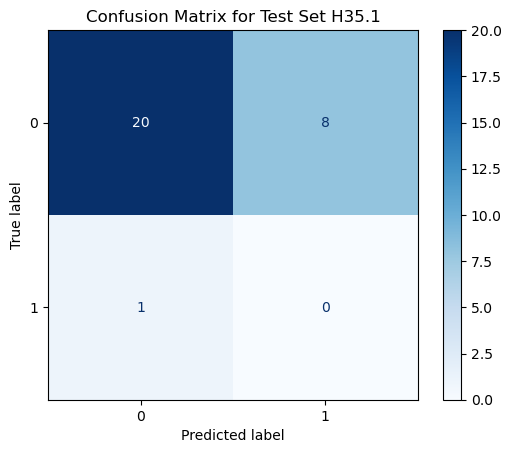

Fold 3/5
Best parameters: {'contamination': 0.3, 'max_samples': 0.8, 'n_estimators': 50}
F1 Score for Test in Fold 3: nan


/home/michaltajak/anaconda3/envs/tensorplease/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/michaltajak/anaconda3/envs/tensorplease/lib/python3.9/site-packages/sklearn/model_selection/_validation.py", line 765, in _score
    scores = scorer(estimator, X_test)
TypeError: __call__() missing 1 required positional argument: 'y_true'

  warnings.warn(
/home/michaltajak/anaconda3/envs/tensorplease/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/michaltajak/anaconda3/envs/tensorplease/lib/python3.9/site-packages/sklearn/model_selection/_validation.py", line 765, in _score
    scores = scorer(estimator, X_test)
Typ

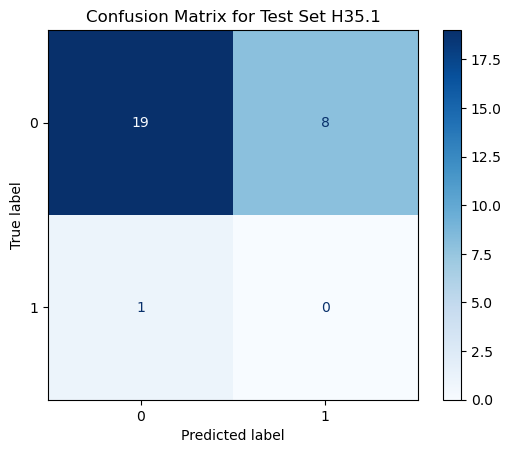

Fold 4/5
Best parameters: {'contamination': 0.3, 'max_samples': 0.8, 'n_estimators': 50}
F1 Score for Test in Fold 4: 0.22


/home/michaltajak/anaconda3/envs/tensorplease/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/michaltajak/anaconda3/envs/tensorplease/lib/python3.9/site-packages/sklearn/model_selection/_validation.py", line 765, in _score
    scores = scorer(estimator, X_test)
TypeError: __call__() missing 1 required positional argument: 'y_true'

  warnings.warn(
/home/michaltajak/anaconda3/envs/tensorplease/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/michaltajak/anaconda3/envs/tensorplease/lib/python3.9/site-packages/sklearn/model_selection/_validation.py", line 765, in _score
    scores = scorer(estimator, X_test)
Typ

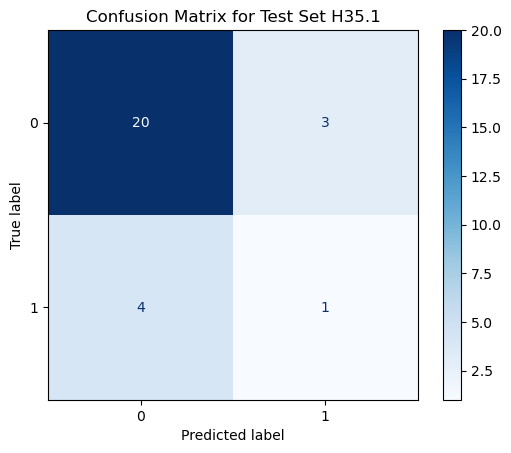

Fold 5/5
Best parameters: {'contamination': 0.3, 'max_samples': 0.8, 'n_estimators': 50}
F1 Score for Test in Fold 5: 0.14


/home/michaltajak/anaconda3/envs/tensorplease/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/michaltajak/anaconda3/envs/tensorplease/lib/python3.9/site-packages/sklearn/model_selection/_validation.py", line 765, in _score
    scores = scorer(estimator, X_test)
TypeError: __call__() missing 1 required positional argument: 'y_true'

  warnings.warn(
/home/michaltajak/anaconda3/envs/tensorplease/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/michaltajak/anaconda3/envs/tensorplease/lib/python3.9/site-packages/sklearn/model_selection/_validation.py", line 765, in _score
    scores = scorer(estimator, X_test)
Typ

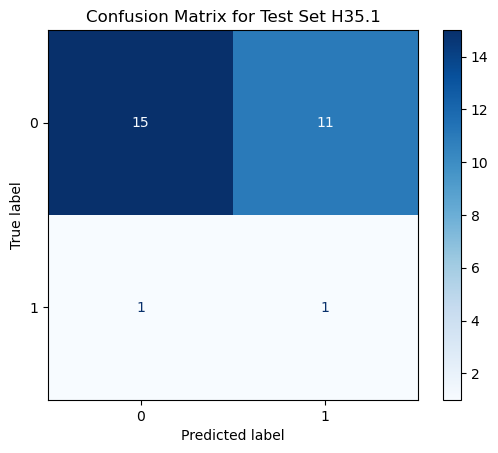

In [19]:
import pandas as pd
import numpy as np
from sklearn.model_selection import GridSearchCV, KFold
from sklearn.preprocessing import MinMaxScaler
from sklearn.ensemble import IsolationForest
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, f1_score, make_scorer
import matplotlib.pyplot as plt

# Define your classification target columns
cla = ['P27.1', 'H35.1']

# Custom scoring function for anomaly detection using f1_score
def anomaly_f1_scorer(estimator, X, y_true):
    """
    Custom scorer that uses f1_score to evaluate anomaly detection.
    Anomalies are treated as the positive class.
    """
    predictions = estimator.predict(X)
    y_pred = np.where(predictions == -1, 1, 0)  # Anomaly as positive class
    return f1_score(y_true, y_pred, average='weighted')

# Create a custom scorer using f1_score
custom_scorer = make_scorer(anomaly_f1_scorer, greater_is_better=True)

# Anomaly detection with grid search for hyperparameters
def detect_anomalies_with_gridsearch(X, param_grid, cv=5):
    model = IsolationForest(random_state=43)
    grid_search = GridSearchCV(model, param_grid, cv=cv, scoring=custom_scorer, n_jobs=-1)
    grid_search.fit(X)
    return grid_search.best_estimator_, grid_search.best_params_

# Cross-validation for anomaly detection in classification context
def cross_validate_anomaly_detection_classification(X, y, cv=5):
    X = X.values
    kf = KFold(n_splits=cv, shuffle=True, random_state=43)
    scaler = MinMaxScaler()
    X_scaled = scaler.fit_transform(X)
    
    fold = 1
    for train_idx, test_idx in kf.split(X_scaled):
        print(f"Fold {fold}/{cv}")
        X_train, X_test = X_scaled[train_idx], X_scaled[test_idx]
        y_train, y_test = y.iloc[train_idx], y.iloc[test_idx]
        
        # Define parameter grid for IsolationForest
        param_grid = {
            'n_estimators': [50, 100, 150, 200],
            'max_samples': [0.8, 0.9],
            'contamination': [0.3],
        }
        
        # Perform grid search to find the best model
        best_model, best_params = detect_anomalies_with_gridsearch(X_train, param_grid, cv=3)
        print(f"Best parameters: {best_params}")
        
        # Detect anomalies in test data using the best model
        predictions_test = best_model.predict(X_test)
        
        # Evaluate classification performance using anomalies as the positive class
        y_pred_test = np.where(predictions_test == -1, 1, 0)  # Assuming anomaly as a positive class
        cm_test = confusion_matrix(y_test, y_pred_test)
        
        # Compute F1 Score for this fold
        TN, FP, FN, TP = cm_test.ravel()
        precision = TP / (TP + FP)
        recall = TP / (TP + FN)
        
        # Obliczanie F1 score
        f1 = 2 * (precision * recall) / (precision + recall)
        print(f"F1 Score for Test in Fold {fold}: {f1:.2f}")
        
        # Display the confusion matrix
        disp_test = ConfusionMatrixDisplay(confusion_matrix=cm_test)
        disp_test.plot(cmap='Blues', values_format='d')
        plt.title(f'Confusion Matrix for Test Set {y.name}')
        plt.show()
        
        fold += 1

# Example usage with classification targets
# Assume `X` is your feature matrix and `y` is the DataFrame with target columns
# Loop through classification targets using 5-fold cross-validation for anomaly detection
for y_col in cla:
    print(f"Anomaly detection and classification evaluation for target column {y_col} with 5-fold cross-validation")
    cross_validate_anomaly_detection_classification(X, y[y_col], cv=5)


### Proby modeli

#### GadientBoost + RandomForest (MSE)

In [ ]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.ensemble import GradientBoostingRegressor, RandomForestClassifier, RandomForestRegressor
from sklearn.metrics import mean_squared_error, accuracy_score, r2_score, confusion_matrix, ConfusionMatrixDisplay

# Zakładamy, że y to ramka danych zawierająca odpowiednie zmienne wyjściowe
y_reg = y[['HC - WYPI', 'HC (pc) -WYPI', 'HC (Z Score) -WYPI', 'dni  hospitalizacji']]
y_clf = y[['P27.1', 'H35.1']]

# Rozdzielenie danych na zestawy treningowe + walidacyjne i testowe
X_train_val, X_test, y_reg_train_val, y_reg_test, y_clf_train_val, y_clf_test = train_test_split(
    X, y_reg, y_clf, test_size=0.2, random_state=43
)

# Rozdzielenie zestawu treningowego + walidacyjnego na zestawy treningowe i walidacyjne
X_train, X_val, y_reg_train, y_reg_val, y_clf_train, y_clf_val = train_test_split(
    X_train_val, y_reg_train_val, y_clf_train_val, test_size=0.20, random_state=43
)

# --- MODELE REGRESYJNE ---
# GradientBoostingRegressor dla każdej zmiennej regresyjnej
regressors = [GradientBoostingRegressor() for _ in range(y_reg_train.shape[1])]
#regressors = [RandomForestRegressor() for _ in range(y_reg_train.shape[1])]

# Optymalizacja hiperparametrów za pomocą GridSearchCV dla każdego modelu regresyjnego
param_grid_reg = {
    'n_estimators': [10, 20 ,30, 40, 50],
    'learning_rate': [0.01, 0.05, 0.1],
    'min_samples_split': [2, 3, 4],
    'min_samples_leaf': [1, 2, 3],
    'max_depth': [3, 4, 5],
    'criterion': ['friedman_mse']
}

optimized_regressors = []
for i in range(y_reg_train.shape[1]):
    grid_search_reg = GridSearchCV(regressors[i], param_grid_reg, cv=5, n_jobs=-1, scoring='neg_mean_squared_error')
    grid_search_reg.fit(X_train, y_reg_train.iloc[:, i])
    optimized_regressors.append(grid_search_reg.best_estimator_)
    print(f'Najlepszy model regresji dla cechy {i}: {grid_search_reg.best_params_}')

# --- MODELE KLASYFIKACYJNE ---
# RandomForestClassifier dla każdej zmiennej klasyfikacyjnej
classifiers = [RandomForestClassifier() for _ in range(y_clf_train.shape[1])]

# Optymalizacja hiperparametrów za pomocą GridSearchCV dla każdego modelu klasyfikacyjnego
param_grid_clf = {
    'n_estimators': [10, 20 ,30],
    'max_depth': [3, 5, 7],
    'min_samples_split': [2, 5, 10],
}

optimized_classifiers = []
for i in range(y_clf_train.shape[1]):
    grid_search_clf = GridSearchCV(classifiers[i], param_grid_clf, scoring='accuracy')
    grid_search_clf.fit(X_train, y_clf_train.iloc[:, i])
    optimized_classifiers.append(grid_search_clf.best_estimator_)
    print(f'Najlepszy model klasyfikacji dla cechy {i}: {grid_search_clf.best_params_}')

# --- EWALUACJA ---
# Ewaluacja modeli regresyjnych (MSE i R^2 dla każdej cechy regresyjnej)
for i, regressor in enumerate(optimized_regressors):
    y_pred_reg_val = regressor.predict(X_val)
    y_pred_reg_test = regressor.predict(X_test)
    
    mse_val = mean_squared_error(y_reg_val.iloc[:, i], y_pred_reg_val)
    mse_test = mean_squared_error(y_reg_test.iloc[:, i], y_pred_reg_test)
    
    r2_val = r2_score(y_reg_val.iloc[:, i], y_pred_reg_val)
    r2_test = r2_score(y_reg_test.iloc[:, i], y_pred_reg_test)

    print('***')
    print(f'Walidacja: Błąd MSE dla zmiennej regresyjnej {i}: {mse_val}, R^2: {r2_val}')
    print(f'Test: Błąd MSE dla zmiennej regresyjnej {i}: {mse_test}, R^2: {r2_test}')

    print('***')
    print(f'Walidacja: Błąd MSE dla zmiennej regresyjnej {i}: {mse_val}, R^2: {r2_val}')
    print(f'Test: Błąd MSE dla zmiennej regresyjnej {i}: {mse_test}, R^2: {r2_test}')
    
    # Wykres przewidywanych wartości w porównaniu do rzeczywistych
    plt.figure(figsize=(10, 6))
    plt.scatter(y_reg_val.iloc[:, i], y_pred_reg_val, color='blue', label='Przewidywane wartości', alpha=0.6)
    plt.scatter(y_reg_test.iloc[:, i], y_pred_reg_test, color='red', label='Rzeczywiste wartości', alpha=0.6)
    
    plt.plot([y_reg_val.iloc[:, i].min(), y_reg_val.iloc[:, i].max()],
             [y_reg_val.iloc[:, i].min(), y_reg_val.iloc[:, i].max()],
             'k--', lw=2, label='Linia idealna')
    
    plt.xlabel('Rzeczywiste wartości')
    plt.ylabel('Przewidywane wartości')
    plt.title(f'Porównanie rzeczywistych i przewidywanych wartości dla zmiennej {i}')
    plt.legend()
    plt.grid(True)
    plt.show()

# Ewaluacja modeli klasyfikacyjnych (accuracy dla każdej cechy klasyfikacyjnej)
for i, classifier in enumerate(optimized_classifiers):
    y_pred_clf_val = classifier.predict(X_val)
    y_pred_clf_test = classifier.predict(X_test)
    
    accuracy_val = accuracy_score(y_clf_val.iloc[:, i], y_pred_clf_val)
    accuracy_test = accuracy_score(y_clf_test.iloc[:, i], y_pred_clf_test)

    print('***')
    print(f'Walidacja: Dokładność (accuracy) dla zmiennej klasyfikacyjnej {i}: {accuracy_val}')
    print(f'Test: Dokładność (accuracy) dla zmiennej klasyfikacyjnej {i}: {accuracy_test}')

    # Wyświetlenie macierzy trafności
    cm_val = confusion_matrix(y_clf_val.iloc[:, i], y_pred_clf_val)
    cm_test = confusion_matrix(y_clf_test.iloc[:, i], y_pred_clf_test)

    print("Macierz trafności dla walidacji:")
    disp_val = ConfusionMatrixDisplay(confusion_matrix=cm_val)
    disp_val.plot(cmap='Blues', values_format='d')
    plt.title(f'Macierz trafności dla walidacji - cecha {i}')
    plt.show()

    print("Macierz trafności dla testów:")
    disp_test = ConfusionMatrixDisplay(confusion_matrix=cm_test)
    disp_test.plot(cmap='Blues', values_format='d')
    plt.title(f'Macierz trafności dla testów - cecha {i}')
    plt.show()


Trenowanie modelu dla kolumny HC - WYPI z 5-krotną walidacją krzyżową
Fold 1/5


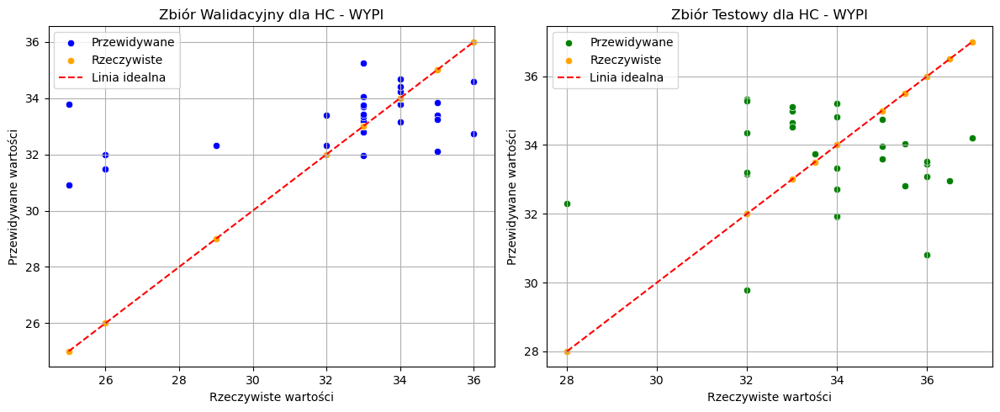

Best Parameters: {'criterion': 'friedman_mse', 'learning_rate': 0.01, 'max_depth': 6, 'min_samples_leaf': 2, 'min_samples_split': 3, 'n_estimators': 600}
MSE (Train): 0.0007, MAE (Train): 0.0196, R2 (Train): 0.9999
MSE (Val): 7.9032, MAE (Val): 1.8203, R2 (Val): 0.1671
MSE (Test): 5.5490, MAE (Test): 2.0615, R2 (Test): -0.5671

Fold 2/5


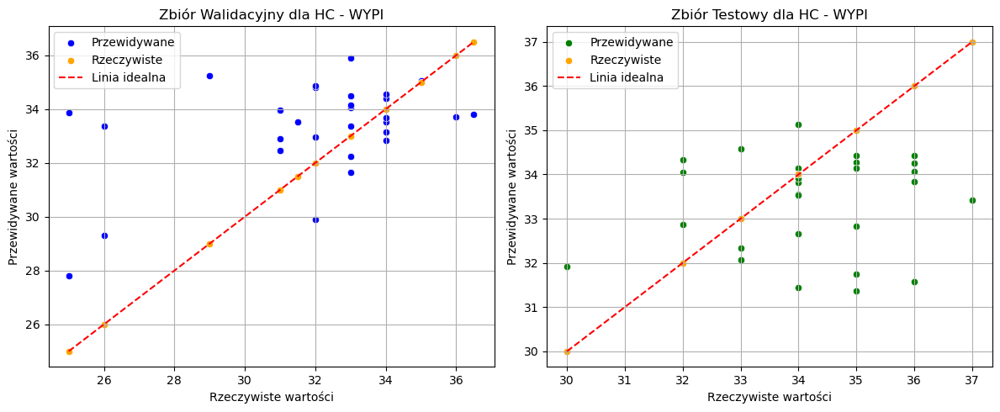

Best Parameters: {'criterion': 'friedman_mse', 'learning_rate': 0.01, 'max_depth': 6, 'min_samples_leaf': 3, 'min_samples_split': 3, 'n_estimators': 600}
MSE (Train): 0.0178, MAE (Train): 0.0780, R2 (Train): 0.9963
MSE (Val): 9.0237, MAE (Val): 2.1911, R2 (Val): -0.0129
MSE (Test): 3.6066, MAE (Test): 1.4995, R2 (Test): -0.6151

Fold 3/5


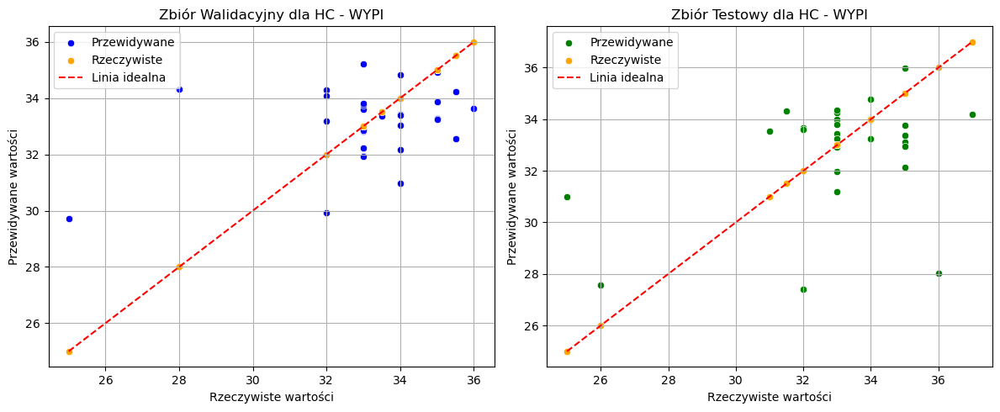

Best Parameters: {'criterion': 'friedman_mse', 'learning_rate': 0.05, 'max_depth': 5, 'min_samples_leaf': 1, 'min_samples_split': 4, 'n_estimators': 600}
MSE (Train): 0.0000, MAE (Train): 0.0000, R2 (Train): 1.0000
MSE (Val): 4.2560, MAE (Val): 1.5340, R2 (Val): 0.0905
MSE (Test): 6.5856, MAE (Test): 1.8940, R2 (Test): -0.0583

Fold 4/5


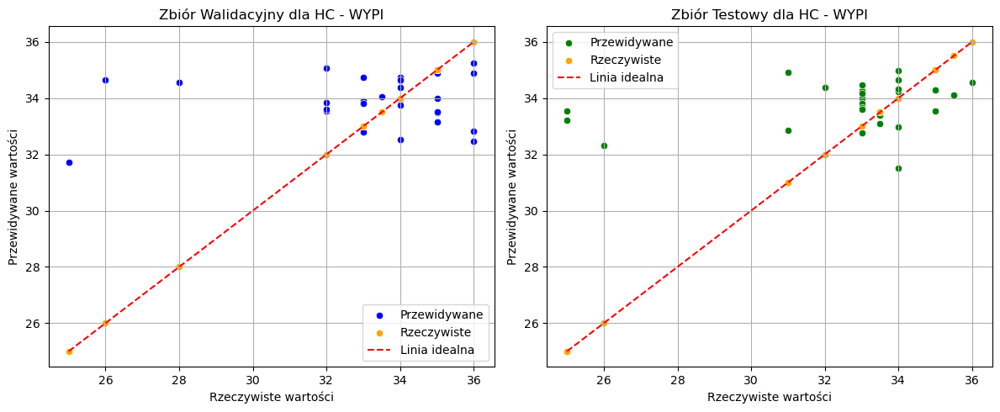

Best Parameters: {'criterion': 'friedman_mse', 'learning_rate': 0.01, 'max_depth': 4, 'min_samples_leaf': 2, 'min_samples_split': 5, 'n_estimators': 600}
MSE (Train): 0.0174, MAE (Train): 0.1073, R2 (Train): 0.9960
MSE (Val): 7.6884, MAE (Val): 1.8321, R2 (Val): -0.0918
MSE (Test): 8.1567, MAE (Test): 1.7981, R2 (Test): -0.0468

Fold 5/5


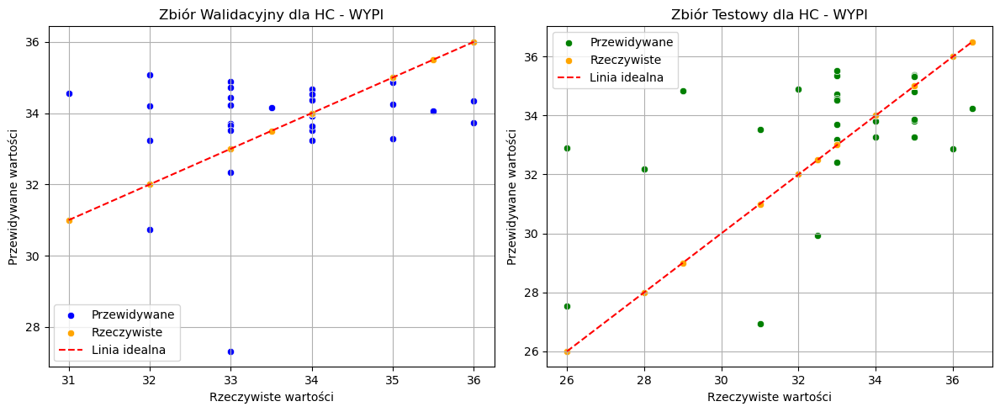

Best Parameters: {'criterion': 'friedman_mse', 'learning_rate': 0.01, 'max_depth': 5, 'min_samples_leaf': 3, 'min_samples_split': 3, 'n_estimators': 600}
MSE (Train): 0.0075, MAE (Train): 0.0607, R2 (Train): 0.9989
MSE (Val): 3.1467, MAE (Val): 1.3404, R2 (Val): -1.1385
MSE (Test): 6.5616, MAE (Test): 1.9577, R2 (Test): 0.0731

Trenowanie modelu dla kolumny HC (pc) -WYPI z 5-krotną walidacją krzyżową
Fold 1/5


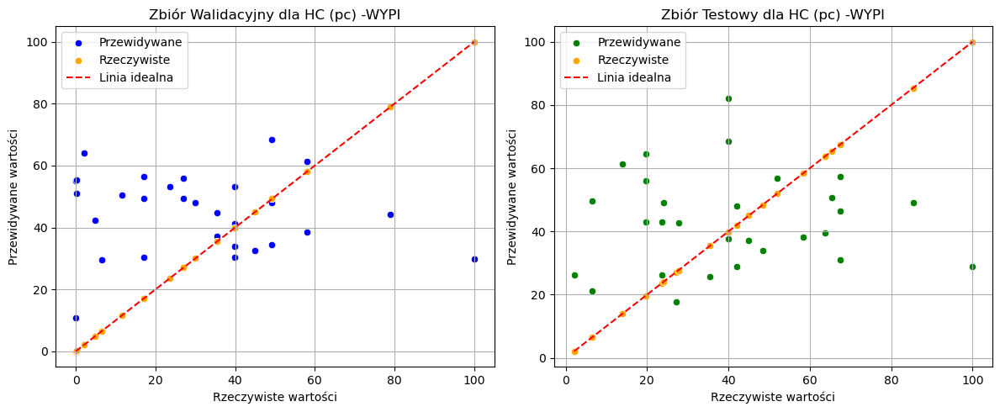

Best Parameters: {'criterion': 'friedman_mse', 'learning_rate': 0.05, 'max_depth': 4, 'min_samples_leaf': 2, 'min_samples_split': 5, 'n_estimators': 600}
MSE (Train): 0.0000, MAE (Train): 0.0001, R2 (Train): 1.0000
MSE (Val): 1001.5024, MAE (Val): 25.3093, R2 (Val): -0.7043
MSE (Test): 787.6051, MAE (Test): 23.0937, R2 (Test): -0.3872

Fold 2/5


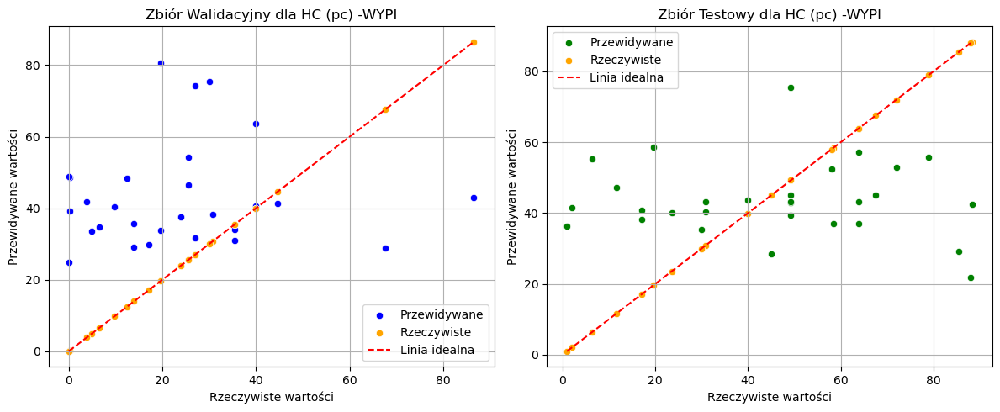

Best Parameters: {'criterion': 'friedman_mse', 'learning_rate': 0.01, 'max_depth': 4, 'min_samples_leaf': 1, 'min_samples_split': 4, 'n_estimators': 600}
MSE (Train): 4.4089, MAE (Train): 1.6657, R2 (Train): 0.9931
MSE (Val): 927.9531, MAE (Val): 25.6747, R2 (Val): -1.4299
MSE (Test): 806.9938, MAE (Test): 23.2251, R2 (Test): -0.2363

Fold 3/5


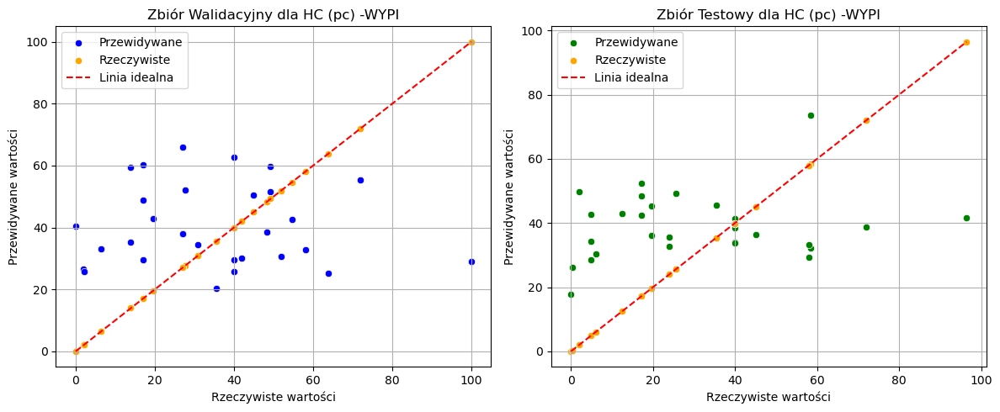

Best Parameters: {'criterion': 'friedman_mse', 'learning_rate': 0.1, 'max_depth': 5, 'min_samples_leaf': 3, 'min_samples_split': 3, 'n_estimators': 600}
MSE (Train): 0.0000, MAE (Train): 0.0000, R2 (Train): 1.0000
MSE (Val): 733.4620, MAE (Val): 22.6468, R2 (Val): -0.4253
MSE (Test): 676.8482, MAE (Test): 22.5826, R2 (Test): -0.1732

Fold 4/5


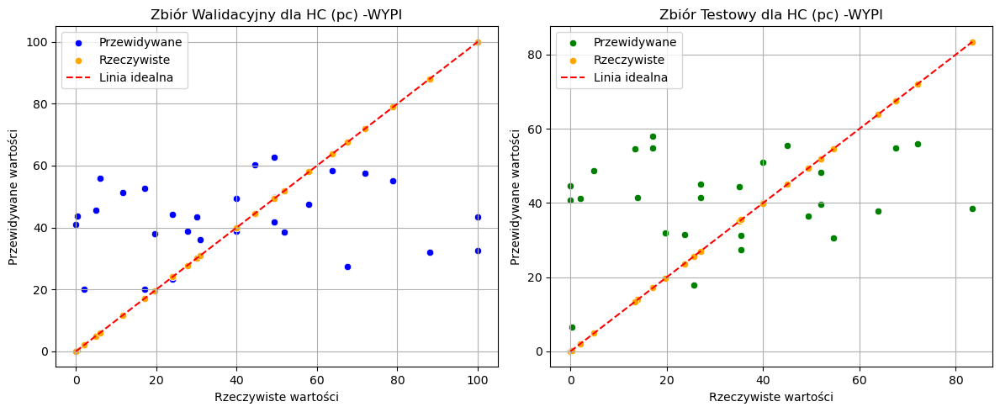

Best Parameters: {'criterion': 'friedman_mse', 'learning_rate': 0.05, 'max_depth': 4, 'min_samples_leaf': 2, 'min_samples_split': 3, 'n_estimators': 600}
MSE (Train): 0.0000, MAE (Train): 0.0001, R2 (Train): 1.0000
MSE (Val): 902.9942, MAE (Val): 23.3265, R2 (Val): -0.0807
MSE (Test): 640.8374, MAE (Test): 20.6572, R2 (Test): -0.2330

Fold 5/5


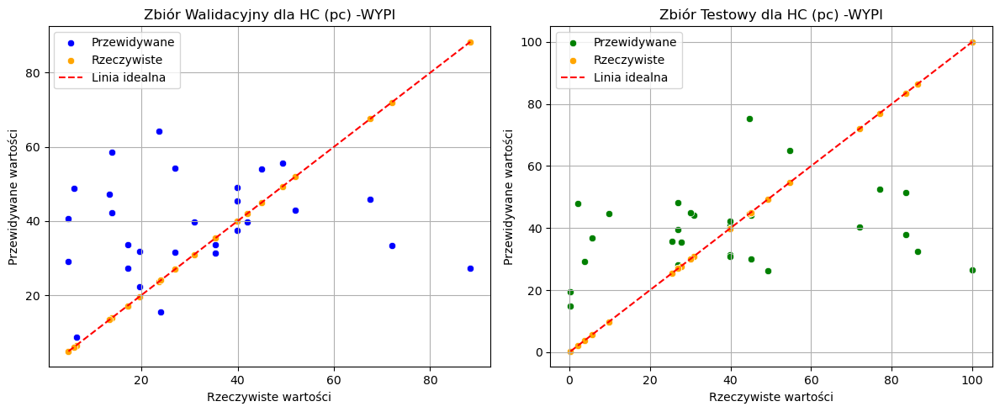

Best Parameters: {'criterion': 'friedman_mse', 'learning_rate': 0.1, 'max_depth': 4, 'min_samples_leaf': 3, 'min_samples_split': 3, 'n_estimators': 600}
MSE (Train): 0.0000, MAE (Train): 0.0000, R2 (Train): 1.0000
MSE (Val): 578.3154, MAE (Val): 17.7147, R2 (Val): -0.3835
MSE (Test): 774.4754, MAE (Test): 21.9501, R2 (Test): -0.0164

Trenowanie modelu dla kolumny HC (Z Score) -WYPI z 5-krotną walidacją krzyżową
Fold 1/5


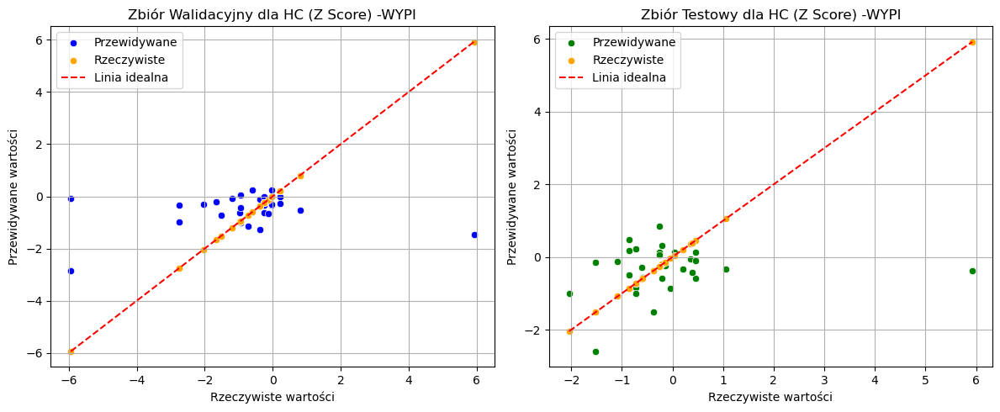

Best Parameters: {'criterion': 'friedman_mse', 'learning_rate': 0.1, 'max_depth': 4, 'min_samples_leaf': 2, 'min_samples_split': 3, 'n_estimators': 600}
MSE (Train): 0.0000, MAE (Train): 0.0000, R2 (Train): 1.0000
MSE (Val): 4.1534, MAE (Val): 1.1777, R2 (Val): -0.0275
MSE (Test): 1.9810, MAE (Test): 0.8672, R2 (Test): -0.1193

Fold 2/5


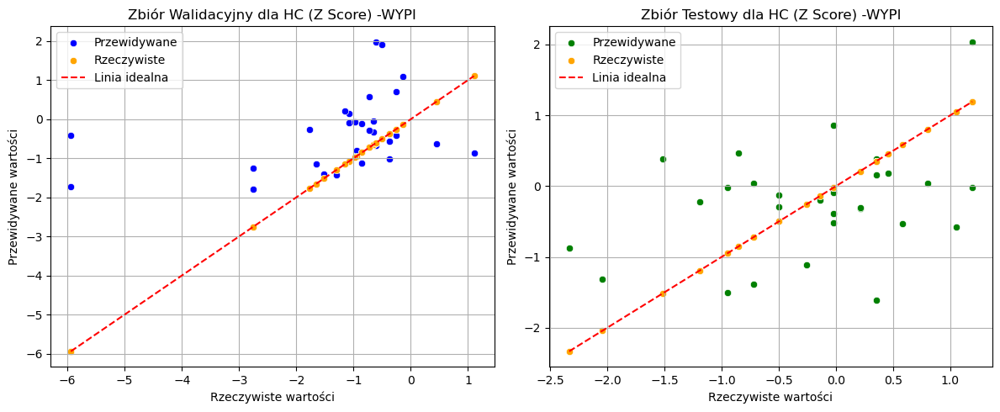

Best Parameters: {'criterion': 'friedman_mse', 'learning_rate': 0.05, 'max_depth': 4, 'min_samples_leaf': 3, 'min_samples_split': 3, 'n_estimators': 600}
MSE (Train): 0.0000, MAE (Train): 0.0002, R2 (Train): 1.0000
MSE (Val): 2.8444, MAE (Val): 1.1732, R2 (Val): -0.2619
MSE (Test): 0.8424, MAE (Test): 0.7488, R2 (Test): -0.1183

Fold 3/5


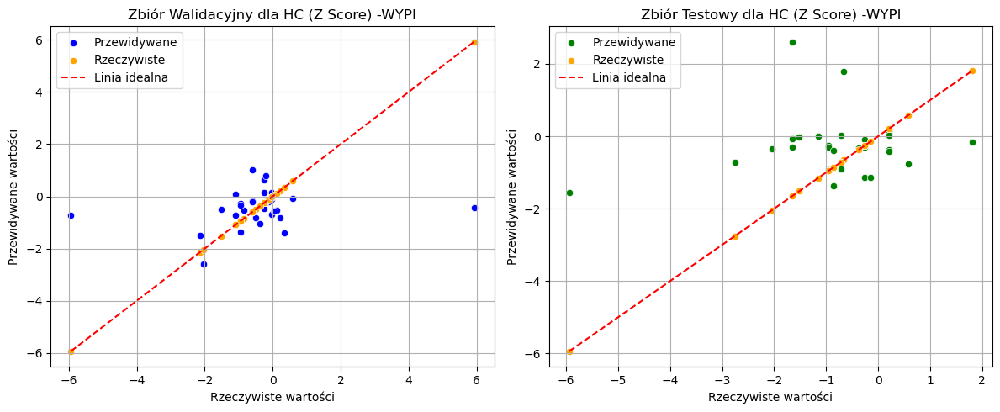

Best Parameters: {'criterion': 'friedman_mse', 'learning_rate': 0.01, 'max_depth': 4, 'min_samples_leaf': 3, 'min_samples_split': 3, 'n_estimators': 600}
MSE (Train): 0.0443, MAE (Train): 0.1240, R2 (Train): 0.9729
MSE (Val): 2.8702, MAE (Val): 0.9957, R2 (Val): -0.0082
MSE (Test): 2.4499, MAE (Test): 1.0955, R2 (Test): -0.3907

Fold 4/5


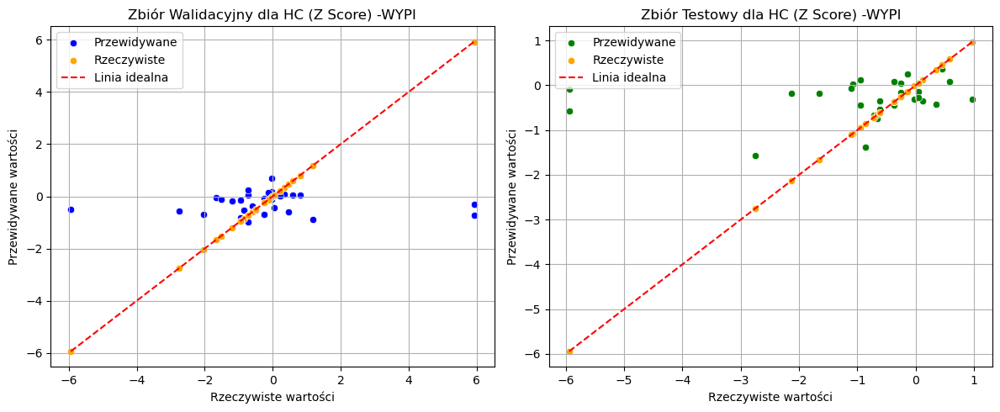

Best Parameters: {'criterion': 'friedman_mse', 'learning_rate': 0.1, 'max_depth': 4, 'min_samples_leaf': 2, 'min_samples_split': 5, 'n_estimators': 600}
MSE (Train): 0.0000, MAE (Train): 0.0000, R2 (Train): 1.0000
MSE (Val): 4.6411, MAE (Val): 1.2648, R2 (Val): -0.0355
MSE (Test): 2.7894, MAE (Test): 0.9238, R2 (Test): -0.0902

Fold 5/5


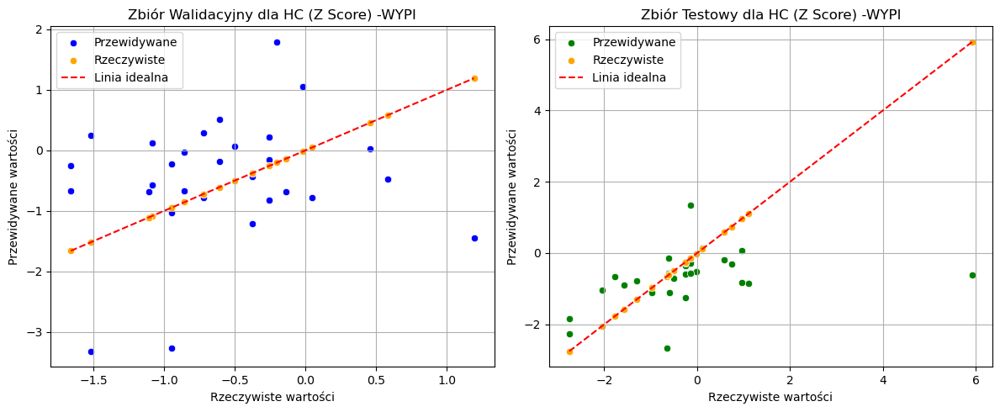

Best Parameters: {'criterion': 'friedman_mse', 'learning_rate': 0.1, 'max_depth': 4, 'min_samples_leaf': 2, 'min_samples_split': 5, 'n_estimators': 600}
MSE (Train): 0.0000, MAE (Train): 0.0000, R2 (Train): 1.0000
MSE (Val): 1.2512, MAE (Val): 0.8983, R2 (Val): -1.9060
MSE (Test): 2.3140, MAE (Test): 0.9000, R2 (Test): 0.0328

Trenowanie modelu dla kolumny dni  hospitalizacji z 5-krotną walidacją krzyżową
Fold 1/5


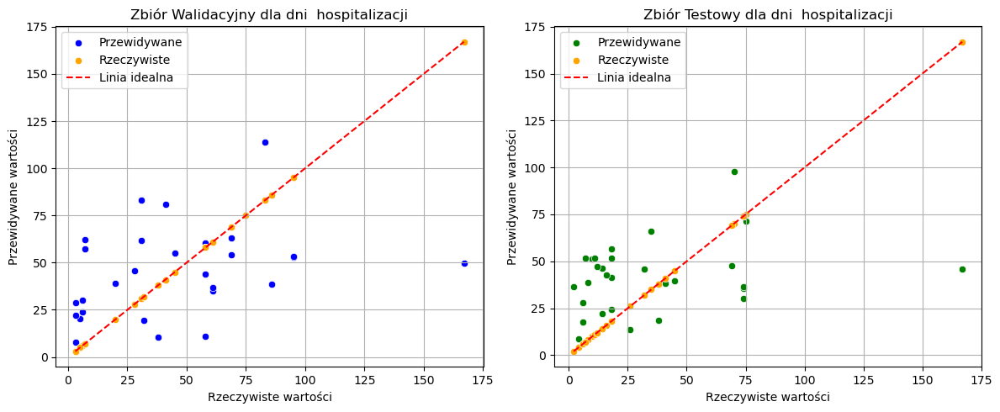

Best Parameters: {'criterion': 'friedman_mse', 'learning_rate': 0.01, 'max_depth': 4, 'min_samples_leaf': 1, 'min_samples_split': 4, 'n_estimators': 600}
MSE (Train): 2.1004, MAE (Train): 1.1772, R2 (Train): 0.9983
MSE (Val): 1348.8628, MAE (Val): 28.8198, R2 (Val): 0.0317
MSE (Test): 1270.7605, MAE (Test): 28.0205, R2 (Test): -0.0360

Fold 2/5


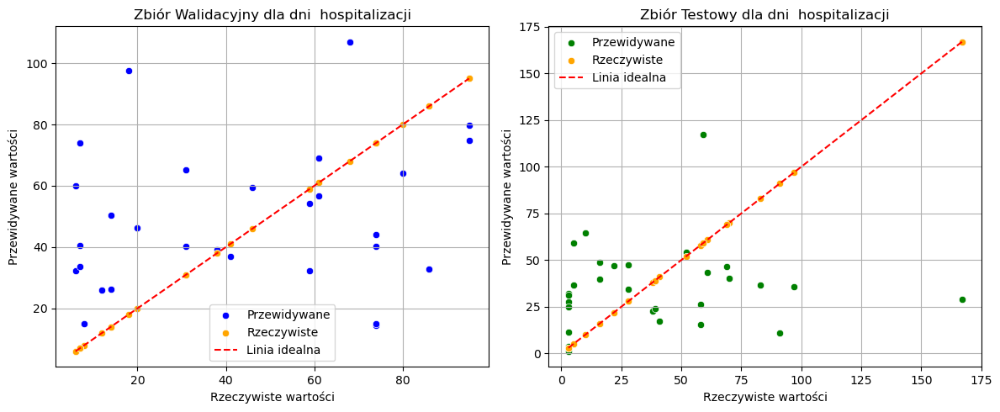

Best Parameters: {'criterion': 'friedman_mse', 'learning_rate': 0.01, 'max_depth': 4, 'min_samples_leaf': 1, 'min_samples_split': 5, 'n_estimators': 600}
MSE (Train): 1.8143, MAE (Train): 1.0511, R2 (Train): 0.9987
MSE (Val): 1214.8301, MAE (Val): 28.0838, R2 (Val): -0.3438
MSE (Test): 1816.8435, MAE (Test): 32.6505, R2 (Test): -0.2592

Fold 3/5


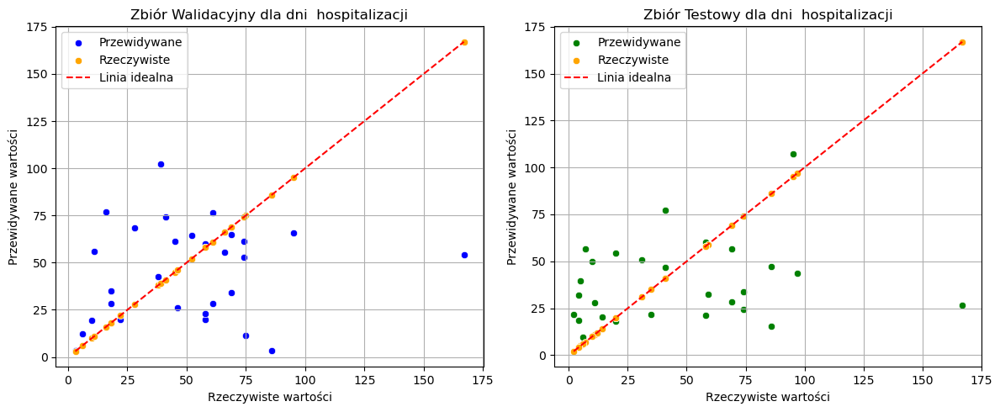

Best Parameters: {'criterion': 'friedman_mse', 'learning_rate': 0.05, 'max_depth': 6, 'min_samples_leaf': 3, 'min_samples_split': 3, 'n_estimators': 600}
MSE (Train): 0.0000, MAE (Train): 0.0016, R2 (Train): 1.0000
MSE (Val): 1531.2442, MAE (Val): 28.8971, R2 (Val): -0.3739
MSE (Test): 1688.1353, MAE (Test): 30.3101, R2 (Test): -0.1095

Fold 4/5


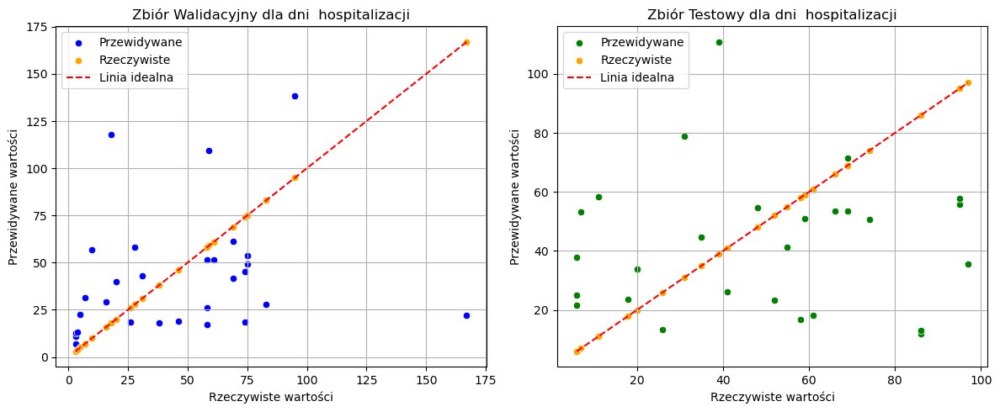

Best Parameters: {'criterion': 'friedman_mse', 'learning_rate': 0.1, 'max_depth': 4, 'min_samples_leaf': 3, 'min_samples_split': 3, 'n_estimators': 600}
MSE (Train): 0.0000, MAE (Train): 0.0000, R2 (Train): 1.0000
MSE (Val): 1835.5706, MAE (Val): 30.9747, R2 (Val): -0.3745
MSE (Test): 1332.8845, MAE (Test): 29.1920, R2 (Test): -0.6037

Fold 5/5


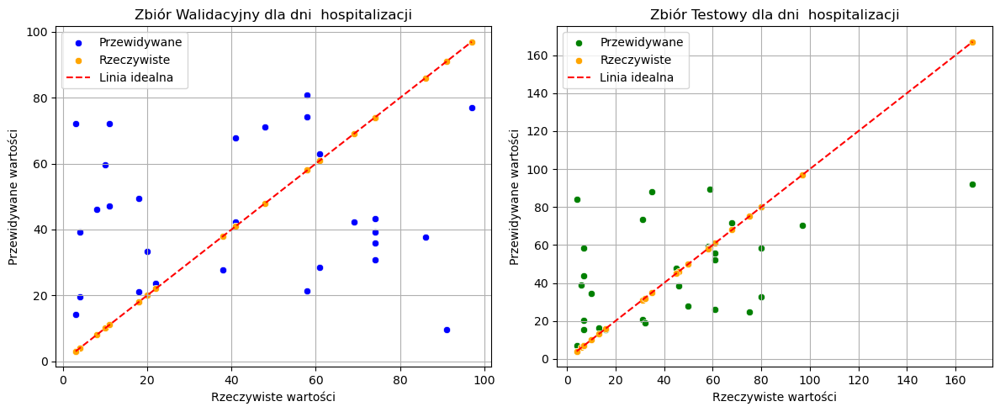

Best Parameters: {'criterion': 'friedman_mse', 'learning_rate': 0.01, 'max_depth': 5, 'min_samples_leaf': 3, 'min_samples_split': 3, 'n_estimators': 600}
MSE (Train): 3.5258, MAE (Train): 0.9761, R2 (Train): 0.9975
MSE (Val): 1262.9902, MAE (Val): 29.6816, R2 (Val): -0.4202
MSE (Test): 1130.2373, MAE (Test): 25.3899, R2 (Test): 0.1441

Trenowanie modelu dla kolumny P27.1 z 5-krotną walidacją krzyżową
Fold 1/5
Shapes -> X_train: (84, 30), y_train: (84,), X_val: (29, 30), y_val: (29,), X_test: (29, 30), y_test: (29,)
Best Parameters: {'max_depth': 4, 'min_samples_leaf': 2, 'min_samples_split': 10, 'n_estimators': 100}
F1-score (Train): 0.9126, F1-score (Val): 0.7714, F1-score (Test): 0.7982
Accuracy (Train): 0.9167, Accuracy (Val): 0.7931, Accuracy (Test): 0.8621

Macierz trafności dla walidacji:


TypeError: Invalid shape (29,) for image data

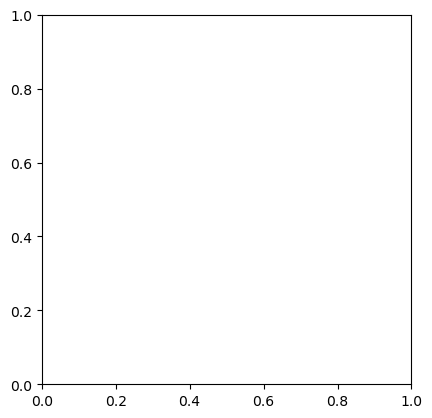

In [15]:
import pandas as pd
import numpy as np
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score, accuracy_score, confusion_matrix, f1_score, ConfusionMatrixDisplay
from sklearn.model_selection import train_test_split, GridSearchCV, KFold
from sklearn.preprocessing import MinMaxScaler
from sklearn.ensemble import GradientBoostingRegressor, RandomForestClassifier
import seaborn as sns
import matplotlib.pyplot as plt

# Define your regression and classification target columns
reg = ['HC - WYPI', 'HC (pc) -WYPI', 'HC (Z Score) -WYPI', 'dni  hospitalizacji']
cla = ['P27.1', 'H35.1']

# Hyperparameters grid
param_grid_reg = {
    'n_estimators': [600],
    'learning_rate': [0.01, 0.05, 0.1],
    'min_samples_split': [3, 4, 5],
    'min_samples_leaf': [1, 2, 3],
    'max_depth': [4, 5, 6],
    'criterion': ['friedman_mse']
}

param_grid_cla = {
    'n_estimators': [100],
    'max_depth': [2, 4, 6],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 3]
}

# Cross-validation function for regression
def evaluate_regression_model(X_train, X_val, X_test, y_train, y_val, y_test, model, param_grid, y_col):
    grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=5, n_jobs=-1, verbose=0)
    grid_search.fit(X_train, y_train)
    
    best_model = grid_search.best_estimator_
    
    # Evaluate on training set
    y_train_pred = best_model.predict(X_train)
    mse_train = mean_squared_error(y_train, y_train_pred)
    mae_train = mean_absolute_error(y_train, y_train_pred)
    r2_train = r2_score(y_train, y_train_pred)

    # Evaluate on validation set
    y_val_pred = best_model.predict(X_val)
    mse_val = mean_squared_error(y_val, y_val_pred)
    mae_val = mean_absolute_error(y_val, y_val_pred)
    r2_val = r2_score(y_val, y_val_pred)

    # Evaluate on test set
    y_test_pred = best_model.predict(X_test)
    mse_test = mean_squared_error(y_test, y_test_pred)
    mae_test = mean_absolute_error(y_test, y_test_pred)
    r2_test = r2_score(y_test, y_test_pred)

    # Plotting
    plt.figure(figsize=(12, 5))
    
    # Plot for validation set
    plt.subplot(1, 2, 1)
    sns.scatterplot(x=y_val, y=y_val_pred, color='blue', label='Przewidywane')
    sns.scatterplot(x=y_val, y=y_val, color='orange', label='Rzeczywiste')
    plt.plot([y_val.min(), y_val.max()], [y_val.min(), y_val.max()], 'r--', label='Linia idealna')  # Ideal line
    plt.xlabel('Rzeczywiste wartości')
    plt.ylabel('Przewidywane wartości')
    plt.title(f'Zbiór Walidacyjny dla {y_col}')
    plt.legend()
    plt.grid()

    # Plot for test set
    plt.subplot(1, 2, 2)
    sns.scatterplot(x=y_test, y=y_test_pred, color='green', label='Przewidywane')
    sns.scatterplot(x=y_test, y=y_test, color='orange', label='Rzeczywiste')
    plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--', label='Linia idealna')  # Ideal line
    plt.xlabel('Rzeczywiste wartości')
    plt.ylabel('Przewidywane wartości')
    plt.title(f'Zbiór Testowy dla {y_col}')
    plt.legend()
    plt.grid()

    plt.tight_layout()
    plt.show()
    
    return grid_search.best_params_, mse_train, mae_train, r2_train, mse_val, mae_val, r2_val, mse_test, mae_test, r2_test

# Cross-validation function for classification
def evaluate_classification_model(X_train, X_val, X_test, y_train, y_val, y_test, model, param_grid):
    grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=5, n_jobs=-1, verbose=0)
    grid_search.fit(X_train, y_train)
    
    best_model = grid_search.best_estimator_
    
    # Evaluate on training set
    y_train_pred = best_model.predict(X_train)
    f1_train = f1_score(y_train, y_train_pred, average='weighted')
    accuracy_train = accuracy_score(y_train, y_train_pred)

    # Evaluate on validation set
    y_val_pred = best_model.predict(X_val)
    f1_val = f1_score(y_val, y_val_pred, average='weighted')
    accuracy_val = accuracy_score(y_val, y_val_pred)

    # Evaluate on test set
    y_test_pred = best_model.predict(X_test)
    f1_test = f1_score(y_test, y_test_pred, average='weighted')
    accuracy_test = accuracy_score(y_test, y_test_pred)

    return grid_search.best_params_, f1_train, f1_val, f1_test, accuracy_train, accuracy_val, accuracy_test

# Cross-validation with 5 epochs (folds) for regression
def cross_validate_regression(X, y, model, param_grid, cv=5):
    X = X.values  # Convert to NumPy array
    kf = KFold(n_splits=cv, shuffle=True, random_state=43)
    
    scaler = MinMaxScaler()
    X_scaled = scaler.fit_transform(X)  # Scale the entire dataset before splitting
    
    fold = 1
    for train_idx, test_idx in kf.split(X_scaled):
        print(f"Fold {fold}/{cv}")
        X_train, X_test = X_scaled[train_idx], X_scaled[test_idx]
        y_train, y_test = y.iloc[train_idx], y.iloc[test_idx]
        
        # Split training data further into train/val sets (60/20)
        X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.25, random_state=43)  # 25% z 60% to 15% na walidację
        
        best_params, mse_train, mae_train, r2_train, mse_val, mae_val, r2_val, mse_test, mae_test, r2_test = evaluate_regression_model(
            X_train, X_val, X_test, y_train, y_val, y_test, model, param_grid, y.name)
        
        print(f"Best Parameters: {best_params}")
        print(f"MSE (Train): {mse_train:.4f}, MAE (Train): {mae_train:.4f}, R2 (Train): {r2_train:.4f}")
        print(f"MSE (Val): {mse_val:.4f}, MAE (Val): {mae_val:.4f}, R2 (Val): {r2_val:.4f}")
        print(f"MSE (Test): {mse_test:.4f}, MAE (Test): {mae_test:.4f}, R2 (Test): {r2_test:.4f}\n")
        
        fold += 1

# Cross-validation with 5 epochs (folds) for classification
def cross_validate_classification(X, y, model, param_grid, cv=5):
    X = X.values  # Convert to NumPy array
    kf = KFold(n_splits=cv, shuffle=True, random_state=43)
    
    scaler = MinMaxScaler()
    X_scaled = scaler.fit_transform(X)  # Scale the entire dataset before splitting
    
    fold = 1
    for train_idx, test_idx in kf.split(X_scaled):
        print(f"Fold {fold}/{cv}")
        X_train, X_test = X_scaled[train_idx], X_scaled[test_idx]
        y_train, y_test = y.iloc[train_idx], y.iloc[test_idx]
        
        # Split training data further into train/val sets (60/20)
        X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.25, random_state=43)  # 25% z 60% do 15% na walidację
        
        # Check shapes to debug
        print(f"Shapes -> X_train: {X_train.shape}, y_train: {y_train.shape}, X_val: {X_val.shape}, y_val: {y_val.shape}, X_test: {X_test.shape}, y_test: {y_test.shape}")
        
        best_params, f1_train, f1_val, f1_test, accuracy_train, accuracy_val, accuracy_test = evaluate_classification_model(
            X_train, X_val, X_test, y_train, y_val, y_test, model, param_grid)
        
        print(f"Best Parameters: {best_params}")
        print(f"F1-score (Train): {f1_train:.4f}, F1-score (Val): {f1_val:.4f}, F1-score (Test): {f1_test:.4f}")
        print(f"Accuracy (Train): {accuracy_train:.4f}, Accuracy (Val): {accuracy_val:.4f}, Accuracy (Test): {accuracy_test:.4f}\n")
        print("Macierz trafności dla walidacji:")
        disp_val = ConfusionMatrixDisplay(confusion_matrix=y_val)
        disp_val.plot(cmap='Blues', values_format='d')
        plt.title(f'Macierz trafności dla walidacji')
        plt.show()

        print("Macierz trafności dla testów:")
        disp_test = ConfusionMatrixDisplay(confusion_matrix=y_test)
        disp_test.plot(cmap='Blues', values_format='d')
        plt.title(f'Macierz trafności dla testów')
        plt.show()
        fold += 1

# Loop through regression targets
for y_col in reg:
    print(f"Trenowanie modelu dla kolumny {y_col} z 5-krotną walidacją krzyżową")
    model = GradientBoostingRegressor(random_state=43)
    cross_validate_regression(X, y[y_col], model, param_grid_reg, cv=5)

# Loop through classification targets using 5-fold cross-validation
for y_col in cla:
    print(f"Trenowanie modelu dla kolumny {y_col} z 5-krotną walidacją krzyżową")
    model = RandomForestClassifier(random_state=43)
    cross_validate_classification(X, y[y_col], model, param_grid_cla, cv=5)


#### GadientBoost (MAE)

Trenowanie modelu dla kolumny P27.1 z 5-krotną walidacją krzyżową
Fold 1/5
Shapes -> X_train: (84, 30), y_train: (84,), X_val: (29, 30), y_val: (29,), X_test: (29, 30), y_test: (29,)
Best Parameters: {'learning_rate': 0.01, 'max_depth': 5, 'n_estimators': 1000, 'subsample': 0.7}
Accuracy (Val): 0.66
Accuracy (Test): 0.69



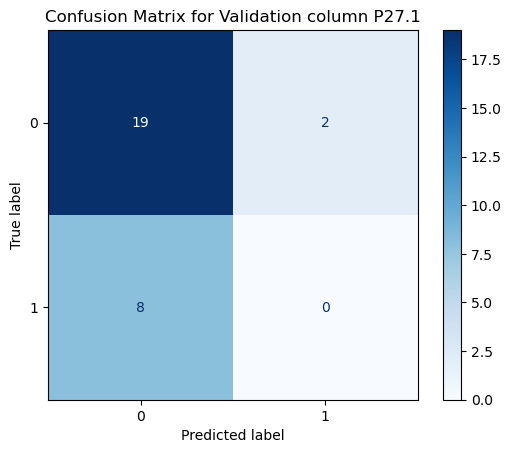

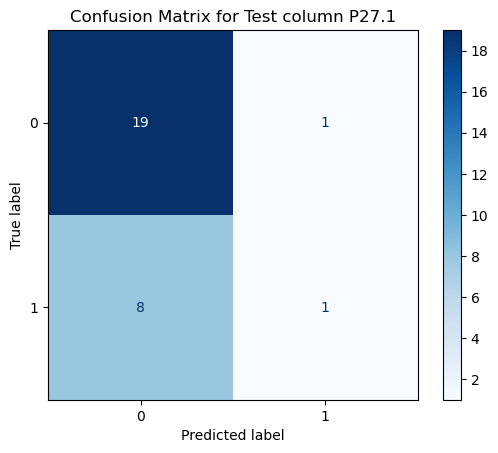

Fold 2/5
Shapes -> X_train: (84, 30), y_train: (84,), X_val: (29, 30), y_val: (29,), X_test: (29, 30), y_test: (29,)
Best Parameters: {'learning_rate': 0.01, 'max_depth': 4, 'n_estimators': 2000, 'subsample': 0.7}
Accuracy (Val): 0.66
Accuracy (Test): 0.72



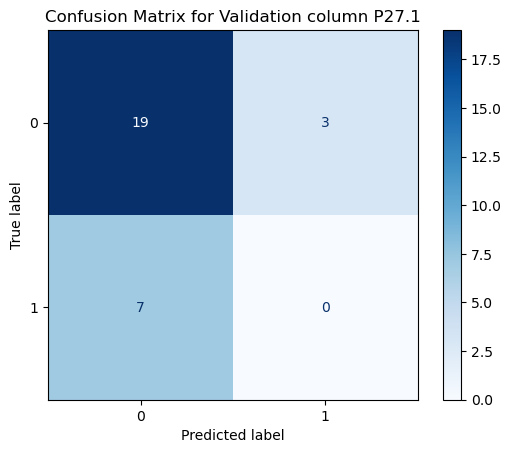

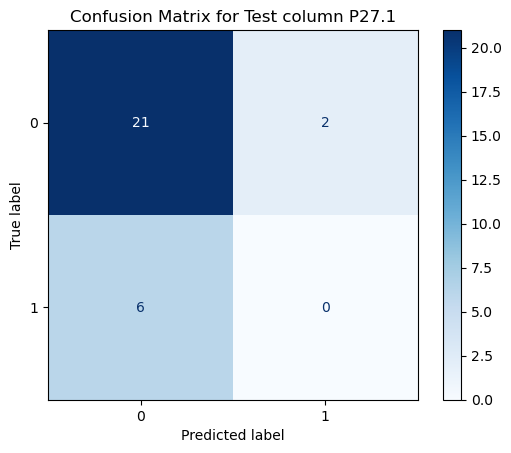

Fold 3/5
Shapes -> X_train: (85, 30), y_train: (85,), X_val: (29, 30), y_val: (29,), X_test: (28, 30), y_test: (28,)
Best Parameters: {'learning_rate': 0.01, 'max_depth': 5, 'n_estimators': 500, 'subsample': 0.8}
Accuracy (Val): 0.66
Accuracy (Test): 0.68



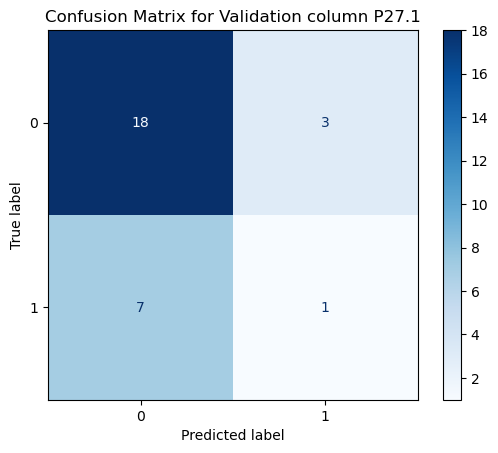

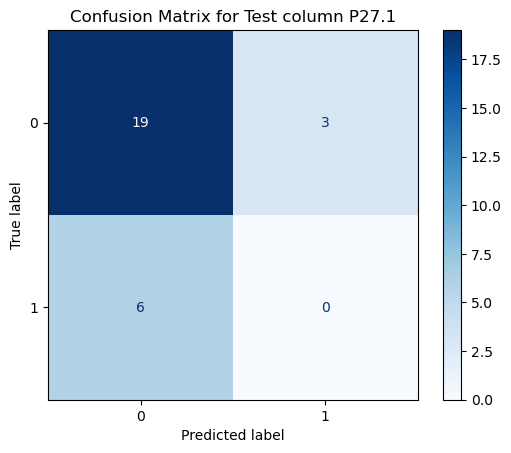

Fold 4/5
Shapes -> X_train: (85, 30), y_train: (85,), X_val: (29, 30), y_val: (29,), X_test: (28, 30), y_test: (28,)
Best Parameters: {'learning_rate': 0.01, 'max_depth': 3, 'n_estimators': 1000, 'subsample': 0.7}
Accuracy (Val): 0.72
Accuracy (Test): 0.61



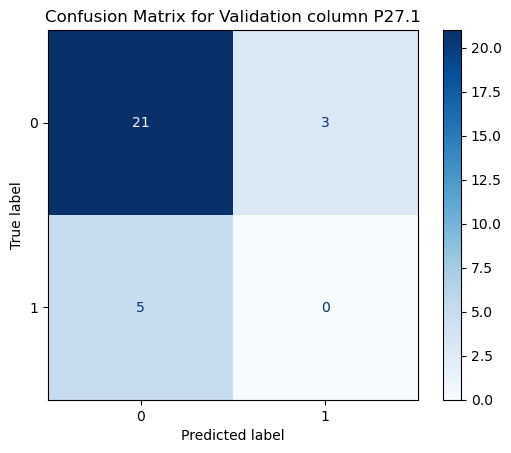

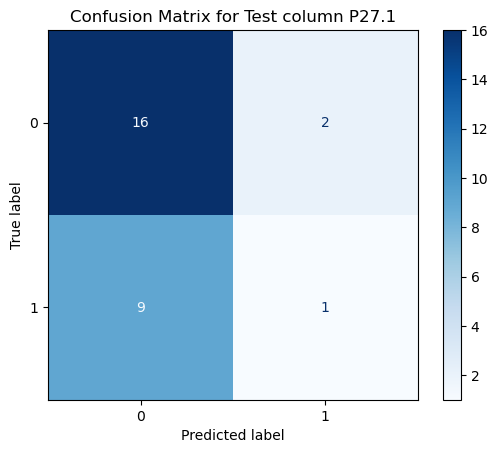

Fold 5/5
Shapes -> X_train: (85, 30), y_train: (85,), X_val: (29, 30), y_val: (29,), X_test: (28, 30), y_test: (28,)
Best Parameters: {'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 2000, 'subsample': 0.8}
Accuracy (Val): 0.62
Accuracy (Test): 0.82



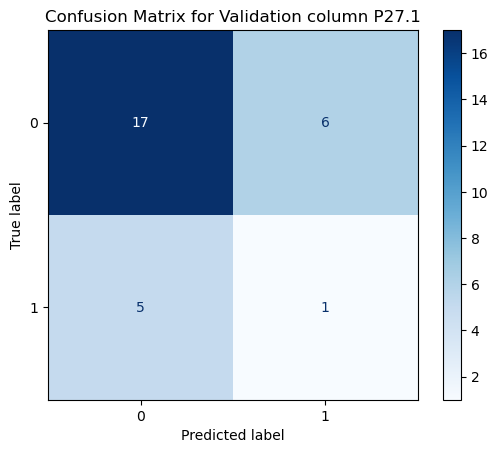

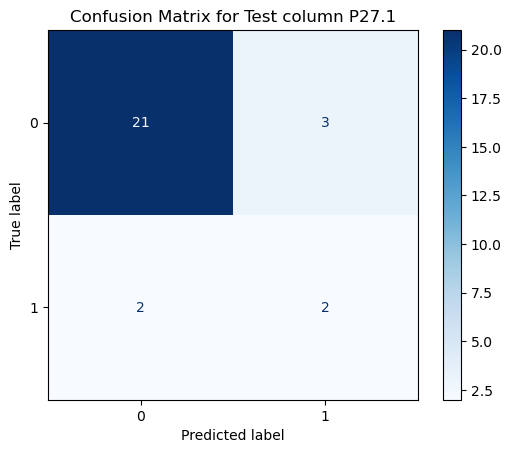

Trenowanie modelu dla kolumny H35.1 z 5-krotną walidacją krzyżową
Fold 1/5
Shapes -> X_train: (84, 30), y_train: (84,), X_val: (29, 30), y_val: (29,), X_test: (29, 30), y_test: (29,)


/home/michaltajak/anaconda3/envs/tensorplease/lib/python3.9/site-packages/sklearn/model_selection/_split.py:684: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(


Best Parameters: {'learning_rate': 0.01, 'max_depth': 3, 'n_estimators': 500, 'subsample': 0.7}
Accuracy (Val): 0.83
Accuracy (Test): 0.93



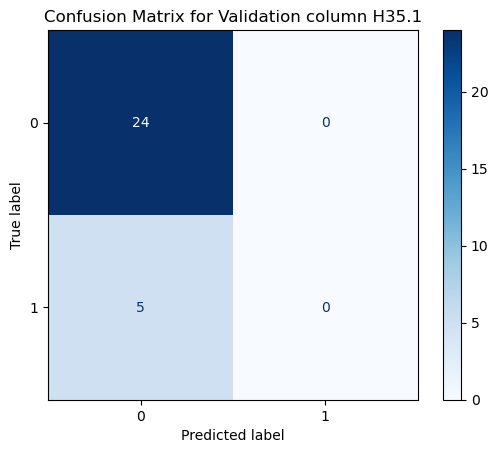

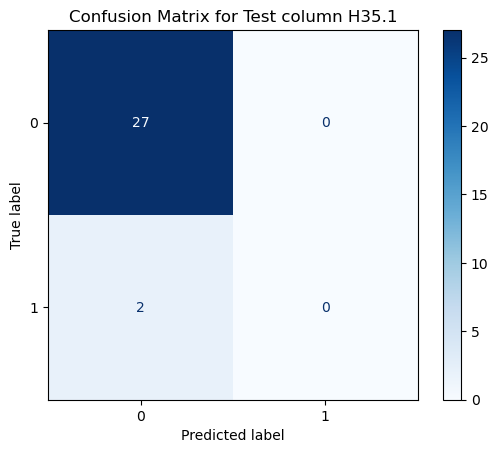

Fold 2/5
Shapes -> X_train: (84, 30), y_train: (84,), X_val: (29, 30), y_val: (29,), X_test: (29, 30), y_test: (29,)
Best Parameters: {'learning_rate': 0.01, 'max_depth': 3, 'n_estimators': 500, 'subsample': 0.7}
Accuracy (Val): 0.83
Accuracy (Test): 0.97



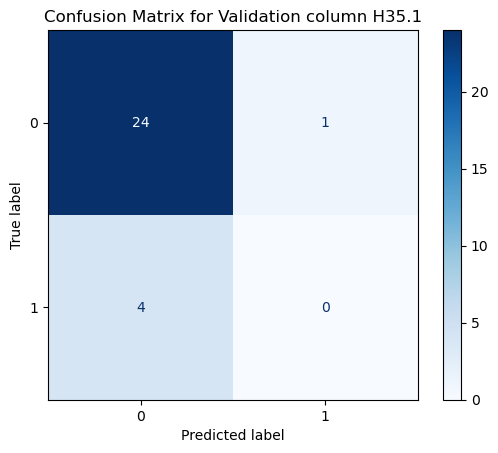

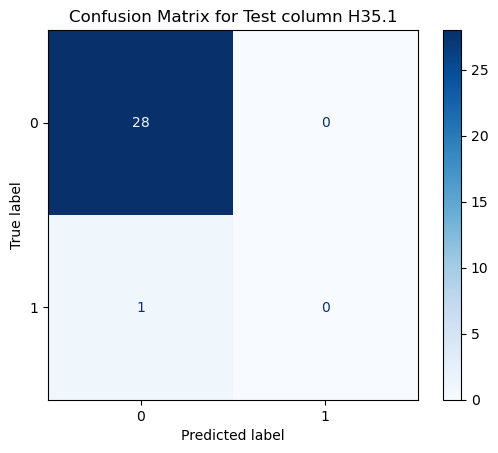

Fold 3/5
Shapes -> X_train: (85, 30), y_train: (85,), X_val: (29, 30), y_val: (29,), X_test: (28, 30), y_test: (28,)
Best Parameters: {'learning_rate': 0.01, 'max_depth': 4, 'n_estimators': 500, 'subsample': 0.7}
Accuracy (Val): 0.90
Accuracy (Test): 0.96



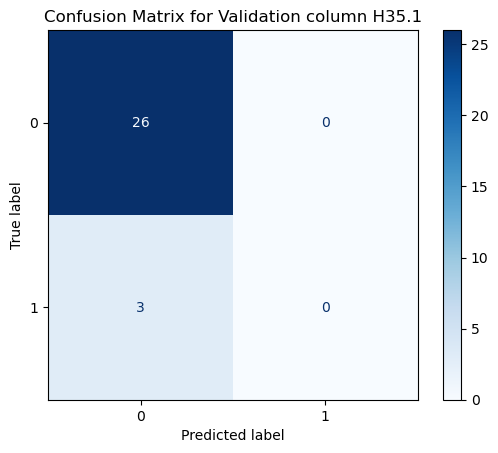

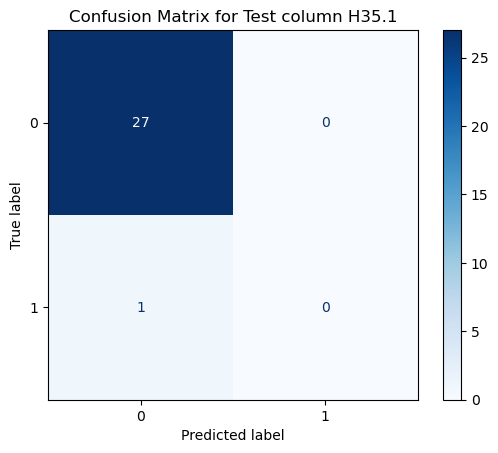

Fold 4/5
Shapes -> X_train: (85, 30), y_train: (85,), X_val: (29, 30), y_val: (29,), X_test: (28, 30), y_test: (28,)


/home/michaltajak/anaconda3/envs/tensorplease/lib/python3.9/site-packages/sklearn/model_selection/_split.py:684: UserWarning: The least populated class in y has only 3 members, which is less than n_splits=5.
  warnings.warn(


Best Parameters: {'learning_rate': 0.01, 'max_depth': 5, 'n_estimators': 500, 'subsample': 0.7}
Accuracy (Val): 0.90
Accuracy (Test): 0.82



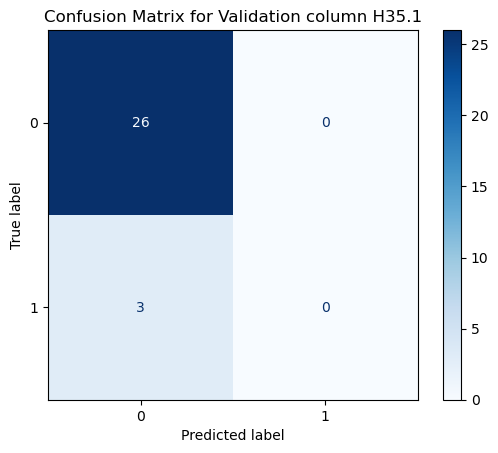

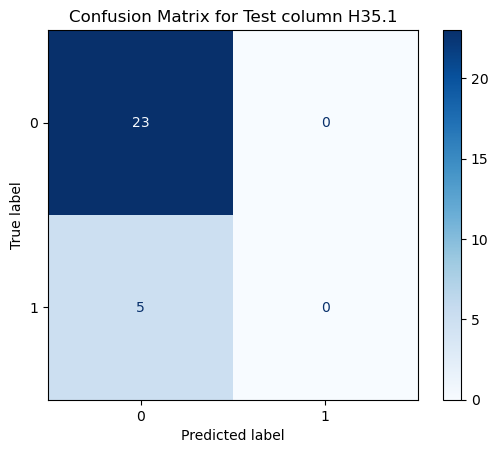

Fold 5/5
Shapes -> X_train: (85, 30), y_train: (85,), X_val: (29, 30), y_val: (29,), X_test: (28, 30), y_test: (28,)
Best Parameters: {'learning_rate': 0.01, 'max_depth': 3, 'n_estimators': 500, 'subsample': 0.7}
Accuracy (Val): 0.97
Accuracy (Test): 0.93



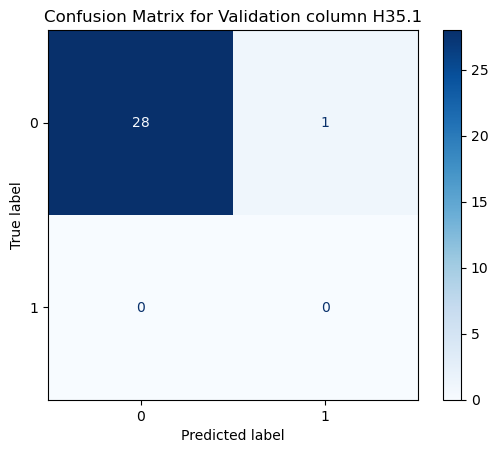

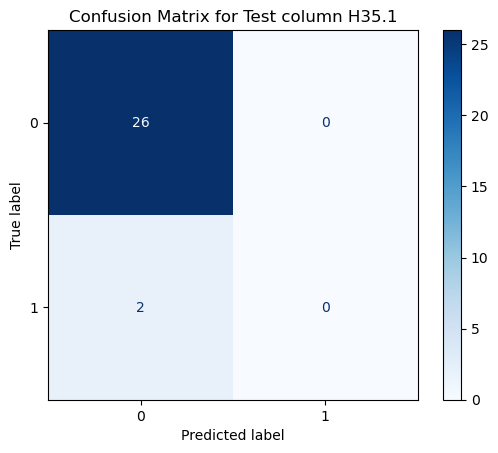

In [17]:
import pandas as pd
import numpy as np
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score, accuracy_score, confusion_matrix, f1_score, ConfusionMatrixDisplay
from sklearn.model_selection import train_test_split, GridSearchCV, KFold
from sklearn.preprocessing import MinMaxScaler
from sklearn.ensemble import GradientBoostingRegressor, GradientBoostingClassifier
import seaborn as sns
import matplotlib.pyplot as plt

# Define your regression and classification target columns
reg = ['HC - WYPI', 'HC (pc) -WYPI', 'HC (Z Score) -WYPI', 'dni  hospitalizacji']
cla = ['P27.1', 'H35.1']

# Hyperparameters grid
param_grid_reg = {
    'n_estimators': [1000, 2000, 4000],
    'learning_rate': [0.01, 0.05, 0.1],
    'max_depth': [3, 4, 5, 6],
    'subsample': [0.8, 0.9],
}

param_grid_cla = {
    'n_estimators': [500, 1000, 2000],
    'learning_rate': [0.01, 0.05, 0.1],
    'max_depth': [3, 4, 5],
    'subsample': [0.7, 0.8],
}

'''
def mean_absolute_percentage_error(y_true, y_pred):
    return np.mean(np.abs(y_true - y_pred) / y_true) * 100

# Funkcja oceny modelu regresji z użyciem MAE
def evaluate_regression_model(X_train, X_val, X_test, y_train, y_val, y_test, model, param_grid, y_col):
    # Przeprowadzamy GridSearchCV w celu znalezienia najlepszych parametrów
    grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=5, n_jobs=-1, verbose=0)
    grid_search.fit(X_train, y_train)
    
    # Używamy najlepszego modelu z GridSearchCV
    best_model = grid_search.best_estimator_
    
    # Ocena modelu na zbiorze treningowym
    y_train_pred = best_model.predict(X_train)
    mae_train = mean_absolute_error(y_train, y_train_pred)  # MAE dla treningu
    r2_train = r2_score(y_train, y_train_pred)

    y_val_pred = best_model.predict(X_val)
    mae_val = mean_absolute_error(y_val, y_val_pred)  # MAE dla walidacji
    mape_val = np.abs(mae_val / np.mean(y_val)) * 100
    r2_val = r2_score(y_val, y_val_pred)
    
    # Ocena modelu na zbiorze testowym
    y_test_pred = best_model.predict(X_test)
    mae_test = mean_absolute_error(y_test, y_test_pred)  # MAE dla testu
    mape_test = np.abs(mae_test / np.mean(y_test)) * 100
    r2_test = r2_score(y_test, y_test_pred)

    plt.figure(figsize=(12, 5))

    plt.subplot(1, 2, 1)
    sns.scatterplot(x=np.arange(len(y_val)), y=y_val, color='green', label='Actual')
    sns.scatterplot(x=np.arange(len(y_val)), y=y_val_pred, color='red', label='Predicted')
    plt.xlabel('Sample Index')
    plt.ylabel('Values')
    plt.title(f'Validation Set for {y_col}')
    plt.legend()
    plt.grid()

    plt.subplot(1, 2, 2)
    sns.scatterplot(x=np.arange(len(y_test)), y=y_test, color='green', label='Actual')
    sns.scatterplot(x=np.arange(len(y_test)), y=y_test_pred, color='blue', label='Predicted')
    plt.xlabel('Sample Index')
    plt.ylabel('Values')
    plt.title(f'Test Set for {y_col}')
    plt.legend()
    plt.grid()

    plt.tight_layout()
    plt.show()
    
    return grid_search.best_params_, mae_train, r2_train, mae_val, r2_val, mae_test, r2_test, mape_val, mape_test

# Cross-validation z 5-krotnym podziałem dla regresji
def cross_validate_regression(X, y, model, param_grid, cv=5):
    X = X.values  # Konwersja do tablicy NumPy
    kf = KFold(n_splits=cv, shuffle=True, random_state=43)
    
    scaler = MinMaxScaler()
    X_scaled = scaler.fit_transform(X)  # Skalowanie całego zbioru przed podziałem
    
    fold = 1
    for train_idx, test_idx in kf.split(X_scaled):
        print(f"Fold {fold}/{cv}")
        X_train, X_test = X_scaled[train_idx], X_scaled[test_idx]
        y_train, y_test = y.iloc[train_idx], y.iloc[test_idx]
        
        # Dalszy podział zbioru treningowego na train/val (60/20)
        X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.25, random_state=43)  # 25% z 60% na walidację
        
        best_params, mae_train, r2_train, mae_val, r2_val, mae_test, r2_test, mape_val, mape_test = evaluate_regression_model(
            X_train, X_val, X_test, y_train, y_val, y_test, model, param_grid, y.name)
        
        print(f"Best parameters: {best_params}")
        print(f"MAE (Val): {mae_val:.4f}, MAPE (Val): {mape_val:.2f}%")
        print(f"MAE (Test): {mae_test:.4f}, MAPE (Test): {mape_test:.2f}%\n")
        
        fold += 1
'''

def evaluate_classification_model(X_train, X_val, X_test, y_train, y_val, y_test, model, param_grid):
    # Perform GridSearchCV to find the best parameters
    grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=5, n_jobs=-1, verbose=0)
    grid_search.fit(X_train, y_train)
    
    # Use the best model from GridSearchCV
    best_model = grid_search.best_estimator_
    
    # Evaluate the model
    y_train_pred = best_model.predict(X_train)
    f1_train = f1_score(y_train, y_train_pred, average='weighted')  # F1 for training
    accuracy_train = accuracy_score(y_train, y_train_pred)
    
    y_val_pred = best_model.predict(X_val)
    f1_val = f1_score(y_val, y_val_pred, average='weighted')  # F1 for validation
    accuracy_val = accuracy_score(y_val, y_val_pred)
    
    y_test_pred = best_model.predict(X_test)
    f1_test = f1_score(y_test, y_test_pred, average='weighted')  # F1 for test
    accuracy_test = accuracy_score(y_test, y_test_pred)
    
    # Return the best model along with other evaluation metrics
    return best_model, grid_search.best_params_, f1_train, f1_val, f1_test, accuracy_train, accuracy_val, accuracy_test



# Cross-validation with 5 epochs (folds) for classification
def cross_validate_classification(X, y, model, param_grid, cv=5):
    X = X.values  # Convert to NumPy array
    kf = KFold(n_splits=cv, shuffle=True, random_state=43)
    
    scaler = MinMaxScaler()
    X_scaled = scaler.fit_transform(X)  # Scale the entire dataset before splitting
    
    fold = 1
    for train_idx, test_idx in kf.split(X_scaled):
        print(f"Fold {fold}/{cv}")
        X_train, X_test = X_scaled[train_idx], X_scaled[test_idx]
        y_train, y_test = y.iloc[train_idx], y.iloc[test_idx]
        
        # Further split the training data into train/val sets
        X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.25, random_state=43)
        
        # Check shapes to debug
        print(f"Shapes -> X_train: {X_train.shape}, y_train: {y_train.shape}, X_val: {X_val.shape}, y_val: {y_val.shape}, X_test: {X_test.shape}, y_test: {y_test.shape}")
        
        # Get the best model and metrics
        best_model, best_params, f1_train, f1_val, f1_test, accuracy_train, accuracy_val, accuracy_test = evaluate_classification_model(
            X_train, X_val, X_test, y_train, y_val, y_test, model, param_grid)
        
        print(f"Best Parameters: {best_params}")
        print(f"Accuracy (Val): {accuracy_val:.2f}")
        print(f"Accuracy (Test): {accuracy_test:.2f}\n")
        
        # Get predictions for validation and test sets
        y_val_pred = best_model.predict(X_val)
        y_test_pred = best_model.predict(X_test)
        
        # Calculate confusion matrix for validation and test sets
        cm_val = confusion_matrix(y_val, y_val_pred)
        cm_test = confusion_matrix(y_test, y_test_pred)
        
        disp_val = ConfusionMatrixDisplay(confusion_matrix=cm_val)
        disp_val.plot(cmap='Blues', values_format='d')
        plt.title(f'Confusion Matrix for Validation column {y_col}')
        plt.show()
            
        disp_test = ConfusionMatrixDisplay(confusion_matrix=cm_test)
        disp_test.plot(cmap='Blues', values_format='d')
        plt.title(f"Confusion Matrix for Test column {y_col}")
        plt.show()

        
        fold += 1

'''
# Loop through regression targets
for y_col in reg:
    print(f"Trenowanie modelu dla kolumny {y_col} z 5-krotną walidacją krzyżową")
    model = GradientBoostingRegressor(random_state=43)
    
'''
# Loop through classification targets using 5-fold cross-validation
for y_col in cla:
    print(f"Trenowanie modelu dla kolumny {y_col} z 5-krotną walidacją krzyżową")
    model =  GradientBoostingClassifier(random_state=43)
    cross_validate_classification(X, y[y_col], model, param_grid_cla, cv=5)


### GB kla

Trenowanie modelu dla kolumny P27.1 z 5-krotną walidacją krzyżową
Fold 1/5
Shapes -> X_train: (80, 30), y_train: (80,), X_val: (27, 30), y_val: (27,), X_test: (29, 30), y_test: (29,)
Best Parameters: {'learning_rate': 0.001, 'max_depth': 6, 'n_estimators': 10000, 'subsample': 0.8}
F1-score (Train): 1.00
F1-score (Val): 0.73
F1-score (Test): 0.64

f1: 0.20



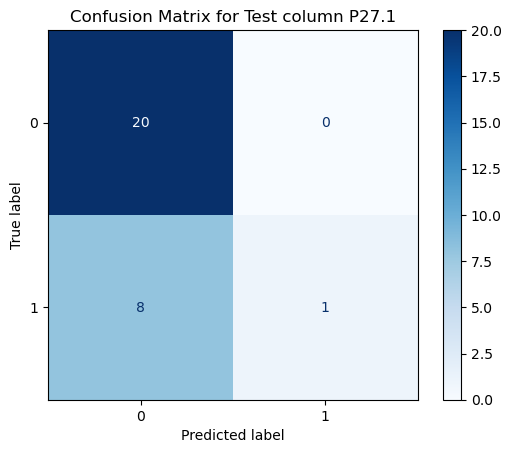

Fold 2/5
Shapes -> X_train: (80, 30), y_train: (80,), X_val: (27, 30), y_val: (27,), X_test: (29, 30), y_test: (29,)
Best Parameters: {'learning_rate': 0.001, 'max_depth': 5, 'n_estimators': 10000, 'subsample': 0.8}
F1-score (Train): 1.00
F1-score (Val): 0.66
F1-score (Test): 0.75

f1: 0.36



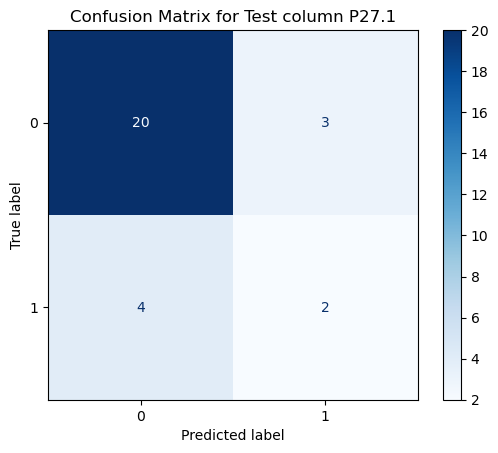

Fold 3/5
Shapes -> X_train: (81, 30), y_train: (81,), X_val: (27, 30), y_val: (27,), X_test: (28, 30), y_test: (28,)
Best Parameters: {'learning_rate': 0.01, 'max_depth': 5, 'n_estimators': 5000, 'subsample': 0.8}
F1-score (Train): 1.00
F1-score (Val): 0.64
F1-score (Test): 0.72

f1: 0.22



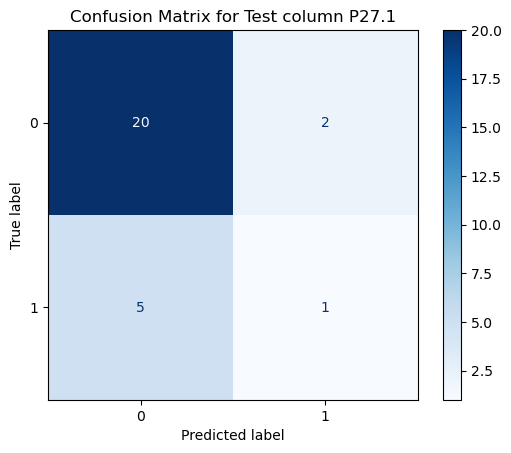

Fold 4/5
Shapes -> X_train: (81, 30), y_train: (81,), X_val: (27, 30), y_val: (27,), X_test: (28, 30), y_test: (28,)
Best Parameters: {'learning_rate': 0.001, 'max_depth': 5, 'n_estimators': 5000, 'subsample': 0.8}
F1-score (Train): 1.00
F1-score (Val): 0.63
F1-score (Test): 0.47

f1: nan



/tmp/ipykernel_54919/3540006774.py:117: RuntimeWarning: invalid value encountered in scalar divide
  f1 = 2 * (precision * recall) / (precision + recall)


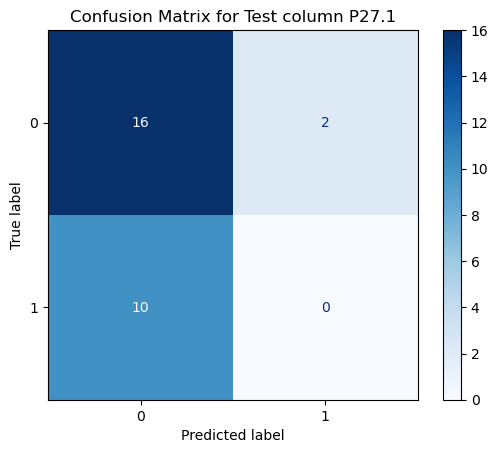

Fold 5/5
Shapes -> X_train: (81, 30), y_train: (81,), X_val: (27, 30), y_val: (27,), X_test: (28, 30), y_test: (28,)
Best Parameters: {'learning_rate': 0.01, 'max_depth': 6, 'n_estimators': 5000, 'subsample': 0.8}
F1-score (Train): 1.00
F1-score (Val): 0.68
F1-score (Test): 0.78

f1: 0.46



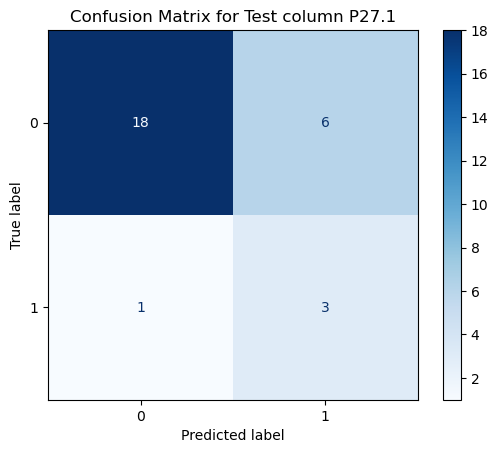

Trenowanie modelu dla kolumny H35.1 z 5-krotną walidacją krzyżową
Fold 1/5
Shapes -> X_train: (80, 30), y_train: (80,), X_val: (27, 30), y_val: (27,), X_test: (29, 30), y_test: (29,)
Best Parameters: {'learning_rate': 0.001, 'max_depth': 5, 'n_estimators': 5000, 'subsample': 0.8}
F1-score (Train): 1.00
F1-score (Val): 0.84
F1-score (Test): 0.90

f1: nan



/tmp/ipykernel_54919/3540006774.py:113: RuntimeWarning: invalid value encountered in scalar divide
  precision = TP / (TP + FP)


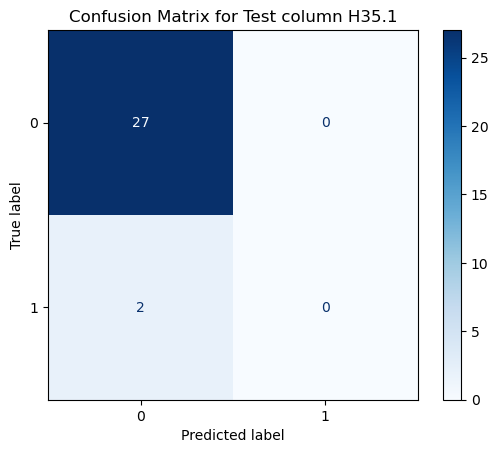

Fold 2/5
Shapes -> X_train: (80, 30), y_train: (80,), X_val: (27, 30), y_val: (27,), X_test: (29, 30), y_test: (29,)
Best Parameters: {'learning_rate': 0.001, 'max_depth': 5, 'n_estimators': 5000, 'subsample': 0.8}
F1-score (Train): 1.00
F1-score (Val): 0.89
F1-score (Test): 0.95

f1: nan



/tmp/ipykernel_54919/3540006774.py:113: RuntimeWarning: invalid value encountered in scalar divide
  precision = TP / (TP + FP)


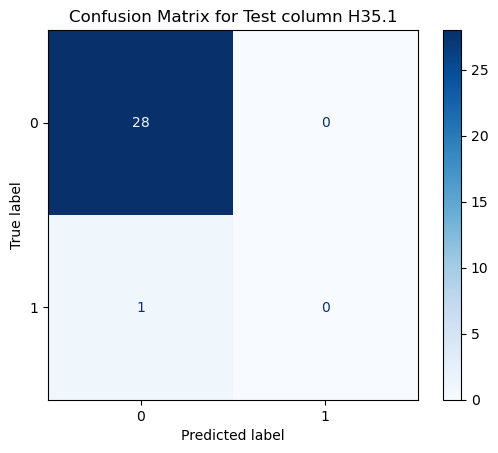

Fold 3/5
Shapes -> X_train: (81, 30), y_train: (81,), X_val: (27, 30), y_val: (27,), X_test: (28, 30), y_test: (28,)
Best Parameters: {'learning_rate': 0.01, 'max_depth': 6, 'n_estimators': 5000, 'subsample': 0.8}
F1-score (Train): 1.00
F1-score (Val): 0.87
F1-score (Test): 0.95

f1: nan



/tmp/ipykernel_54919/3540006774.py:113: RuntimeWarning: invalid value encountered in scalar divide
  precision = TP / (TP + FP)


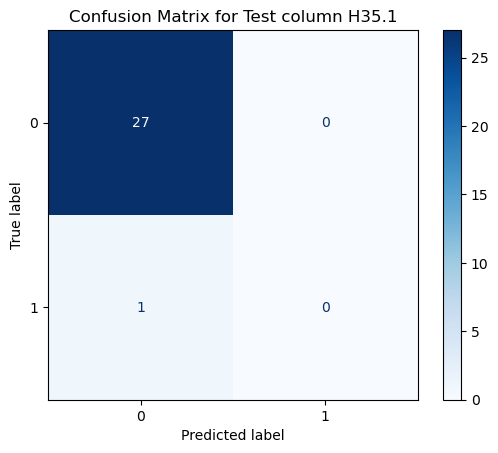

Fold 4/5
Shapes -> X_train: (81, 30), y_train: (81,), X_val: (27, 30), y_val: (27,), X_test: (28, 30), y_test: (28,)


/home/michaltajak/anaconda3/envs/tensorplease/lib/python3.9/site-packages/sklearn/model_selection/_split.py:684: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(


Best Parameters: {'learning_rate': 0.001, 'max_depth': 5, 'n_estimators': 5000, 'subsample': 0.8}
F1-score (Train): 1.00
F1-score (Val): 0.83
F1-score (Test): 0.68

f1: nan



/tmp/ipykernel_54919/3540006774.py:117: RuntimeWarning: invalid value encountered in scalar divide
  f1 = 2 * (precision * recall) / (precision + recall)


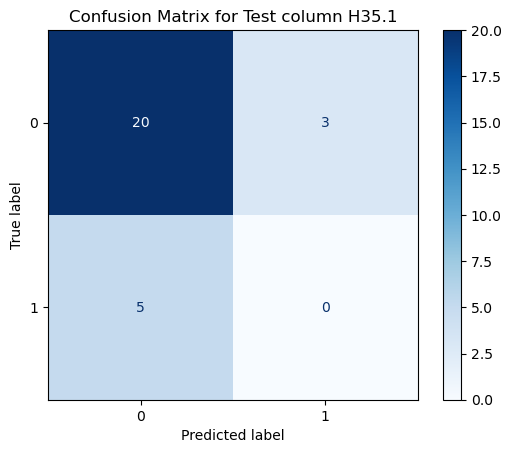

Fold 5/5
Shapes -> X_train: (81, 30), y_train: (81,), X_val: (27, 30), y_val: (27,), X_test: (28, 30), y_test: (28,)
Best Parameters: {'learning_rate': 0.001, 'max_depth': 5, 'n_estimators': 5000, 'subsample': 0.9}
F1-score (Train): 1.00
F1-score (Val): 0.96
F1-score (Test): 0.86

f1: nan



/tmp/ipykernel_54919/3540006774.py:117: RuntimeWarning: invalid value encountered in scalar divide
  f1 = 2 * (precision * recall) / (precision + recall)


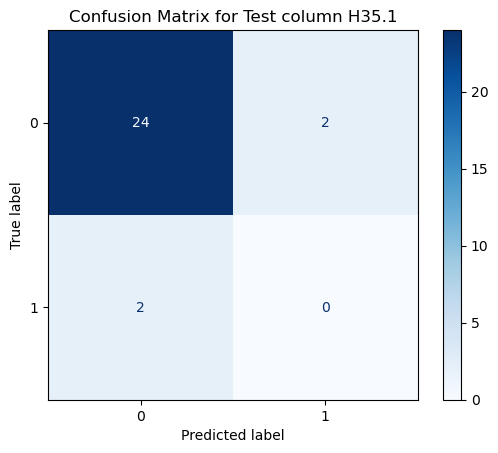

In [26]:
import pandas as pd
import numpy as np
from sklearn.model_selection import GridSearchCV, train_test_split, KFold
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import f1_score, confusion_matrix, ConfusionMatrixDisplay
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.ensemble import IsolationForest
from sklearn.svm import OneClassSVM
import matplotlib.pyplot as plt

# Define your regression and classification target columns
reg = ['HC - WYPI', 'HC (pc) -WYPI', 'HC (Z Score) -WYPI', 'dni  hospitalizacji']
cla = ['P27.1', 'H35.1']

# Hyperparameters grid for GradientBoosting Classifier
param_grid_cla = {
    'n_estimators': [5000, 10000],
    'learning_rate': [0.001, 0.01],
    'max_depth': [5, 6],
    'subsample': [0.8, 0.9, 1.0],
}

# Function for anomaly detection
def detect_anomalies(X, method='isolation_forest'):
    """
    Function to detect anomalies using either Isolation Forest or One-Class SVM.
    
    Parameters:
    X: The feature matrix
    method: The anomaly detection method to use ('isolation_forest' or 'one_class_svm')
    
    Returns:
    anomalies: Indices of detected anomalies
    """
    if method == 'isolation_forest':
        model = IsolationForest(contamination=0.05, random_state=43)  # 5% contamination rate
    elif method == 'one_class_svm':
        model = OneClassSVM(nu=0.05, kernel='rbf', gamma='auto')  # 5% contamination rate
        
    model.fit(X)
    predictions = model.predict(X)
    
    # -1 means anomaly, 1 means normal
    anomalies = np.where(predictions == -1)[0]
    
    return anomalies

# Evaluation function for classification model
def evaluate_classification_model(X_train, X_val, X_test, y_train, y_val, y_test, model, param_grid):
    # Perform GridSearchCV to find the best parameters with F1-score as the scoring metric
    grid_search = GridSearchCV(estimator=model, param_grid=param_grid, scoring='f1_weighted', cv=5, n_jobs=-1, verbose=0)
    grid_search.fit(X_train, y_train)
    
    # Use the best model from GridSearchCV
    best_model = grid_search.best_estimator_
    
    # Evaluate the model
    y_train_pred = best_model.predict(X_train)
    f1_train = f1_score(y_train, y_train_pred, average='weighted')  # F1 for training
    
    y_val_pred = best_model.predict(X_val)
    f1_val = f1_score(y_val, y_val_pred, average='weighted')  # F1 for validation
    
    y_test_pred = best_model.predict(X_test)
    f1_test = f1_score(y_test, y_test_pred, average='weighted')  # F1 for test
    
    # Return the best model along with other evaluation metrics
    return best_model, grid_search.best_params_, f1_train, f1_val, f1_test

# Cross-validation with 5 epochs (folds) for classification
def cross_validate_classification(X, y, model, param_grid, cv=5, anomaly_method='isolation_forest'):
    X = X.values  # Convert to NumPy array
    kf = KFold(n_splits=cv, shuffle=True, random_state=43)
    
    scaler = MinMaxScaler()
    X_scaled = scaler.fit_transform(X)  # Scale the entire dataset before splitting
    
    fold = 1
    for train_idx, test_idx in kf.split(X_scaled):
        print(f"Fold {fold}/{cv}")
        X_train, X_test = X_scaled[train_idx], X_scaled[test_idx]
        y_train, y_test = y.iloc[train_idx], y.iloc[test_idx]
        
        # Anomaly detection on the training set
        anomalies_train = detect_anomalies(X_train, method=anomaly_method)
        X_train_cleaned = np.delete(X_train, anomalies_train, axis=0)
        y_train_cleaned = np.delete(y_train.values, anomalies_train, axis=0)
        
        # Further split the training data into train/val sets
        X_train, X_val, y_train, y_val = train_test_split(X_train_cleaned, y_train_cleaned, test_size=0.25, random_state=43)
        
        # Check shapes to debug
        print(f"Shapes -> X_train: {X_train.shape}, y_train: {y_train.shape}, X_val: {X_val.shape}, y_val: {y_val.shape}, X_test: {X_test.shape}, y_test: {y_test.shape}")
        
        # Get the best model and metrics
        best_model, best_params, f1_train, f1_val, f1_test = evaluate_classification_model(
            X_train, X_val, X_test, y_train, y_val, y_test, model, param_grid)
        
        print(f"Best Parameters: {best_params}")
        print(f"F1-score (Train): {f1_train:.2f}")
        print(f"F1-score (Val): {f1_val:.2f}")
        print(f"F1-score (Test): {f1_test:.2f}\n")
        
        # Get predictions for validation and test sets
        y_val_pred = best_model.predict(X_val)
        y_test_pred = best_model.predict(X_test)
        
        # Calculate confusion matrix for validation and test sets
        cm_val = confusion_matrix(y_val, y_val_pred)
        cm_test = confusion_matrix(y_test, y_test_pred)
        
        TN, FP, FN, TP = cm_test.ravel()
        precision = TP / (TP + FP)
        recall = TP / (TP + FN)
        
        # Obliczanie F1 score
        f1 = 2 * (precision * recall) / (precision + recall)
        print(f"f1: {f1:.2f}\n")
            
        disp_test = ConfusionMatrixDisplay(confusion_matrix=cm_test)
        disp_test.plot(cmap='Blues', values_format='d')
        plt.title(f"Confusion Matrix for Test column {y_col}")
        plt.show()

        fold += 1

# Loop through classification targets using 5-fold cross-validation
for y_col in cla:
    print(f"Trenowanie modelu dla kolumny {y_col} z 5-krotną walidacją krzyżową")
    model = GradientBoostingClassifier(random_state=43)
    cross_validate_classification(X, y[y_col], model, param_grid_cla, cv=5, anomaly_method='isolation_forest')


### MAE bez wykresow

Trenowanie modelu dla kolumny HC - WYPI z 5-krotną walidacją krzyżową
Fold 1/5
Najlepsze Parametry: {'learning_rate': 0.002, 'max_depth': 3, 'min_samples_leaf': 1, 'min_samples_split': 3, 'n_estimators': 1500}
MAE (Train): 0.6362, R2 (Train): 0.8737
MAE (Val): 2.5203, R2 (Val): -0.4349
MAE (Test): 1.8989, R2 (Test): -0.5525

Fold 2/5
Najlepsze Parametry: {'learning_rate': 0.002, 'max_depth': 7, 'min_samples_leaf': 3, 'min_samples_split': 3, 'n_estimators': 1500}
MAE (Train): 0.2951, R2 (Train): 0.9522
MAE (Val): 2.0676, R2 (Val): 0.0233
MAE (Test): 1.4278, R2 (Test): -0.4683

Fold 3/5
Najlepsze Parametry: {'learning_rate': 0.1, 'max_depth': 4, 'min_samples_leaf': 2, 'min_samples_split': 5, 'n_estimators': 1500}
MAE (Train): 0.0000, R2 (Train): 1.0000
MAE (Val): 1.6976, R2 (Val): -0.0336
MAE (Test): 1.9428, R2 (Test): -0.1154

Fold 4/5
Najlepsze Parametry: {'learning_rate': 0.1, 'max_depth': 3, 'min_samples_leaf': 2, 'min_samples_split': 3, 'n_estimators': 1500}
MAE (Train): 0.0000, R2 

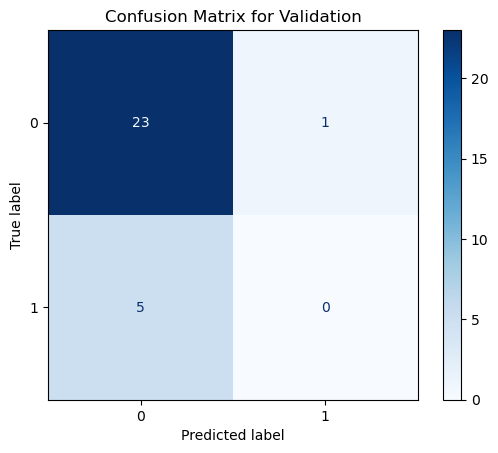

Confusion Matrix for Test:


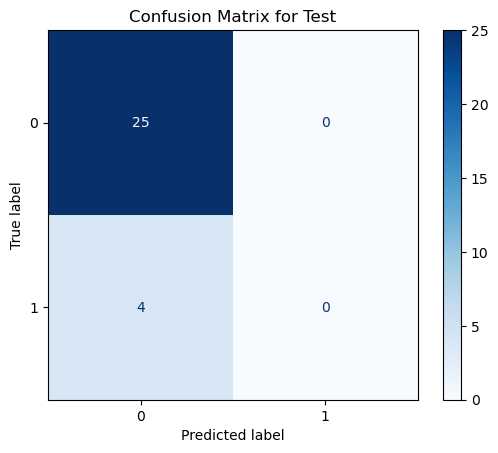

Fold 2/5
Shapes -> X_train: (84, 30), y_train: (84,), X_val: (29, 30), y_val: (29,), X_test: (29, 30), y_test: (29,)
Best Parameters: {'max_depth': 2, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 1200}
F1-score (Train): 0.6792, F1-score (Val): 0.7016, F1-score (Test): 0.6545
Accuracy (Train): 0.7619, Accuracy (Val): 0.7931, Accuracy (Test): 0.7586

Confusion Matrix for Validation:


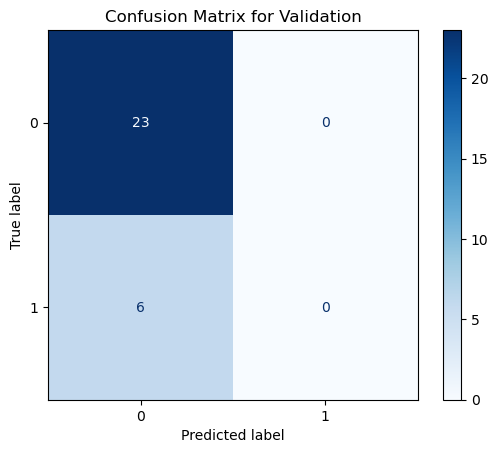

Confusion Matrix for Test:


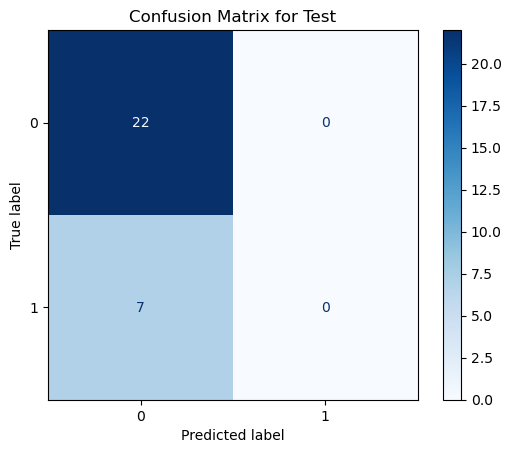

Fold 3/5
Shapes -> X_train: (85, 30), y_train: (85,), X_val: (29, 30), y_val: (29,), X_test: (28, 30), y_test: (28,)
Best Parameters: {'max_depth': 4, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 1200}
F1-score (Train): 0.9760, F1-score (Val): 0.6662, F1-score (Test): 0.5311
Accuracy (Train): 0.9765, Accuracy (Val): 0.7241, Accuracy (Test): 0.6429

Confusion Matrix for Validation:


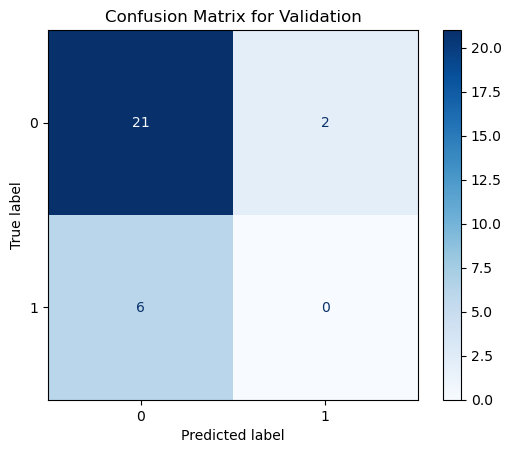

Confusion Matrix for Test:


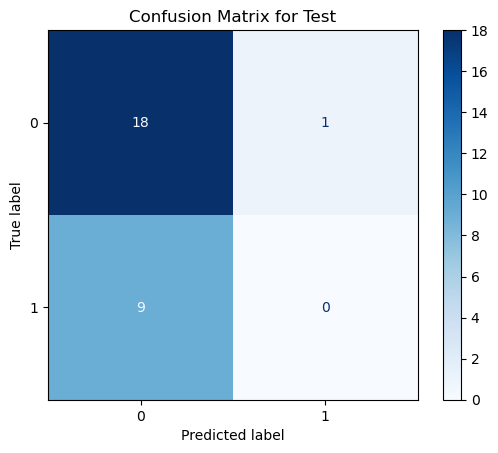

Fold 4/5
Shapes -> X_train: (85, 30), y_train: (85,), X_val: (29, 30), y_val: (29,), X_test: (28, 30), y_test: (28,)
Best Parameters: {'max_depth': 2, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 1200}
F1-score (Train): 0.6949, F1-score (Val): 0.6083, F1-score (Test): 0.5486
Accuracy (Train): 0.7882, Accuracy (Val): 0.7241, Accuracy (Test): 0.6786

Confusion Matrix for Validation:


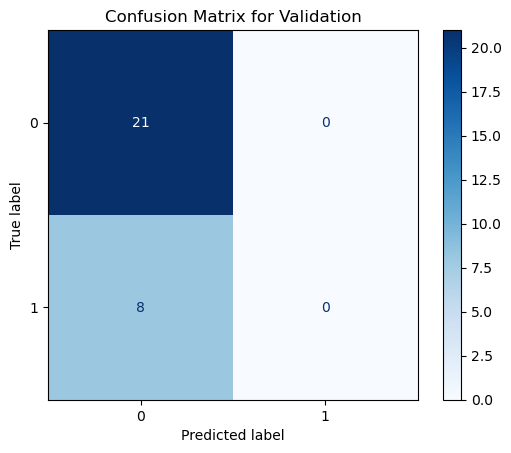

Confusion Matrix for Test:


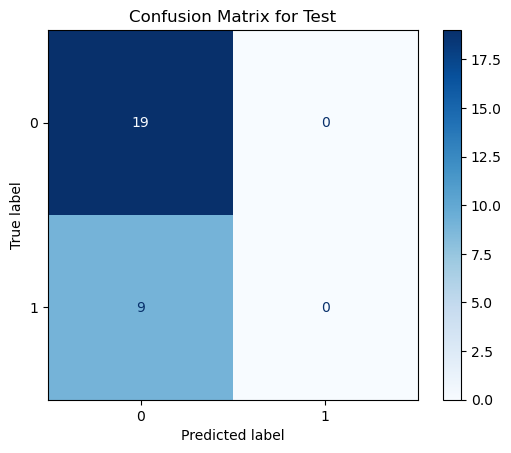

Fold 5/5
Shapes -> X_train: (85, 30), y_train: (85,), X_val: (29, 30), y_val: (29,), X_test: (28, 30), y_test: (28,)
Best Parameters: {'max_depth': 6, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 1200}
F1-score (Train): 1.0000, F1-score (Val): 0.5630, F1-score (Test): 0.7163
Accuracy (Train): 1.0000, Accuracy (Val): 0.6897, Accuracy (Test): 0.7500

Confusion Matrix for Validation:


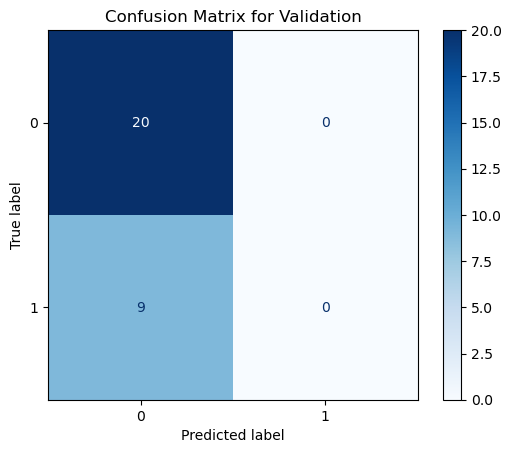

Confusion Matrix for Test:


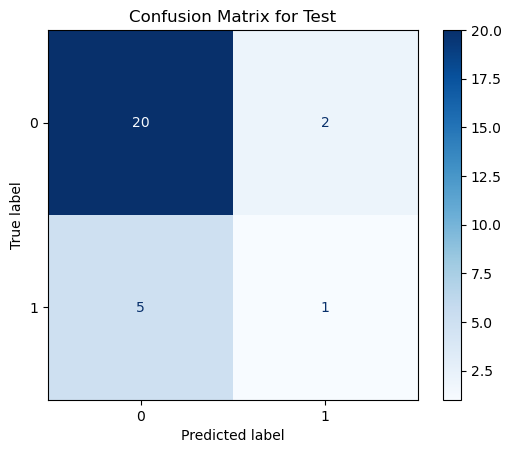

Trenowanie modelu dla kolumny H35.1 z 5-krotną walidacją krzyżową
Fold 1/5
Shapes -> X_train: (84, 30), y_train: (84,), X_val: (29, 30), y_val: (29,), X_test: (29, 30), y_test: (29,)
Best Parameters: {'max_depth': 2, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 1200}
F1-score (Train): 0.8595, F1-score (Val): 0.8978, F1-score (Test): 0.9486
Accuracy (Train): 0.9048, Accuracy (Val): 0.9310, Accuracy (Test): 0.9655

Confusion Matrix for Validation:


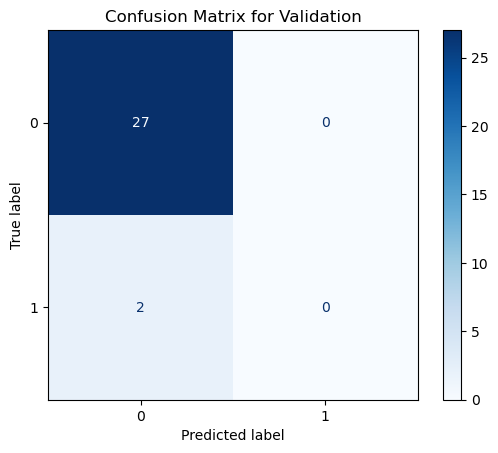

Confusion Matrix for Test:


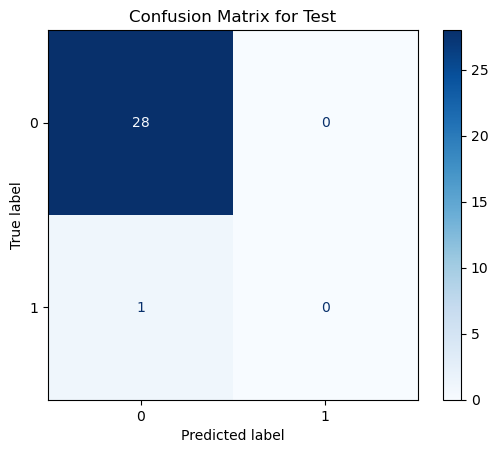

Fold 2/5
Shapes -> X_train: (84, 30), y_train: (84,), X_val: (29, 30), y_val: (29,), X_test: (29, 30), y_test: (29,)
Best Parameters: {'max_depth': 2, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 1200}
F1-score (Train): 0.8768, F1-score (Val): 0.8978, F1-score (Test): 0.8978
Accuracy (Train): 0.9167, Accuracy (Val): 0.9310, Accuracy (Test): 0.9310

Confusion Matrix for Validation:


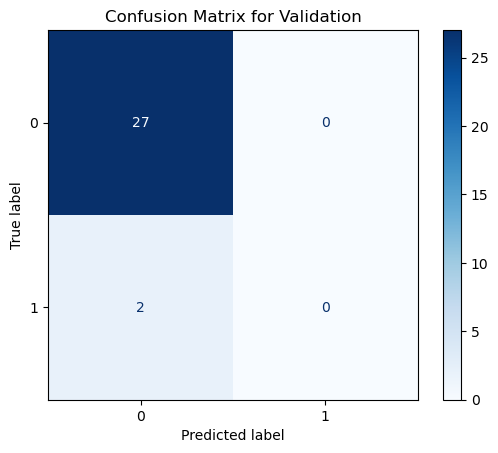

Confusion Matrix for Test:


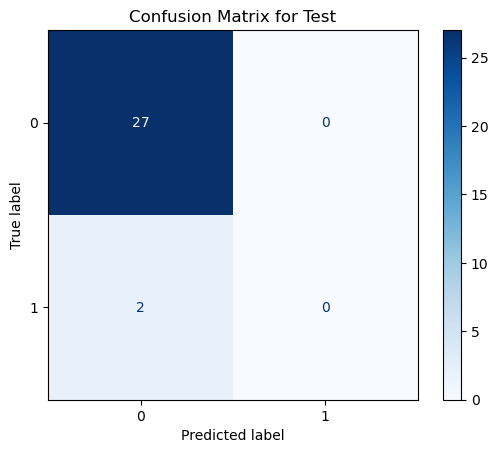

Fold 3/5
Shapes -> X_train: (85, 30), y_train: (85,), X_val: (29, 30), y_val: (29,), X_test: (28, 30), y_test: (28,)
Best Parameters: {'max_depth': 2, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 1200}
F1-score (Train): 0.8954, F1-score (Val): 0.8978, F1-score (Test): 0.8423
Accuracy (Train): 0.9294, Accuracy (Val): 0.9310, Accuracy (Test): 0.8929

Confusion Matrix for Validation:


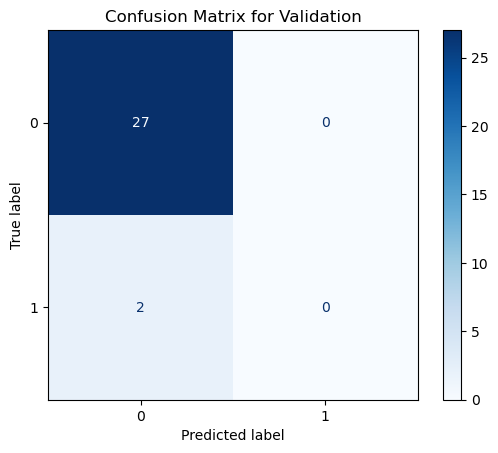

Confusion Matrix for Test:


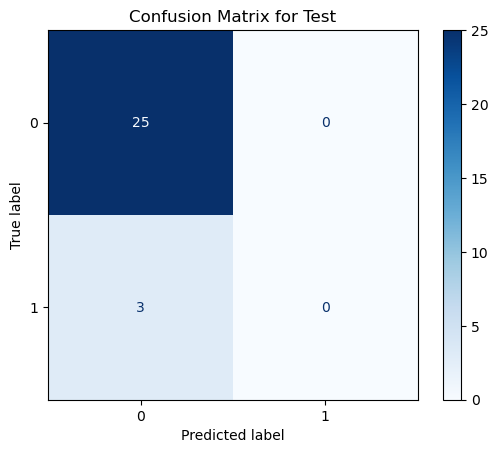

Fold 4/5
Shapes -> X_train: (85, 30), y_train: (85,), X_val: (29, 30), y_val: (29,), X_test: (28, 30), y_test: (28,)


In [ ]:
import pandas as pd
import numpy as np
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score, accuracy_score, confusion_matrix, f1_score, ConfusionMatrixDisplay
from sklearn.model_selection import train_test_split, GridSearchCV, KFold
from sklearn.preprocessing import MinMaxScaler
from sklearn.ensemble import GradientBoostingRegressor, RandomForestClassifier
import seaborn as sns
import matplotlib.pyplot as plt

# Define your regression and classification target columns
reg = ['HC - WYPI', 'HC (pc) -WYPI', 'HC (Z Score) -WYPI', 'dni  hospitalizacji']
cla = ['P27.1', 'H35.1']

# Hyperparameters grid
param_grid_reg = {
    'n_estimators': [1500],
    'learning_rate': [0.002, 0.005, 0.01, 0.02, 0.1],
    'min_samples_split': [3, 4, 5],
    'min_samples_leaf': [1, 2, 3],
    'max_depth': [3, 4, 5, 7],
}

param_grid_cla = {
    'n_estimators': [1200, 1500],
    'max_depth': [2, 4, 6, 7],
    'min_samples_split': [2, 3, 4, 5],
    'min_samples_leaf': [1, 2, 3]
}

# Funkcja oceny modelu regresji z użyciem MAE
def evaluate_regression_model(X_train, X_val, X_test, y_train, y_val, y_test, model, param_grid, y_col):
    # Przeprowadzamy GridSearchCV w celu znalezienia najlepszych parametrów
    grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=5, n_jobs=-1, verbose=0)
    grid_search.fit(X_train, y_train)
    
    # Używamy najlepszego modelu z GridSearchCV
    best_model = grid_search.best_estimator_
    
    # Ocena modelu na zbiorze treningowym
    y_train_pred = best_model.predict(X_train)
    mae_train = mean_absolute_error(y_train, y_train_pred)  # MAE dla treningu
    r2_train = r2_score(y_train, y_train_pred)

    # Ocena modelu na zbiorze walidacyjnym
    y_val_pred = best_model.predict(X_val)
    mae_val = mean_absolute_error(y_val, y_val_pred)  # MAE dla walidacji
    r2_val = r2_score(y_val, y_val_pred)

    # Ocena modelu na zbiorze testowym
    y_test_pred = best_model.predict(X_test)
    mae_test = mean_absolute_error(y_test, y_test_pred)  # MAE dla testu
    r2_test = r2_score(y_test, y_test_pred)
    
    return grid_search.best_params_, mae_train, r2_train, mae_val, r2_val, mae_test, r2_test

def evaluate_classification_model(X_train, X_val, X_test, y_train, y_val, y_test, model, param_grid):
    # Perform GridSearchCV to find the best parameters
    grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=5, n_jobs=-1, verbose=0)
    grid_search.fit(X_train, y_train)
    
    # Use the best model from GridSearchCV
    best_model = grid_search.best_estimator_
    
    # Evaluate the model
    y_train_pred = best_model.predict(X_train)
    f1_train = f1_score(y_train, y_train_pred, average='weighted')  # F1 for training
    accuracy_train = accuracy_score(y_train, y_train_pred)
    
    y_val_pred = best_model.predict(X_val)
    f1_val = f1_score(y_val, y_val_pred, average='weighted')  # F1 for validation
    accuracy_val = accuracy_score(y_val, y_val_pred)
    
    y_test_pred = best_model.predict(X_test)
    f1_test = f1_score(y_test, y_test_pred, average='weighted')  # F1 for test
    accuracy_test = accuracy_score(y_test, y_test_pred)
    
    # Return the best model along with other evaluation metrics
    return best_model, grid_search.best_params_, f1_train, f1_val, f1_test, accuracy_train, accuracy_val, accuracy_test



# Cross-validation z 5-krotnym podziałem dla regresji
def cross_validate_regression(X, y, model, param_grid, cv=5):
    X = X.values  # Konwersja do tablicy NumPy
    kf = KFold(n_splits=cv, shuffle=True, random_state=43)
    
    scaler = MinMaxScaler()
    X_scaled = scaler.fit_transform(X)  # Skalowanie całego zbioru przed podziałem
    
    fold = 1
    for train_idx, test_idx in kf.split(X_scaled):
        print(f"Fold {fold}/{cv}")
        X_train, X_test = X_scaled[train_idx], X_scaled[test_idx]
        y_train, y_test = y.iloc[train_idx], y.iloc[test_idx]
        
        # Dalszy podział zbioru treningowego na train/val (60/20)
        X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.25, random_state=43)  # 25% z 60% na walidację
        
        best_params, mae_train, r2_train, mae_val, r2_val, mae_test, r2_test = evaluate_regression_model(
            X_train, X_val, X_test, y_train, y_val, y_test, model, param_grid, y.name)
        
        print(f"Najlepsze Parametry: {best_params}")
        print(f"MAE (Train): {mae_train:.4f}, R2 (Train): {r2_train:.4f}")
        print(f"MAE (Val): {mae_val:.4f}, R2 (Val): {r2_val:.4f}")
        print(f"MAE (Test): {mae_test:.4f}, R2 (Test): {r2_test:.4f}\n")
        
        fold += 1

# Cross-validation with 5 epochs (folds) for classification
def cross_validate_classification(X, y, model, param_grid, cv=5):
    X = X.values  # Convert to NumPy array
    kf = KFold(n_splits=cv, shuffle=True, random_state=43)
    
    scaler = MinMaxScaler()
    X_scaled = scaler.fit_transform(X)  # Scale the entire dataset before splitting
    
    fold = 1
    for train_idx, test_idx in kf.split(X_scaled):
        print(f"Fold {fold}/{cv}")
        X_train, X_test = X_scaled[train_idx], X_scaled[test_idx]
        y_train, y_test = y.iloc[train_idx], y.iloc[test_idx]
        
        # Further split the training data into train/val sets
        X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.25, random_state=43)
        
        # Check shapes to debug
        print(f"Shapes -> X_train: {X_train.shape}, y_train: {y_train.shape}, X_val: {X_val.shape}, y_val: {y_val.shape}, X_test: {X_test.shape}, y_test: {y_test.shape}")
        
        # Get the best model and metrics
        best_model, best_params, f1_train, f1_val, f1_test, accuracy_train, accuracy_val, accuracy_test = evaluate_classification_model(
            X_train, X_val, X_test, y_train, y_val, y_test, model, param_grid)
        
        print(f"Best Parameters: {best_params}")
        print(f"F1-score (Train): {f1_train:.4f}, F1-score (Val): {f1_val:.4f}, F1-score (Test): {f1_test:.4f}")
        print(f"Accuracy (Train): {accuracy_train:.4f}, Accuracy (Val): {accuracy_val:.4f}, Accuracy (Test): {accuracy_test:.4f}\n")
        
        # Get predictions for validation and test sets
        y_val_pred = best_model.predict(X_val)
        y_test_pred = best_model.predict(X_test)
        
        # Calculate confusion matrix for validation and test sets
        cm_val = confusion_matrix(y_val, y_val_pred)
        cm_test = confusion_matrix(y_test, y_test_pred)
        
        # Display confusion matrix for validation
        print("Confusion Matrix for Validation:")
        disp_val = ConfusionMatrixDisplay(confusion_matrix=cm_val)
        disp_val.plot(cmap='Blues', values_format='d')
        plt.title(f'Confusion Matrix for Validation')
        plt.show()
        
        # Display confusion matrix for test
        print("Confusion Matrix for Test:")
        disp_test = ConfusionMatrixDisplay(confusion_matrix=cm_test)
        disp_test.plot(cmap='Blues', values_format='d')
        plt.title(f'Confusion Matrix for Test')
        plt.show()
        
        fold += 1


# Loop through regression targets
for y_col in reg:
    print(f"Trenowanie modelu dla kolumny {y_col} z 5-krotną walidacją krzyżową")
    model = GradientBoostingRegressor(random_state=43)
    cross_validate_regression(X, y[y_col], model, param_grid_reg, cv=5)

# Loop through classification targets using 5-fold cross-validation
for y_col in cla:
    print(f"Trenowanie modelu dla kolumny {y_col} z 5-krotną walidacją krzyżową")
    model = RandomForestClassifier(random_state=43)
    cross_validate_classification(X, y[y_col], model, param_grid_cla, cv=5)


### RandomForest

Training model for column HC - WYPI with 5-fold cross-validation
Fold 1/5


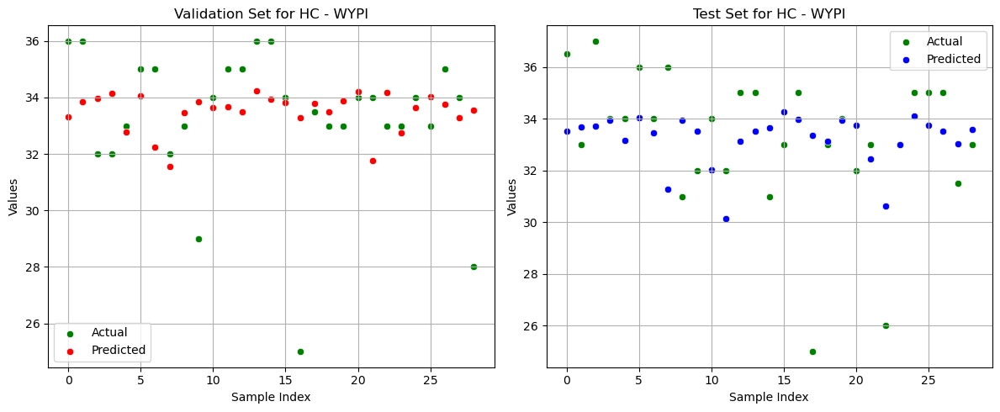

Best parameters: {'max_depth': 5, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 1000}
MAE (Val): 1.6755, MAPE (Val): 5.03%
MAE (Test): 1.8216, MAPE (Test): 5.48%

Fold 2/5


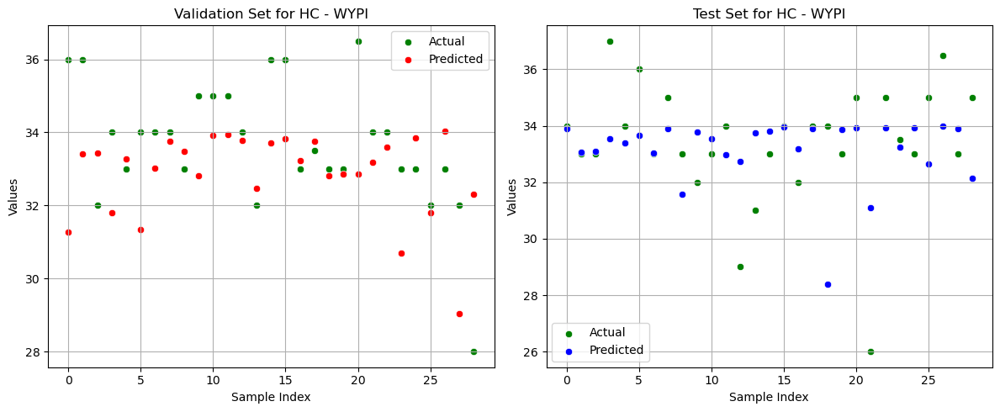

Best parameters: {'max_depth': 3, 'min_samples_leaf': 1, 'min_samples_split': 4, 'n_estimators': 500}
MAE (Val): 1.4614, MAPE (Val): 4.34%
MAE (Test): 1.5448, MAPE (Test): 4.62%

Fold 3/5


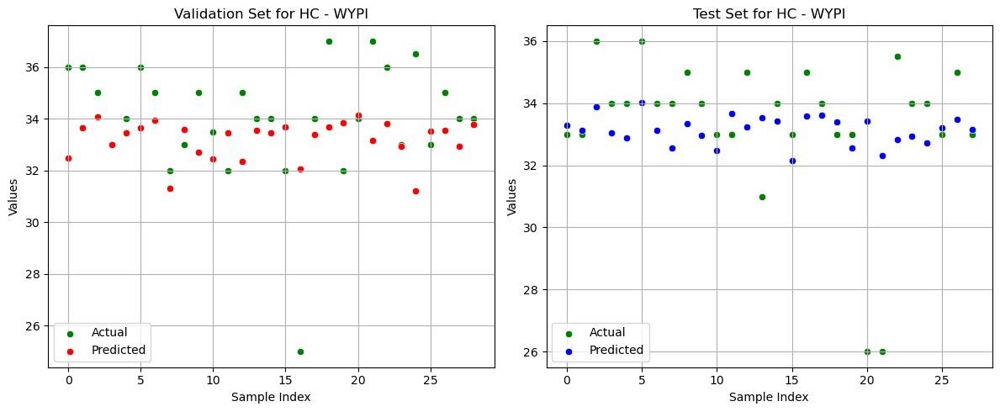

Best parameters: {'max_depth': 3, 'min_samples_leaf': 2, 'min_samples_split': 2, 'n_estimators': 500}
MAE (Val): 1.7189, MAPE (Val): 5.06%
MAE (Test): 1.4925, MAPE (Test): 4.48%

Fold 4/5


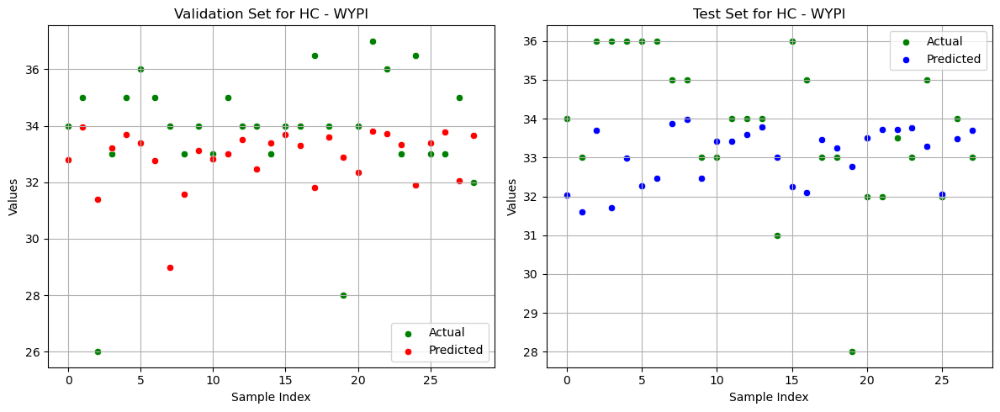

Best parameters: {'max_depth': 3, 'min_samples_leaf': 2, 'min_samples_split': 2, 'n_estimators': 500}
MAE (Val): 1.8868, MAPE (Val): 5.58%
MAE (Test): 1.6397, MAPE (Test): 4.86%

Fold 5/5


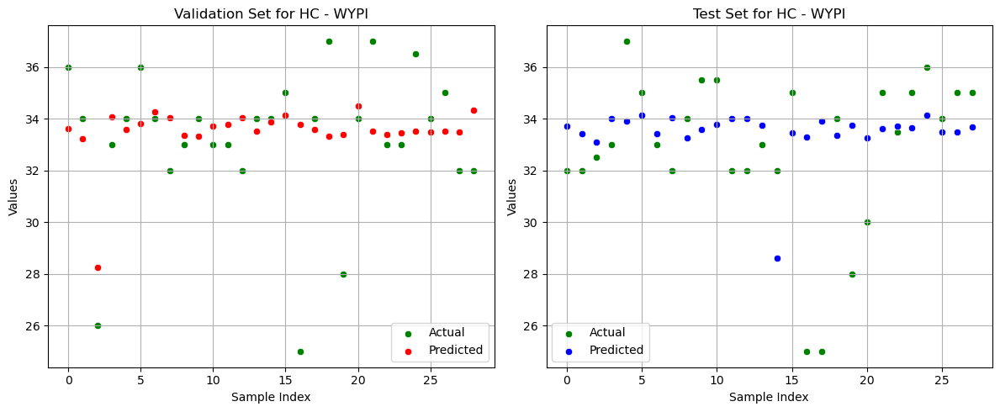

Best parameters: {'max_depth': 5, 'min_samples_leaf': 1, 'min_samples_split': 3, 'n_estimators': 500}
MAE (Val): 1.7003, MAPE (Val): 5.12%
MAE (Test): 2.1517, MAPE (Test): 6.54%

Training model for column HC (pc) -WYPI with 5-fold cross-validation
Fold 1/5


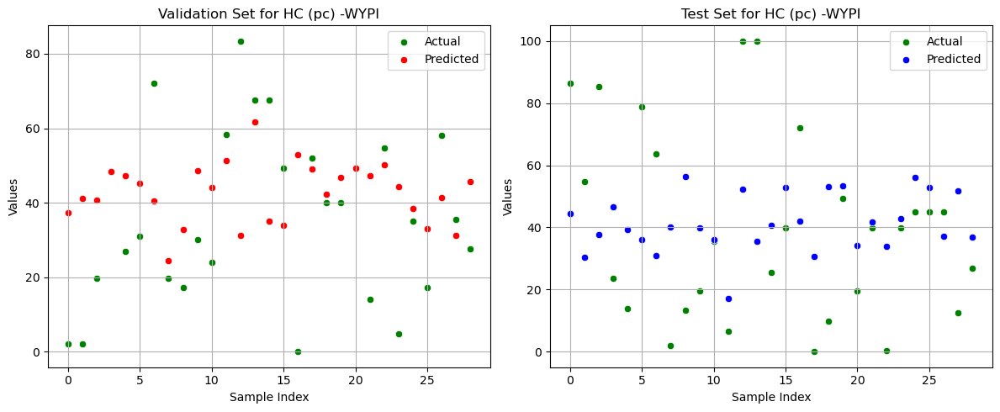

Best parameters: {'max_depth': 4, 'min_samples_leaf': 2, 'min_samples_split': 2, 'n_estimators': 1000}
MAE (Val): 18.4172, MAPE (Val): 51.03%
MAE (Test): 25.0876, MAPE (Test): 63.01%

Fold 2/5


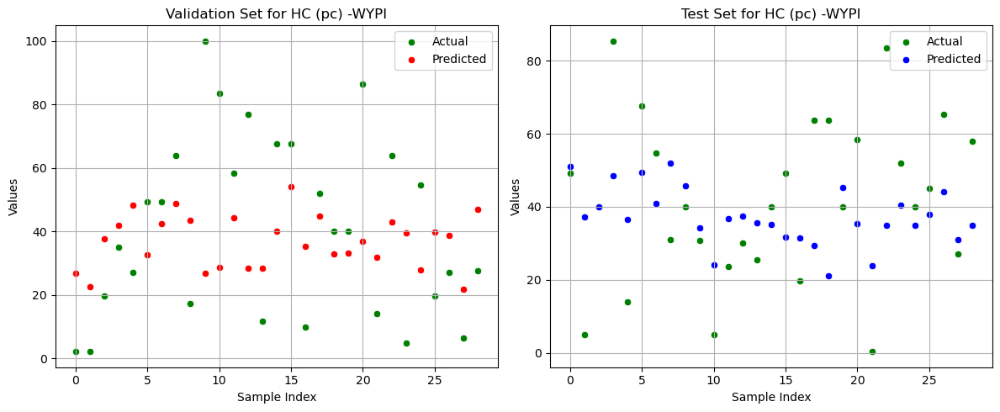

Best parameters: {'max_depth': 4, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 500}
MAE (Val): 23.0330, MAPE (Val): 56.76%
MAE (Test): 16.8663, MAPE (Test): 40.53%

Fold 3/5


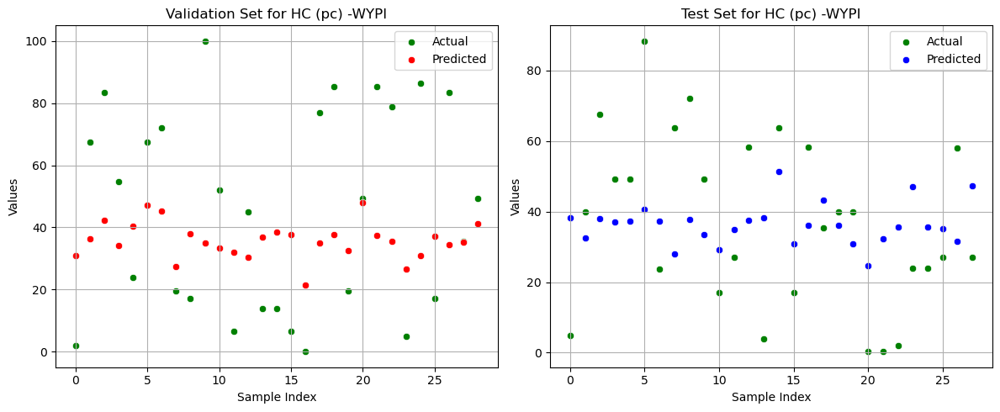

Best parameters: {'max_depth': 3, 'min_samples_leaf': 2, 'min_samples_split': 2, 'n_estimators': 500}
MAE (Val): 27.1616, MAPE (Val): 59.77%
MAE (Test): 20.1911, MAPE (Test): 54.81%

Fold 4/5


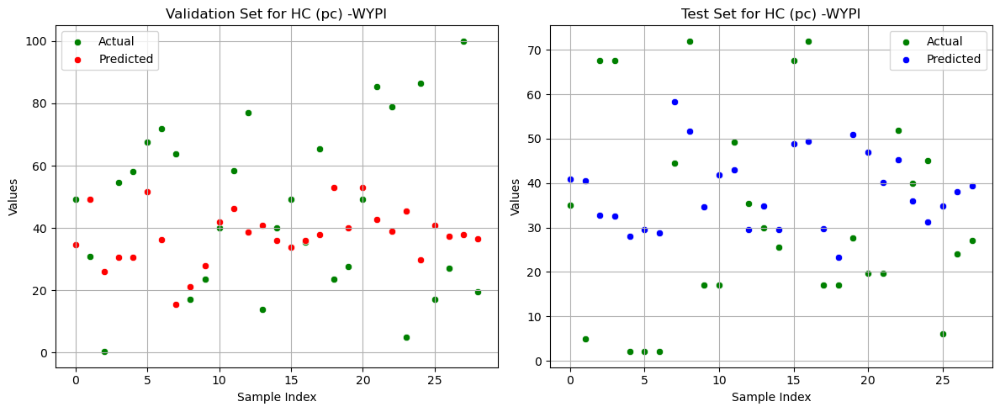

Best parameters: {'max_depth': 4, 'min_samples_leaf': 1, 'min_samples_split': 4, 'n_estimators': 500}
MAE (Val): 23.5808, MAPE (Val): 51.17%
MAE (Test): 17.8654, MAPE (Test): 55.17%

Fold 5/5


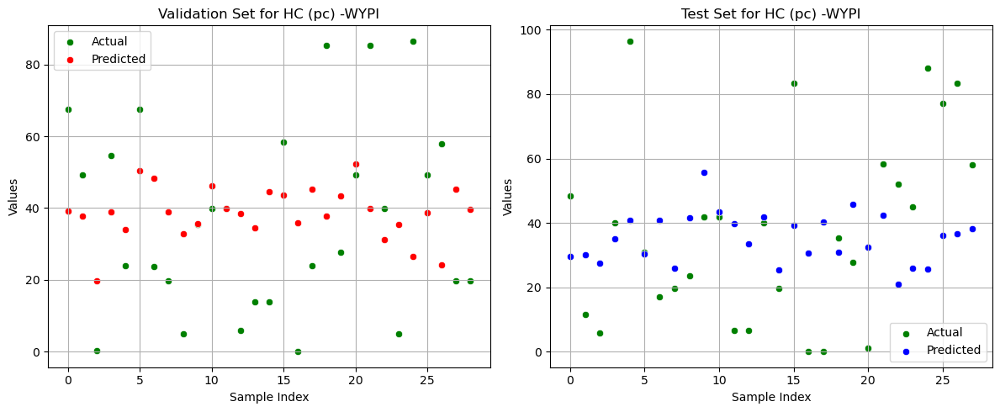

Best parameters: {'max_depth': 4, 'min_samples_leaf': 1, 'min_samples_split': 3, 'n_estimators': 500}
MAE (Val): 21.9724, MAPE (Val): 59.64%
MAE (Test): 23.4522, MAPE (Test): 62.00%

Training model for column HC (Z Score) -WYPI with 5-fold cross-validation
Fold 1/5


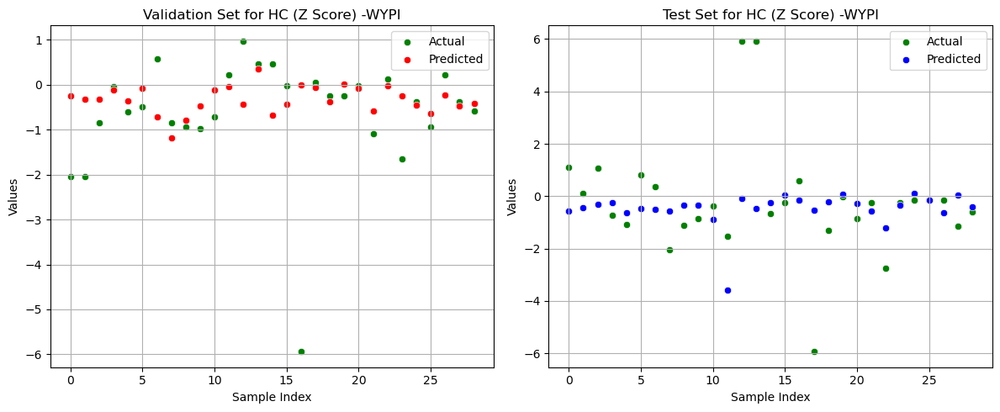

Best parameters: {'max_depth': 5, 'min_samples_leaf': 1, 'min_samples_split': 4, 'n_estimators': 1000}
MAE (Val): 0.7109, MAPE (Val): 114.20%
MAE (Test): 1.2809, MAPE (Test): 589.68%

Fold 2/5


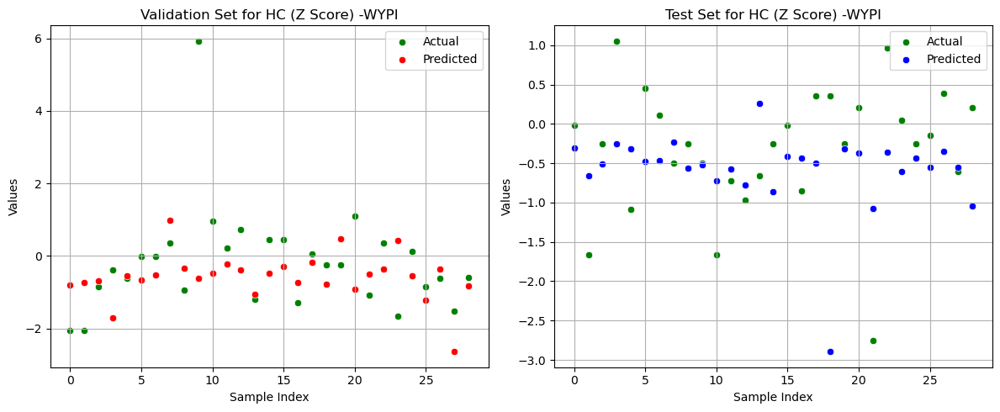

Best parameters: {'max_depth': 3, 'min_samples_leaf': 2, 'min_samples_split': 2, 'n_estimators': 500}
MAE (Val): 0.9630, MAPE (Val): 508.79%
MAE (Test): 0.7031, MAPE (Test): 220.33%

Fold 3/5


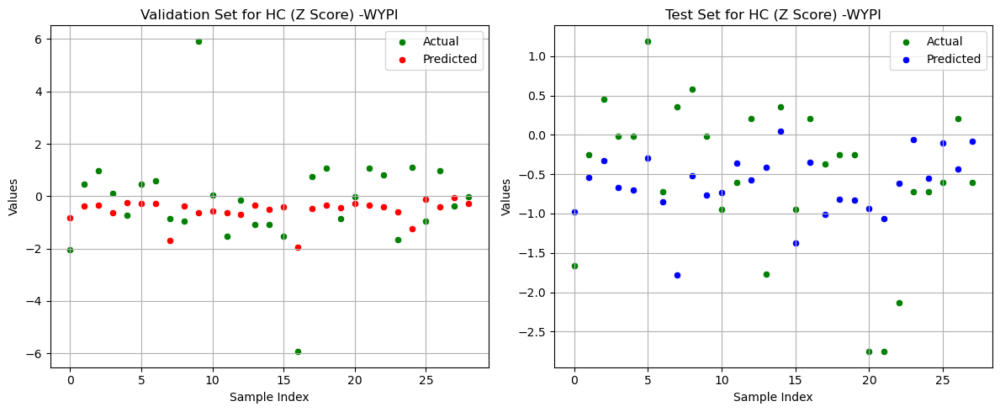

Best parameters: {'max_depth': 3, 'min_samples_leaf': 2, 'min_samples_split': 2, 'n_estimators': 1000}
MAE (Val): 1.1953, MAPE (Val): 637.48%
MAE (Test): 0.7813, MAPE (Test): 150.05%

Fold 4/5


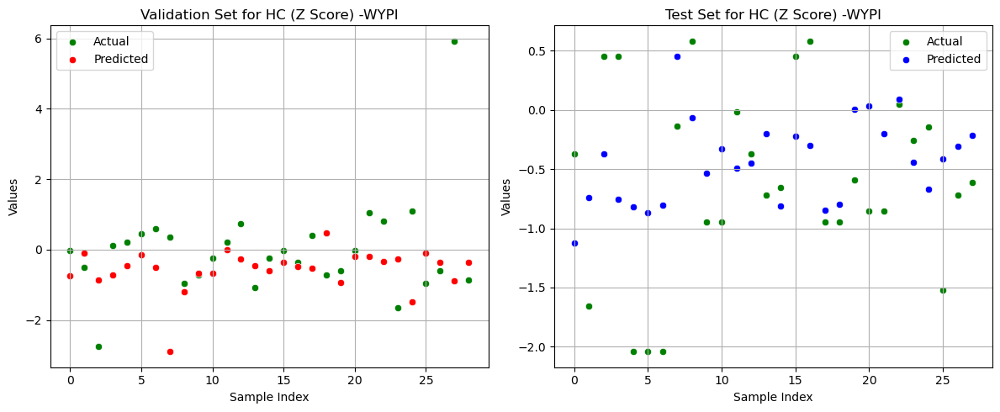

Best parameters: {'max_depth': 4, 'min_samples_leaf': 2, 'min_samples_split': 2, 'n_estimators': 1000}
MAE (Val): 1.0417, MAPE (Val): 7975.97%
MAE (Test): 0.6237, MAPE (Test): 103.77%

Fold 5/5


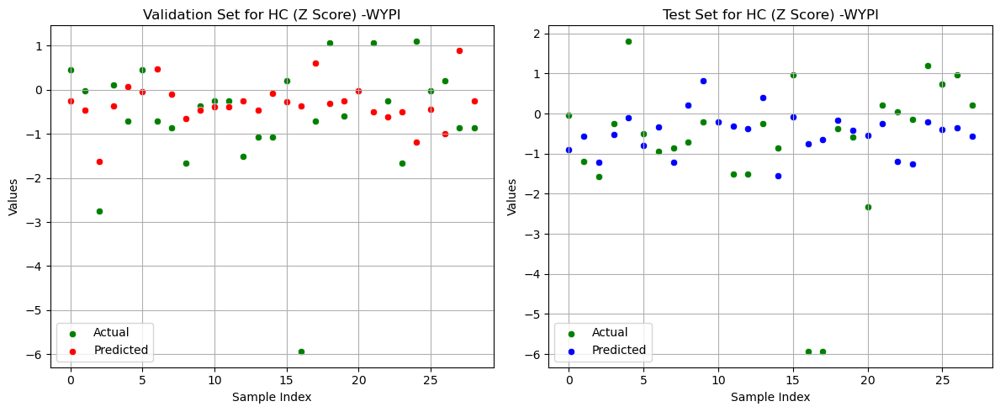

Best parameters: {'max_depth': 5, 'min_samples_leaf': 2, 'min_samples_split': 2, 'n_estimators': 1000}
MAE (Val): 0.9885, MAPE (Val): 163.35%
MAE (Test): 1.1473, MAPE (Test): 162.19%

Training model for column dni  hospitalizacji with 5-fold cross-validation
Fold 1/5


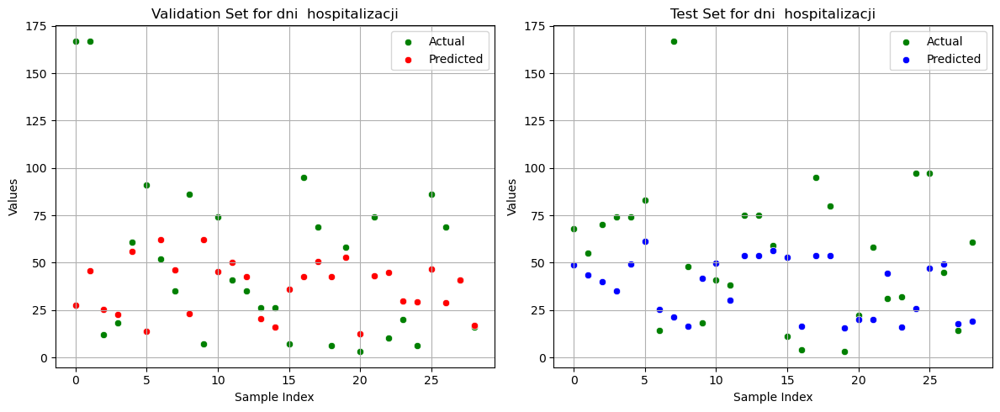

Best parameters: {'max_depth': 4, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 500}
MAE (Val): 30.7005, MAPE (Val): 61.06%
MAE (Test): 27.4077, MAPE (Test): 49.40%

Fold 2/5


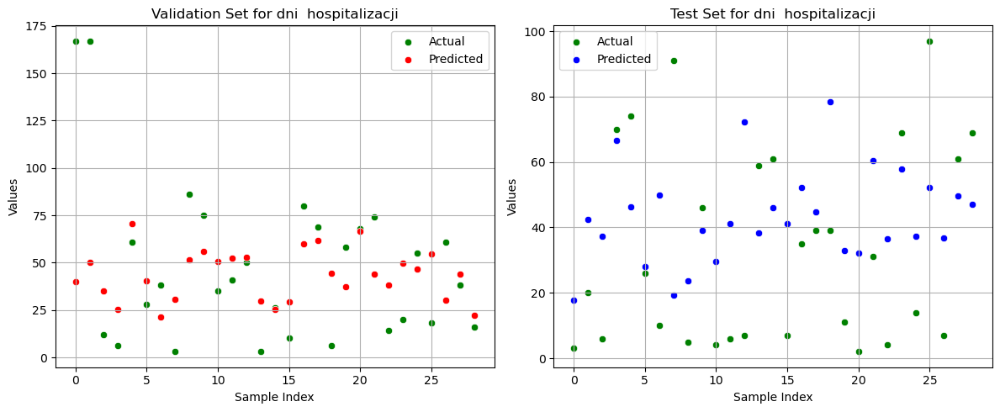

Best parameters: {'max_depth': 3, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 500}
MAE (Val): 25.6242, MAPE (Val): 53.65%
MAE (Test): 25.9714, MAPE (Test): 77.41%

Fold 3/5


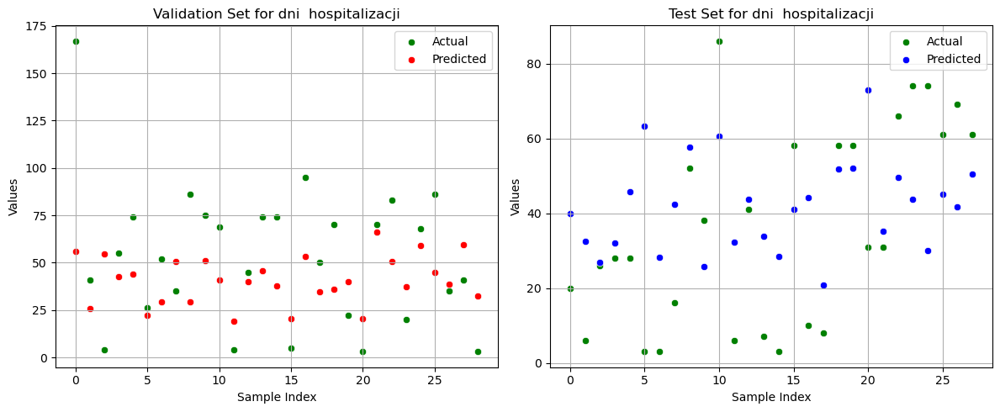

Best parameters: {'max_depth': 3, 'min_samples_leaf': 2, 'min_samples_split': 2, 'n_estimators': 500}
MAE (Val): 25.9136, MAPE (Val): 49.05%
MAE (Test): 20.4373, MAPE (Test): 55.99%

Fold 4/5


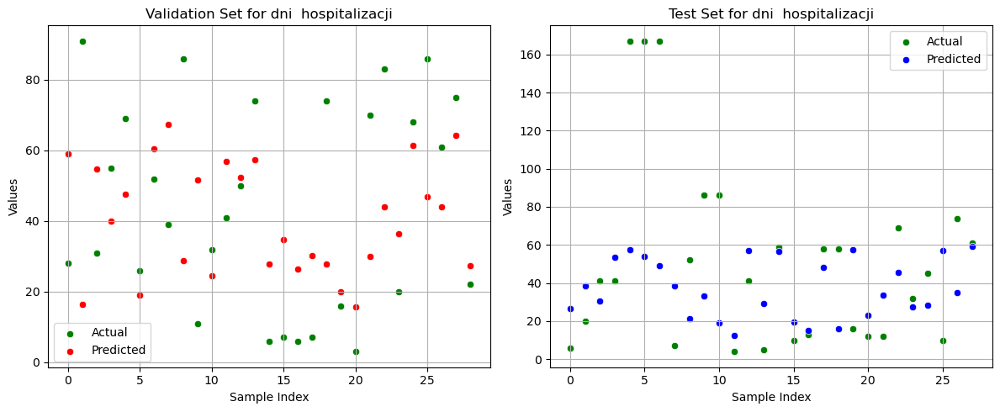

Best parameters: {'max_depth': 3, 'min_samples_leaf': 2, 'min_samples_split': 2, 'n_estimators': 500}
MAE (Val): 23.4720, MAPE (Val): 52.81%
MAE (Test): 32.3688, MAPE (Test): 63.87%

Fold 5/5


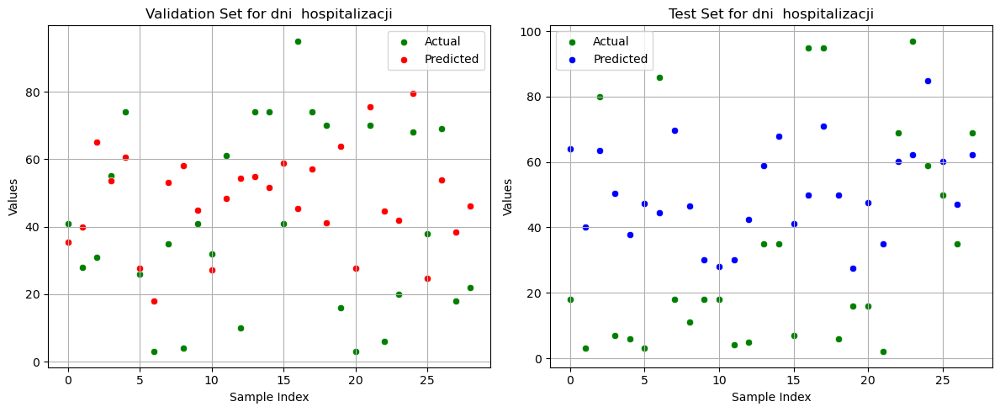

Best parameters: {'max_depth': 3, 'min_samples_leaf': 2, 'min_samples_split': 2, 'n_estimators': 500}
MAE (Val): 20.6542, MAPE (Val): 49.96%
MAE (Test): 28.9798, MAPE (Test): 84.26%

Training model for column P27.1 with 5-fold cross-validation
Fold 1/5
Best Parameters: {'max_depth': 6, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 100}
Accuracy (Val): 0.69
Accuracy (Test): 0.69



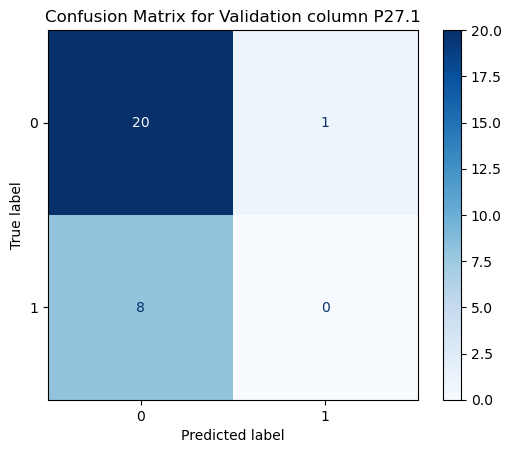

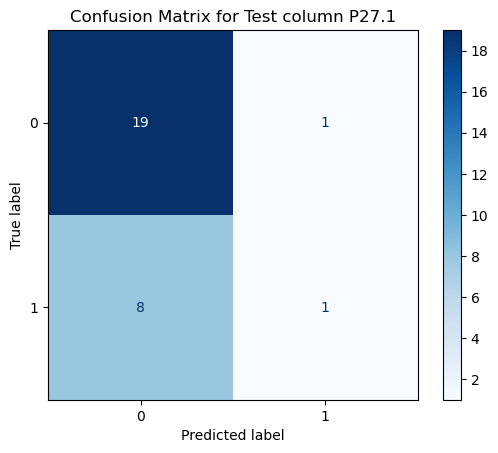

Fold 2/5
Best Parameters: {'max_depth': 6, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 100}
Accuracy (Val): 0.69
Accuracy (Test): 0.79



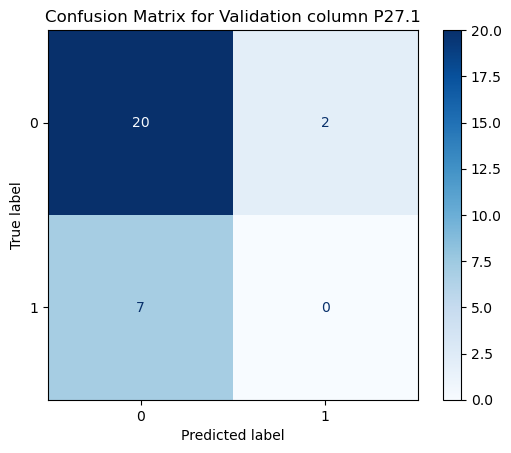

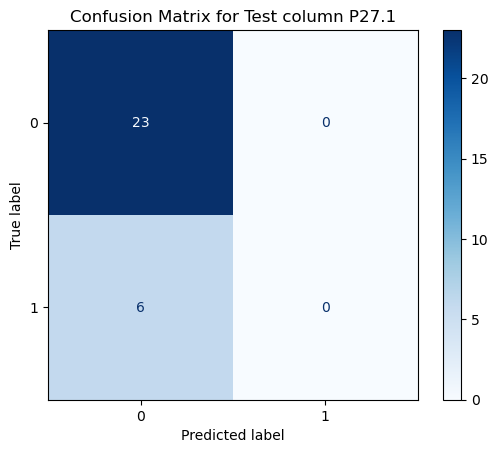

Fold 3/5
Best Parameters: {'max_depth': 2, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 100}
Accuracy (Val): 0.72
Accuracy (Test): 0.79



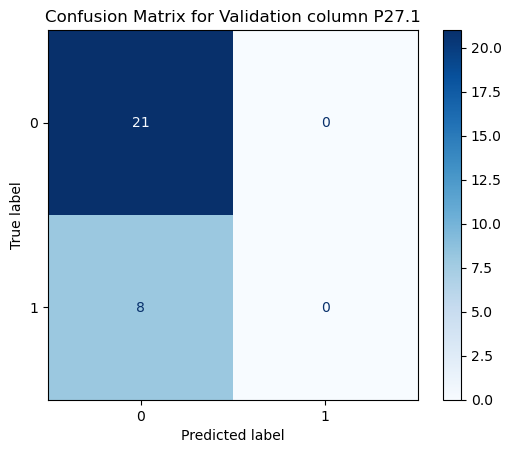

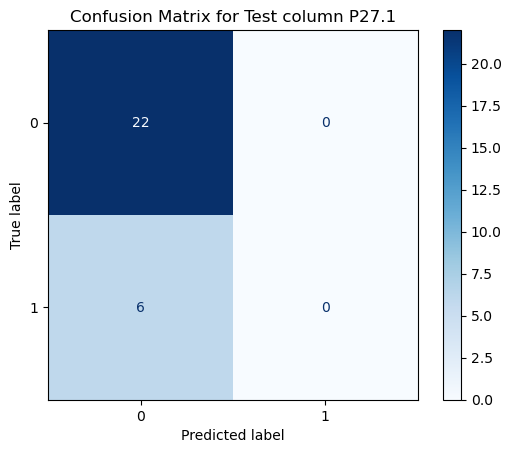

Fold 4/5
Best Parameters: {'max_depth': 4, 'min_samples_leaf': 1, 'min_samples_split': 5, 'n_estimators': 500}
Accuracy (Val): 0.79
Accuracy (Test): 0.64



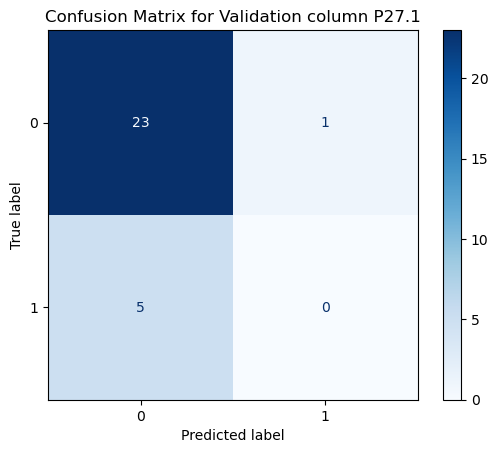

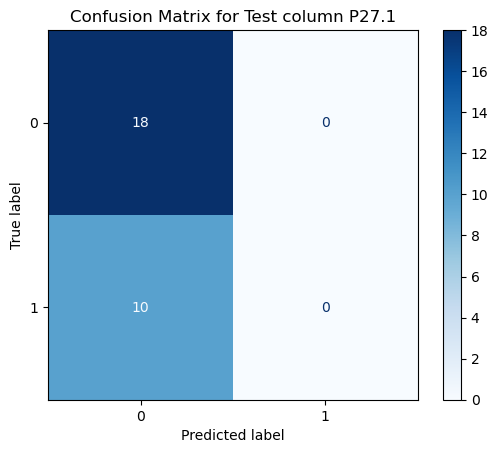

Fold 5/5
Best Parameters: {'max_depth': 4, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 100}
Accuracy (Val): 0.76
Accuracy (Test): 0.86



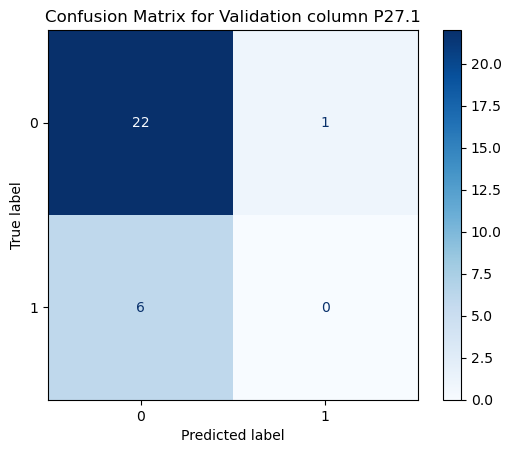

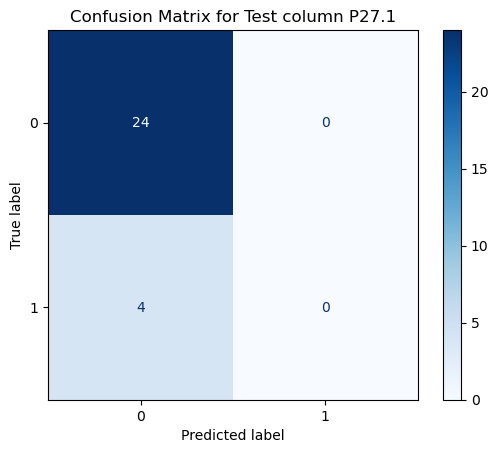

Training model for column H35.1 with 5-fold cross-validation
Fold 1/5


/home/michaltajak/anaconda3/envs/tensorplease/lib/python3.9/site-packages/sklearn/model_selection/_split.py:684: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(


Best Parameters: {'max_depth': 2, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 100}
Accuracy (Val): 0.83
Accuracy (Test): 0.93



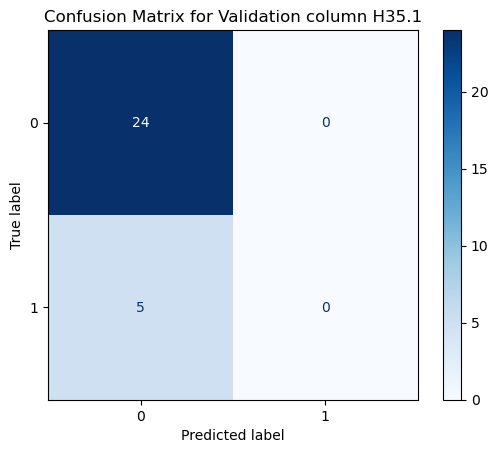

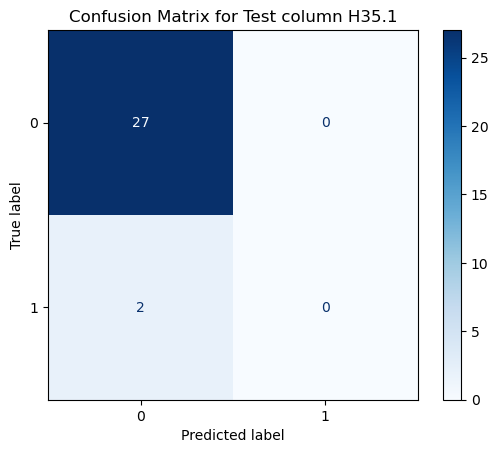

Fold 2/5
Best Parameters: {'max_depth': 2, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 100}
Accuracy (Val): 0.86
Accuracy (Test): 0.97



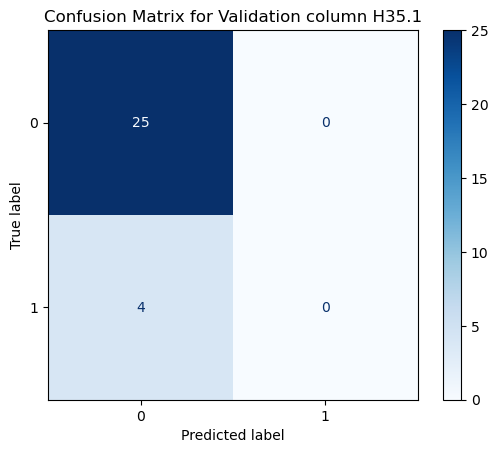

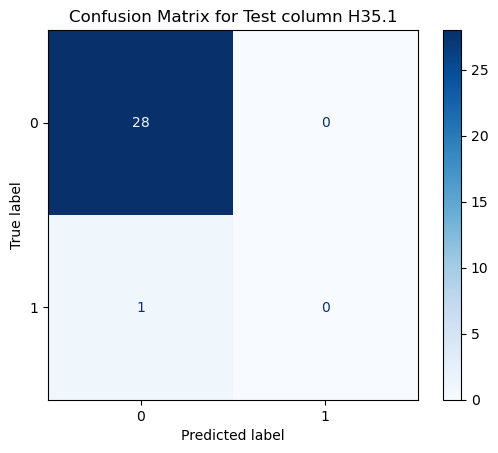

Fold 3/5
Best Parameters: {'max_depth': 2, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 100}
Accuracy (Val): 0.90
Accuracy (Test): 0.96



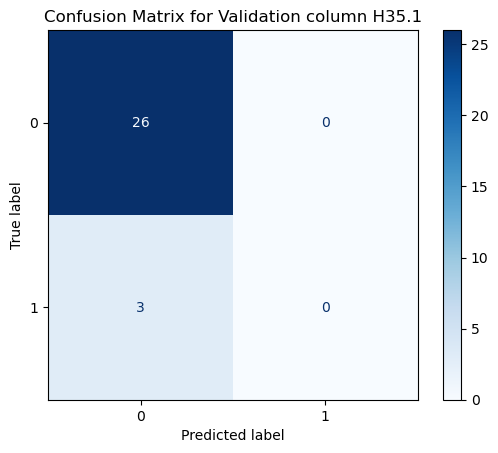

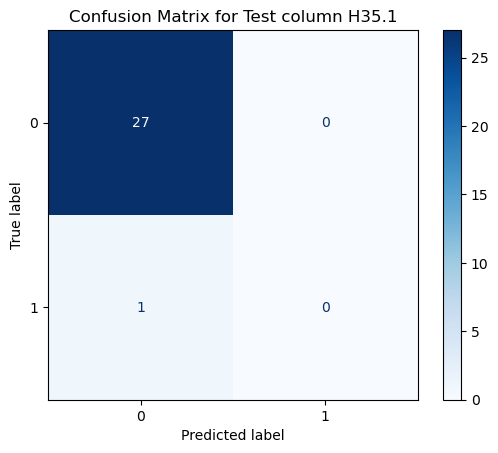

Fold 4/5


/home/michaltajak/anaconda3/envs/tensorplease/lib/python3.9/site-packages/sklearn/model_selection/_split.py:684: UserWarning: The least populated class in y has only 3 members, which is less than n_splits=5.
  warnings.warn(


Best Parameters: {'max_depth': 2, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 100}
Accuracy (Val): 0.90
Accuracy (Test): 0.82



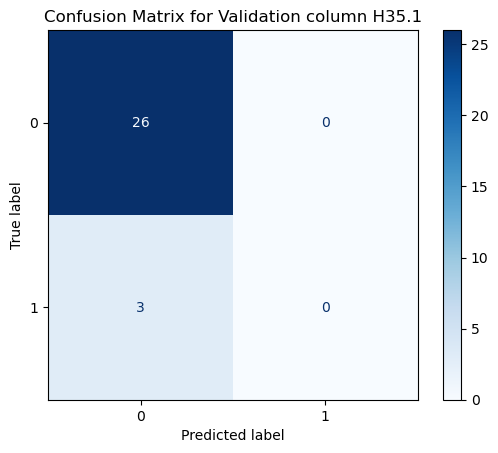

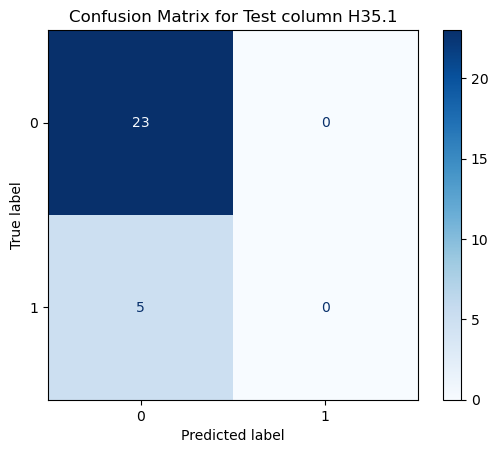

Fold 5/5
Best Parameters: {'max_depth': 2, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 100}
Accuracy (Val): 1.00
Accuracy (Test): 0.93



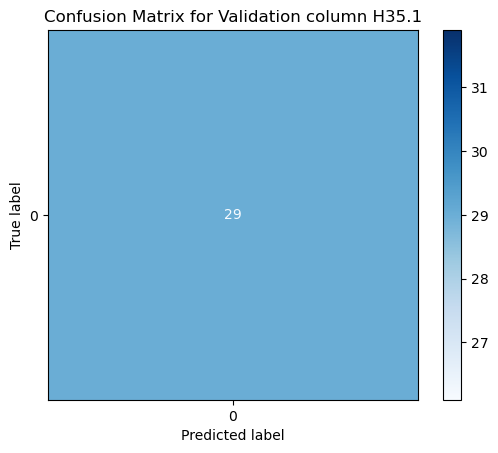

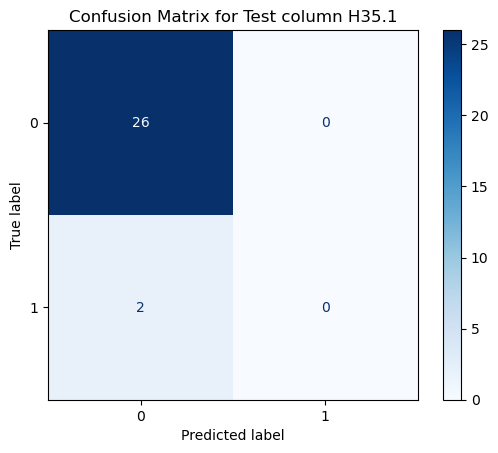

In [63]:
import pandas as pd
import numpy as np
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score, accuracy_score, confusion_matrix, f1_score
from sklearn.model_selection import train_test_split, GridSearchCV, KFold
from sklearn.preprocessing import MinMaxScaler
from sklearn.ensemble import RandomForestRegressor, RandomForestClassifier
import seaborn as sns
import matplotlib.pyplot as plt

# Define your regression and classification target columns
reg = ['HC - WYPI', 'HC (pc) -WYPI', 'HC (Z Score) -WYPI', 'dni  hospitalizacji']
cla = ['P27.1', 'H35.1']

# Hyperparameters grid for RandomForest Regressor
param_grid_reg = {
    'n_estimators': [500, 1000],
    'min_samples_split': [2, 3, 4],
    'min_samples_leaf': [1, 2],
    'max_depth': [3, 4, 5]
}

# Hyperparameters grid for RandomForest Classifier
param_grid_cla = {
    'n_estimators': [100, 500],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 3],
    'max_depth': [2, 4, 6]
}
def mean_absolute_percentage_error(y_true, y_pred):
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

# Evaluation function for regression model using MAE
def evaluate_regression_model(X_train, X_val, X_test, y_train, y_val, y_test, model, param_grid, y_col):
    # GridSearchCV for finding the best parameters
    grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=5, n_jobs=-1, verbose=0)
    grid_search.fit(X_train, y_train)
    
    # Best model from GridSearchCV
    best_model = grid_search.best_estimator_
    
    # Evaluation on the training set
    y_train_pred = best_model.predict(X_train)
    mae_train = mean_absolute_error(y_train, y_train_pred)
    r2_train = r2_score(y_train, y_train_pred)

    y_val_pred = best_model.predict(X_val)
    mae_val = mean_absolute_error(y_val, y_val_pred)  # MAE dla walidacji
    mape_val = np.abs(mae_val / np.mean(y_val)) * 100
    r2_val = r2_score(y_val, y_val_pred)
    
    # Ocena modelu na zbiorze testowym
    y_test_pred = best_model.predict(X_test)
    mae_test = mean_absolute_error(y_test, y_test_pred)  # MAE dla testu
    mape_test = np.abs(mae_test / np.mean(y_test)) * 100
    r2_test = r2_score(y_test, y_test_pred)

    plt.figure(figsize=(12, 5))

    plt.subplot(1, 2, 1)
    sns.scatterplot(x=np.arange(len(y_val)), y=y_val, color='green', label='Actual')
    sns.scatterplot(x=np.arange(len(y_val)), y=y_val_pred, color='red', label='Predicted')
    plt.xlabel('Sample Index')
    plt.ylabel('Values')
    plt.title(f'Validation Set for {y_col}')
    plt.legend()
    plt.grid()

    plt.subplot(1, 2, 2)
    sns.scatterplot(x=np.arange(len(y_test)), y=y_test, color='green', label='Actual')
    sns.scatterplot(x=np.arange(len(y_test)), y=y_test_pred, color='blue', label='Predicted')
    plt.xlabel('Sample Index')
    plt.ylabel('Values')
    plt.title(f'Test Set for {y_col}')
    plt.legend()
    plt.grid()

    plt.tight_layout()
    plt.show()
    
    return grid_search.best_params_, mae_train, r2_train, mae_val, r2_val, mae_test, r2_test, mape_val, mape_test

# Cross-validation with 5 folds for regression
def cross_validate_regression(X, y, model, param_grid, cv=5):
    X = X.values
    kf = KFold(n_splits=cv, shuffle=True, random_state=43)
    
    scaler = MinMaxScaler()
    X_scaled = scaler.fit_transform(X)
    
    fold = 1
    for train_idx, test_idx in kf.split(X_scaled):
        print(f"Fold {fold}/{cv}")
        X_train, X_test = X_scaled[train_idx], X_scaled[test_idx]
        y_train, y_test = y.iloc[train_idx], y.iloc[test_idx]
        
        X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.25, random_state=43)
        
        best_params, mae_train, r2_train, mae_val, r2_val, mae_test, r2_test, mape_val, mape_test = evaluate_regression_model(
            X_train, X_val, X_test, y_train, y_val, y_test, model, param_grid, y.name)
        
        print(f"Best parameters: {best_params}")
        print(f"MAE (Val): {mae_val:.4f}, MAPE (Val): {mape_val:.2f}%")
        print(f"MAE (Test): {mae_test:.4f}, MAPE (Test): {mape_test:.2f}%\n")
        
        fold += 1

# Evaluation function for classification model
def evaluate_classification_model(X_train, X_val, X_test, y_train, y_val, y_test, model, param_grid):
    grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=5, n_jobs=-1, verbose=0)
    grid_search.fit(X_train, y_train)
    
    best_model = grid_search.best_estimator_
    
    f1_train = f1_score(y_train, best_model.predict(X_train), average='weighted')
    f1_val = f1_score(y_val, best_model.predict(X_val), average='weighted')
    f1_test = f1_score(y_test, best_model.predict(X_test), average='weighted')
    
    accuracy_train = accuracy_score(y_train, best_model.predict(X_train))
    accuracy_val = accuracy_score(y_val, best_model.predict(X_val))
    accuracy_test = accuracy_score(y_test, best_model.predict(X_test))
    
    return grid_search.best_params_, f1_train, f1_val, f1_test, accuracy_train, accuracy_val, accuracy_test, best_model

# Cross-validation with 5 folds for classification
def cross_validate_classification(X, y, model, param_grid, cv=5):
    X = X.values
    kf = KFold(n_splits=cv, shuffle=True, random_state=43)
    
    scaler = MinMaxScaler()
    X_scaled = scaler.fit_transform(X)
    
    fold = 1
    for train_idx, test_idx in kf.split(X_scaled):
        print(f"Fold {fold}/{cv}")
        X_train, X_test = X_scaled[train_idx], X_scaled[test_idx]
        y_train, y_test = y.iloc[train_idx], y.iloc[test_idx]
        
        X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.25, random_state=43)
        
        best_params, f1_train, f1_val, f1_test, accuracy_train, accuracy_val, accuracy_test, best_model = evaluate_classification_model(
            X_train, X_val, X_test, y_train, y_val, y_test, model, param_grid)
        
        print(f"Best Parameters: {best_params}")
        print(f"Accuracy (Val): {accuracy_val:.2f}")
        print(f"Accuracy (Test): {accuracy_test:.2f}\n")

        # Get predictions for validation and test sets
        y_val_pred = best_model.predict(X_val)
        y_test_pred = best_model.predict(X_test)

        # Calculate confusion matrix for validation and test sets
        cm_val = confusion_matrix(y_val, y_val_pred)
        cm_test = confusion_matrix(y_test, y_test_pred)
        
        disp_val = ConfusionMatrixDisplay(confusion_matrix=cm_val)
        disp_val.plot(cmap='Blues', values_format='d')
        plt.title(f'Confusion Matrix for Validation column {y_col}')
        plt.show()
            
        disp_test = ConfusionMatrixDisplay(confusion_matrix=cm_test)
        disp_test.plot(cmap='Blues', values_format='d')
        plt.title(f"Confusion Matrix for Test column {y_col}")
        plt.show()

        fold += 1

# Loop through regression targets
for y_col in reg:
    print(f"Training model for column {y_col} with 5-fold cross-validation")
    model = RandomForestRegressor(random_state=43)
    cross_validate_regression(X, y[y_col], model, param_grid_reg, cv=5)

# Loop through classification targets with 5-fold cross-validation
for y_col in cla:
    print(f"Training model for column {y_col} with 5-fold cross-validation")
    model = RandomForestClassifier(random_state=43)
    cross_validate_classification(X, y[y_col], model, param_grid_cla, cv=5)


### RF cla

Training model for column P27.1 with 5-fold cross-validation
Fold 1/5
Best Parameters: {'max_depth': 3, 'min_samples_leaf': 2, 'min_samples_split': 2, 'n_estimators': 300}
F1-score (Train): 0.80
F1-score (Val): 0.68
F1-score (Test): 0.56

f1: nan



/tmp/ipykernel_54919/2915164355.py:102: RuntimeWarning: invalid value encountered in scalar divide
  precision = TP / (TP + FP)


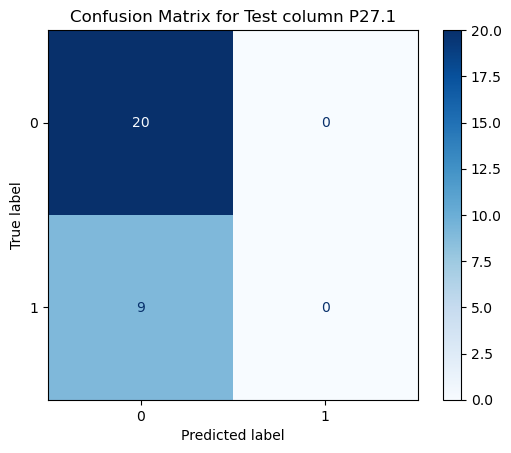

Fold 2/5
Best Parameters: {'max_depth': 5, 'min_samples_leaf': 1, 'min_samples_split': 4, 'n_estimators': 700}
F1-score (Train): 0.99
F1-score (Val): 0.64
F1-score (Test): 0.75

f1: 0.25



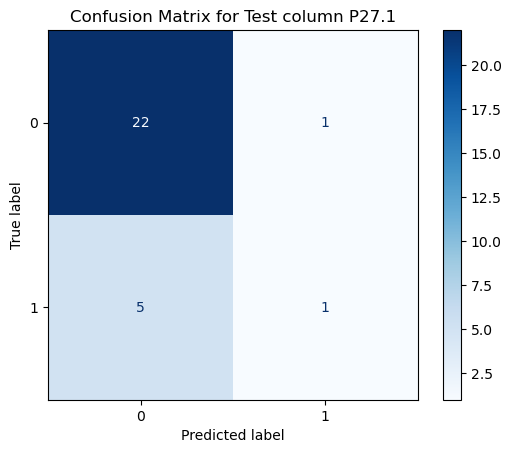

Fold 3/5
Best Parameters: {'max_depth': 3, 'min_samples_leaf': 1, 'min_samples_split': 3, 'n_estimators': 500}
F1-score (Train): 0.85
F1-score (Val): 0.66
F1-score (Test): 0.69

f1: nan



/tmp/ipykernel_54919/2915164355.py:102: RuntimeWarning: invalid value encountered in scalar divide
  precision = TP / (TP + FP)


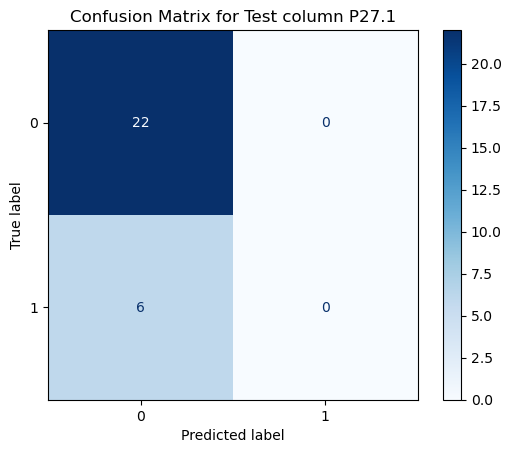

Fold 4/5
Best Parameters: {'max_depth': 3, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 300}
F1-score (Train): 0.86
F1-score (Val): 0.63
F1-score (Test): 0.50

f1: nan



/tmp/ipykernel_54919/2915164355.py:102: RuntimeWarning: invalid value encountered in scalar divide
  precision = TP / (TP + FP)


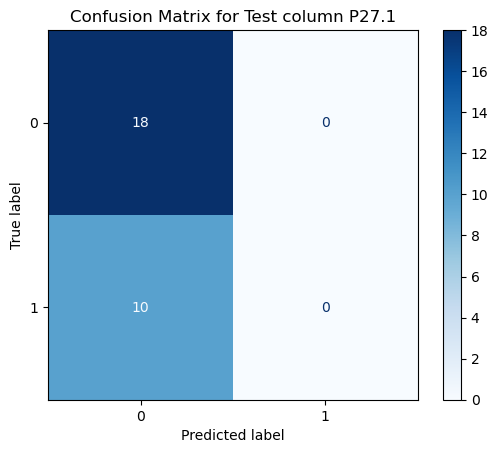

Fold 5/5
Best Parameters: {'max_depth': 5, 'min_samples_leaf': 1, 'min_samples_split': 4, 'n_estimators': 300}
F1-score (Train): 0.99
F1-score (Val): 0.72
F1-score (Test): 0.83

f1: 0.44



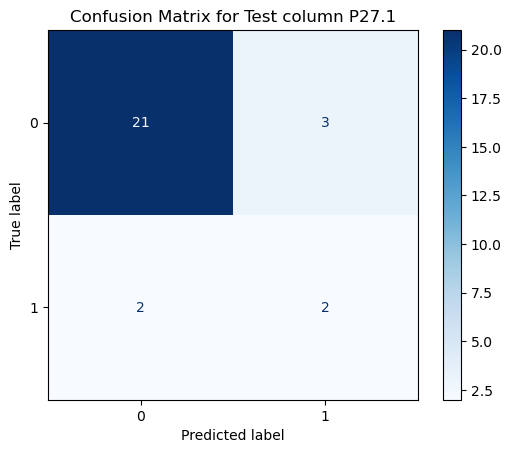

Training model for column H35.1 with 5-fold cross-validation
Fold 1/5
Best Parameters: {'max_depth': 3, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 300}
F1-score (Train): 0.96
F1-score (Val): 0.84
F1-score (Test): 0.90

f1: nan



/tmp/ipykernel_54919/2915164355.py:102: RuntimeWarning: invalid value encountered in scalar divide
  precision = TP / (TP + FP)


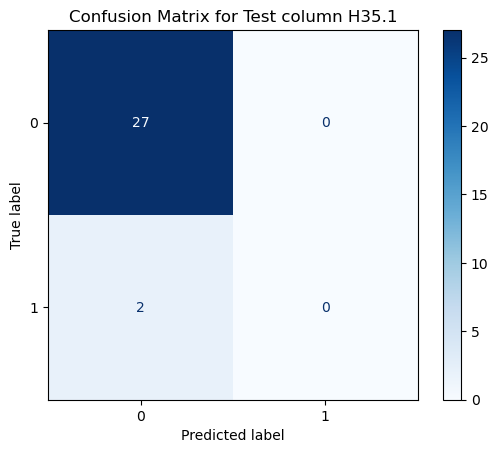

Fold 2/5
Best Parameters: {'max_depth': 3, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 300}
F1-score (Train): 0.94
F1-score (Val): 0.89
F1-score (Test): 0.95

f1: nan



/tmp/ipykernel_54919/2915164355.py:102: RuntimeWarning: invalid value encountered in scalar divide
  precision = TP / (TP + FP)


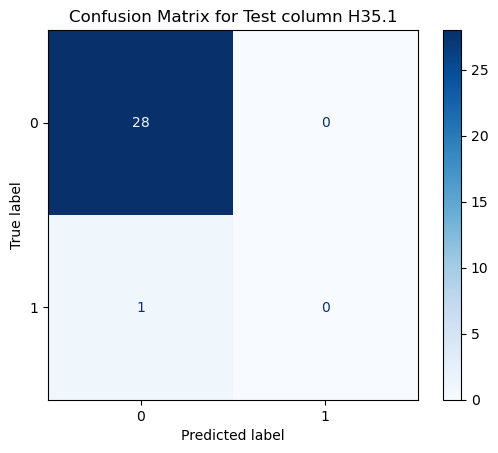

Fold 3/5
Best Parameters: {'max_depth': 3, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 300}
F1-score (Train): 0.93
F1-score (Val): 0.89
F1-score (Test): 0.95

f1: nan



/tmp/ipykernel_54919/2915164355.py:102: RuntimeWarning: invalid value encountered in scalar divide
  precision = TP / (TP + FP)


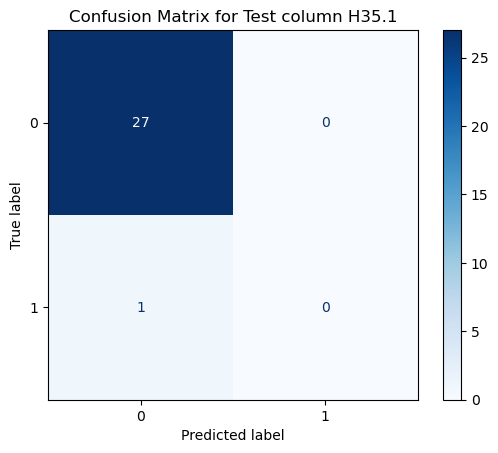

Fold 4/5


/home/michaltajak/anaconda3/envs/tensorplease/lib/python3.9/site-packages/sklearn/model_selection/_split.py:684: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(


Best Parameters: {'max_depth': 3, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 300}
F1-score (Train): 0.99
F1-score (Val): 0.89
F1-score (Test): 0.74

f1: nan



/tmp/ipykernel_54919/2915164355.py:102: RuntimeWarning: invalid value encountered in scalar divide
  precision = TP / (TP + FP)


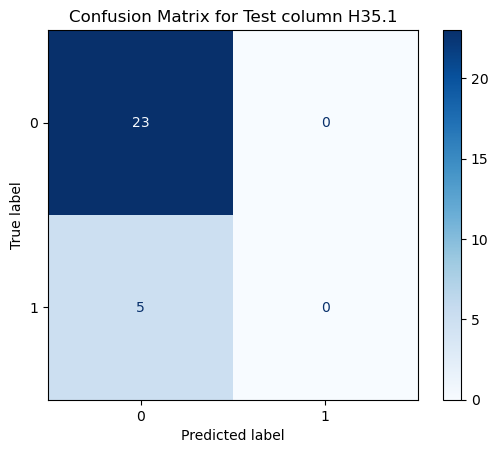

Fold 5/5
Best Parameters: {'max_depth': 3, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 300}
F1-score (Train): 0.96
F1-score (Val): 1.00
F1-score (Test): 0.89

f1: nan



/tmp/ipykernel_54919/2915164355.py:102: RuntimeWarning: invalid value encountered in scalar divide
  precision = TP / (TP + FP)


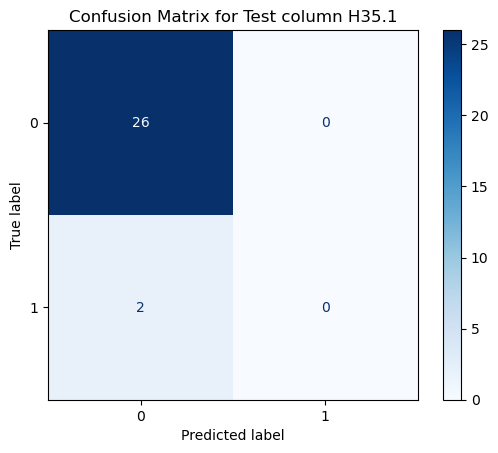

In [25]:
import pandas as pd
import numpy as np
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score, accuracy_score, confusion_matrix, f1_score
from sklearn.model_selection import train_test_split, GridSearchCV, KFold
from sklearn.preprocessing import MinMaxScaler
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import IsolationForest
from sklearn.svm import OneClassSVM
import seaborn as sns
import matplotlib.pyplot as plt

# Define your regression and classification target columns
reg = ['HC - WYPI', 'HC (pc) -WYPI', 'HC (Z Score) -WYPI', 'dni  hospitalizacji']
cla = ['P27.1', 'H35.1']

# Hyperparameters grid for RandomForest Classifier
param_grid_cla = {
    'n_estimators': [300, 500, 700],
    'min_samples_split': [2, 3, 4],
    'min_samples_leaf': [1, 2],
    'max_depth': [3, 4, 5],
}


# Function for anomaly detection
def detect_anomalies(X, method='isolation_forest'):
    """
    Function to detect anomalies using either Isolation Forest or One-Class SVM.
    
    Parameters:
    X: The feature matrix
    method: The anomaly detection method to use ('isolation_forest' or 'one_class_svm')
    
    Returns:
    anomalies: Indices of detected anomalies
    """
    if method == 'isolation_forest':
        model = IsolationForest(contamination=0.05, random_state=43)  # 5% contamination rate
    elif method == 'one_class_svm':
        model = OneClassSVM(nu=0.05, kernel='rbf', gamma='auto')  # 5% contamination rate
        
    model.fit(X)
    predictions = model.predict(X)
    
    # -1 means anomaly, 1 means normal
    anomalies = np.where(predictions == -1)[0]
    
    return anomalies

# Evaluation function for classification model
def evaluate_classification_model(X_train, X_val, X_test, y_train, y_val, y_test, model, param_grid):
    # Use F1-score as the scoring metric
    grid_search = GridSearchCV(estimator=model, param_grid=param_grid, scoring='f1_weighted', cv=5, n_jobs=-1, verbose=0)
    grid_search.fit(X_train, y_train)
    
    best_model = grid_search.best_estimator_
    
    f1_train = f1_score(y_train, best_model.predict(X_train), average='weighted')
    f1_val = f1_score(y_val, best_model.predict(X_val), average='weighted')
    f1_test = f1_score(y_test, best_model.predict(X_test), average='weighted')
    
    return grid_search.best_params_, f1_train, f1_val, f1_test, best_model

# Cross-validation with 5 folds for classification
def cross_validate_classification(X, y, model, param_grid, cv=5, anomaly_method='isolation_forest'):
    X = X.values
    kf = KFold(n_splits=cv, shuffle=True, random_state=43)
    
    scaler = MinMaxScaler()
    X_scaled = scaler.fit_transform(X)
    
    fold = 1
    for train_idx, test_idx in kf.split(X_scaled):
        print(f"Fold {fold}/{cv}")
        X_train, X_test = X_scaled[train_idx], X_scaled[test_idx]
        y_train, y_test = y.iloc[train_idx], y.iloc[test_idx]
        
        # Anomaly detection on the training set
        anomalies_train = detect_anomalies(X_train, method=anomaly_method)
        X_train_cleaned = np.delete(X_train, anomalies_train, axis=0)
        y_train_cleaned = np.delete(y_train.values, anomalies_train, axis=0)
        
        X_train, X_val, y_train, y_val = train_test_split(X_train_cleaned, y_train_cleaned, test_size=0.25, random_state=43)
        
        best_params, f1_train, f1_val, f1_test, best_model = evaluate_classification_model(
            X_train, X_val, X_test, y_train, y_val, y_test, model, param_grid)
        
        print(f"Best Parameters: {best_params}")
        print(f"F1-score (Train): {f1_train:.2f}")
        print(f"F1-score (Val): {f1_val:.2f}")
        print(f"F1-score (Test): {f1_test:.2f}\n")

        # Get predictions for validation and test sets
        y_val_pred = best_model.predict(X_val)
        y_test_pred = best_model.predict(X_test)

        # Calculate confusion matrix for validation and test sets
        cm_val = confusion_matrix(y_val, y_val_pred)
        cm_test = confusion_matrix(y_test, y_test_pred)
        
        TN, FP, FN, TP = cm_test.ravel()
        precision = TP / (TP + FP)
        recall = TP / (TP + FN)
        
        # Obliczanie F1 score
        f1 = 2 * (precision * recall) / (precision + recall)
        print(f"f1: {f1:.2f}\n")
            
        disp_test = ConfusionMatrixDisplay(confusion_matrix=cm_test)
        disp_test.plot(cmap='Blues', values_format='d')
        plt.title(f"Confusion Matrix for Test column {y_col}")
        plt.show()

        fold += 1

# Loop through classification targets with 5-fold cross-validation
for y_col in cla:
    print(f"Training model for column {y_col} with 5-fold cross-validation")
    model = RandomForestClassifier(random_state=43)
    cross_validate_classification(X, y[y_col], model, param_grid_cla, cv=5, anomaly_method='isolation_forest')


### KNN

Training KNN model for HC - WYPI with 5-fold cross-validation
Fold 1/5
Best parameters: {'algorithm': 'auto', 'n_neighbors': 5, 'p': 1, 'weights': 'distance'}
MAE (Val): 1.7048, MAPE (Val): 5.12%
MAE (Test): 1.8527, MAPE (Test): 5.57%



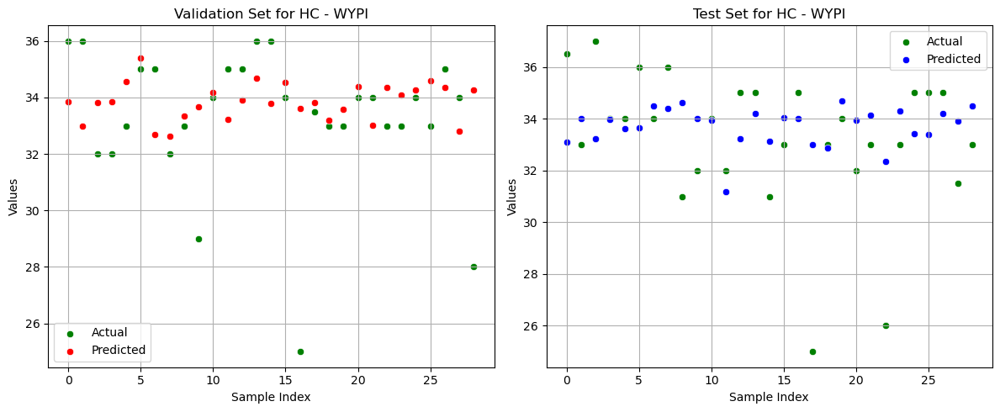

Fold 2/5
Best parameters: {'algorithm': 'auto', 'n_neighbors': 9, 'p': 2, 'weights': 'distance'}
MAE (Val): 1.3460, MAPE (Val): 4.00%
MAE (Test): 1.4699, MAPE (Test): 4.40%



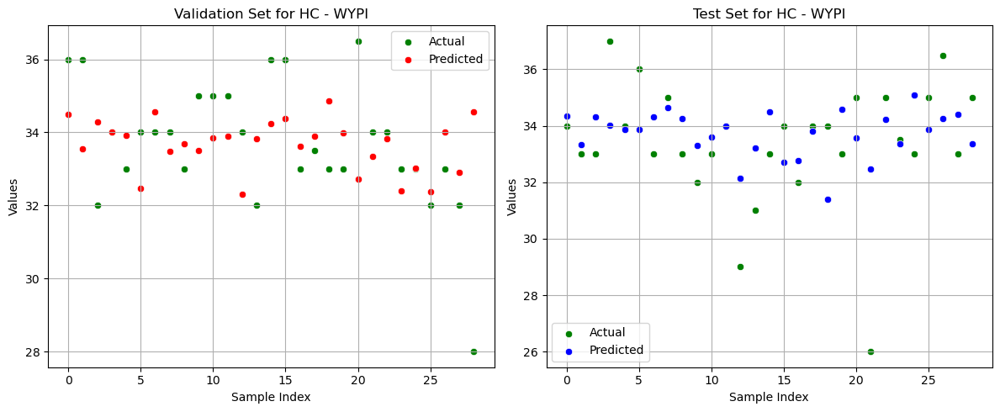

Fold 3/5
Best parameters: {'algorithm': 'auto', 'n_neighbors': 7, 'p': 1, 'weights': 'uniform'}
MAE (Val): 1.7562, MAPE (Val): 5.17%
MAE (Test): 1.5944, MAPE (Test): 4.78%



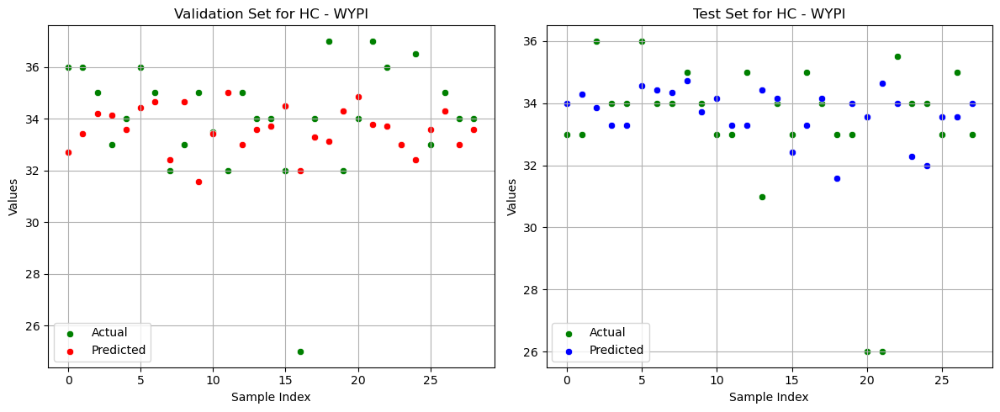

Fold 4/5
Best parameters: {'algorithm': 'auto', 'n_neighbors': 7, 'p': 2, 'weights': 'distance'}
MAE (Val): 1.7940, MAPE (Val): 5.31%
MAE (Test): 1.5626, MAPE (Test): 4.63%



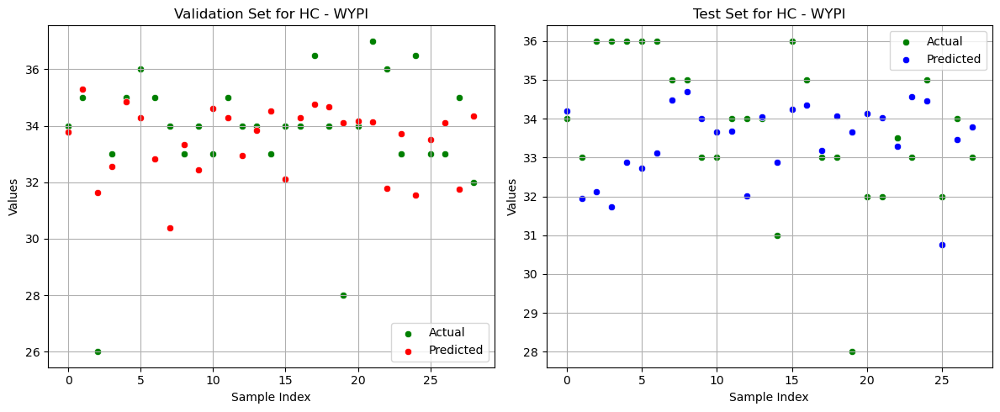

Fold 5/5
Best parameters: {'algorithm': 'ball_tree', 'n_neighbors': 7, 'p': 2, 'weights': 'distance'}
MAE (Val): 1.7330, MAPE (Val): 5.22%
MAE (Test): 2.1030, MAPE (Test): 6.39%



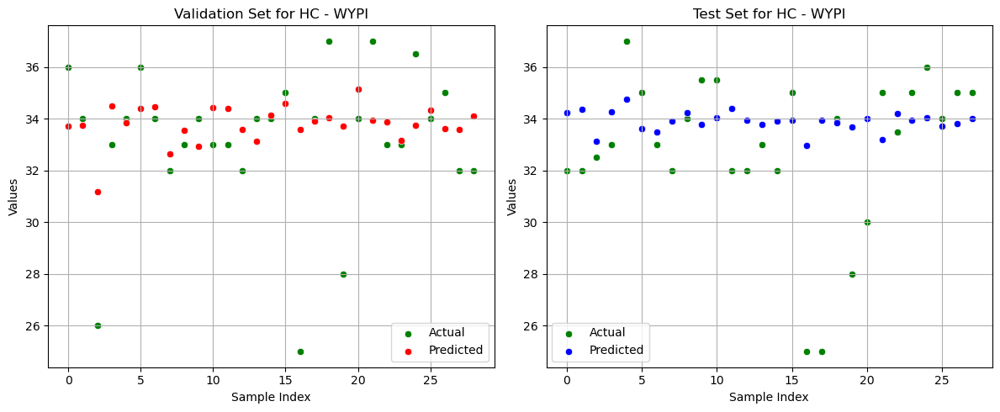

Training KNN model for HC (pc) -WYPI with 5-fold cross-validation
Fold 1/5
Best parameters: {'algorithm': 'auto', 'n_neighbors': 3, 'p': 1, 'weights': 'distance'}
MAE (Val): 19.9471, MAPE (Val): 55.27%
MAE (Test): 25.8137, MAPE (Test): 64.84%



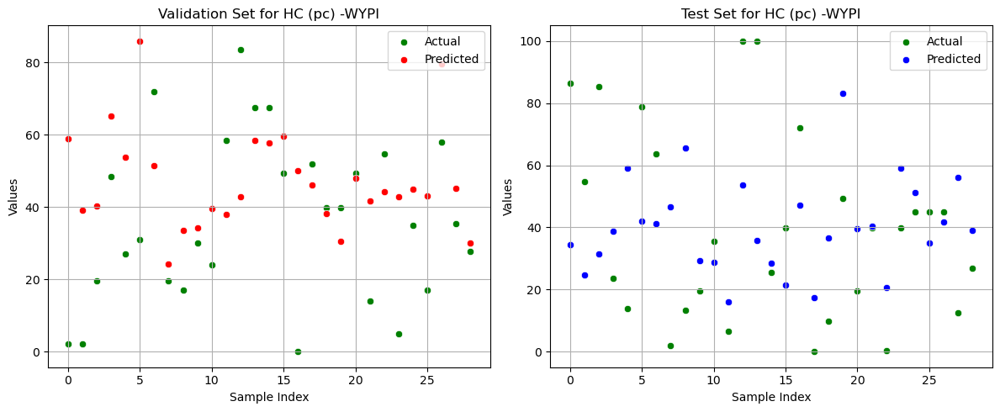

Fold 2/5
Best parameters: {'algorithm': 'auto', 'n_neighbors': 7, 'p': 1, 'weights': 'distance'}
MAE (Val): 24.1367, MAPE (Val): 59.48%
MAE (Test): 17.2553, MAPE (Test): 41.46%



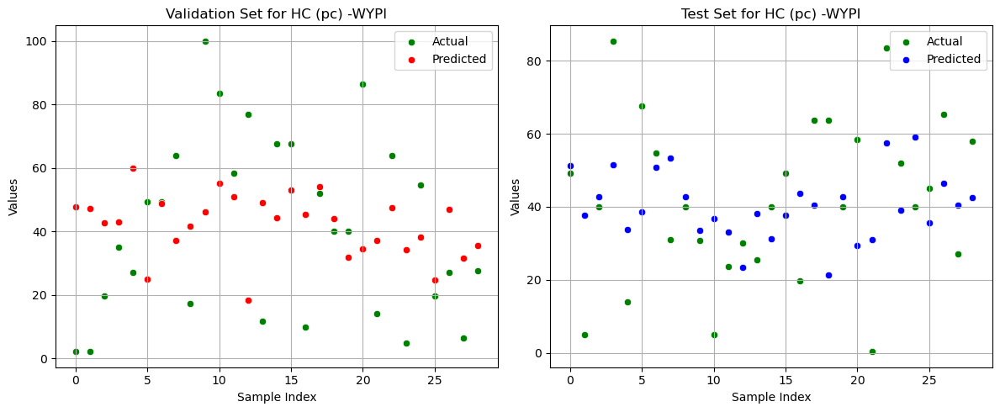

Fold 3/5
Best parameters: {'algorithm': 'auto', 'n_neighbors': 7, 'p': 1, 'weights': 'uniform'}
MAE (Val): 28.8622, MAPE (Val): 63.51%
MAE (Test): 20.8834, MAPE (Test): 56.69%



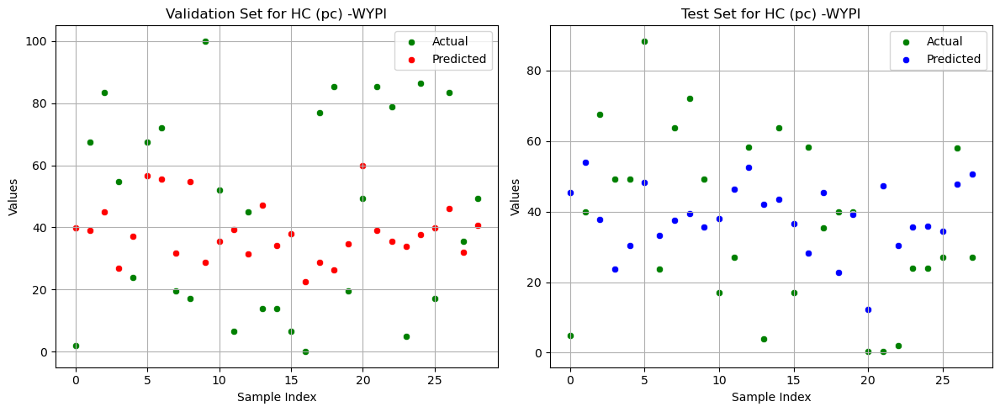

Fold 4/5
Best parameters: {'algorithm': 'auto', 'n_neighbors': 7, 'p': 1, 'weights': 'distance'}
MAE (Val): 25.1961, MAPE (Val): 54.68%
MAE (Test): 22.6179, MAPE (Test): 69.84%



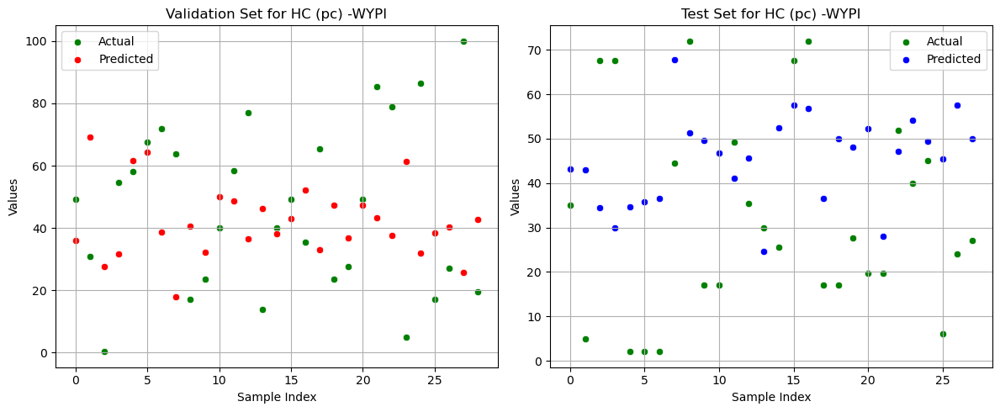

Fold 5/5
Best parameters: {'algorithm': 'auto', 'n_neighbors': 9, 'p': 1, 'weights': 'uniform'}
MAE (Val): 22.4486, MAPE (Val): 60.93%
MAE (Test): 24.4276, MAPE (Test): 64.58%



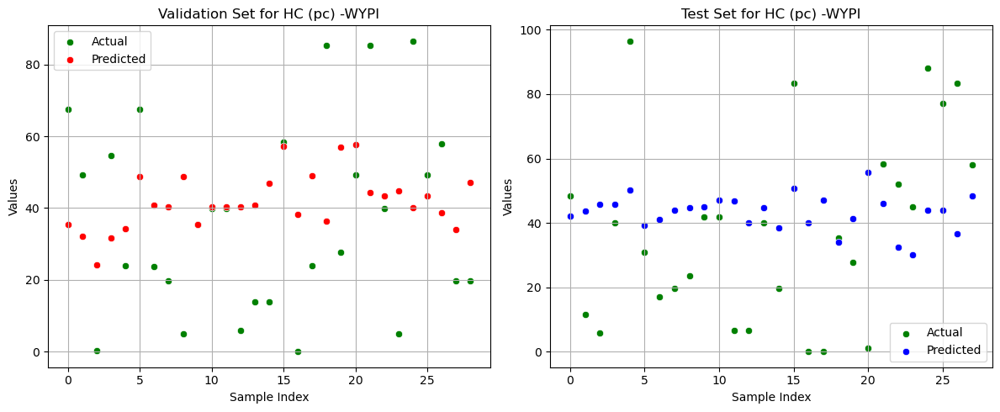

Training KNN model for HC (Z Score) -WYPI with 5-fold cross-validation
Fold 1/5
Best parameters: {'algorithm': 'auto', 'n_neighbors': 3, 'p': 1, 'weights': 'distance'}
MAE (Val): 0.7726, MAPE (Val): 124.12%
MAE (Test): 1.3128, MAPE (Test): 604.34%



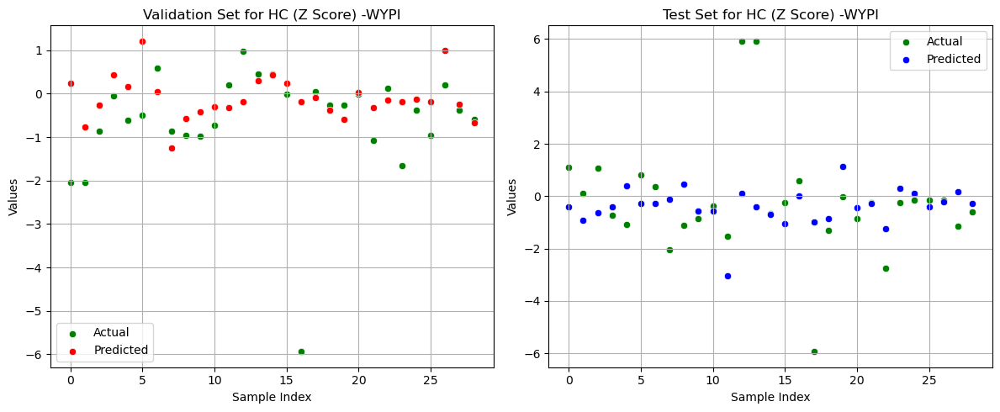

Fold 2/5
Best parameters: {'algorithm': 'auto', 'n_neighbors': 7, 'p': 1, 'weights': 'distance'}
MAE (Val): 0.9421, MAPE (Val): 497.75%
MAE (Test): 0.6052, MAPE (Test): 189.65%



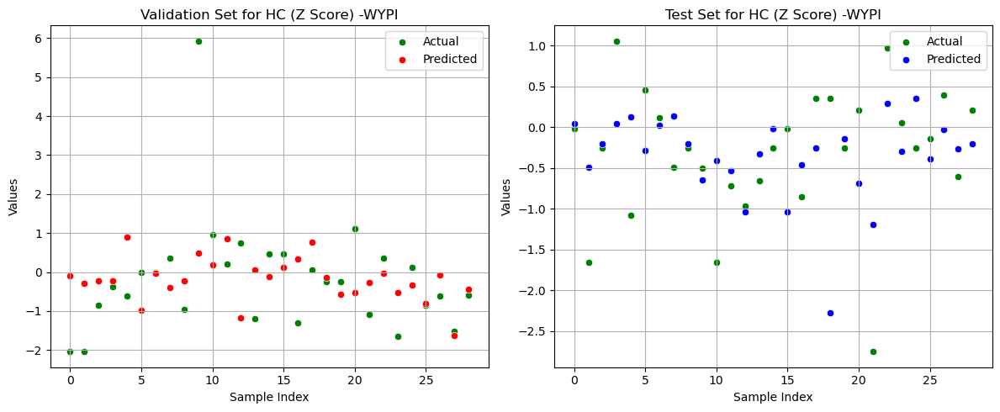

Fold 3/5
Best parameters: {'algorithm': 'auto', 'n_neighbors': 9, 'p': 1, 'weights': 'uniform'}
MAE (Val): 1.3346, MAPE (Val): 711.76%
MAE (Test): 0.7781, MAPE (Test): 149.43%



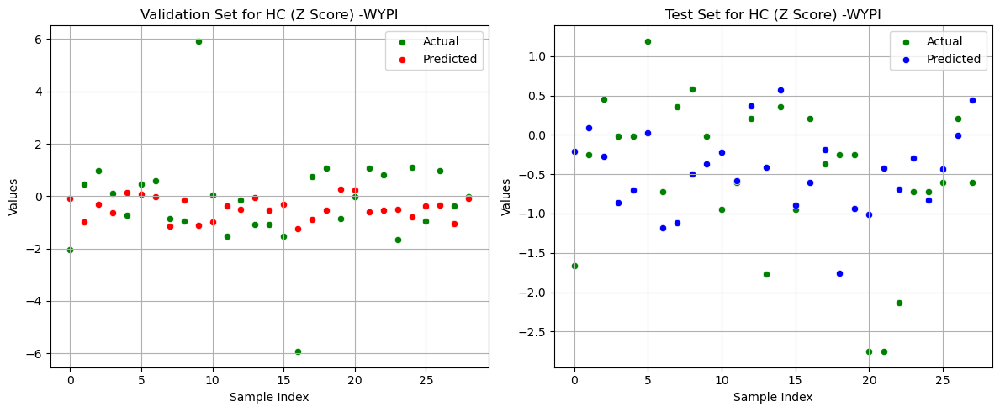

Fold 4/5
Best parameters: {'algorithm': 'auto', 'n_neighbors': 9, 'p': 1, 'weights': 'distance'}
MAE (Val): 1.0499, MAPE (Val): 8038.61%
MAE (Test): 0.7456, MAPE (Test): 124.05%



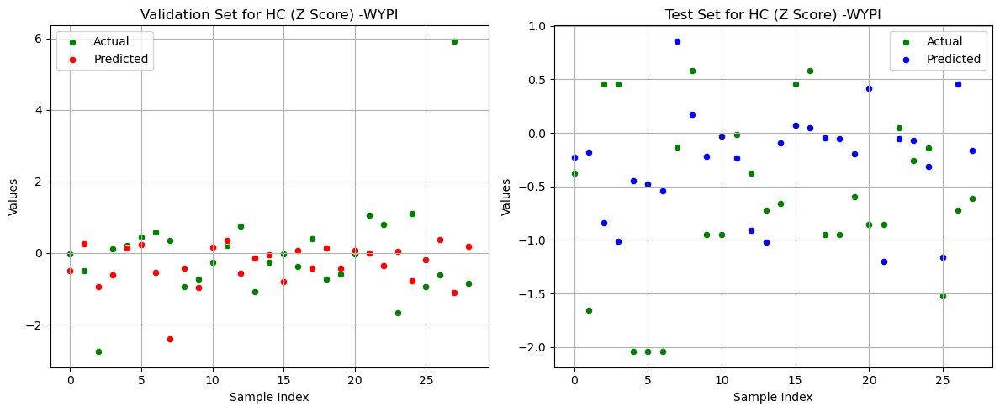

Fold 5/5
Best parameters: {'algorithm': 'auto', 'n_neighbors': 9, 'p': 1, 'weights': 'uniform'}
MAE (Val): 1.0128, MAPE (Val): 167.36%
MAE (Test): 1.0697, MAPE (Test): 151.22%



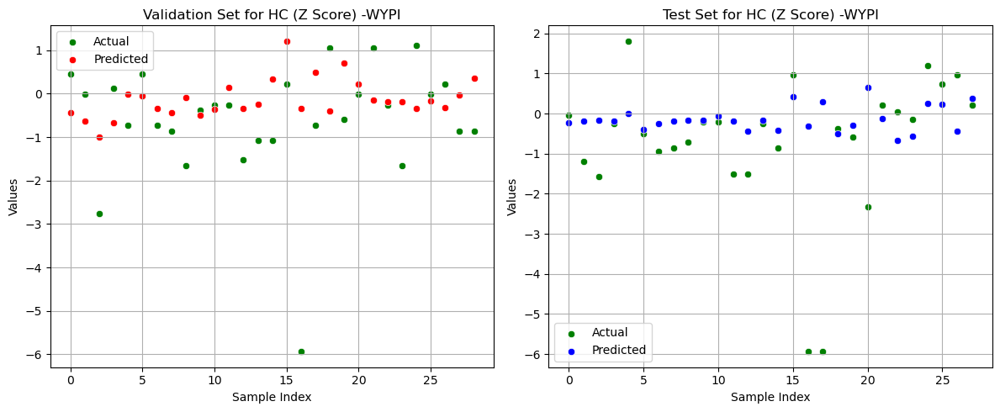

Training KNN model for dni  hospitalizacji with 5-fold cross-validation
Fold 1/5
Best parameters: {'algorithm': 'auto', 'n_neighbors': 7, 'p': 2, 'weights': 'distance'}
MAE (Val): 31.5825, MAPE (Val): 62.82%
MAE (Test): 32.7494, MAPE (Test): 59.03%



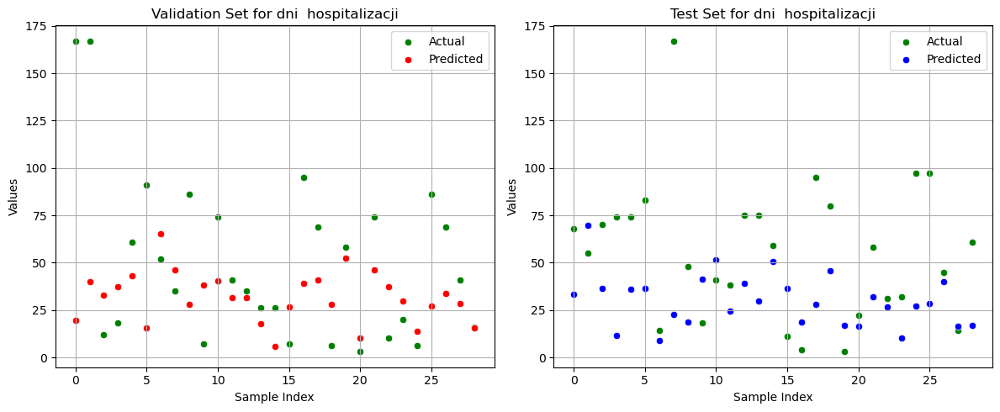

Fold 2/5
Best parameters: {'algorithm': 'auto', 'n_neighbors': 9, 'p': 2, 'weights': 'uniform'}
MAE (Val): 23.9272, MAPE (Val): 50.10%
MAE (Test): 24.8697, MAPE (Test): 74.12%



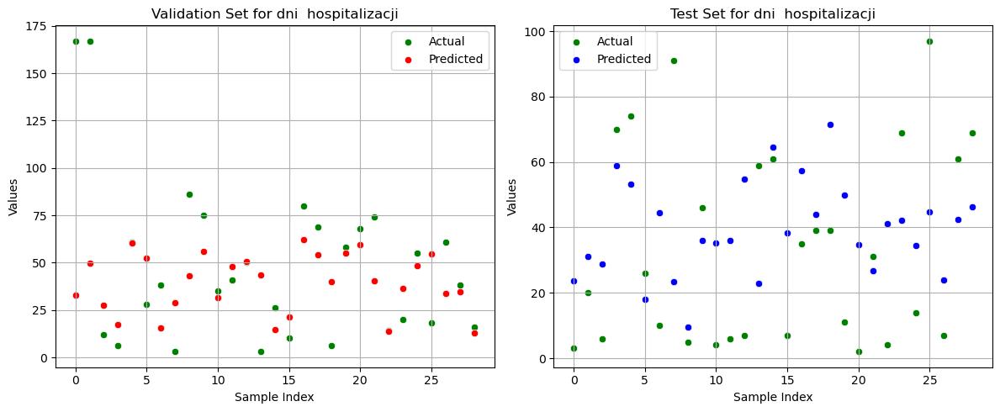

Fold 3/5
Best parameters: {'algorithm': 'auto', 'n_neighbors': 7, 'p': 2, 'weights': 'uniform'}
MAE (Val): 29.4433, MAPE (Val): 55.73%
MAE (Test): 23.8980, MAPE (Test): 65.47%



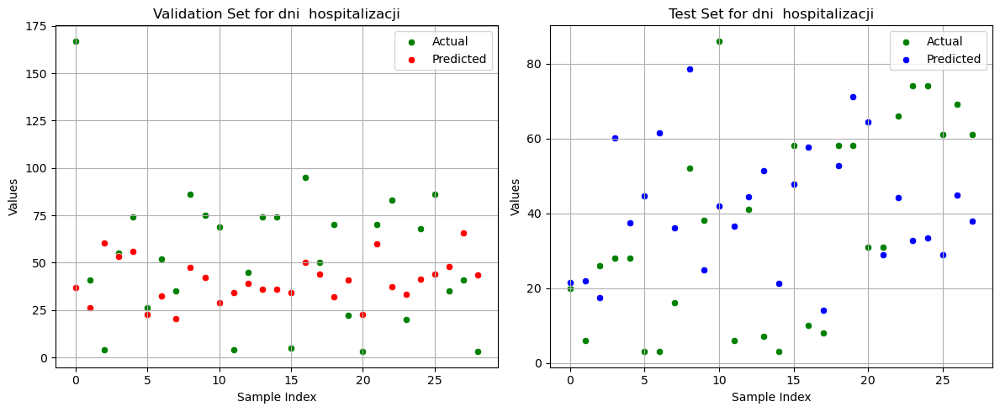

Fold 4/5
Best parameters: {'algorithm': 'ball_tree', 'n_neighbors': 9, 'p': 2, 'weights': 'distance'}
MAE (Val): 24.2820, MAPE (Val): 54.63%
MAE (Test): 33.4302, MAPE (Test): 65.97%



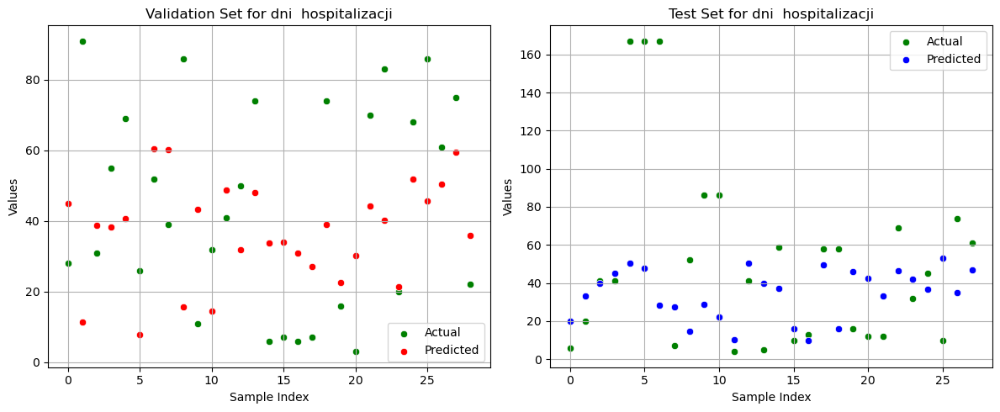

Fold 5/5
Best parameters: {'algorithm': 'auto', 'n_neighbors': 9, 'p': 1, 'weights': 'uniform'}
MAE (Val): 21.8276, MAPE (Val): 52.79%
MAE (Test): 25.1508, MAPE (Test): 73.13%



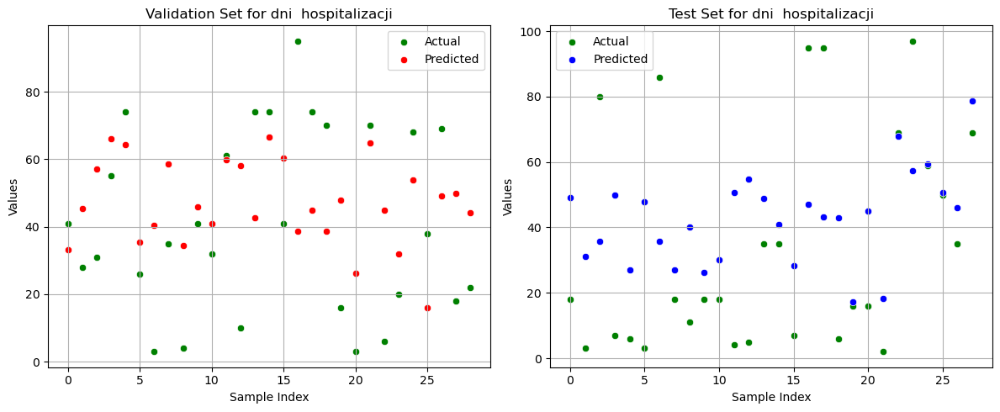

Training KNN model for P27.1 with 5-fold cross-validation
Fold 1/5
Best Parameters: {'n_neighbors': 4, 'p': 2, 'weights': 'distance'}
Accuracy (Val): 0.76
Accuracy (Test): 0.69



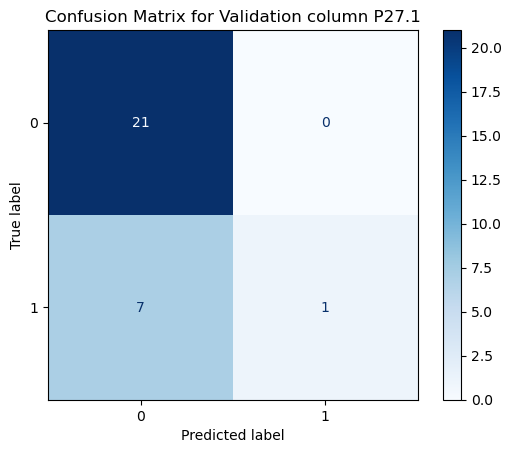

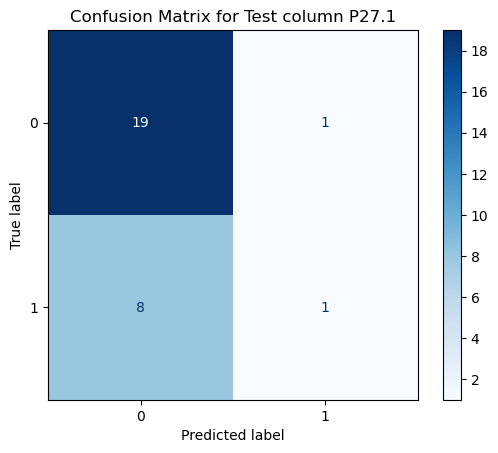

Fold 2/5
Best Parameters: {'n_neighbors': 4, 'p': 2, 'weights': 'uniform'}
Accuracy (Val): 0.72
Accuracy (Test): 0.79



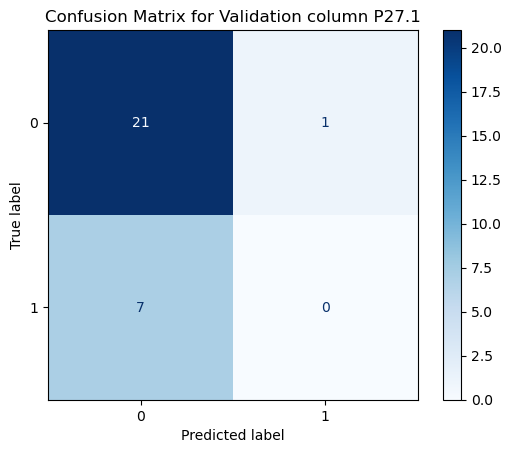

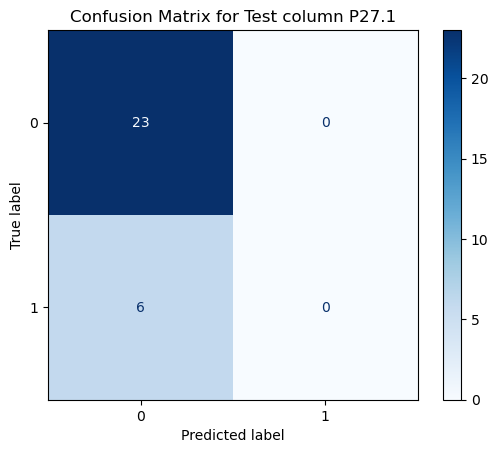

Fold 3/5
Best Parameters: {'n_neighbors': 4, 'p': 1, 'weights': 'uniform'}
Accuracy (Val): 0.72
Accuracy (Test): 0.79



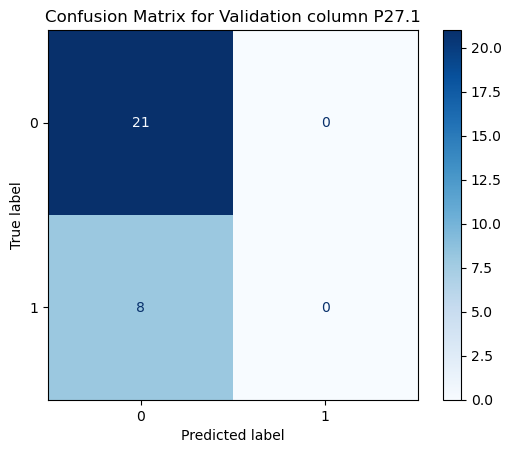

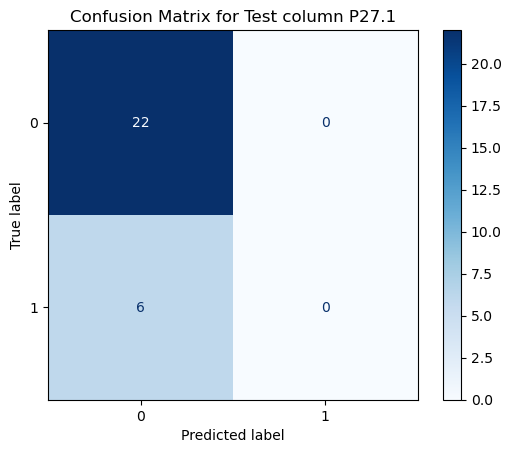

Fold 4/5
Best Parameters: {'n_neighbors': 3, 'p': 1, 'weights': 'distance'}
Accuracy (Val): 0.69
Accuracy (Test): 0.61



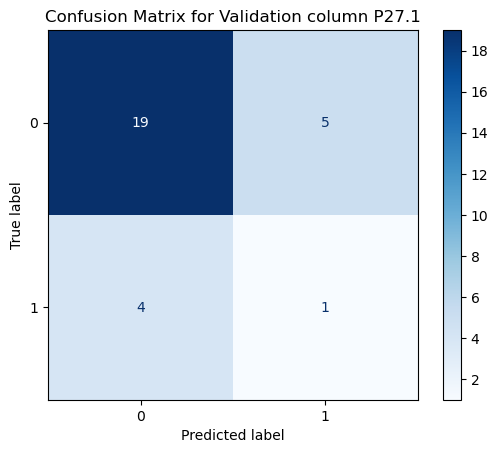

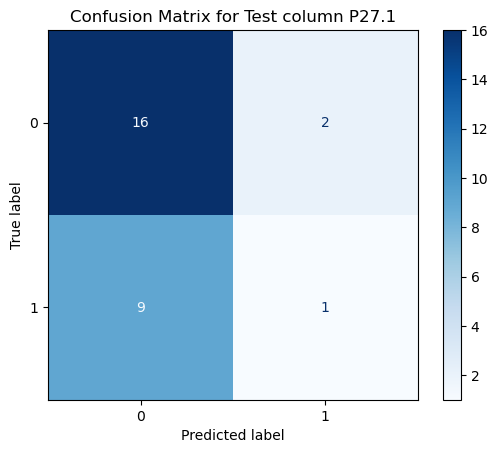

Fold 5/5
Best Parameters: {'n_neighbors': 4, 'p': 2, 'weights': 'uniform'}
Accuracy (Val): 0.79
Accuracy (Test): 0.82



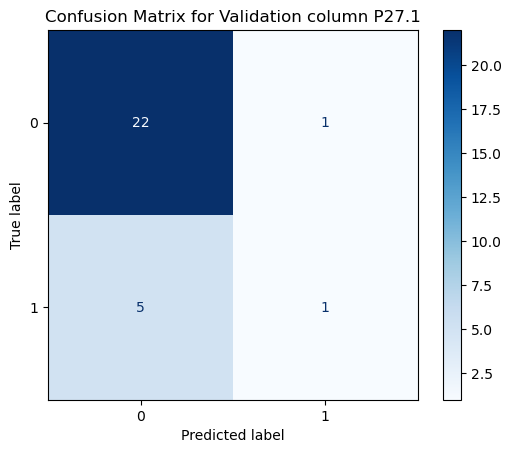

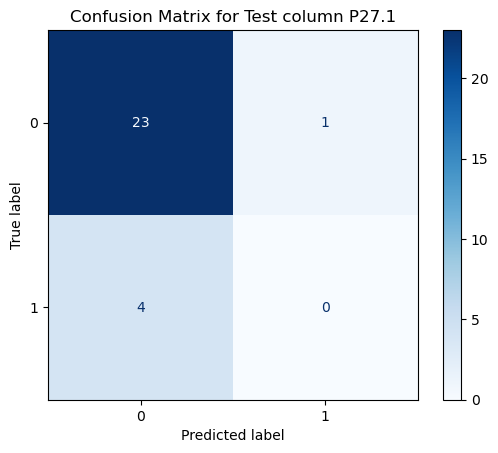

Training KNN model for H35.1 with 5-fold cross-validation
Fold 1/5
Best Parameters: {'n_neighbors': 3, 'p': 2, 'weights': 'uniform'}
Accuracy (Val): 0.83
Accuracy (Test): 0.93



/home/michaltajak/anaconda3/envs/tensorplease/lib/python3.9/site-packages/sklearn/model_selection/_split.py:684: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(


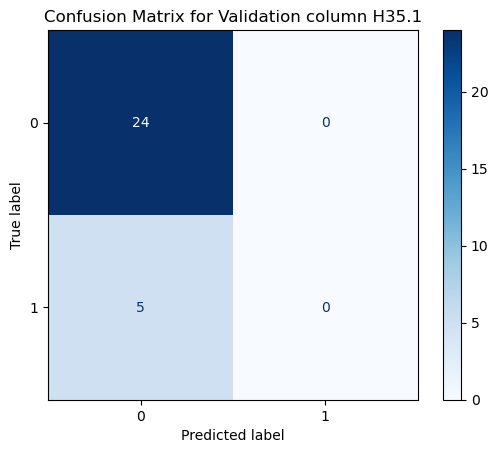

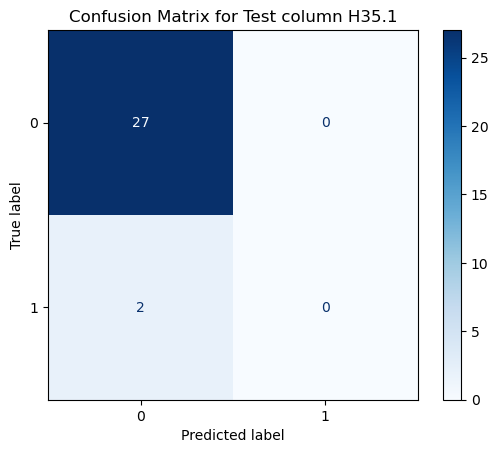

Fold 2/5
Best Parameters: {'n_neighbors': 4, 'p': 1, 'weights': 'uniform'}
Accuracy (Val): 0.86
Accuracy (Test): 0.97



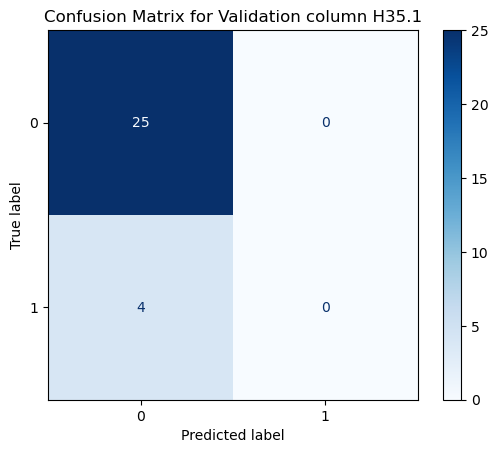

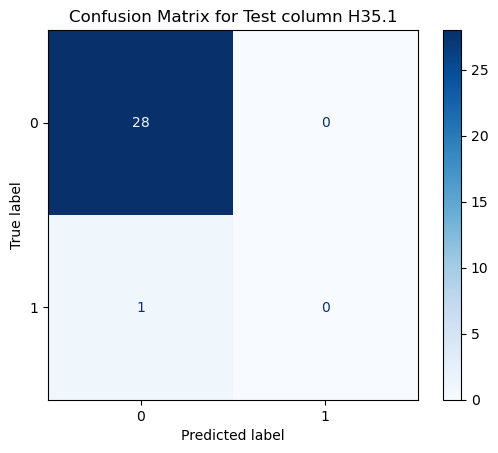

Fold 3/5
Best Parameters: {'n_neighbors': 3, 'p': 1, 'weights': 'uniform'}
Accuracy (Val): 0.90
Accuracy (Test): 0.96



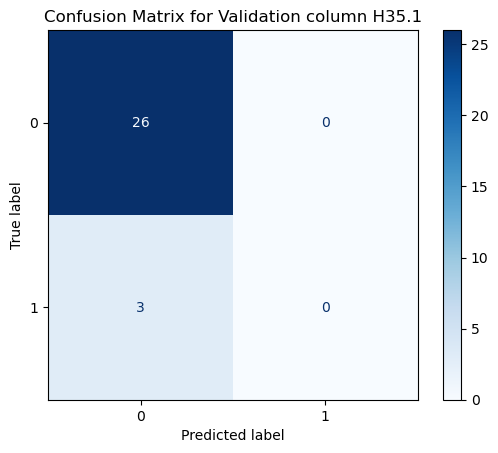

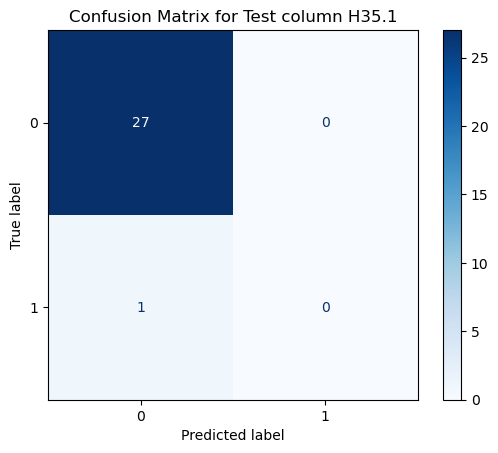

Fold 4/5
Best Parameters: {'n_neighbors': 3, 'p': 1, 'weights': 'uniform'}
Accuracy (Val): 0.90
Accuracy (Test): 0.82



/home/michaltajak/anaconda3/envs/tensorplease/lib/python3.9/site-packages/sklearn/model_selection/_split.py:684: UserWarning: The least populated class in y has only 3 members, which is less than n_splits=5.
  warnings.warn(


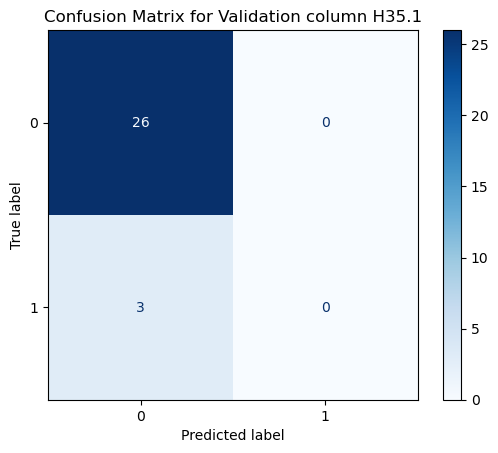

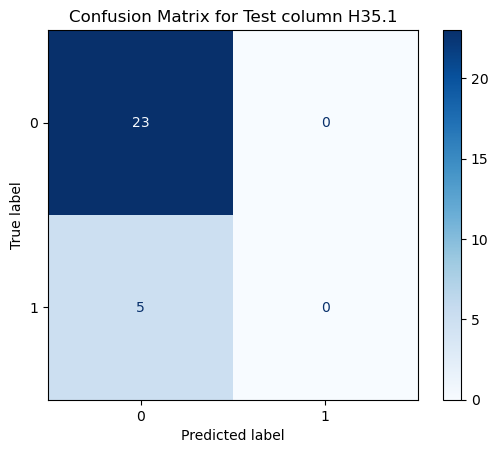

Fold 5/5
Best Parameters: {'n_neighbors': 4, 'p': 2, 'weights': 'uniform'}
Accuracy (Val): 1.00
Accuracy (Test): 0.89



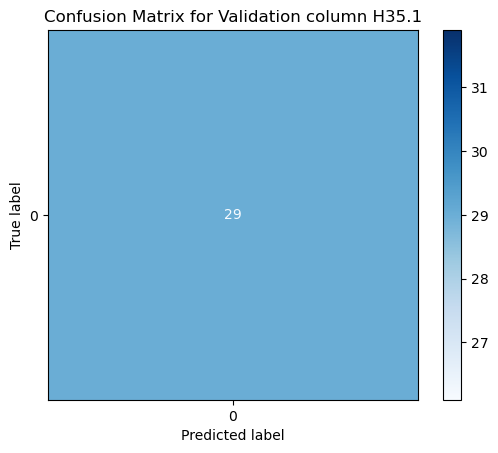

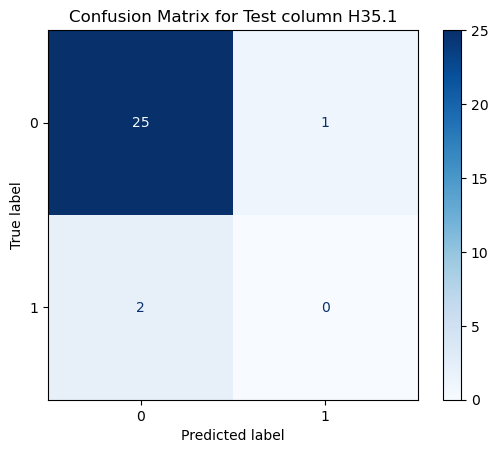

In [59]:
import pandas as pd
import numpy as np
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score, accuracy_score, confusion_matrix, f1_score, recall_score
from sklearn.model_selection import train_test_split, GridSearchCV, KFold
from sklearn.preprocessing import MinMaxScaler
from sklearn.neighbors import KNeighborsRegressor, KNeighborsClassifier
import seaborn as sns
import matplotlib.pyplot as plt

# Define regression and classification target columns
reg = ['HC - WYPI', 'HC (pc) -WYPI', 'HC (Z Score) -WYPI', 'dni  hospitalizacji']
cla = ['P27.1', 'H35.1']

# Hyperparameters grid for KNN regression
param_grid_knn_reg = {
    'n_neighbors': [2, 3, 5, 7, 9],  
    'weights': ['uniform', 'distance'],  
    'algorithm': ['auto', 'ball_tree', 'kd_tree', 'brute'], 
    'p': [1, 2]  
}

# Hyperparameters grid for KNN classification
param_grid_knn_cla = {
    'n_neighbors': [3, 4, 5],
    'weights': ['uniform', 'distance'],
    'p': [1, 2]  
}

def mean_absolute_percentage_error(y_true, y_pred):
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

# Updated function to evaluate KNN regression model
def evaluate_regression_model(X_train, X_val, X_test, y_train, y_val, y_test, model, param_grid, y_col):
    grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=5, n_jobs=-1, verbose=0)
    grid_search.fit(X_train, y_train)
    best_model = grid_search.best_estimator_

    # Training evaluation
    y_train_pred = best_model.predict(X_train)
    mae_train = mean_absolute_error(y_train, y_train_pred)
    r2_train = r2_score(y_train, y_train_pred)

    # Ocena modelu na zbiorze walidacyjnym
    y_val_pred = best_model.predict(X_val)
    mae_val = mean_absolute_error(y_val, y_val_pred)  # MAE dla walidacji
    mape_val = np.abs(mae_val / np.mean(y_val)) * 100
    r2_val = r2_score(y_val, y_val_pred)
    
    # Ocena modelu na zbiorze testowym
    y_test_pred = best_model.predict(X_test)
    mae_test = mean_absolute_error(y_test, y_test_pred)  # MAE dla testu
    mape_test = np.abs(mae_test / np.mean(y_test)) * 100
    r2_test = r2_score(y_test, y_test_pred)
    
    best_params = grid_search.best_params_
    print(f"Best parameters: {best_params}")
    print(f"MAE (Val): {mae_val:.4f}, MAPE (Val): {mape_val:.2f}%")
    print(f"MAE (Test): {mae_test:.4f}, MAPE (Test): {mape_test:.2f}%\n")

    plt.figure(figsize=(12, 5))

    plt.subplot(1, 2, 1)
    sns.scatterplot(x=np.arange(len(y_val)), y=y_val, color='green', label='Actual')
    sns.scatterplot(x=np.arange(len(y_val)), y=y_val_pred, color='red', label='Predicted')
    plt.xlabel('Sample Index')
    plt.ylabel('Values')
    plt.title(f'Validation Set for {y_col}')
    plt.legend()
    plt.grid()
    
    plt.subplot(1, 2, 2)
    sns.scatterplot(x=np.arange(len(y_test)), y=y_test, color='green', label='Actual')
    sns.scatterplot(x=np.arange(len(y_test)), y=y_test_pred, color='blue', label='Predicted')
    plt.xlabel('Sample Index')
    plt.ylabel('Values')
    plt.title(f'Test Set for {y_col}')
    plt.legend()
    plt.grid()
    
    plt.tight_layout()
    plt.show()
    
    return grid_search.best_params_, mae_train, r2_train, mae_val, r2_val, mae_test, r2_test, mape_val, mape_test

# Cross-validation for KNN regression
def cross_validate_regression(X, y, model, param_grid, cv=5):
    X = X.values
    kf = KFold(n_splits=cv, shuffle=True, random_state=43)
    scaler = MinMaxScaler()
    X_scaled = scaler.fit_transform(X)
    
    fold = 1
    for train_idx, test_idx in kf.split(X_scaled):
        print(f"Fold {fold}/{cv}")
        X_train, X_test = X_scaled[train_idx], X_scaled[test_idx]
        y_train, y_test = y.iloc[train_idx], y.iloc[test_idx]
        X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.25, random_state=43)
        
        best_params, mae_train, r2_train, mae_val, r2_val, mae_test, r2_test, mape_val, mape_test = evaluate_regression_model(
            X_train, X_val, X_test, y_train, y_val, y_test, model, param_grid, y.name)
        

        fold += 1

# Loop through regression targets with KNN
for y_col in reg:
    print(f"Training KNN model for {y_col} with 5-fold cross-validation")
    model = KNeighborsRegressor()
    cross_validate_regression(X, y[y_col], model, param_grid_knn_reg, cv=5)

# KNN classification evaluation function
def evaluate_classification_model(X_train, X_val, X_test, y_train, y_val, y_test, model, param_grid):
    grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=5, n_jobs=-1, verbose=0)
    grid_search.fit(X_train, y_train)
    best_model = grid_search.best_estimator_

    # Training evaluation
    y_train_pred = best_model.predict(X_train)
    f1_train = f1_score(y_train, y_train_pred, average='weighted')
    accuracy_train = accuracy_score(y_train, y_train_pred)

    # Validation evaluation
    y_val_pred = best_model.predict(X_val)
    f1_val = f1_score(y_val, y_val_pred, average='weighted')
    accuracy_val = accuracy_score(y_val, y_val_pred)

    # Test evaluation
    y_test_pred = best_model.predict(X_test)
    f1_test = f1_score(y_test, y_test_pred, average='weighted')
    accuracy_test = accuracy_score(y_test, y_test_pred)

    best_params = grid_search.best_params_

    print(f"Best Parameters: {best_params}")
    print(f"Accuracy (Val): {accuracy_val:.2f}")
    print(f"Accuracy (Test): {accuracy_test:.2f}\n")

    cm_val = confusion_matrix(y_val, y_val_pred)
    cm_test = confusion_matrix(y_test, y_test_pred)
        
    disp_val = ConfusionMatrixDisplay(confusion_matrix=cm_val)
    disp_val.plot(cmap='Blues', values_format='d')
    plt.title(f'Confusion Matrix for Validation column {y_col}')
    plt.show()
        
    disp_test = ConfusionMatrixDisplay(confusion_matrix=cm_test)
    disp_test.plot(cmap='Blues', values_format='d')
    plt.title(f"Confusion Matrix for Test column {y_col}")
    plt.show()

    return grid_search.best_params_, f1_train, f1_val, f1_test, accuracy_train, accuracy_val, accuracy_test

# Cross-validation for KNN classification
def cross_validate_classification(X, y, model, param_grid, cv=5):
    X = X.values
    kf = KFold(n_splits=cv, shuffle=True, random_state=43)
    scaler = MinMaxScaler()
    X_scaled = scaler.fit_transform(X)
    
    fold = 1
    for train_idx, test_idx in kf.split(X_scaled):
        print(f"Fold {fold}/{cv}")
        X_train, X_test = X_scaled[train_idx], X_scaled[test_idx]
        y_train, y_test = y.iloc[train_idx], y.iloc[test_idx]
        X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.25, random_state=43)
        
        best_params, f1_train, f1_val, f1_test, accuracy_train, accuracy_val, accuracy_test = evaluate_classification_model(
            X_train, X_val, X_test, y_train, y_val, y_test, model, param_grid)
        
        
        
        fold += 1

# Loop through classification targets with KNN
for y_col in cla:
    print(f"Training KNN model for {y_col} with 5-fold cross-validation")
    model = KNeighborsClassifier()
    cross_validate_classification(X, y[y_col], model, param_grid_knn_cla, cv=5)


### KNN cla

Training model for column P27.1 with 5-fold cross-validation
Fold 1/5
Shapes -> X_train: (80, 30), y_train: (80,), X_val: (27, 30), y_val: (27,), X_test: (29, 30), y_test: (29,)
Best Parameters: {'n_neighbors': 4, 'p': 1, 'weights': 'uniform'}
F1-score (Train): 0.71
F1-score (Val): 0.64
F1-score (Test): 0.61

f1: 0.18



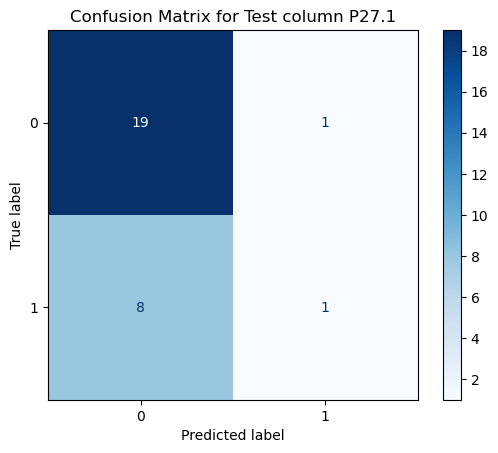

Fold 2/5
Shapes -> X_train: (80, 30), y_train: (80,), X_val: (27, 30), y_val: (27,), X_test: (29, 30), y_test: (29,)
Best Parameters: {'n_neighbors': 4, 'p': 1, 'weights': 'distance'}
F1-score (Train): 1.00
F1-score (Val): 0.63
F1-score (Test): 0.85

f1: 0.60



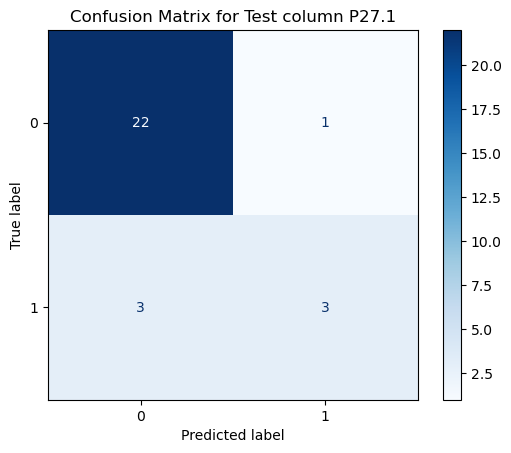

Fold 3/5
Shapes -> X_train: (81, 30), y_train: (81,), X_val: (27, 30), y_val: (27,), X_test: (28, 30), y_test: (28,)
Best Parameters: {'n_neighbors': 4, 'p': 1, 'weights': 'distance'}
F1-score (Train): 1.00
F1-score (Val): 0.62
F1-score (Test): 0.64

f1: nan



/tmp/ipykernel_54919/2119150770.py:103: RuntimeWarning: invalid value encountered in scalar divide
  f1 = 2 * (precision * recall) / (precision + recall)


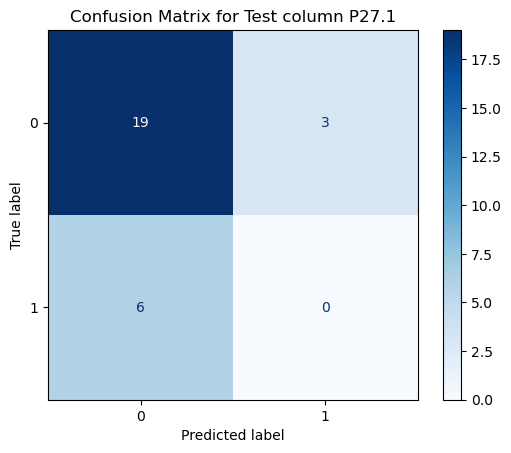

Fold 4/5
Shapes -> X_train: (81, 30), y_train: (81,), X_val: (27, 30), y_val: (27,), X_test: (28, 30), y_test: (28,)
Best Parameters: {'n_neighbors': 3, 'p': 1, 'weights': 'uniform'}
F1-score (Train): 0.89
F1-score (Val): 0.66
F1-score (Test): 0.58

f1: 0.18



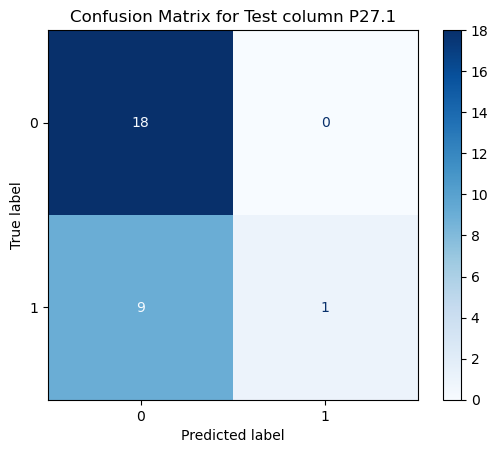

Fold 5/5
Shapes -> X_train: (81, 30), y_train: (81,), X_val: (27, 30), y_val: (27,), X_test: (28, 30), y_test: (28,)
Best Parameters: {'n_neighbors': 4, 'p': 2, 'weights': 'uniform'}
F1-score (Train): 0.75
F1-score (Val): 0.68
F1-score (Test): 0.75

f1: nan



/tmp/ipykernel_54919/2119150770.py:103: RuntimeWarning: invalid value encountered in scalar divide
  f1 = 2 * (precision * recall) / (precision + recall)


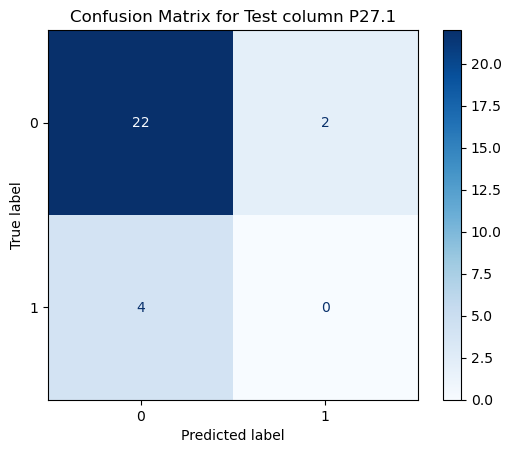

Training model for column H35.1 with 5-fold cross-validation
Fold 1/5
Shapes -> X_train: (80, 30), y_train: (80,), X_val: (27, 30), y_val: (27,), X_test: (29, 30), y_test: (29,)


/tmp/ipykernel_54919/2119150770.py:99: RuntimeWarning: invalid value encountered in scalar divide
  precision = TP / (TP + FP)


Best Parameters: {'n_neighbors': 4, 'p': 1, 'weights': 'uniform'}
F1-score (Train): 0.89
F1-score (Val): 0.84
F1-score (Test): 0.90

f1: nan



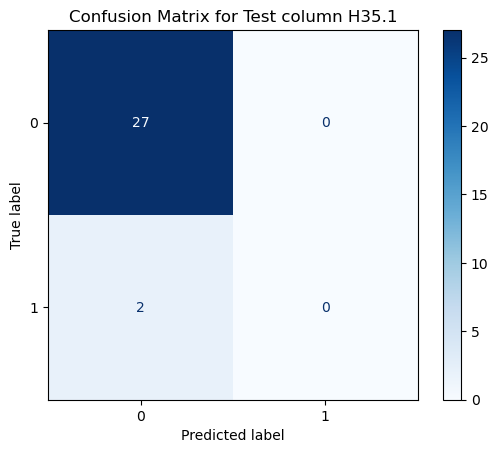

Fold 2/5
Shapes -> X_train: (80, 30), y_train: (80,), X_val: (27, 30), y_val: (27,), X_test: (29, 30), y_test: (29,)
Best Parameters: {'n_neighbors': 4, 'p': 1, 'weights': 'uniform'}
F1-score (Train): 0.85
F1-score (Val): 0.89
F1-score (Test): 0.95

f1: nan



/tmp/ipykernel_54919/2119150770.py:99: RuntimeWarning: invalid value encountered in scalar divide
  precision = TP / (TP + FP)


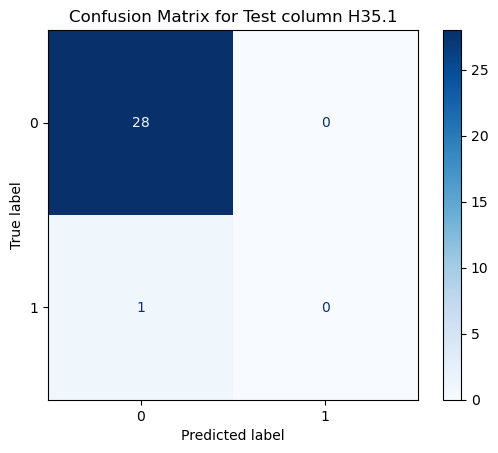

Fold 3/5
Shapes -> X_train: (81, 30), y_train: (81,), X_val: (27, 30), y_val: (27,), X_test: (28, 30), y_test: (28,)
Best Parameters: {'n_neighbors': 3, 'p': 2, 'weights': 'uniform'}
F1-score (Train): 0.85
F1-score (Val): 0.87
F1-score (Test): 0.95

f1: nan



/tmp/ipykernel_54919/2119150770.py:99: RuntimeWarning: invalid value encountered in scalar divide
  precision = TP / (TP + FP)


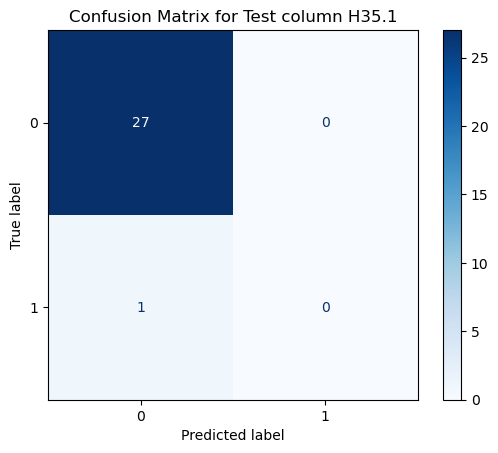

Fold 4/5
Shapes -> X_train: (81, 30), y_train: (81,), X_val: (27, 30), y_val: (27,), X_test: (28, 30), y_test: (28,)


/home/michaltajak/anaconda3/envs/tensorplease/lib/python3.9/site-packages/sklearn/model_selection/_split.py:684: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(


Best Parameters: {'n_neighbors': 3, 'p': 1, 'weights': 'uniform'}
F1-score (Train): 0.93
F1-score (Val): 0.89
F1-score (Test): 0.74

f1: nan



/tmp/ipykernel_54919/2119150770.py:99: RuntimeWarning: invalid value encountered in scalar divide
  precision = TP / (TP + FP)


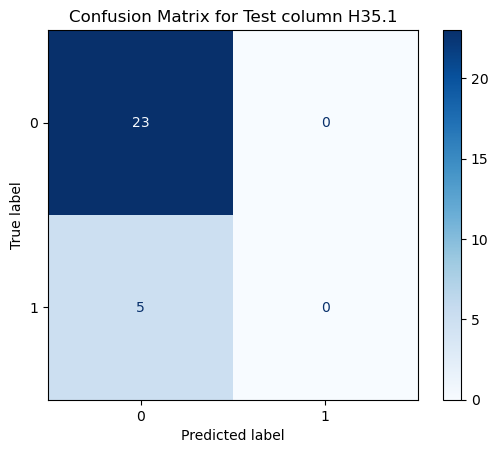

Fold 5/5
Shapes -> X_train: (81, 30), y_train: (81,), X_val: (27, 30), y_val: (27,), X_test: (28, 30), y_test: (28,)
Best Parameters: {'n_neighbors': 4, 'p': 2, 'weights': 'uniform'}
F1-score (Train): 0.84
F1-score (Val): 0.98
F1-score (Test): 0.88

f1: nan



/tmp/ipykernel_54919/2119150770.py:103: RuntimeWarning: invalid value encountered in scalar divide
  f1 = 2 * (precision * recall) / (precision + recall)


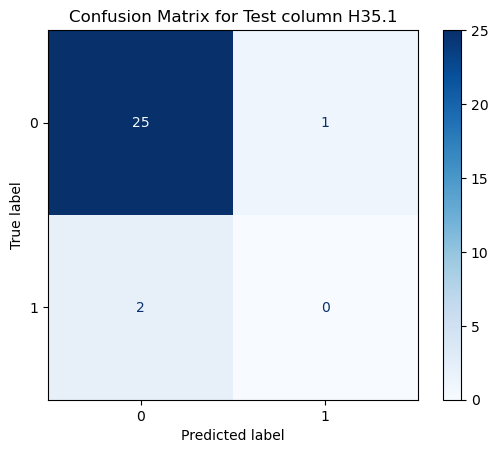

In [24]:
import pandas as pd
import numpy as np
from sklearn.metrics import f1_score, confusion_matrix, ConfusionMatrixDisplay
from sklearn.model_selection import train_test_split, GridSearchCV, KFold
from sklearn.preprocessing import MinMaxScaler
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import IsolationForest
import matplotlib.pyplot as plt

# Define regression and classification target columns
reg = ['HC - WYPI', 'HC (pc) -WYPI', 'HC (Z Score) -WYPI', 'dni  hospitalizacji']
cla = ['P27.1', 'H35.1']

# Hyperparameters grid for KNN classification
param_grid_knn_cla = {
    'n_neighbors': [3, 4],
    'weights': ['uniform', 'distance'],
    'p': [1, 2]  
}

# Function to detect anomalies using Isolation Forest
def detect_anomalies(X, contamination=0.05):
    """
    Detect anomalies using Isolation Forest method.
    
    Parameters:
    X: Feature matrix (numpy array or DataFrame)
    contamination: Proportion of outliers in the data
    
    Returns:
    anomalies: Indices of the detected anomalies
    """
    model = IsolationForest(contamination=contamination, random_state=43)
    model.fit(X)
    predictions = model.predict(X)
    
    # Anomalies are marked as -1
    anomalies = np.where(predictions == -1)[0]
    
    return anomalies

# Evaluation function for classification model
def evaluate_classification_model(X_train, X_val, X_test, y_train, y_val, y_test, model, param_grid):
    # Use F1-score as the scoring metric
    grid_search = GridSearchCV(estimator=model, param_grid=param_grid, scoring='f1_weighted', cv=5, n_jobs=-1, verbose=0)
    grid_search.fit(X_train, y_train)
    
    best_model = grid_search.best_estimator_
    
    f1_train = f1_score(y_train, best_model.predict(X_train), average='weighted')
    f1_val = f1_score(y_val, best_model.predict(X_val), average='weighted')
    f1_test = f1_score(y_test, best_model.predict(X_test), average='weighted')
    
    return grid_search.best_params_, f1_train, f1_val, f1_test, best_model

# Cross-validation with 5 folds for classification
def cross_validate_classification(X, y, model, param_grid, cv=5):
    X = X.values
    kf = KFold(n_splits=cv, shuffle=True, random_state=43)
    
    scaler = MinMaxScaler()
    X_scaled = scaler.fit_transform(X)
    
    fold = 1
    for train_idx, test_idx in kf.split(X_scaled):
        print(f"Fold {fold}/{cv}")
        X_train, X_test = X_scaled[train_idx], X_scaled[test_idx]
        y_train, y_test = y.iloc[train_idx], y.iloc[test_idx]
        
        # Detect and remove anomalies from the training set
        anomalies_train = detect_anomalies(X_train)
        X_train_cleaned = np.delete(X_train, anomalies_train, axis=0)
        y_train_cleaned = np.delete(y_train.values, anomalies_train, axis=0)
        
        # Further split the training data into train/val sets
        X_train, X_val, y_train, y_val = train_test_split(X_train_cleaned, y_train_cleaned, test_size=0.25, random_state=43)
        
        # Check shapes to debug
        print(f"Shapes -> X_train: {X_train.shape}, y_train: {y_train.shape}, X_val: {X_val.shape}, y_val: {y_val.shape}, X_test: {X_test.shape}, y_test: {y_test.shape}")
        
        # Get the best model and metrics
        best_params, f1_train, f1_val, f1_test, best_model = evaluate_classification_model(
            X_train, X_val, X_test, y_train, y_val, y_test, model, param_grid)
        
        print(f"Best Parameters: {best_params}")
        print(f"F1-score (Train): {f1_train:.2f}")
        print(f"F1-score (Val): {f1_val:.2f}")
        print(f"F1-score (Test): {f1_test:.2f}\n")
        
        # Get predictions for validation and test sets
        y_val_pred = best_model.predict(X_val)
        y_test_pred = best_model.predict(X_test)
        
        # Calculate confusion matrix for validation and test sets
        cm_val = confusion_matrix(y_val, y_val_pred)
        cm_test = confusion_matrix(y_test, y_test_pred)
        
        TN, FP, FN, TP = cm_test.ravel()
        precision = TP / (TP + FP)
        recall = TP / (TP + FN)
        
        # Obliczanie F1 score
        f1 = 2 * (precision * recall) / (precision + recall)
        print(f"f1: {f1:.2f}\n")
            
        disp_test = ConfusionMatrixDisplay(confusion_matrix=cm_test)
        disp_test.plot(cmap='Blues', values_format='d')
        plt.title(f"Confusion Matrix for Test column {y_col}")
        plt.show()

        fold += 1

# Loop through classification targets with 5-fold cross-validation
for y_col in cla:
    print(f"Training model for column {y_col} with 5-fold cross-validation")
    model = KNeighborsClassifier()
    cross_validate_classification(X, y[y_col], model, param_grid_knn_cla, cv=5)


### LinearRegression + LogisticRegression

Training Ridge Regression model for HC - WYPI with Grid Search
Best alpha: 1, Best R2 score (CV): -0.2036
Fold 1:
MAE (Val): 2.0620, MAPE (Val): 6.58%, R2 (Val): -0.4043
MAE (Test): 2.1166, MAPE (Test): 6.73%, R2 (Test): -0.1339



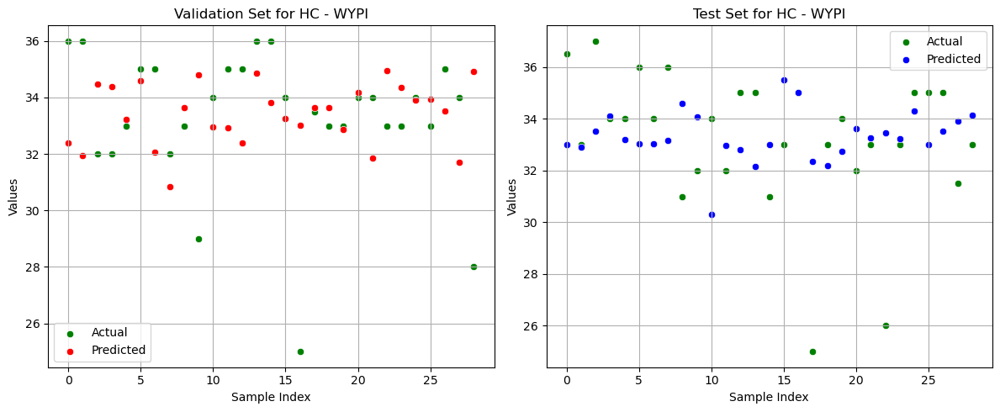

Fold 2:
MAE (Val): 1.5427, MAPE (Val): 4.61%, R2 (Val): -0.4822
MAE (Test): 1.7407, MAPE (Test): 5.40%, R2 (Test): -0.1280



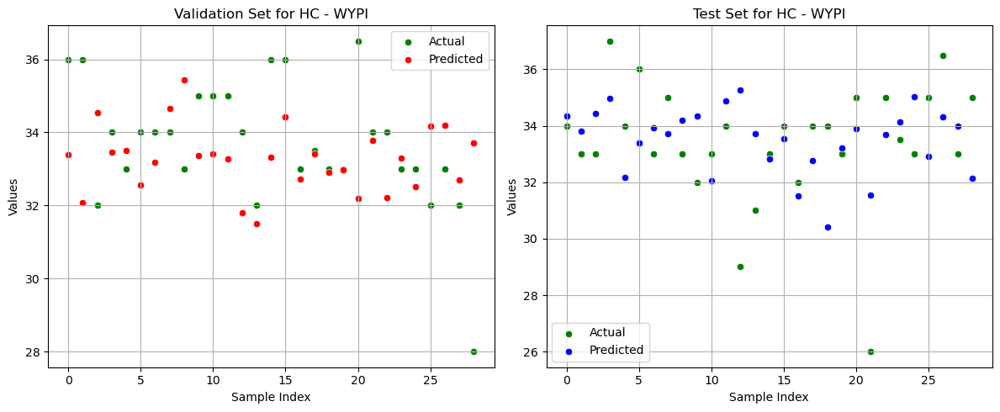

Fold 3:
MAE (Val): 2.0495, MAPE (Val): 6.17%, R2 (Val): -0.4089
MAE (Test): 1.6425, MAPE (Test): 5.24%, R2 (Test): -0.0313



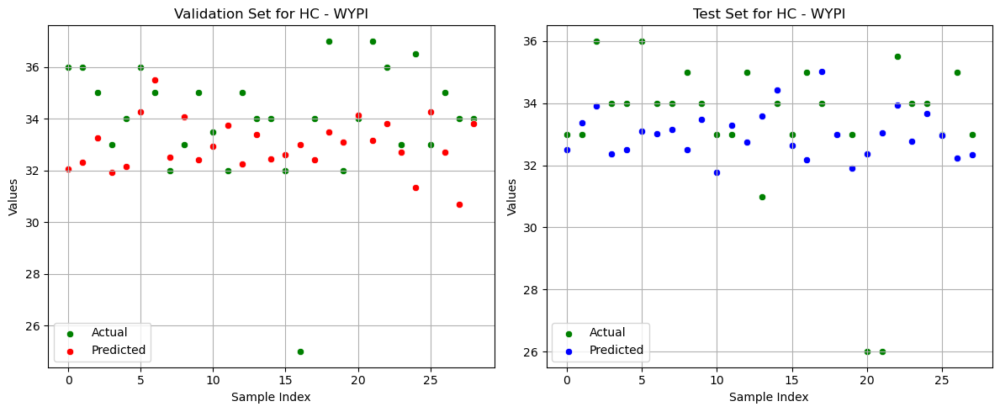

Fold 4:
MAE (Val): 2.2845, MAPE (Val): 6.92%, R2 (Val): -0.6847
MAE (Test): 2.0195, MAPE (Test): 5.99%, R2 (Test): -1.1246



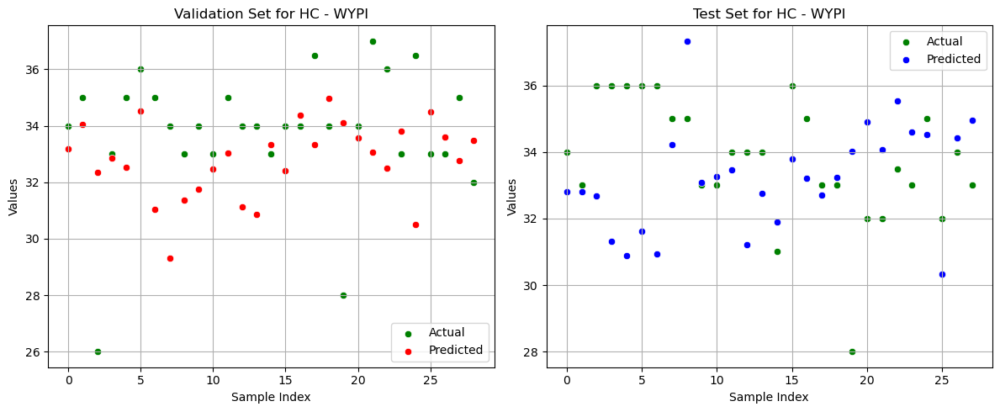

Fold 5:
MAE (Val): 1.8438, MAPE (Val): 6.01%, R2 (Val): -0.0318
MAE (Test): 2.0782, MAPE (Test): 6.91%, R2 (Test): -0.0579



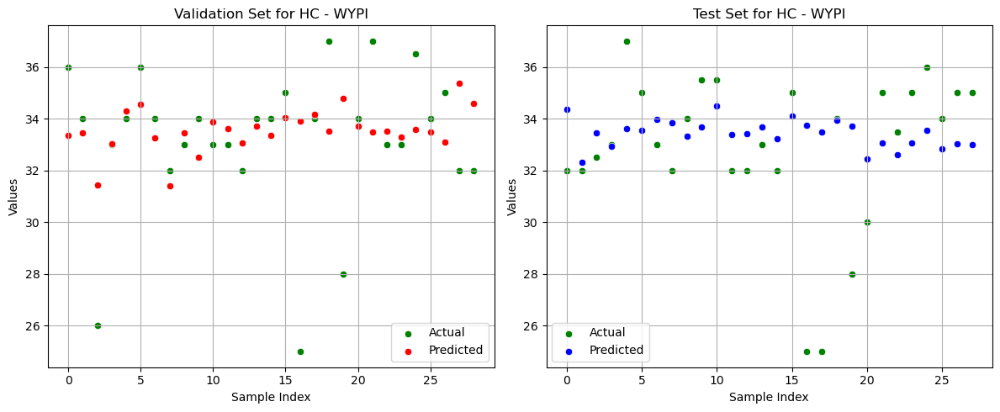

Training Ridge Regression model for HC (pc) -WYPI with Grid Search
Best alpha: 1, Best R2 score (CV): -0.0723
Fold 1:
MAE (Val): 19.9005, MAPE (Val): 1092641993.88%, R2 (Val): -0.1858
MAE (Test): 27.9413, MAPE (Test): 556744939.11%, R2 (Test): -0.3100



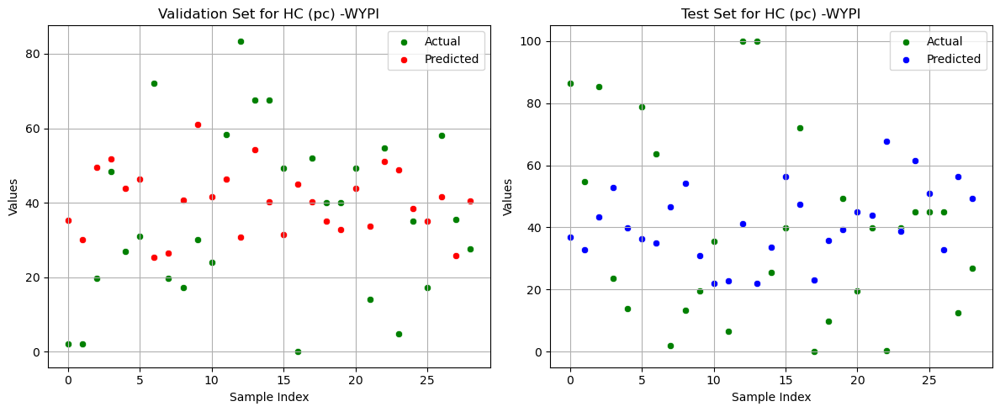

Fold 2:
MAE (Val): 25.8718, MAPE (Val): 185.09%, R2 (Val): -0.2929
MAE (Test): 16.8120, MAPE (Test): 306.94%, R2 (Test): 0.1377



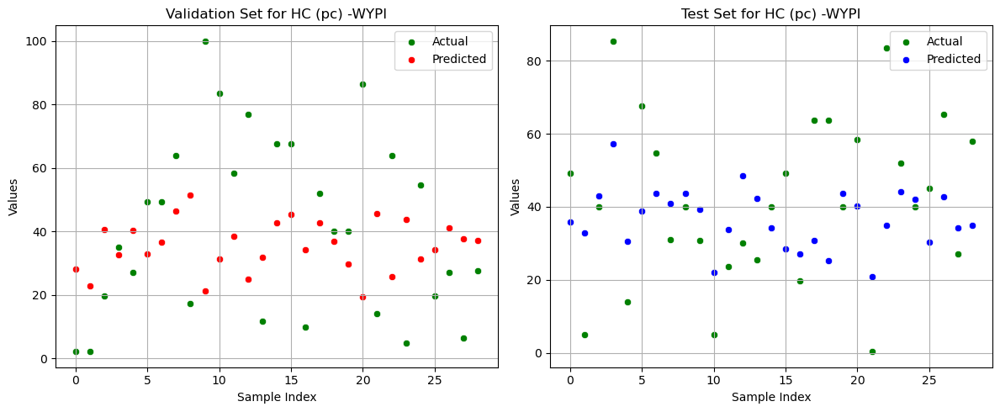

Fold 3:
MAE (Val): 29.1644, MAPE (Val): 638518779.92%, R2 (Val): -0.1159
MAE (Test): 20.8915, MAPE (Test): 804.63%, R2 (Test): -0.0670



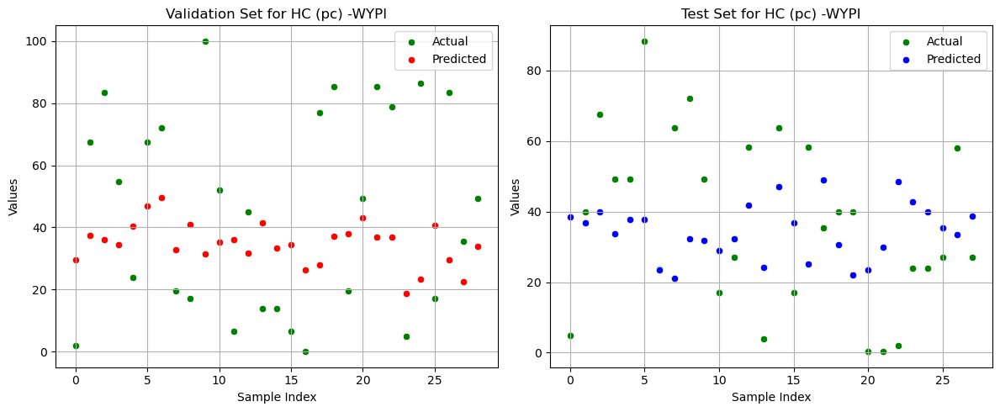

Fold 4:
MAE (Val): 25.8397, MAPE (Val): 579.87%, R2 (Val): -0.4494
MAE (Test): 17.5174, MAPE (Test): 192.00%, R2 (Test): 0.0993



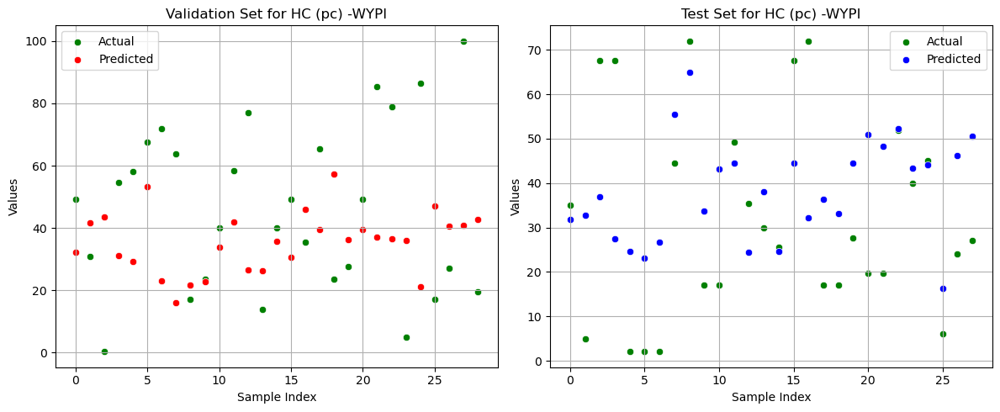

Fold 5:
MAE (Val): 20.4355, MAPE (Val): 800640080.66%, R2 (Val): 0.1116
MAE (Test): 23.3701, MAPE (Test): 1960678384.40%, R2 (Test): -0.0467



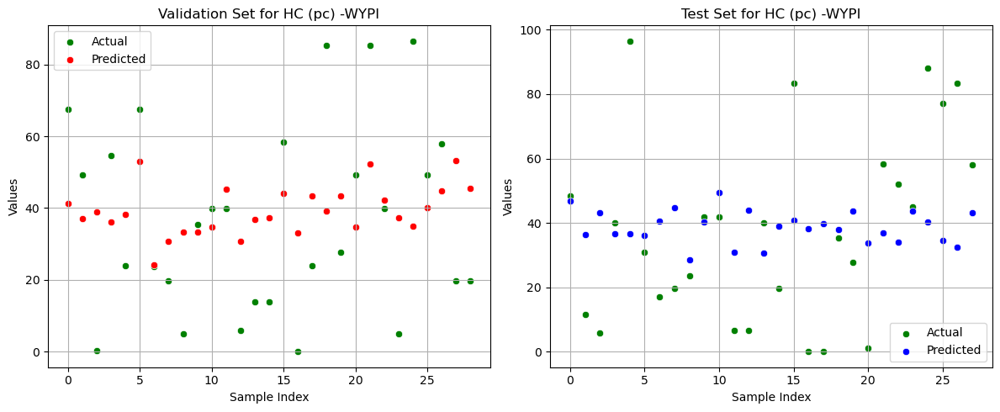

Training Ridge Regression model for HC (Z Score) -WYPI with Grid Search
Best alpha: 1, Best R2 score (CV): -0.1667
Fold 1:
MAE (Val): 0.8010, MAPE (Val): 233.16%, R2 (Val): -0.1263
MAE (Test): 1.4613, MAPE (Test): 245.53%, R2 (Test): -0.1149



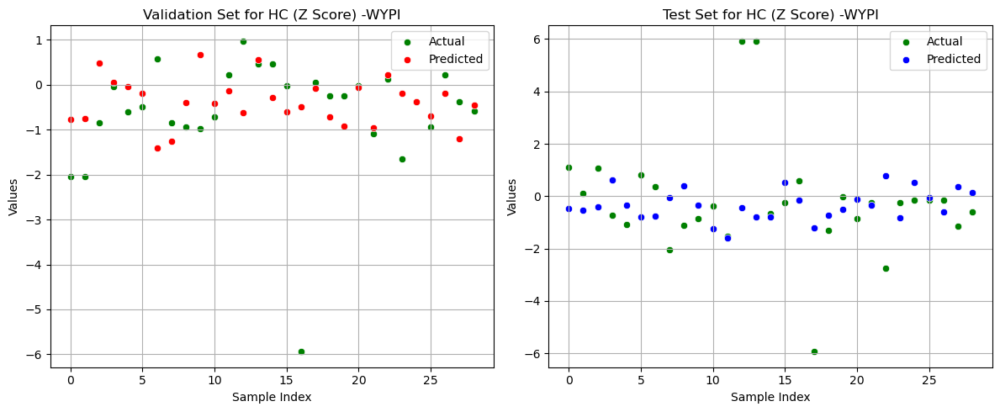

Fold 2:
MAE (Val): 1.0251, MAPE (Val): 393.64%, R2 (Val): -0.1813
MAE (Test): 0.6311, MAPE (Test): 458.23%, R2 (Test): -0.0422



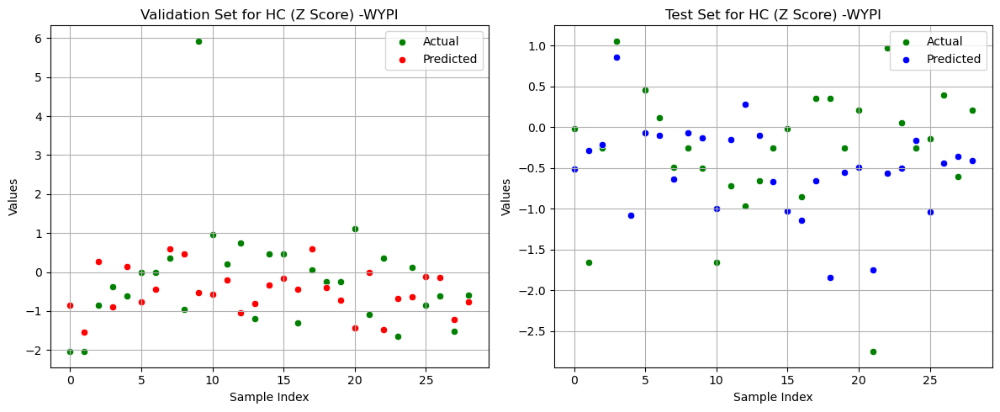

Fold 3:
MAE (Val): 1.2634, MAPE (Val): 322.49%, R2 (Val): -0.0525
MAE (Test): 0.8438, MAPE (Test): 526.20%, R2 (Test): -0.2063



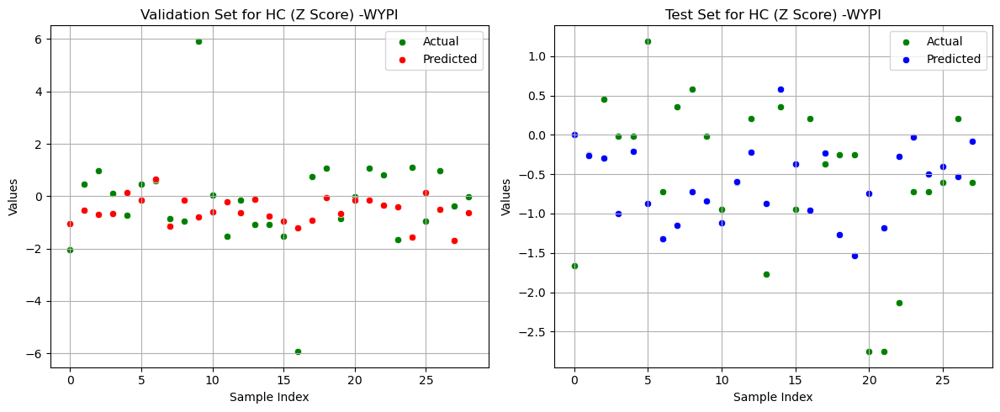

Fold 4:
MAE (Val): 1.2291, MAPE (Val): 494.91%, R2 (Val): -0.6749
MAE (Test): 0.7651, MAPE (Test): 276.85%, R2 (Test): -0.3330



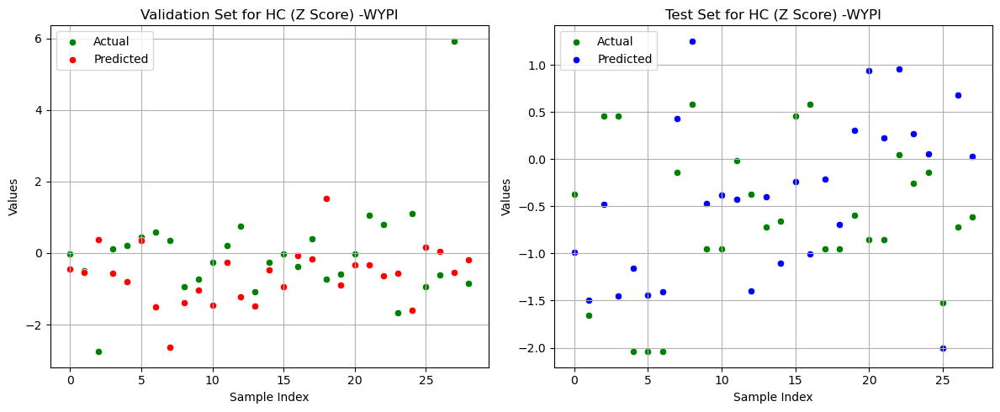

Fold 5:
MAE (Val): 0.9446, MAPE (Val): 348.60%, R2 (Val): -0.0844
MAE (Test): 1.0982, MAPE (Test): 146.19%, R2 (Test): -0.0864



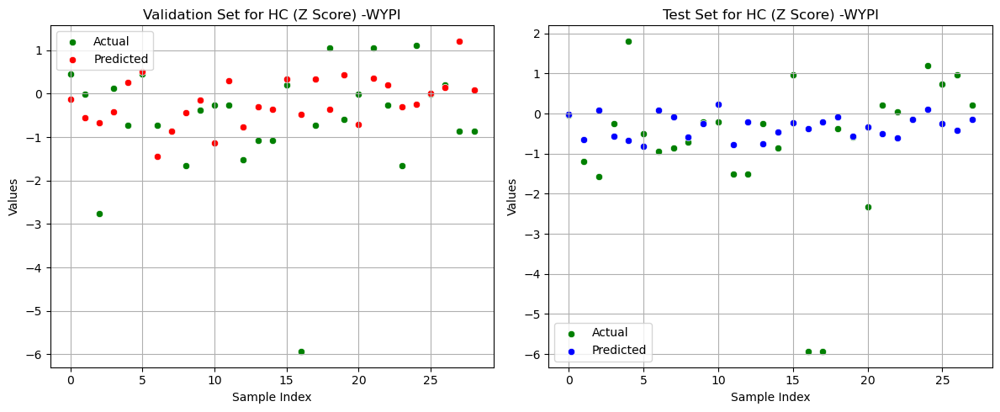

Training Ridge Regression model for dni  hospitalizacji with Grid Search
Best alpha: 1, Best R2 score (CV): 0.0395
Fold 1:
MAE (Val): 30.5463, MAPE (Val): 119.93%, R2 (Val): -0.1451
MAE (Test): 29.0192, MAPE (Test): 94.21%, R2 (Test): -0.2819



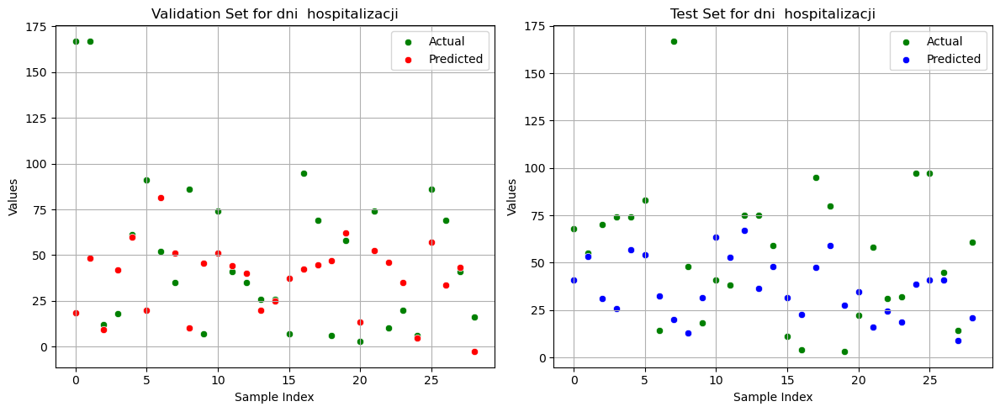

Fold 2:
MAE (Val): 25.4614, MAPE (Val): 141.55%, R2 (Val): 0.2241
MAE (Test): 23.4239, MAPE (Test): 277.58%, R2 (Test): 0.0472



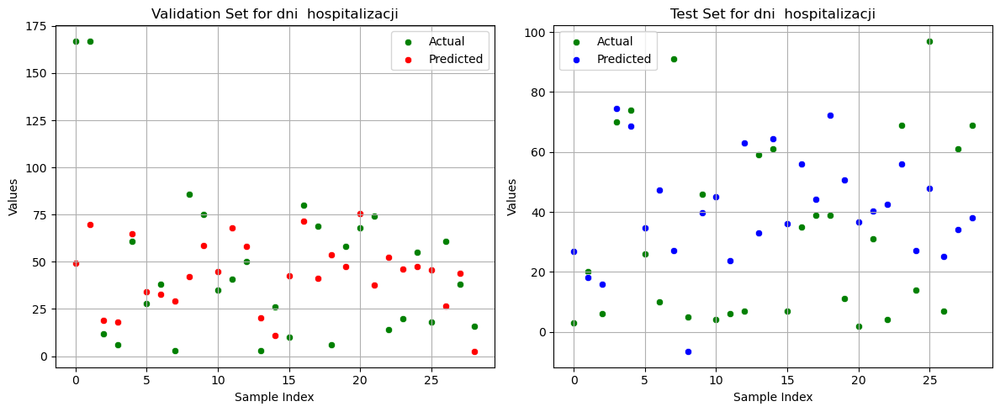

Fold 3:
MAE (Val): 25.2025, MAPE (Val): 181.02%, R2 (Val): 0.2074
MAE (Test): 22.4541, MAPE (Test): 212.21%, R2 (Test): -0.0963



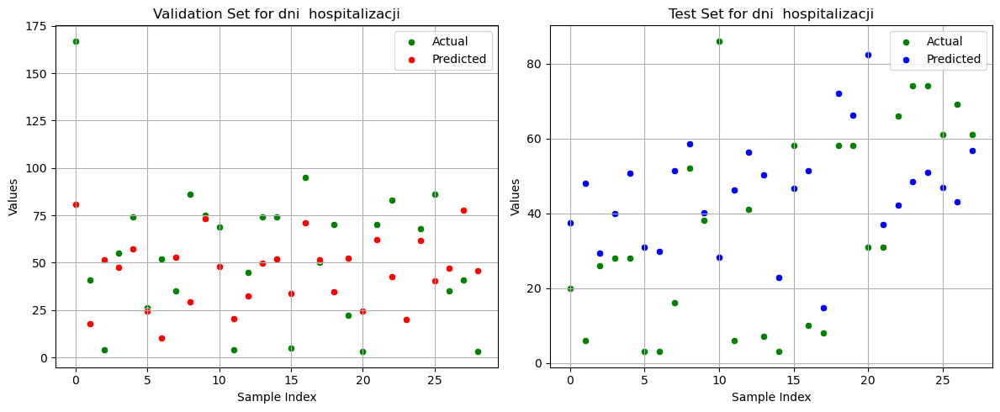

Fold 4:
MAE (Val): 22.4274, MAPE (Val): 120.53%, R2 (Val): 0.0861
MAE (Test): 29.5832, MAPE (Test): 106.93%, R2 (Test): 0.1691



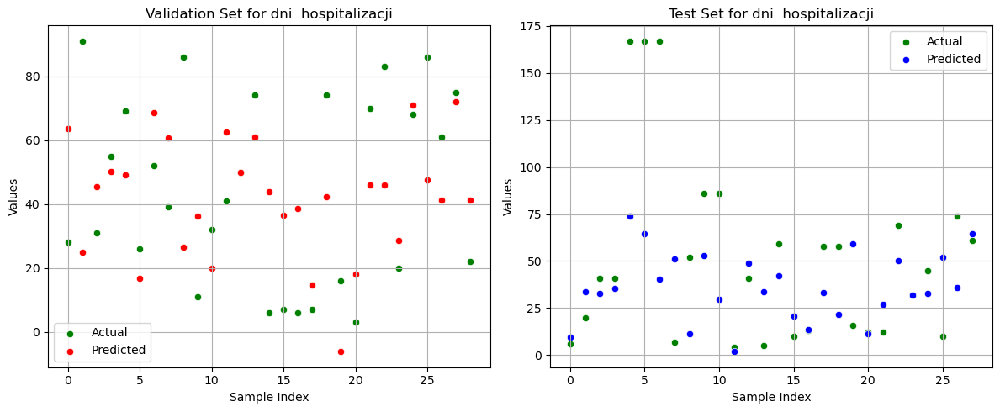

Fold 5:
MAE (Val): 21.2590, MAPE (Val): 191.75%, R2 (Val): -0.0538
MAE (Test): 26.7198, MAPE (Test): 275.51%, R2 (Test): 0.1805



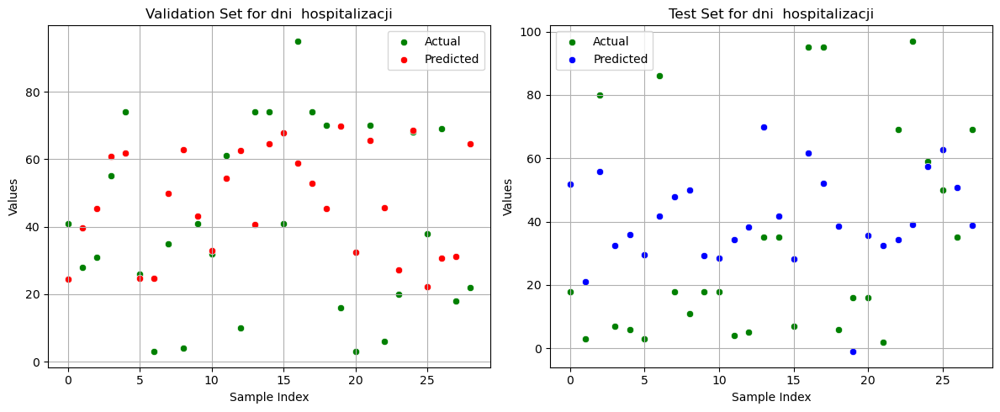

Training Logistic Regression model for P27.1 with 5-fold cross-validation
Fold 1:
Accuracy (Val): 0.69, F1 Score (Val): 0.59
Accuracy (Test): 0.69, F1 Score (Test): 0.56



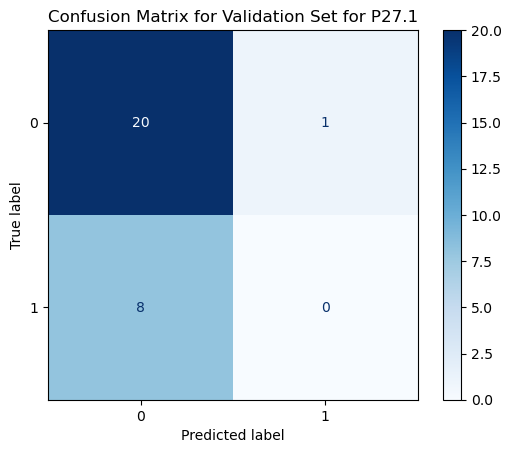

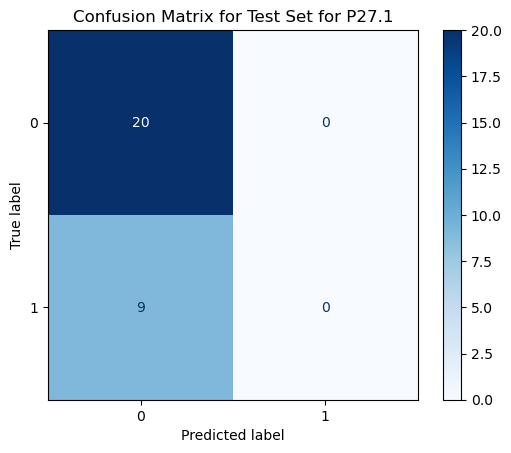

Fold 2:
Accuracy (Val): 0.76, F1 Score (Val): 0.65
Accuracy (Test): 0.79, F1 Score (Test): 0.70



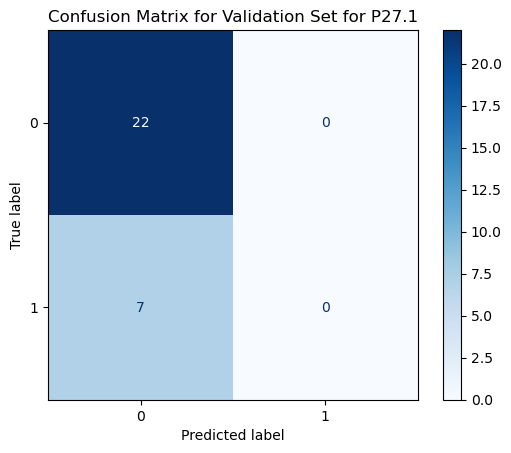

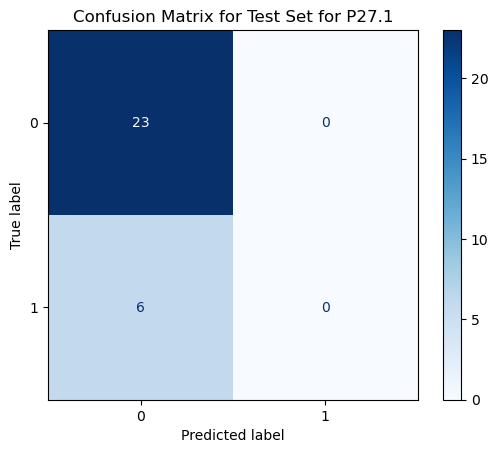

Fold 3:
Accuracy (Val): 0.72, F1 Score (Val): 0.61
Accuracy (Test): 0.79, F1 Score (Test): 0.69



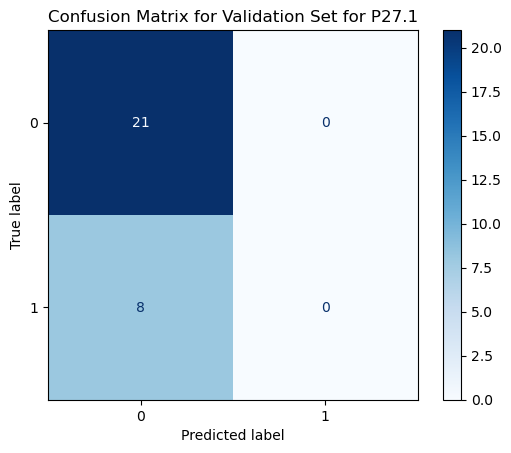

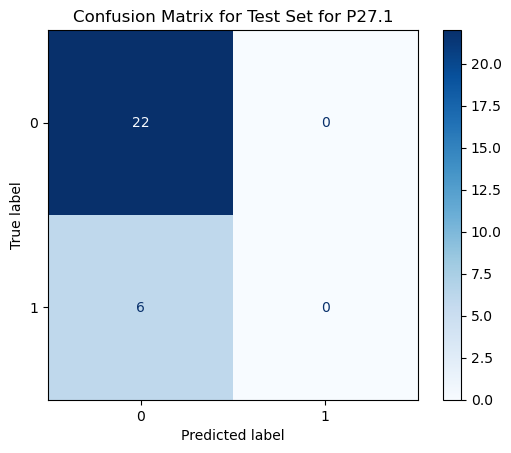

Fold 4:
Accuracy (Val): 0.76, F1 Score (Val): 0.71
Accuracy (Test): 0.64, F1 Score (Test): 0.50



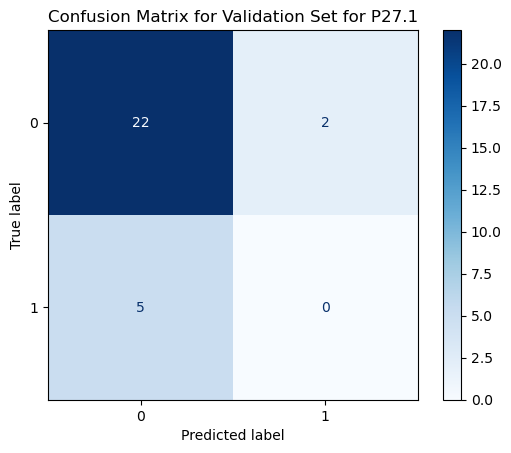

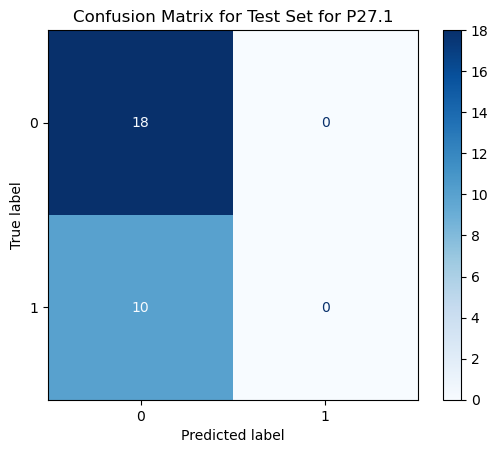

Fold 5:
Accuracy (Val): 0.79, F1 Score (Val): 0.70
Accuracy (Test): 0.86, F1 Score (Test): 0.79



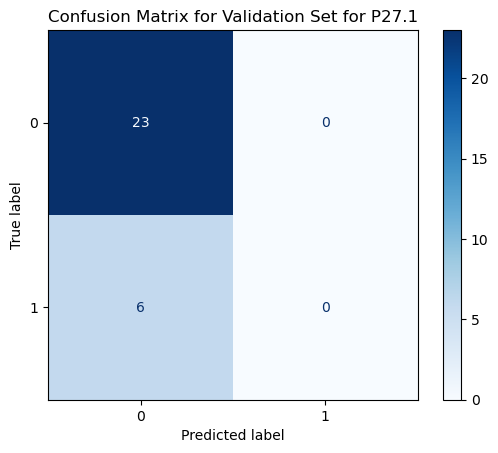

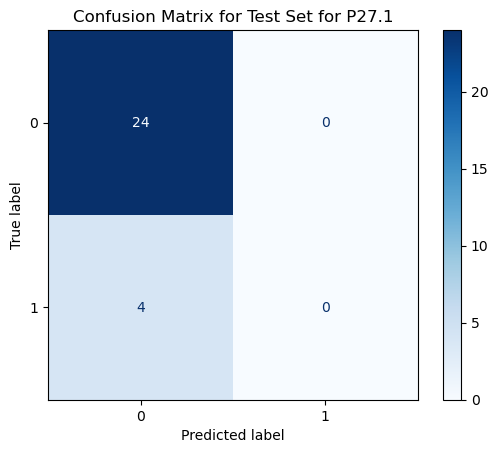

Training Logistic Regression model for H35.1 with 5-fold cross-validation
Fold 1:
Accuracy (Val): 0.83, F1 Score (Val): 0.75
Accuracy (Test): 0.93, F1 Score (Test): 0.90



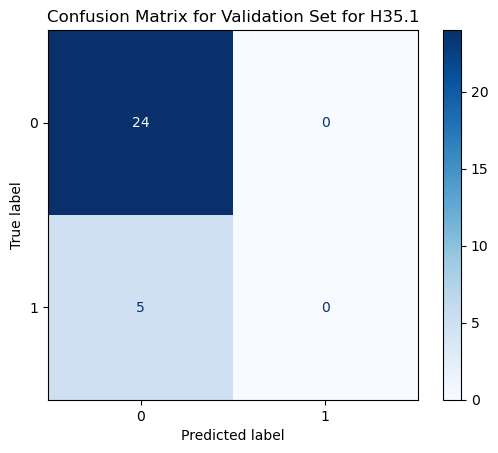

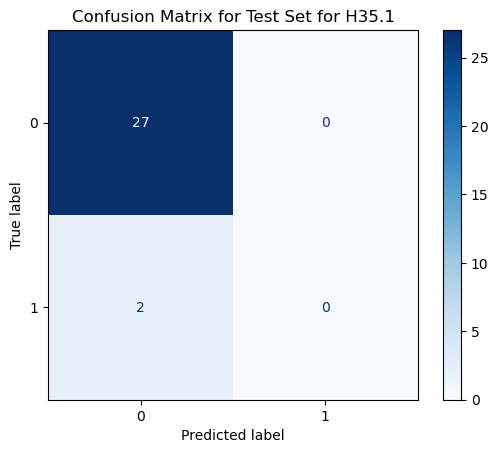

Fold 2:
Accuracy (Val): 0.86, F1 Score (Val): 0.80
Accuracy (Test): 0.97, F1 Score (Test): 0.95



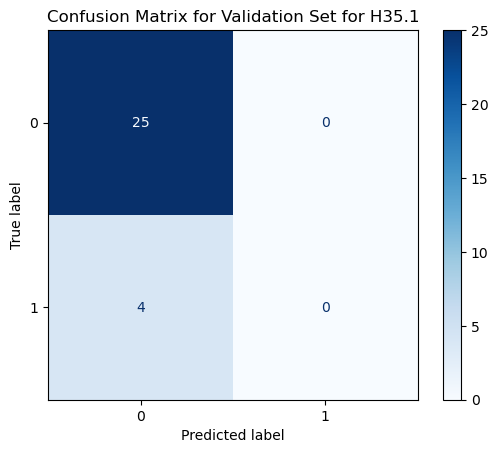

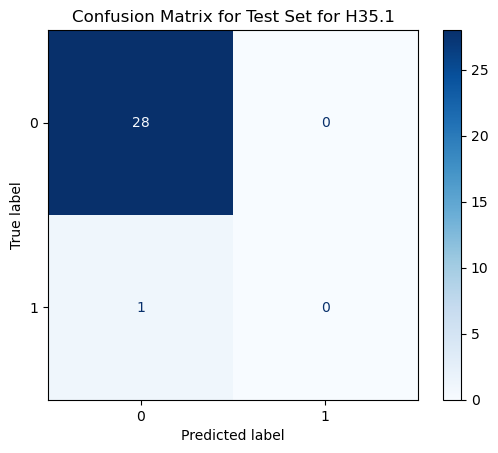

Fold 3:
Accuracy (Val): 0.90, F1 Score (Val): 0.85
Accuracy (Test): 0.96, F1 Score (Test): 0.95



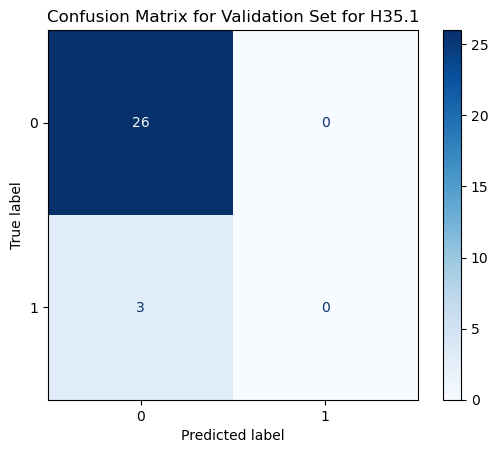

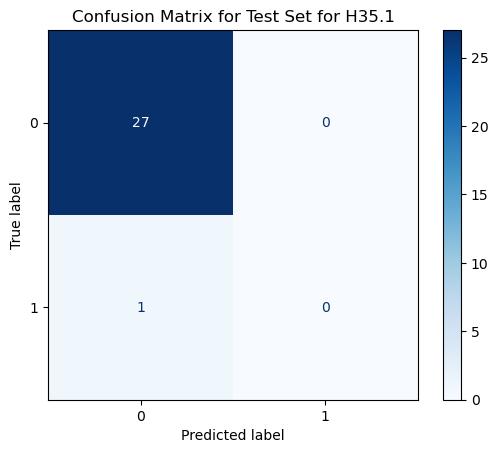

Fold 4:
Accuracy (Val): 0.90, F1 Score (Val): 0.85
Accuracy (Test): 0.82, F1 Score (Test): 0.74



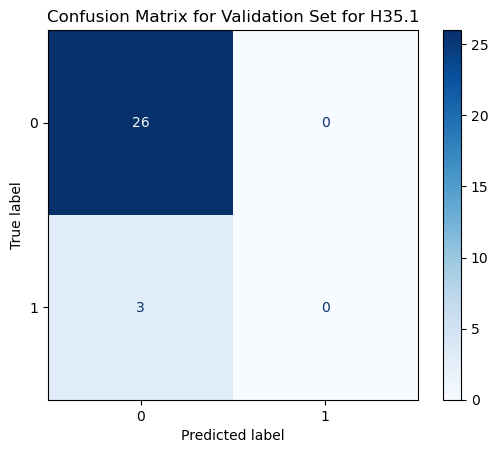

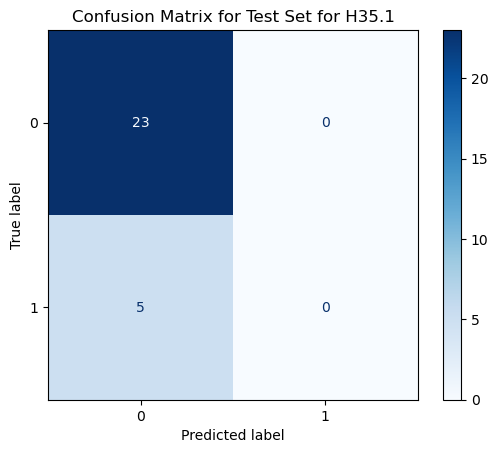

Fold 5:
Accuracy (Val): 1.00, F1 Score (Val): 1.00
Accuracy (Test): 0.93, F1 Score (Test): 0.89



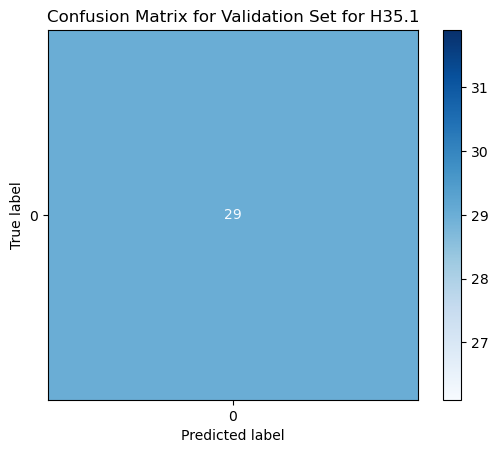

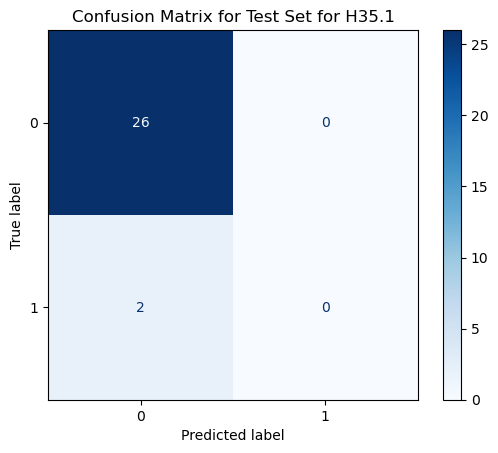

In [34]:
import pandas as pd
import numpy as np
from sklearn.linear_model import Ridge, LogisticRegression
from sklearn.metrics import mean_absolute_error, r2_score, accuracy_score, f1_score, confusion_matrix
from sklearn.model_selection import KFold, train_test_split, GridSearchCV
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import ConfusionMatrixDisplay
import matplotlib.pyplot as plt
import seaborn as sns

# Define regression and classification targets
reg = ['HC - WYPI', 'HC (pc) -WYPI', 'HC (Z Score) -WYPI', 'dni  hospitalizacji']
cla = ['P27.1', 'H35.1']

# MAPE function
def mean_absolute_percentage_error(y_true, y_pred):
    return np.mean(np.abs((y_true - y_pred) / np.abs(y_true))) * 100

# Cross-validation for Ridge Regression with Grid Search
def cross_validate_ridge_with_grid_search(X, y, cv=5, alpha_range=None):
    if alpha_range is None:
        alpha_range = [0.1, 1.0]  # Default alpha values
    
    X = X.values
    kf = KFold(n_splits=cv, shuffle=True, random_state=43)
    scaler = MinMaxScaler()
    X_scaled = scaler.fit_transform(X)

    # Grid Search setup
    ridge = Ridge()
    param_grid = {'alpha': alpha_range}
    grid_search = GridSearchCV(estimator=ridge, param_grid=param_grid, scoring='r2', cv=kf)
    
    grid_search.fit(X_scaled, y)
    best_alpha = grid_search.best_params_['alpha']
    best_score = grid_search.best_score_
    print(f"Best alpha: {best_alpha}, Best R2 score (CV): {best_score:.4f}")

    # Evaluate the best model
    model = Ridge(alpha=best_alpha)
    fold = 1
    for train_idx, test_idx in kf.split(X_scaled):
        X_train, X_test = X_scaled[train_idx], X_scaled[test_idx]
        y_train, y_test = y.iloc[train_idx], y.iloc[test_idx]
        X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.25, random_state=43)
        
        model.fit(X_train, y_train)

        # Validation evaluation
        y_val_pred = model.predict(X_val)
        mae_val = mean_absolute_error(y_val, y_val_pred)
        mape_val = mean_absolute_percentage_error(y_val, y_val_pred)
        r2_val = r2_score(y_val, y_val_pred)

        # Test evaluation
        y_test_pred = model.predict(X_test)
        mae_test = mean_absolute_error(y_test, y_test_pred)
        mape_test = mean_absolute_percentage_error(y_test, y_test_pred)
        r2_test = r2_score(y_test, y_test_pred)

        print(f"Fold {fold}:")
        print(f"MAE (Val): {mae_val:.4f}, MAPE (Val): {mape_val:.2f}%, R2 (Val): {r2_val:.4f}")
        print(f"MAE (Test): {mae_test:.4f}, MAPE (Test): {mape_test:.2f}%, R2 (Test): {r2_test:.4f}\n")

        plt.figure(figsize=(12, 5))

        plt.subplot(1, 2, 1)
        sns.scatterplot(x=np.arange(len(y_val)), y=y_val, color='green', label='Actual')
        sns.scatterplot(x=np.arange(len(y_val)), y=y_val_pred, color='red', label='Predicted')
        plt.xlabel('Sample Index')
        plt.ylabel('Values')
        plt.title(f'Validation Set for {y_col}')
        plt.legend()
        plt.grid()
    
        plt.subplot(1, 2, 2)
        sns.scatterplot(x=np.arange(len(y_test)), y=y_test, color='green', label='Actual')
        sns.scatterplot(x=np.arange(len(y_test)), y=y_test_pred, color='blue', label='Predicted')
        plt.xlabel('Sample Index')
        plt.ylabel('Values')
        plt.title(f'Test Set for {y_col}')
        plt.legend()
        plt.grid()
    
        plt.tight_layout()
        plt.show()

        fold += 1

# Cross-validation for classification using Logistic Regression
def cross_validate_logistic_regression(X, y, cv=5):
    X = X.values
    kf = KFold(n_splits=cv, shuffle=True, random_state=43)
    scaler = MinMaxScaler()
    X_scaled = scaler.fit_transform(X)
    
    fold = 1
    for train_idx, test_idx in kf.split(X_scaled):
        X_train, X_test = X_scaled[train_idx], X_scaled[test_idx]
        y_train, y_test = y.iloc[train_idx], y.iloc[test_idx]
        X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.25, random_state=43)
        
        model = LogisticRegression(max_iter=100, solver='liblinear')  # Adjust solver for data size
        model.fit(X_train, y_train)

        # Training evaluation
        y_train_pred = model.predict(X_train)
        f1_train = f1_score(y_train, y_train_pred, average='weighted')
        accuracy_train = accuracy_score(y_train, y_train_pred)

        # Validation evaluation
        y_val_pred = model.predict(X_val)
        f1_val = f1_score(y_val, y_val_pred, average='weighted')
        accuracy_val = accuracy_score(y_val, y_val_pred)

        # Test evaluation
        y_test_pred = model.predict(X_test)
        f1_test = f1_score(y_test, y_test_pred, average='weighted')
        accuracy_test = accuracy_score(y_test, y_test_pred)

        print(f"Fold {fold}:")
        print(f"Accuracy (Val): {accuracy_val:.2f}, F1 Score (Val): {f1_val:.2f}")
        print(f"Accuracy (Test): {accuracy_test:.2f}, F1 Score (Test): {f1_test:.2f}\n")
        
        cm_val = confusion_matrix(y_val, y_val_pred)
        cm_test = confusion_matrix(y_test, y_test_pred)
        
        disp_val = ConfusionMatrixDisplay(confusion_matrix=cm_val)
        disp_val.plot(cmap='Blues', values_format='d')
        plt.title(f'Confusion Matrix for Validation Set for {y_col}')
        plt.show()
            
        disp_test = ConfusionMatrixDisplay(confusion_matrix=cm_test)
        disp_test.plot(cmap='Blues', values_format='d')
        plt.title(f'Confusion Matrix for Test Set for {y_col}')
        plt.show()

        fold += 1

# Loop through regression targets with Ridge Regression and Grid Search
for y_col in reg:
    print(f"Training Ridge Regression model for {y_col} with Grid Search")
    cross_validate_ridge_with_grid_search(X, y[y_col], alpha_range=[0.1, 1])

# Loop through classification targets with Logistic Regression
for y_col in cla:
    print(f"Training Logistic Regression model for {y_col} with 5-fold cross-validation")
    cross_validate_logistic_regression(X, y[y_col])


### LR cla

Training Logistic Regression model for P27.1 with 5-fold cross-validation
Fold 1:
F1 Score (Val): 0.59
F1 Score (Test): 0.59

Best Hyperparameters: {'C': 10, 'max_iter': 1000, 'solver': 'liblinear'}
f1: 0.17



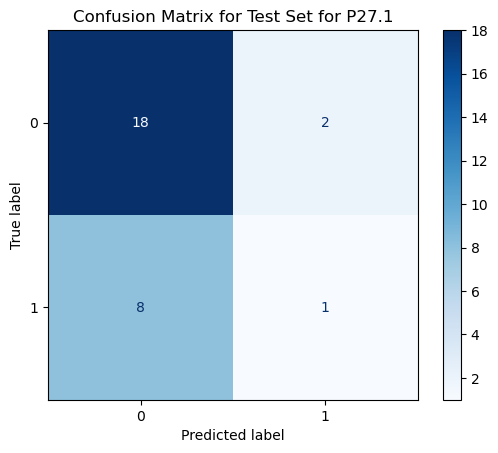

Fold 2:
F1 Score (Val): 0.68
F1 Score (Test): 0.73

Best Hyperparameters: {'C': 10, 'max_iter': 1000, 'solver': 'saga'}
f1: 0.22



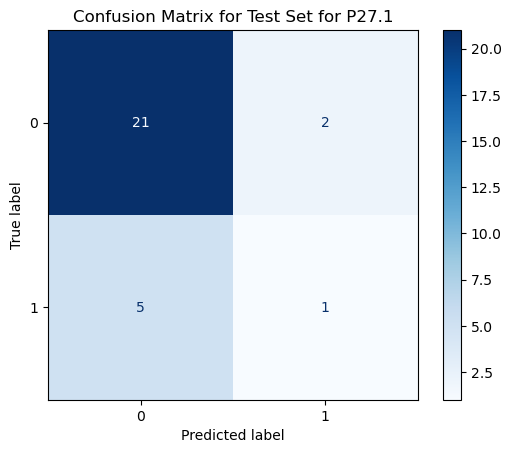

Fold 3:
F1 Score (Val): 0.65
F1 Score (Test): 0.67

Best Hyperparameters: {'C': 15, 'max_iter': 1000, 'solver': 'liblinear'}
f1: 0.18



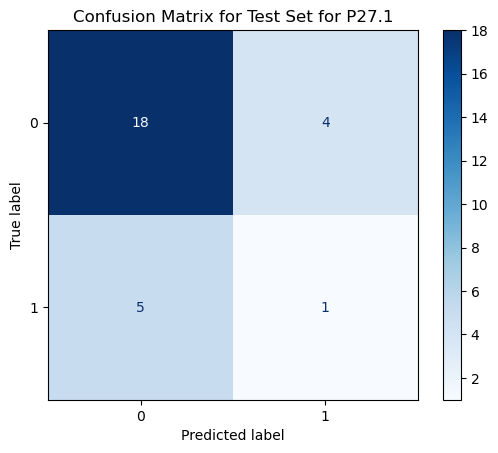

Fold 4:
F1 Score (Val): 0.66
F1 Score (Test): 0.49

Best Hyperparameters: {'C': 5, 'max_iter': 1000, 'solver': 'liblinear'}
f1: nan



/tmp/ipykernel_54919/3328132100.py:95: RuntimeWarning: invalid value encountered in scalar divide
  f1 = 2 * (precision * recall) / (precision + recall)


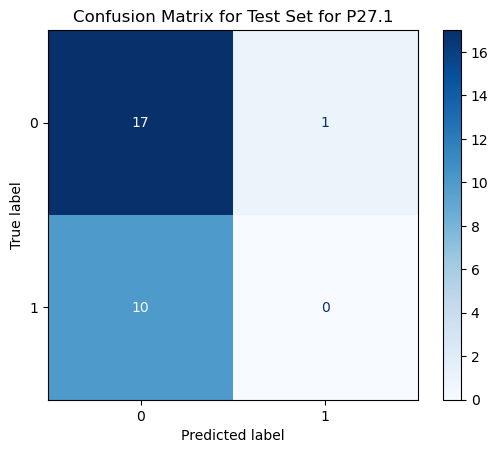

Fold 5:
F1 Score (Val): 0.73
F1 Score (Test): 0.81

Best Hyperparameters: {'C': 5, 'max_iter': 1000, 'solver': 'liblinear'}
f1: 0.29



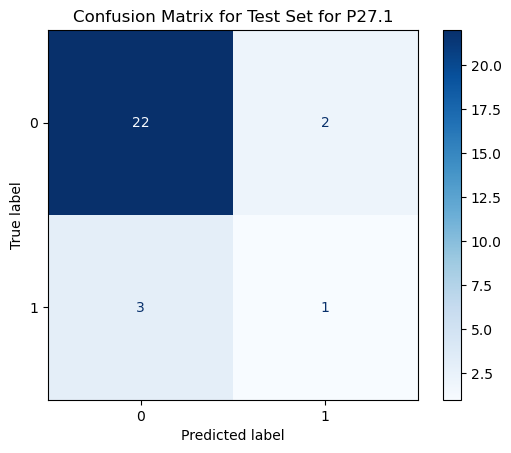

Training Logistic Regression model for H35.1 with 5-fold cross-validation
Fold 1:
F1 Score (Val): 0.84
F1 Score (Test): 0.90

Best Hyperparameters: {'C': 5, 'max_iter': 1000, 'solver': 'liblinear'}
f1: nan



/tmp/ipykernel_54919/3328132100.py:91: RuntimeWarning: invalid value encountered in scalar divide
  precision = TP / (TP + FP)


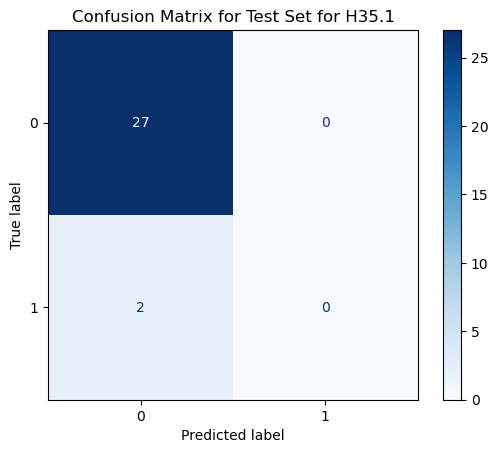

Fold 2:
F1 Score (Val): 0.89
F1 Score (Test): 0.93

Best Hyperparameters: {'C': 5, 'max_iter': 1000, 'solver': 'liblinear'}
f1: nan



/tmp/ipykernel_54919/3328132100.py:95: RuntimeWarning: invalid value encountered in scalar divide
  f1 = 2 * (precision * recall) / (precision + recall)


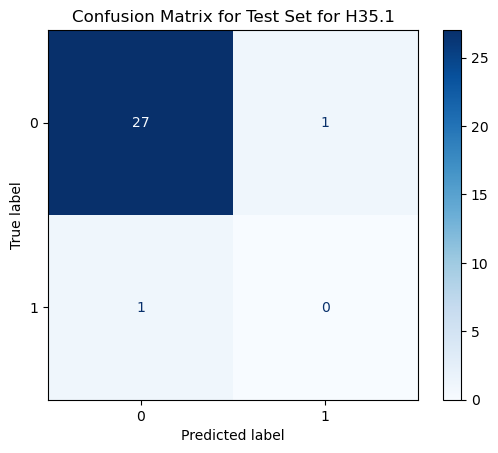

Fold 3:
F1 Score (Val): 0.94
F1 Score (Test): 0.95

Best Hyperparameters: {'C': 5, 'max_iter': 1000, 'solver': 'liblinear'}
f1: nan



/tmp/ipykernel_54919/3328132100.py:91: RuntimeWarning: invalid value encountered in scalar divide
  precision = TP / (TP + FP)


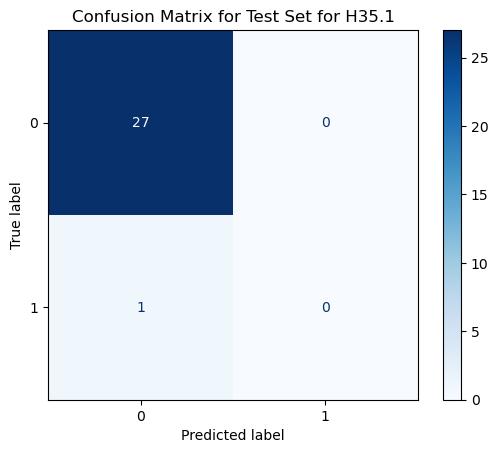

Fold 4:
F1 Score (Val): 0.94
F1 Score (Test): 0.74

Best Hyperparameters: {'C': 5, 'max_iter': 1000, 'solver': 'liblinear'}
f1: nan



/home/michaltajak/anaconda3/envs/tensorplease/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/michaltajak/anaconda3/envs/tensorplease/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/tmp/ipykernel_54919/3328132100.py:91: RuntimeWarning: invalid value encountered in scalar divide
  precision = TP / (TP + FP)


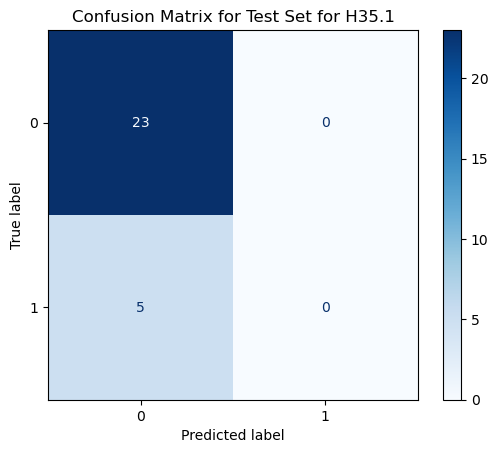

Fold 5:
F1 Score (Val): 0.89
F1 Score (Test): 0.89

Best Hyperparameters: {'C': 5, 'max_iter': 1000, 'solver': 'liblinear'}
f1: nan



/tmp/ipykernel_54919/3328132100.py:91: RuntimeWarning: invalid value encountered in scalar divide
  precision = TP / (TP + FP)


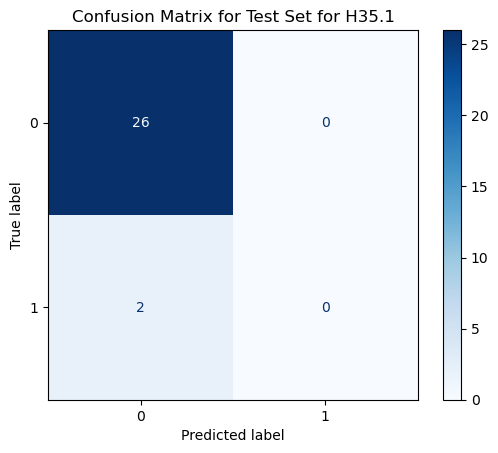

In [23]:
import pandas as pd
import numpy as np
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import f1_score, confusion_matrix, ConfusionMatrixDisplay
from sklearn.model_selection import KFold, train_test_split, GridSearchCV
from sklearn.preprocessing import MinMaxScaler
from sklearn.ensemble import IsolationForest
import matplotlib.pyplot as plt

# Define regression and classification targets
reg = ['HC - WYPI', 'HC (pc) -WYPI', 'HC (Z Score) -WYPI', 'dni  hospitalizacji']
cla = ['P27.1', 'H35.1']

# Hyperparameters grid for Logistic Regression
param_grid_logreg = {
    'C': [5, 10, 15],
    'solver': ['liblinear', 'saga'],
    'max_iter': [1000, 2000, 3000]
}

# Function to detect anomalies using Isolation Forest
def detect_anomalies(X, contamination=0.05):
    """
    Detect anomalies using Isolation Forest method.
    
    Parameters:
    X: Feature matrix (numpy array or DataFrame)
    contamination: Proportion of outliers in the data
    
    Returns:
    anomalies: Indices of the detected anomalies
    """
    model = IsolationForest(contamination=contamination, random_state=42)
    model.fit(X)
    predictions = model.predict(X)
    
    # Anomalies are marked as -1
    anomalies = np.where(predictions == -1)[0]
    
    return anomalies

# Cross-validation for classification using Logistic Regression with hyperparameter tuning
def cross_validate_logistic_regression(X, y, param_grid, cv=5):
    X = X.values
    kf = KFold(n_splits=cv, shuffle=True, random_state=43)
    scaler = MinMaxScaler()
    X_scaled = scaler.fit_transform(X)
    
    fold = 1
    for train_idx, test_idx in kf.split(X_scaled):
        X_train, X_test = X_scaled[train_idx], X_scaled[test_idx]
        y_train, y_test = y.iloc[train_idx], y.iloc[test_idx]
        
        # Detect and remove anomalies from the training set
        anomalies_train = detect_anomalies(X_train)
        X_train_cleaned = np.delete(X_train, anomalies_train, axis=0)
        y_train_cleaned = np.delete(y_train.values, anomalies_train, axis=0)
        
        # Further split the training data into train/val sets
        X_train, X_val, y_train, y_val = train_test_split(X_train_cleaned, y_train_cleaned, test_size=0.25, random_state=43)
        
        # Hyperparameter tuning using GridSearchCV
        model = LogisticRegression()
        grid_search = GridSearchCV(estimator=model, param_grid=param_grid, scoring='f1_weighted', cv=3, n_jobs=-1, verbose=0)
        grid_search.fit(X_train, y_train)

        # Best model after hyperparameter search
        best_model = grid_search.best_estimator_

        # Training evaluation
        y_train_pred = best_model.predict(X_train)
        f1_train = f1_score(y_train, y_train_pred, average='weighted')

        # Validation evaluation
        y_val_pred = best_model.predict(X_val)
        f1_val = f1_score(y_val, y_val_pred, average='weighted')

        # Test evaluation
        y_test_pred = best_model.predict(X_test)
        f1_test = f1_score(y_test, y_test_pred, average='weighted')
        
        print(f"Fold {fold}:")
        print(f"F1 Score (Val): {f1_val:.2f}")
        print(f"F1 Score (Test): {f1_test:.2f}\n")
        print(f"Best Hyperparameters: {grid_search.best_params_}")
        
        cm_val = confusion_matrix(y_val, y_val_pred)
        cm_test = confusion_matrix(y_test, y_test_pred)

        TN, FP, FN, TP = cm_test.ravel()
        precision = TP / (TP + FP)
        recall = TP / (TP + FN)
        
        # Obliczanie F1 score
        f1 = 2 * (precision * recall) / (precision + recall)
        print(f"f1: {f1:.2f}\n")
        
            
        disp_test = ConfusionMatrixDisplay(confusion_matrix=cm_test)
        disp_test.plot(cmap='Blues', values_format='d')
        plt.title(f'Confusion Matrix for Test Set for {y_col}')
        plt.show()

        fold += 1

# Loop through classification targets with Logistic Regression and hyperparameter tuning
for y_col in cla:
    print(f"Training Logistic Regression model for {y_col} with 5-fold cross-validation")
    cross_validate_logistic_regression(X, y[y_col], param_grid_logreg, cv=5)


### MLP

Training MLP model for HC - WYPI with 5-fold cross-validation
Fold 1/5


/home/michaltajak/anaconda3/envs/tensorplease/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:559: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/michaltajak/anaconda3/envs/tensorplease/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:702: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/michaltajak/anaconda3/envs/tensorplease/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:702: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/michaltajak/anaconda3/env

Best parameters: {'activation': 'relu', 'alpha': 0.001, 'hidden_layer_sizes': (64, 32), 'learning_rate': 'invscaling', 'solver': 'lbfgs'}
MAE (Val): 2.9060, MAPE (Val): 8.73%
MAE (Test): 3.0592, MAPE (Test): 9.20%



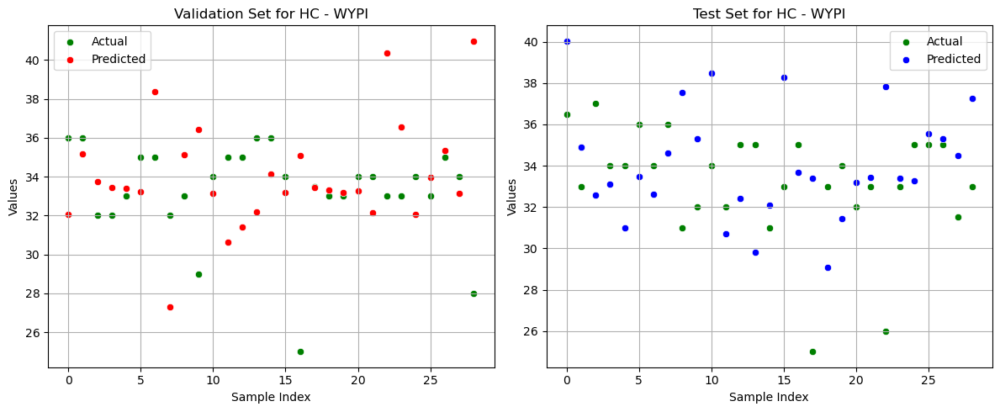

Fold 2/5


/home/michaltajak/anaconda3/envs/tensorplease/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:702: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/michaltajak/anaconda3/envs/tensorplease/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:702: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/michaltajak/anaconda3/envs/tensorplease/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:559: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/michaltajak/anaconda3/env

Best parameters: {'activation': 'tanh', 'alpha': 0.001, 'hidden_layer_sizes': (32,), 'learning_rate': 'constant', 'solver': 'lbfgs'}
MAE (Val): 1.5404, MAPE (Val): 4.57%
MAE (Test): 2.0250, MAPE (Test): 6.06%



/home/michaltajak/anaconda3/envs/tensorplease/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:559: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


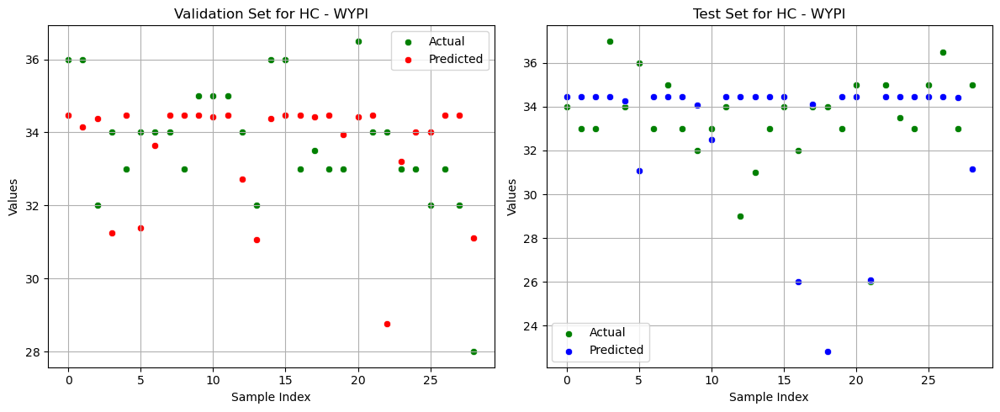

/home/michaltajak/anaconda3/envs/tensorplease/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:702: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/michaltajak/anaconda3/envs/tensorplease/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:702: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Fold 3/5


/home/michaltajak/anaconda3/envs/tensorplease/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:702: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/michaltajak/anaconda3/envs/tensorplease/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:559: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/michaltajak/anaconda3/envs/tensorplease/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:702: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/michaltajak/anaconda3/env

Best parameters: {'activation': 'tanh', 'alpha': 0.001, 'hidden_layer_sizes': (32,), 'learning_rate': 'constant', 'solver': 'lbfgs'}
MAE (Val): 3.0865, MAPE (Val): 9.08%
MAE (Test): 1.5823, MAPE (Test): 4.75%



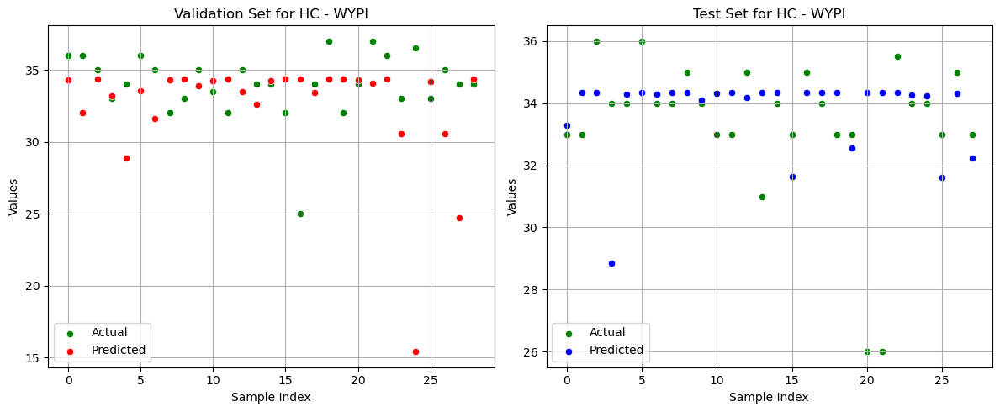

Fold 4/5


/home/michaltajak/anaconda3/envs/tensorplease/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:702: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/michaltajak/anaconda3/envs/tensorplease/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:702: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/michaltajak/anaconda3/envs/tensorplease/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:702: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/michaltajak/anaconda3/envs/tensorplease/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:702: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the 

Best parameters: {'activation': 'tanh', 'alpha': 0.0001, 'hidden_layer_sizes': (32,), 'learning_rate': 'constant', 'solver': 'lbfgs'}
MAE (Val): 3.3373, MAPE (Val): 9.88%
MAE (Test): 3.0015, MAPE (Test): 8.89%



/home/michaltajak/anaconda3/envs/tensorplease/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:559: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


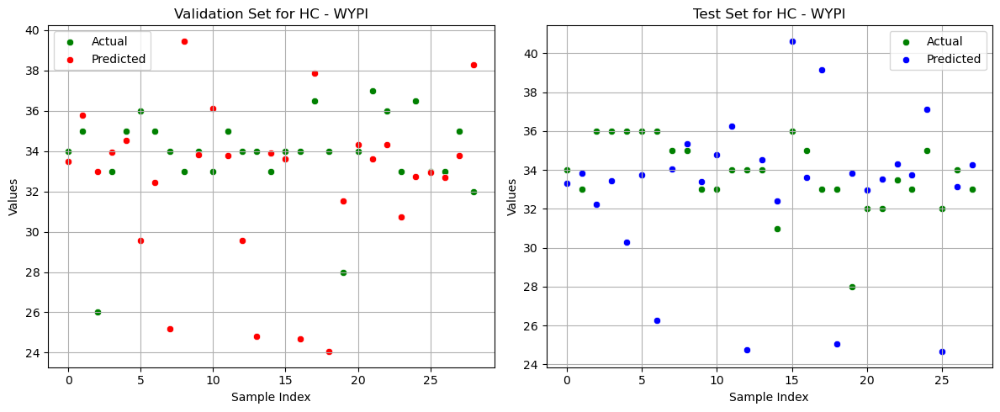

Fold 5/5


/home/michaltajak/anaconda3/envs/tensorplease/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:702: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/michaltajak/anaconda3/envs/tensorplease/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:702: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/michaltajak/anaconda3/envs/tensorplease/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:702: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/michaltajak/anaconda3/envs/tensorplease/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:559: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATI

Best parameters: {'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (64, 32), 'learning_rate': 'invscaling', 'solver': 'lbfgs'}
MAE (Val): 2.4663, MAPE (Val): 7.42%
MAE (Test): 2.6283, MAPE (Test): 7.99%



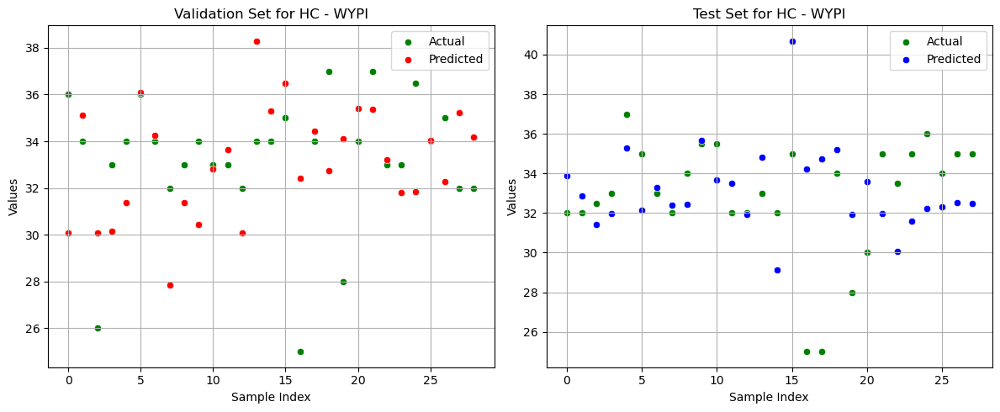

Training MLP model for HC (pc) -WYPI with 5-fold cross-validation
Fold 1/5


/home/michaltajak/anaconda3/envs/tensorplease/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:702: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/michaltajak/anaconda3/envs/tensorplease/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:702: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/michaltajak/anaconda3/envs/tensorplease/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:702: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/michaltajak/anaconda3/envs/tensorplease/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:702: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the 

Best parameters: {'activation': 'relu', 'alpha': 0.001, 'hidden_layer_sizes': (64,), 'learning_rate': 'invscaling', 'solver': 'adam'}
MAE (Val): 19.4745, MAPE (Val): 53.96%
MAE (Test): 24.6988, MAPE (Test): 62.04%



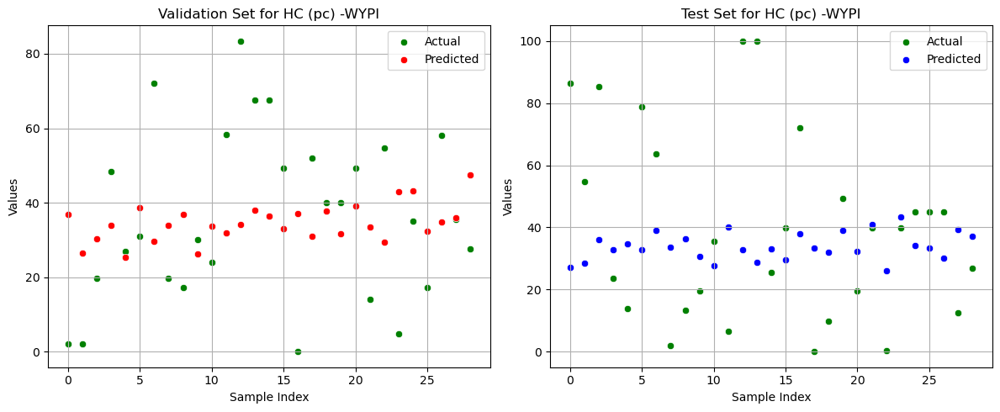

Fold 2/5


/home/michaltajak/anaconda3/envs/tensorplease/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:702: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/michaltajak/anaconda3/envs/tensorplease/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:559: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/michaltajak/anaconda3/envs/tensorplease/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:702: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/michaltajak/anaconda3/env

Best parameters: {'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (64,), 'learning_rate': 'constant', 'solver': 'adam'}
MAE (Val): 24.9386, MAPE (Val): 61.46%
MAE (Test): 21.2924, MAPE (Test): 51.17%



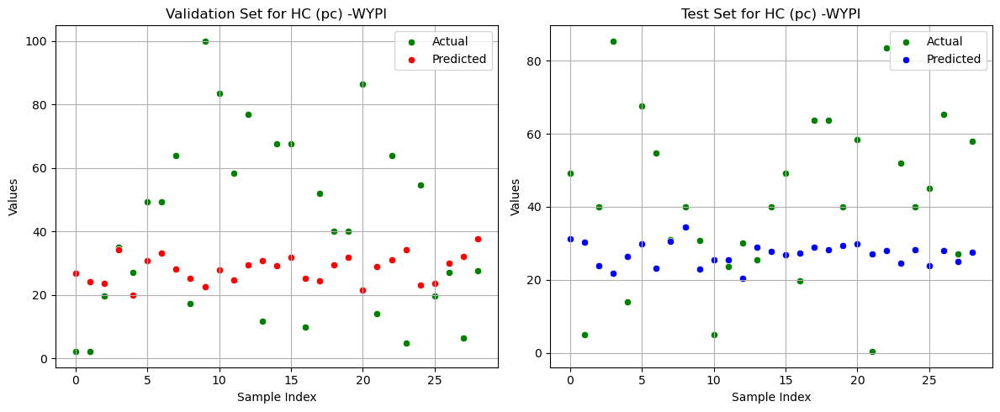

Fold 3/5


/home/michaltajak/anaconda3/envs/tensorplease/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:702: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/michaltajak/anaconda3/envs/tensorplease/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:702: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/michaltajak/anaconda3/envs/tensorplease/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:702: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/michaltajak/anaconda3/envs/tensorplease/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:702: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the 

Best parameters: {'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (64, 32), 'learning_rate': 'invscaling', 'solver': 'adam'}
MAE (Val): 29.5795, MAPE (Val): 65.09%
MAE (Test): 19.8738, MAPE (Test): 53.95%



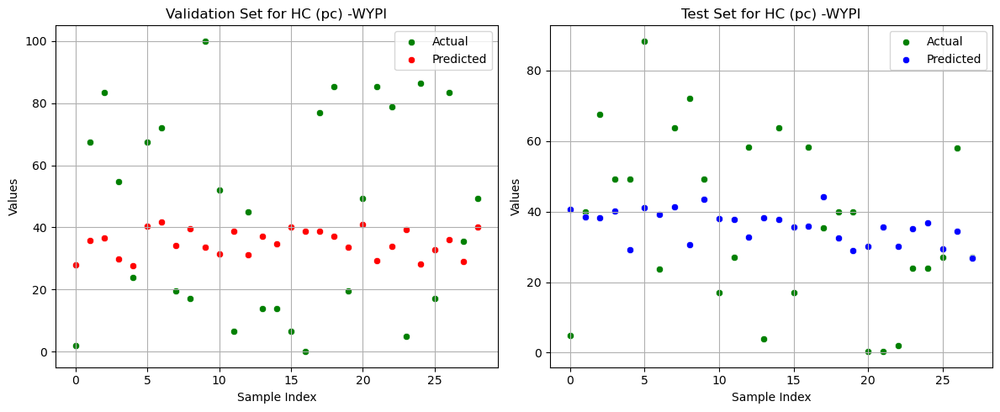

Fold 4/5


/home/michaltajak/anaconda3/envs/tensorplease/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:702: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/michaltajak/anaconda3/envs/tensorplease/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:702: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/michaltajak/anaconda3/envs/tensorplease/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:702: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/michaltajak/anaconda3/envs/tensorplease/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:702: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the 

Best parameters: {'activation': 'relu', 'alpha': 0.001, 'hidden_layer_sizes': (64,), 'learning_rate': 'constant', 'solver': 'adam'}
MAE (Val): 24.6268, MAPE (Val): 53.44%
MAE (Test): 17.2174, MAPE (Test): 53.17%



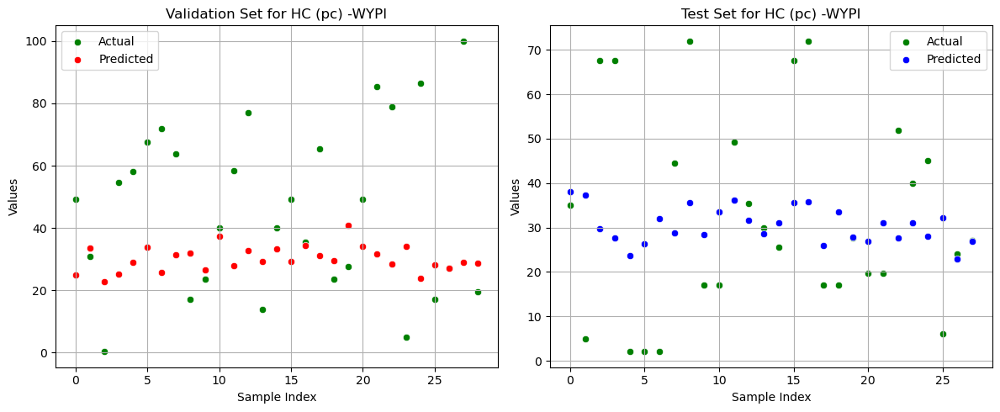

Fold 5/5


/home/michaltajak/anaconda3/envs/tensorplease/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:702: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/michaltajak/anaconda3/envs/tensorplease/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:702: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/michaltajak/anaconda3/envs/tensorplease/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:559: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/michaltajak/anaconda3/env

Best parameters: {'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (64,), 'learning_rate': 'invscaling', 'solver': 'adam'}
MAE (Val): 20.8322, MAPE (Val): 56.54%
MAE (Test): 23.9698, MAPE (Test): 63.37%



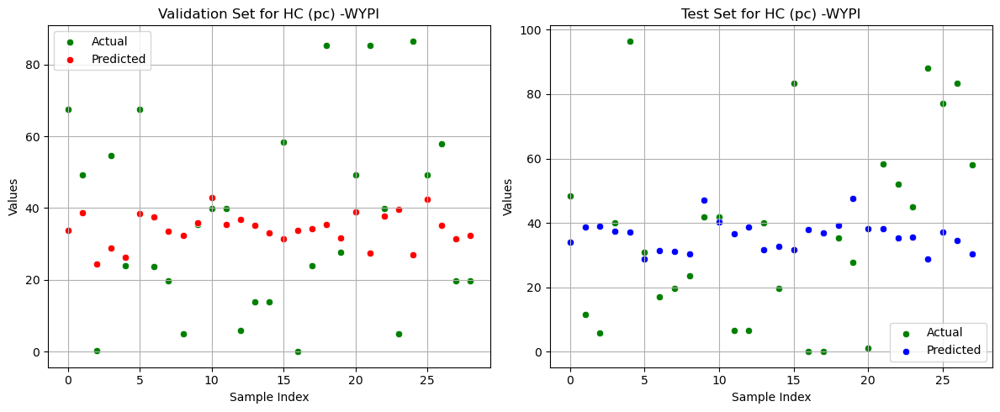

Training MLP model for HC (Z Score) -WYPI with 5-fold cross-validation
Fold 1/5


/home/michaltajak/anaconda3/envs/tensorplease/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:702: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/michaltajak/anaconda3/envs/tensorplease/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:559: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/michaltajak/anaconda3/envs/tensorplease/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:559: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data 

Best parameters: {'activation': 'relu', 'alpha': 0.001, 'hidden_layer_sizes': (32,), 'learning_rate': 'constant', 'solver': 'adam'}
MAE (Val): 0.8290, MAPE (Val): 133.18%
MAE (Test): 1.4014, MAPE (Test): 645.16%



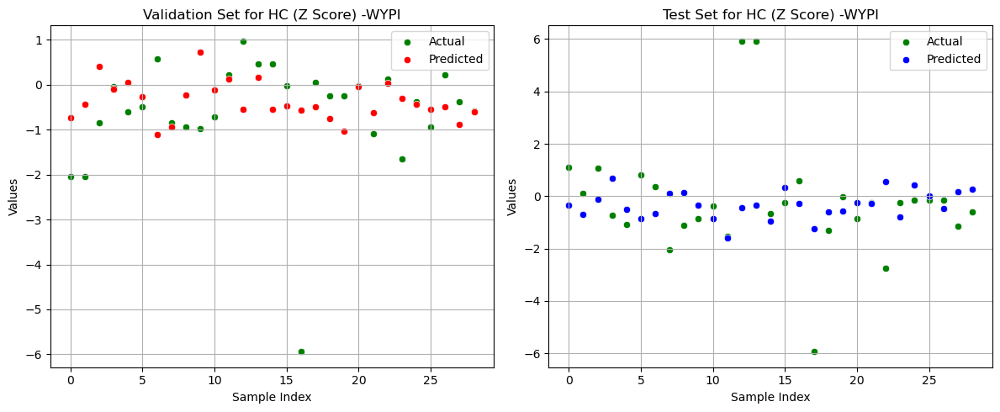

Fold 2/5


/home/michaltajak/anaconda3/envs/tensorplease/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:702: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/michaltajak/anaconda3/envs/tensorplease/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:702: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/michaltajak/anaconda3/envs/tensorplease/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:702: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/michaltajak/anaconda3/envs/tensorplease/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:559: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATI

Best parameters: {'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (32,), 'learning_rate': 'constant', 'solver': 'adam'}
MAE (Val): 0.9333, MAPE (Val): 493.12%
MAE (Test): 0.6779, MAPE (Test): 212.44%



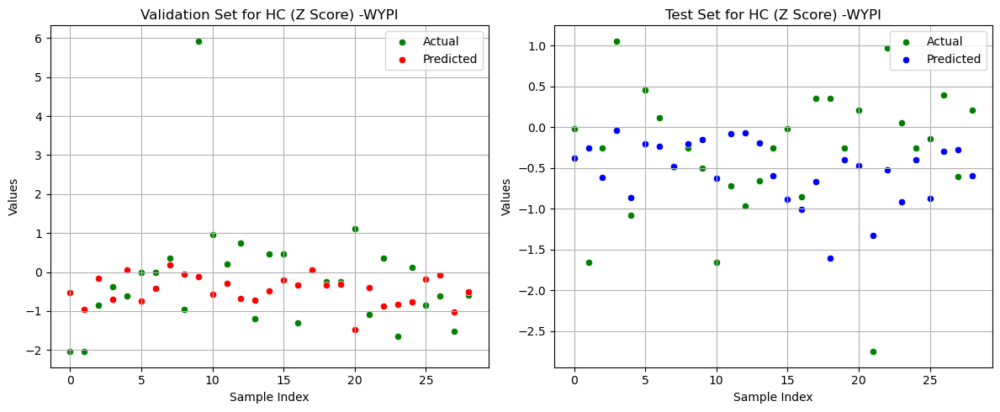

Fold 3/5


/home/michaltajak/anaconda3/envs/tensorplease/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:702: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/michaltajak/anaconda3/envs/tensorplease/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:702: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/michaltajak/anaconda3/envs/tensorplease/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:702: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/michaltajak/anaconda3/envs/tensorplease/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:702: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the 

Best parameters: {'activation': 'relu', 'alpha': 0.001, 'hidden_layer_sizes': (32,), 'learning_rate': 'constant', 'solver': 'adam'}
MAE (Val): 1.2533, MAPE (Val): 668.45%
MAE (Test): 0.7976, MAPE (Test): 153.17%



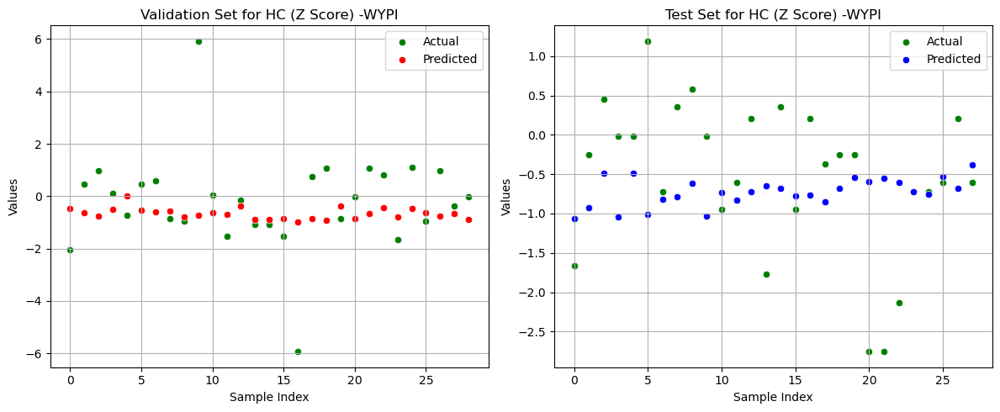

Fold 4/5


/home/michaltajak/anaconda3/envs/tensorplease/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:702: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/michaltajak/anaconda3/envs/tensorplease/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:702: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/michaltajak/anaconda3/envs/tensorplease/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:702: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/michaltajak/anaconda3/envs/tensorplease/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:702: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the 

Best parameters: {'activation': 'relu', 'alpha': 0.001, 'hidden_layer_sizes': (32,), 'learning_rate': 'invscaling', 'solver': 'adam'}
MAE (Val): 1.0255, MAPE (Val): 7851.71%
MAE (Test): 0.6838, MAPE (Test): 113.77%



/home/michaltajak/anaconda3/envs/tensorplease/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:559: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/michaltajak/anaconda3/envs/tensorplease/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:559: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


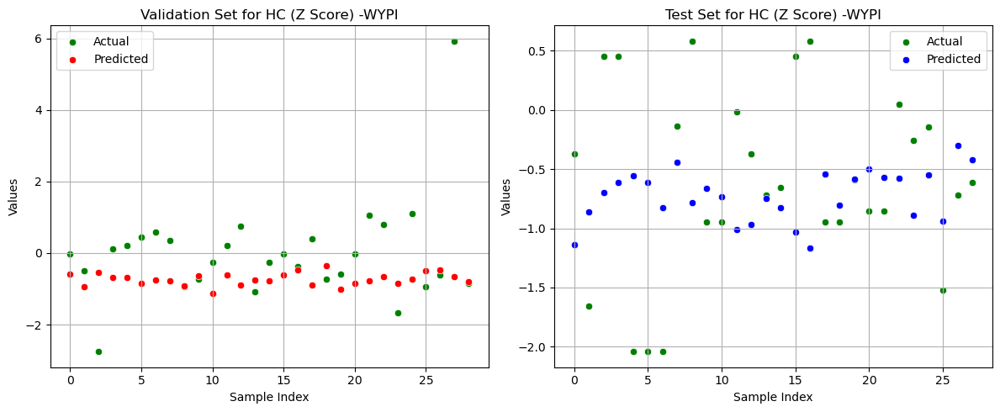

Fold 5/5


/home/michaltajak/anaconda3/envs/tensorplease/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:702: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/michaltajak/anaconda3/envs/tensorplease/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:702: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/michaltajak/anaconda3/envs/tensorplease/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:702: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/michaltajak/anaconda3/envs/tensorplease/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:702: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the 

Best parameters: {'activation': 'tanh', 'alpha': 0.0001, 'hidden_layer_sizes': (32,), 'learning_rate': 'constant', 'solver': 'adam'}
MAE (Val): 0.9854, MAPE (Val): 162.83%
MAE (Test): 1.0769, MAPE (Test): 152.25%



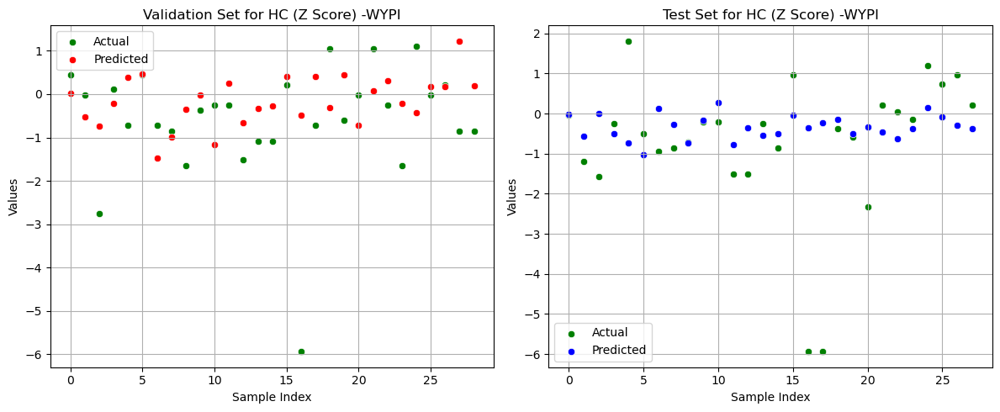

Training MLP model for dni  hospitalizacji with 5-fold cross-validation
Fold 1/5


/home/michaltajak/anaconda3/envs/tensorplease/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:702: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/michaltajak/anaconda3/envs/tensorplease/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:702: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/michaltajak/anaconda3/envs/tensorplease/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:702: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/michaltajak/anaconda3/envs/tensorplease/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:559: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATI

Best parameters: {'activation': 'tanh', 'alpha': 0.001, 'hidden_layer_sizes': (64, 32), 'learning_rate': 'constant', 'solver': 'lbfgs'}
MAE (Val): 29.0591, MAPE (Val): 57.80%
MAE (Test): 32.8203, MAPE (Test): 59.15%



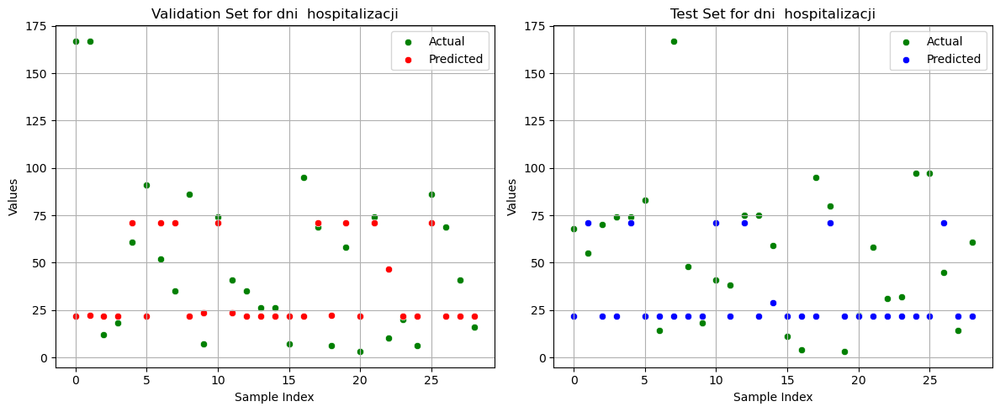

Fold 2/5


/home/michaltajak/anaconda3/envs/tensorplease/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:702: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/michaltajak/anaconda3/envs/tensorplease/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:702: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/michaltajak/anaconda3/envs/tensorplease/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:702: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/michaltajak/anaconda3/envs/tensorplease/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:702: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the 

Best parameters: {'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (64,), 'learning_rate': 'constant', 'solver': 'adam'}
MAE (Val): 33.2940, MAPE (Val): 69.71%
MAE (Test): 26.1723, MAPE (Test): 78.01%



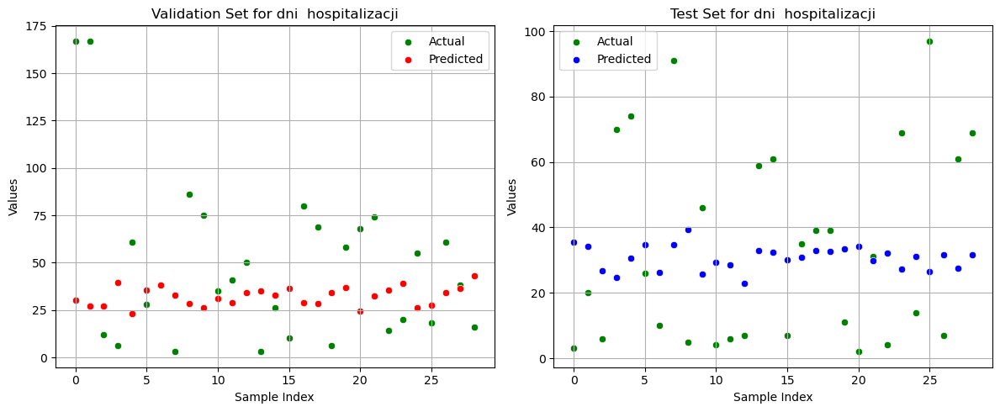

Fold 3/5


/home/michaltajak/anaconda3/envs/tensorplease/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:702: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/michaltajak/anaconda3/envs/tensorplease/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:702: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/michaltajak/anaconda3/envs/tensorplease/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:559: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/michaltajak/anaconda3/env

Best parameters: {'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (64,), 'learning_rate': 'invscaling', 'solver': 'adam'}
MAE (Val): 33.9092, MAPE (Val): 64.19%
MAE (Test): 25.1863, MAPE (Test): 69.00%



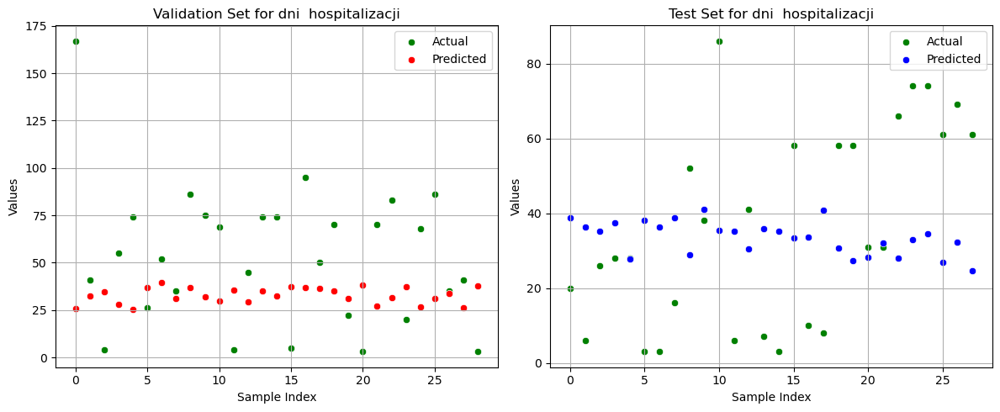

Fold 4/5


/home/michaltajak/anaconda3/envs/tensorplease/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:702: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/michaltajak/anaconda3/envs/tensorplease/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:702: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/michaltajak/anaconda3/envs/tensorplease/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:702: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/michaltajak/anaconda3/envs/tensorplease/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:702: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the 

Best parameters: {'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (64,), 'learning_rate': 'invscaling', 'solver': 'adam'}
MAE (Val): 28.2532, MAPE (Val): 63.56%
MAE (Test): 37.2653, MAPE (Test): 73.53%



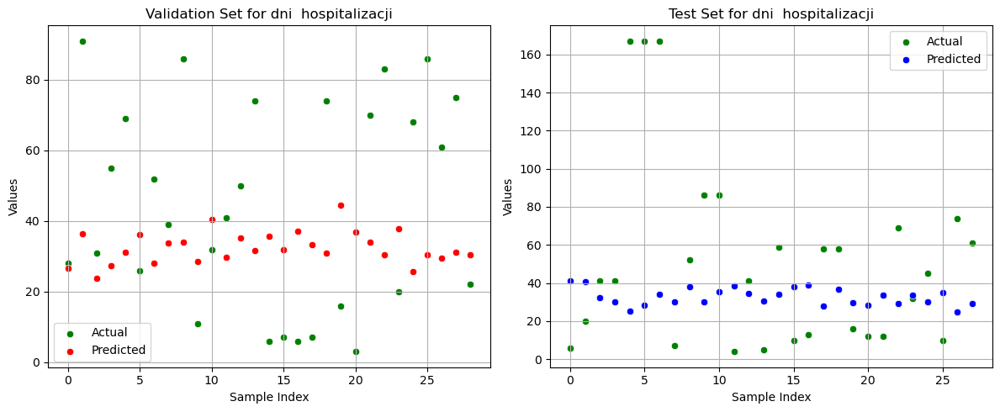

Fold 5/5


/home/michaltajak/anaconda3/envs/tensorplease/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:702: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/michaltajak/anaconda3/envs/tensorplease/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:702: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/michaltajak/anaconda3/envs/tensorplease/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:702: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/michaltajak/anaconda3/envs/tensorplease/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:702: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the 

Best parameters: {'activation': 'relu', 'alpha': 0.001, 'hidden_layer_sizes': (64,), 'learning_rate': 'invscaling', 'solver': 'adam'}
MAE (Val): 24.5765, MAPE (Val): 59.44%
MAE (Test): 29.5543, MAPE (Test): 85.93%



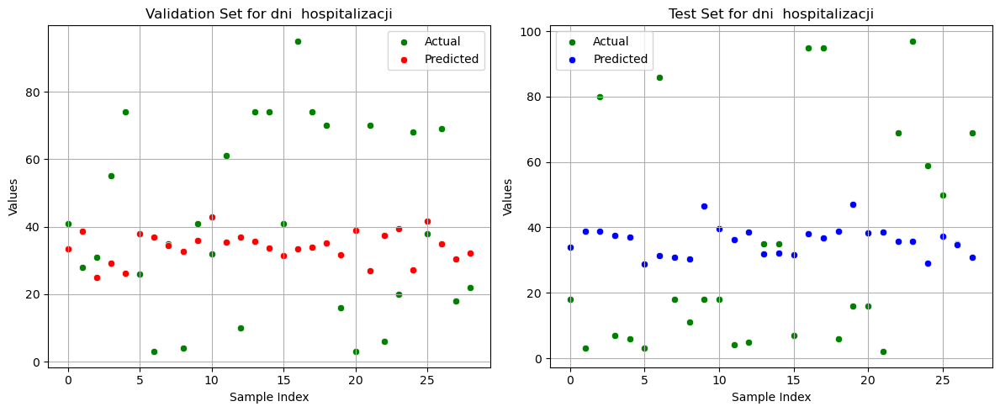

Training MLP model for P27.1 with 5-fold cross-validation
Fold 1/5


/home/michaltajak/anaconda3/envs/tensorplease/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:702: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/michaltajak/anaconda3/envs/tensorplease/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:702: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/michaltajak/anaconda3/envs/tensorplease/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:702: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/michaltajak/anaconda3/envs/tensorplease/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:702: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the 

Best Parameters: {'activation': 'relu', 'alpha': 0.001, 'hidden_layer_sizes': (32,), 'learning_rate': 'invscaling', 'solver': 'adam'}
Accuracy (Val): 0.72
Accuracy (Test): 0.69



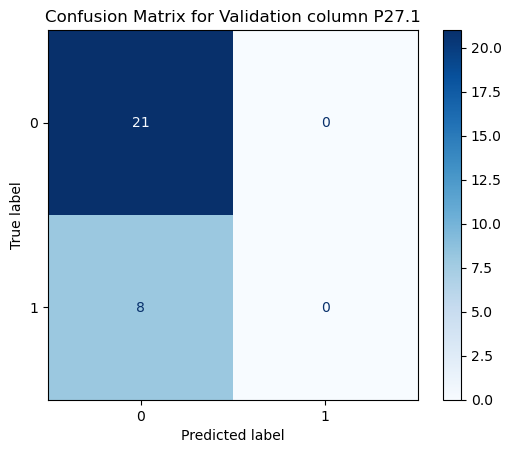

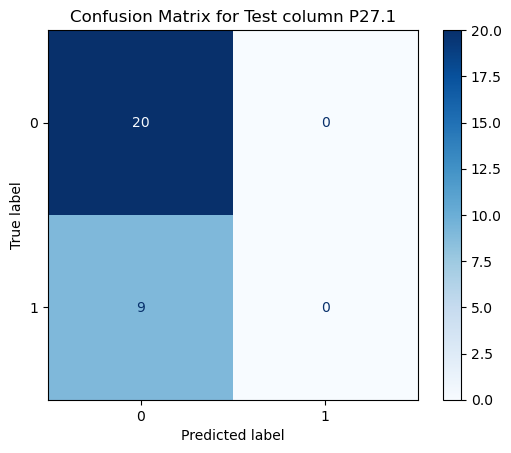

Fold 2/5


/home/michaltajak/anaconda3/envs/tensorplease/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:702: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/michaltajak/anaconda3/envs/tensorplease/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:702: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/michaltajak/anaconda3/envs/tensorplease/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:702: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/michaltajak/anaconda3/envs/tensorplease/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:702: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the 

Best Parameters: {'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (32,), 'learning_rate': 'constant', 'solver': 'adam'}
Accuracy (Val): 0.76
Accuracy (Test): 0.79



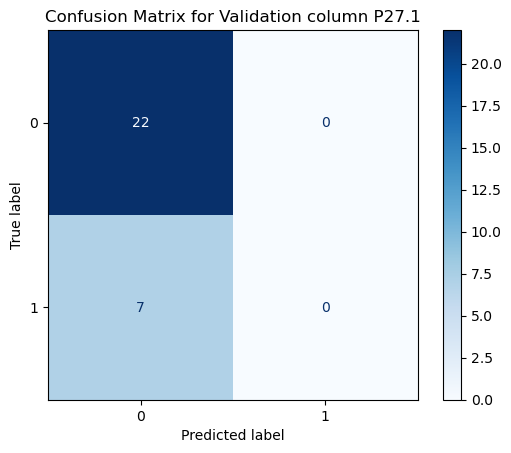

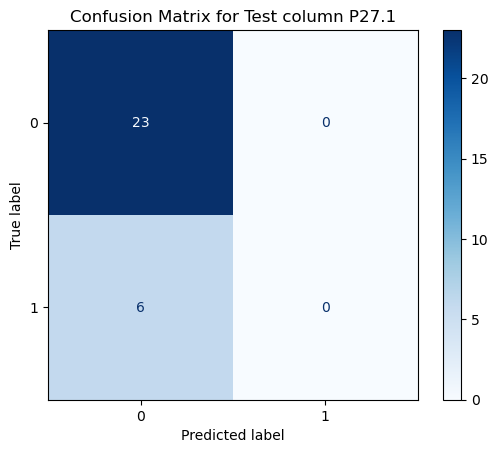

Fold 3/5


/home/michaltajak/anaconda3/envs/tensorplease/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:702: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/michaltajak/anaconda3/envs/tensorplease/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:702: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/michaltajak/anaconda3/envs/tensorplease/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:702: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/michaltajak/anaconda3/envs/tensorplease/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:702: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the 

Best Parameters: {'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (32,), 'learning_rate': 'constant', 'solver': 'adam'}
Accuracy (Val): 0.72
Accuracy (Test): 0.79



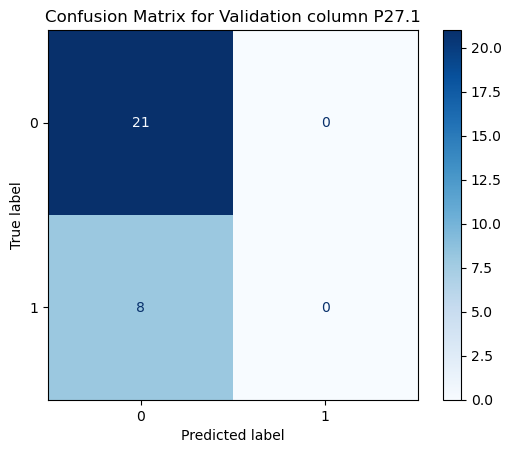

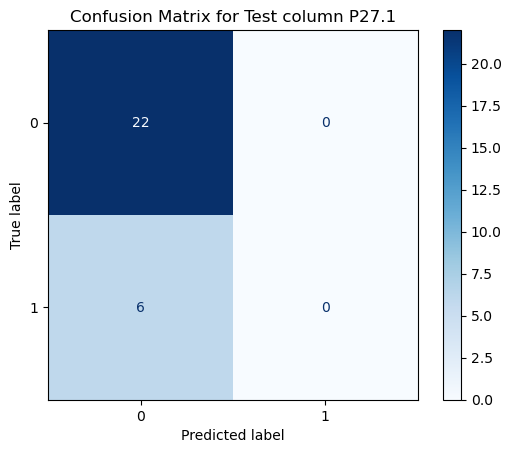

Fold 4/5


/home/michaltajak/anaconda3/envs/tensorplease/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:702: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/michaltajak/anaconda3/envs/tensorplease/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:702: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/michaltajak/anaconda3/envs/tensorplease/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:702: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/michaltajak/anaconda3/envs/tensorplease/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:702: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the 

Best Parameters: {'activation': 'relu', 'alpha': 0.001, 'hidden_layer_sizes': (32, 16), 'learning_rate': 'invscaling', 'solver': 'adam'}
Accuracy (Val): 0.59
Accuracy (Test): 0.61



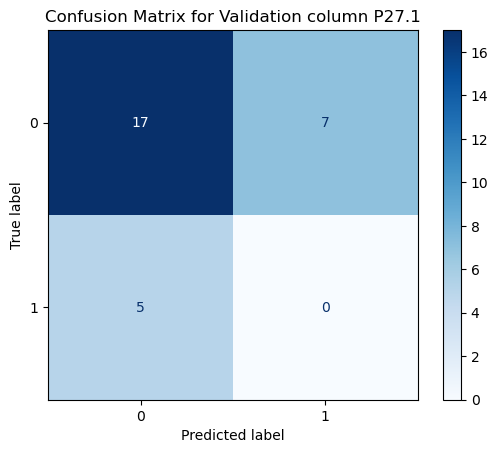

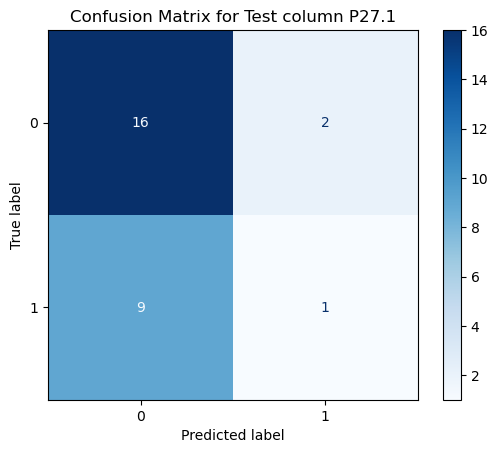

Fold 5/5


/home/michaltajak/anaconda3/envs/tensorplease/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:702: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/michaltajak/anaconda3/envs/tensorplease/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:702: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/michaltajak/anaconda3/envs/tensorplease/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:702: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/michaltajak/anaconda3/envs/tensorplease/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:702: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the 

Best Parameters: {'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (32, 16), 'learning_rate': 'constant', 'solver': 'adam'}
Accuracy (Val): 0.59
Accuracy (Test): 0.79



/home/michaltajak/anaconda3/envs/tensorplease/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:702: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/michaltajak/anaconda3/envs/tensorplease/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:702: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


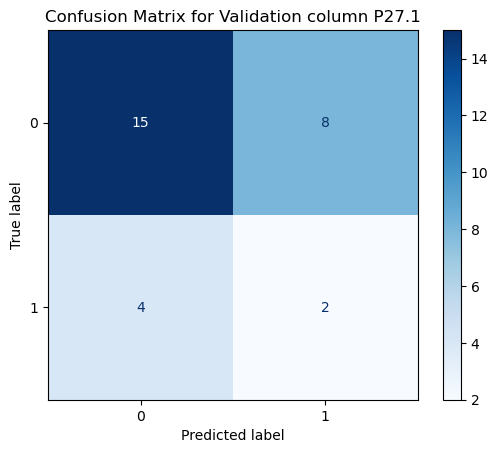

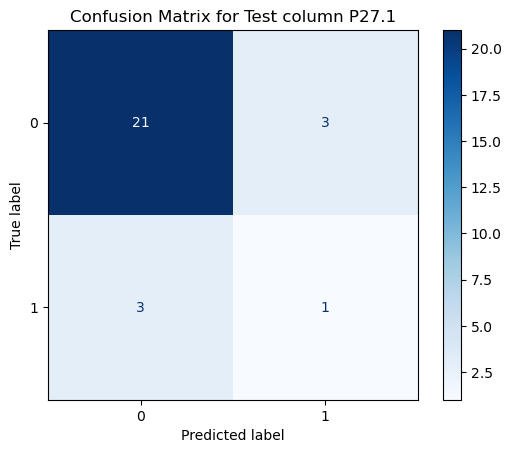

/home/michaltajak/anaconda3/envs/tensorplease/lib/python3.9/site-packages/sklearn/model_selection/_split.py:684: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(


Training MLP model for H35.1 with 5-fold cross-validation
Fold 1/5


/home/michaltajak/anaconda3/envs/tensorplease/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:702: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/michaltajak/anaconda3/envs/tensorplease/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:702: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/michaltajak/anaconda3/envs/tensorplease/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:702: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/michaltajak/anaconda3/envs/tensorplease/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:702: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the 

Best Parameters: {'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (16,), 'learning_rate': 'constant', 'solver': 'adam'}
Accuracy (Val): 0.83
Accuracy (Test): 0.93



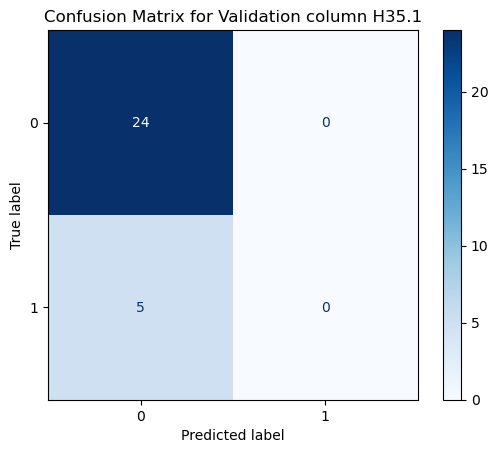

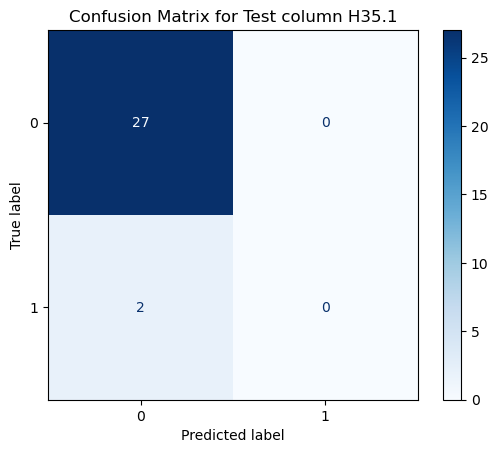

/home/michaltajak/anaconda3/envs/tensorplease/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:702: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/michaltajak/anaconda3/envs/tensorplease/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:702: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Fold 2/5


/home/michaltajak/anaconda3/envs/tensorplease/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:702: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/michaltajak/anaconda3/envs/tensorplease/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:702: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/michaltajak/anaconda3/envs/tensorplease/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:702: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/michaltajak/anaconda3/envs/tensorplease/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:702: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the 

Best Parameters: {'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (16,), 'learning_rate': 'constant', 'solver': 'adam'}
Accuracy (Val): 0.86
Accuracy (Test): 0.97



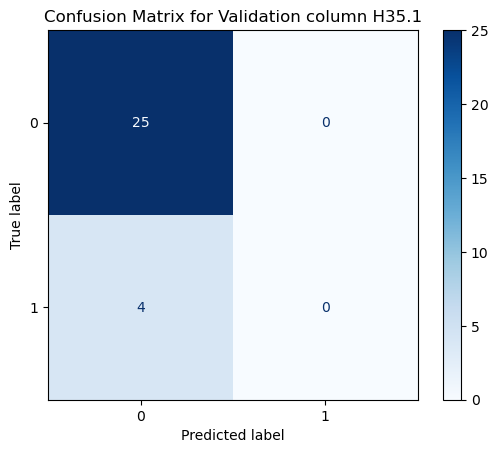

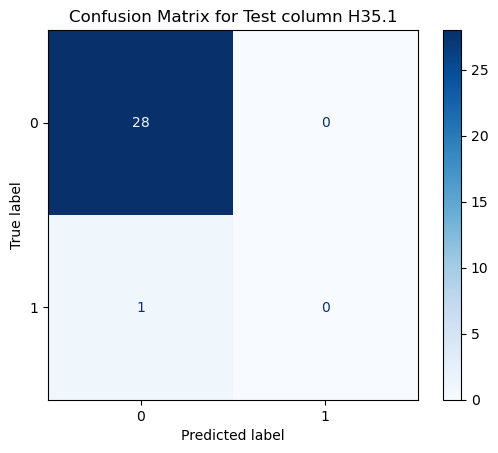

/home/michaltajak/anaconda3/envs/tensorplease/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:702: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/michaltajak/anaconda3/envs/tensorplease/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:702: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/michaltajak/anaconda3/envs/tensorplease/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:702: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Fold 3/5


/home/michaltajak/anaconda3/envs/tensorplease/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:702: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/michaltajak/anaconda3/envs/tensorplease/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:702: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/michaltajak/anaconda3/envs/tensorplease/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:702: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/michaltajak/anaconda3/envs/tensorplease/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:702: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the 

Best Parameters: {'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (16,), 'learning_rate': 'constant', 'solver': 'adam'}
Accuracy (Val): 0.90
Accuracy (Test): 0.96



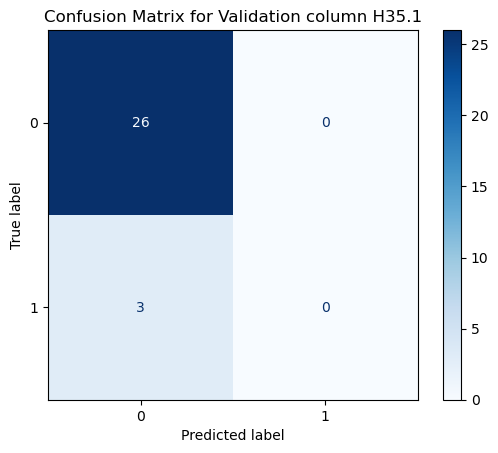

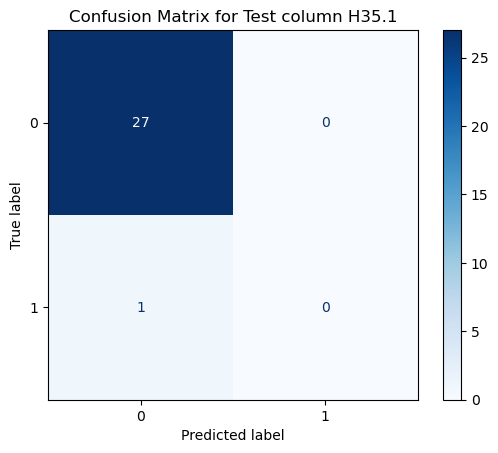

/home/michaltajak/anaconda3/envs/tensorplease/lib/python3.9/site-packages/sklearn/model_selection/_split.py:684: UserWarning: The least populated class in y has only 3 members, which is less than n_splits=5.
  warnings.warn(


Fold 4/5


/home/michaltajak/anaconda3/envs/tensorplease/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:702: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/michaltajak/anaconda3/envs/tensorplease/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:702: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/michaltajak/anaconda3/envs/tensorplease/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:702: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/michaltajak/anaconda3/envs/tensorplease/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:702: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the 

Best Parameters: {'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (16,), 'learning_rate': 'constant', 'solver': 'adam'}
Accuracy (Val): 0.90
Accuracy (Test): 0.82



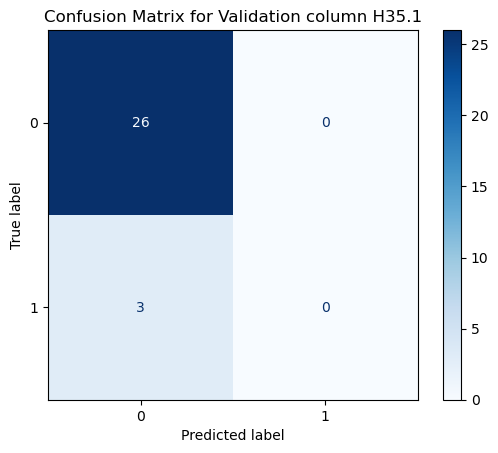

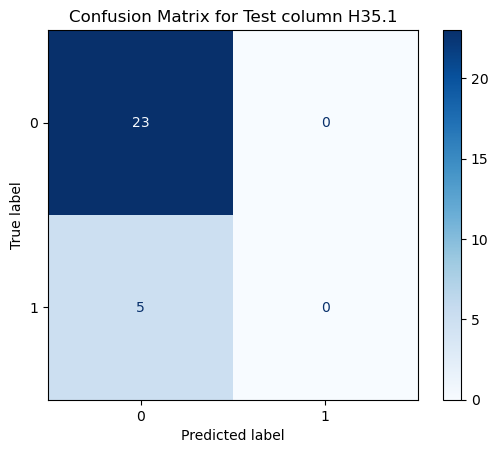

/home/michaltajak/anaconda3/envs/tensorplease/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:702: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/michaltajak/anaconda3/envs/tensorplease/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:702: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Fold 5/5


/home/michaltajak/anaconda3/envs/tensorplease/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:702: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/michaltajak/anaconda3/envs/tensorplease/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:702: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/michaltajak/anaconda3/envs/tensorplease/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:702: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/michaltajak/anaconda3/envs/tensorplease/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:702: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the 

Best Parameters: {'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (16,), 'learning_rate': 'constant', 'solver': 'adam'}
Accuracy (Val): 1.00
Accuracy (Test): 0.93



/home/michaltajak/anaconda3/envs/tensorplease/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:702: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/michaltajak/anaconda3/envs/tensorplease/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:702: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


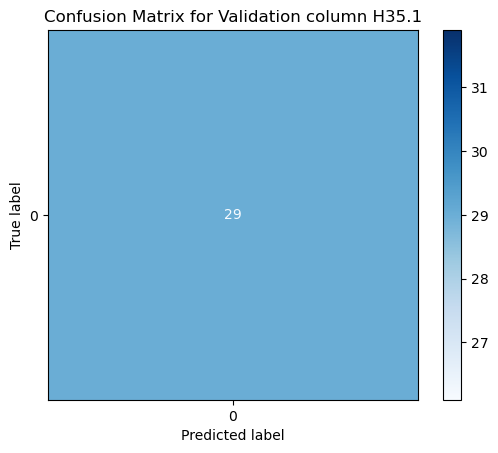

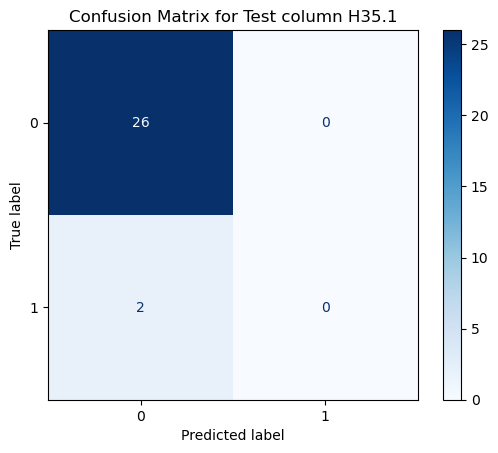

In [22]:
import warnings
from sklearn.exceptions import ConvergenceWarning

# Wyłącz ostrzeżenia typu ConvergenceWarning
warnings.filterwarnings("ignore", category=ConvergenceWarning)
import pandas as pd
import numpy as np
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score, accuracy_score, confusion_matrix, f1_score
from sklearn.model_selection import train_test_split, GridSearchCV, KFold
from sklearn.preprocessing import MinMaxScaler
from sklearn.neural_network import MLPRegressor, MLPClassifier
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import ConfusionMatrixDisplay

# Define regression and classification target columns
reg = ['HC - WYPI', 'HC (pc) -WYPI', 'HC (Z Score) -WYPI', 'dni  hospitalizacji']
cla = ['P27.1', 'H35.1']

# Hyperparameters grid for MLP regression
param_grid_mlp_reg = {
    'hidden_layer_sizes': [(32,), (64,), (64, 32)],  
    'activation': ['relu', 'tanh'],  
    'solver': ['adam', 'lbfgs'],  
    'alpha': [0.0001, 0.001],  
    'learning_rate': ['constant', 'invscaling']  
}

# Hyperparameters grid for MLP classification
param_grid_mlp_cla = {
    'hidden_layer_sizes': [(16,), (32,), (32, 16)],
    'activation': ['relu', 'tanh'],
    'solver': ['adam', 'lbfgs'],
    'alpha': [0.0001, 0.001],
    'learning_rate': ['constant', 'invscaling']
}

def mean_absolute_percentage_error(y_true, y_pred):
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

# Updated function to evaluate MLP regression model
def evaluate_regression_model(X_train, X_val, X_test, y_train, y_val, y_test, model, param_grid, y_col):
    grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=5, n_jobs=-1, verbose=0)
    grid_search.fit(X_train, y_train)
    best_model = grid_search.best_estimator_

    # Training evaluation
    y_train_pred = best_model.predict(X_train)
    mae_train = mean_absolute_error(y_train, y_train_pred)
    r2_train = r2_score(y_train, y_train_pred)

    # Validation evaluation
    y_val_pred = best_model.predict(X_val)
    mae_val = mean_absolute_error(y_val, y_val_pred)  # MAE dla walidacji
    mape_val = np.abs(mae_val / np.mean(y_val)) * 100
    r2_val = r2_score(y_val, y_val_pred)
    
    # Test evaluation
    y_test_pred = best_model.predict(X_test)
    mae_test = mean_absolute_error(y_test, y_test_pred)  # MAE dla testu
    mape_test = np.abs(mae_test / np.mean(y_test)) * 100
    r2_test = r2_score(y_test, y_test_pred)
    
    best_params = grid_search.best_params_
    print(f"Best parameters: {best_params}")
    print(f"MAE (Val): {mae_val:.4f}, MAPE (Val): {mape_val:.2f}%")
    print(f"MAE (Test): {mae_test:.4f}, MAPE (Test): {mape_test:.2f}%\n")

    plt.figure(figsize=(12, 5))

    plt.subplot(1, 2, 1)
    sns.scatterplot(x=np.arange(len(y_val)), y=y_val, color='green', label='Actual')
    sns.scatterplot(x=np.arange(len(y_val)), y=y_val_pred, color='red', label='Predicted')
    plt.xlabel('Sample Index')
    plt.ylabel('Values')
    plt.title(f'Validation Set for {y_col}')
    plt.legend()
    plt.grid()
    
    plt.subplot(1, 2, 2)
    sns.scatterplot(x=np.arange(len(y_test)), y=y_test, color='green', label='Actual')
    sns.scatterplot(x=np.arange(len(y_test)), y=y_test_pred, color='blue', label='Predicted')
    plt.xlabel('Sample Index')
    plt.ylabel('Values')
    plt.title(f'Test Set for {y_col}')
    plt.legend()
    plt.grid()
    
    plt.tight_layout()
    plt.show()
    
    return grid_search.best_params_, mae_train, r2_train, mae_val, r2_val, mae_test, r2_test, mape_val, mape_test

# Cross-validation for MLP regression
def cross_validate_regression(X, y, model, param_grid, cv=5):
    X = X.values
    kf = KFold(n_splits=cv, shuffle=True, random_state=43)
    scaler = MinMaxScaler()
    X_scaled = scaler.fit_transform(X)
    
    fold = 1
    for train_idx, test_idx in kf.split(X_scaled):
        print(f"Fold {fold}/{cv}")
        X_train, X_test = X_scaled[train_idx], X_scaled[test_idx]
        y_train, y_test = y.iloc[train_idx].values, y.iloc[test_idx].values
        X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.25, random_state=43)
        
        best_params, mae_train, r2_train, mae_val, r2_val, mae_test, r2_test, mape_val, mape_test = evaluate_regression_model(
            X_train, X_val, X_test, y_train, y_val, y_test, model, param_grid, y.name)
        
        fold += 1

# Loop through regression targets with MLP
for y_col in reg:
    print(f"Training MLP model for {y_col} with 5-fold cross-validation")
    warnings.filterwarnings("ignore", category=ConvergenceWarning)
    model = MLPRegressor(max_iter=200)
    cross_validate_regression(X, y[y_col], model, param_grid_mlp_reg, cv=5)

# MLP classification evaluation function
def evaluate_classification_model(X_train, X_val, X_test, y_train, y_val, y_test, model, param_grid):
    grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=5, n_jobs=-1, verbose=0)
    grid_search.fit(X_train, y_train)
    best_model = grid_search.best_estimator_

    # Training evaluation
    y_train_pred = best_model.predict(X_train)
    f1_train = f1_score(y_train, y_train_pred, average='weighted')
    accuracy_train = accuracy_score(y_train, y_train_pred)

    # Validation evaluation
    y_val_pred = best_model.predict(X_val)
    f1_val = f1_score(y_val, y_val_pred, average='weighted')
    accuracy_val = accuracy_score(y_val, y_val_pred)

    # Test evaluation
    y_test_pred = best_model.predict(X_test)
    f1_test = f1_score(y_test, y_test_pred, average='weighted')
    accuracy_test = accuracy_score(y_test, y_test_pred)

    best_params = grid_search.best_params_

    print(f"Best Parameters: {best_params}")
    print(f"Accuracy (Val): {accuracy_val:.2f}")
    print(f"Accuracy (Test): {accuracy_test:.2f}\n")

    cm_val = confusion_matrix(y_val, y_val_pred)
    cm_test = confusion_matrix(y_test, y_test_pred)
        
    disp_val = ConfusionMatrixDisplay(confusion_matrix=cm_val)
    disp_val.plot(cmap='Blues', values_format='d')
    plt.title(f'Confusion Matrix for Validation column {y_col}')
    plt.show()
        
    disp_test = ConfusionMatrixDisplay(confusion_matrix=cm_test)
    disp_test.plot(cmap='Blues', values_format='d')
    plt.title(f"Confusion Matrix for Test column {y_col}")
    plt.show()

    return grid_search.best_params_, f1_train, f1_val, f1_test, accuracy_train, accuracy_val, accuracy_test

# Cross-validation for MLP classification
def cross_validate_classification(X, y, model, param_grid, cv=5):
    X = X.values
    kf = KFold(n_splits=cv, shuffle=True, random_state=43)
    scaler = MinMaxScaler()
    X_scaled = scaler.fit_transform(X)
    
    fold = 1
    for train_idx, test_idx in kf.split(X_scaled):
        print(f"Fold {fold}/{cv}")
        X_train, X_test = X_scaled[train_idx], X_scaled[test_idx]
        y_train, y_test = y.iloc[train_idx].values, y.iloc[test_idx].values
        X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.25, random_state=43)
        
        best_params, f1_train, f1_val, f1_test, accuracy_train, accuracy_val, accuracy_test = evaluate_classification_model(
            X_train, X_val, X_test, y_train, y_val, y_test, model, param_grid)
        
        fold += 1

# Loop through classification targets with MLP
for y_col in cla:
    print(f"Training MLP model for {y_col} with 5-fold cross-validation")
    warnings.filterwarnings("ignore", category=ConvergenceWarning)
    model = MLPClassifier(max_iter=200)
    cross_validate_classification(X, y[y_col], model, param_grid_mlp_cla, cv=5)


### MLP cla

Training MLP model for P27.1 with 5-fold cross-validation
Fold 1/5


/home/michaltajak/anaconda3/envs/tensorplease/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:559: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/michaltajak/anaconda3/envs/tensorplease/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:559: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/michaltajak/anaconda3/envs/tensorplease/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perce

Best Parameters: {'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (128,), 'learning_rate': 'invscaling', 'solver': 'adam'}
F1 Score (Train): 0.68
F1 Score (Val): 0.68
F1 Score (Test): 0.56

f1: nan



/tmp/ipykernel_54919/4054149289.py:80: RuntimeWarning: invalid value encountered in scalar divide
  precision = TP / (TP + FP)


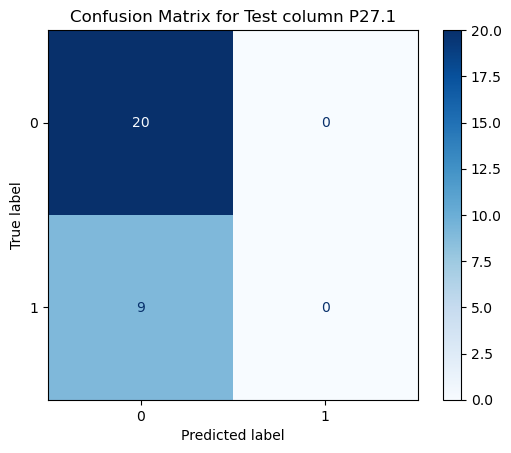

Fold 2/5
Best Parameters: {'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (128,), 'learning_rate': 'invscaling', 'solver': 'adam'}
F1 Score (Train): 1.00
F1 Score (Val): 0.55
F1 Score (Test): 0.70

f1: 0.31



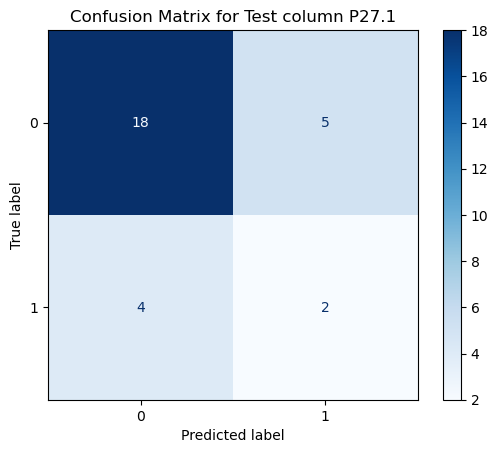

Fold 3/5
Best Parameters: {'activation': 'tanh', 'alpha': 0.001, 'hidden_layer_sizes': (64,), 'learning_rate': 'invscaling', 'solver': 'adam'}
F1 Score (Train): 0.61
F1 Score (Val): 0.68
F1 Score (Test): 0.69

f1: nan



/home/michaltajak/anaconda3/envs/tensorplease/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:559: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/tmp/ipykernel_54919/4054149289.py:80: RuntimeWarning: invalid value encountered in scalar divide
  precision = TP / (TP + FP)


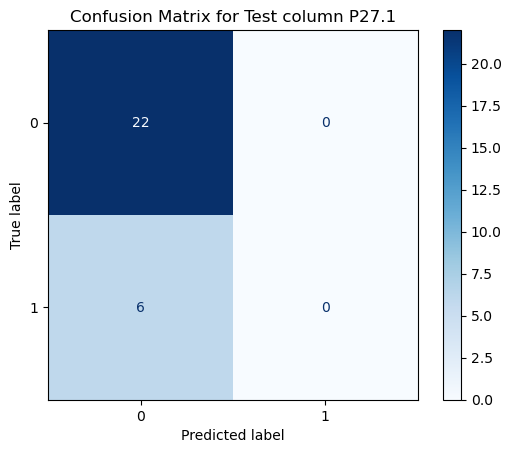

Fold 4/5
Best Parameters: {'activation': 'relu', 'alpha': 0.01, 'hidden_layer_sizes': (64,), 'learning_rate': 'invscaling', 'solver': 'adam'}
F1 Score (Train): 1.00
F1 Score (Val): 0.59
F1 Score (Test): 0.67

f1: 0.43



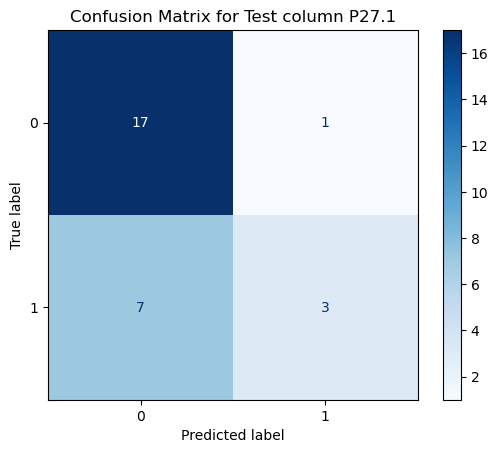

Fold 5/5
Best Parameters: {'activation': 'tanh', 'alpha': 0.01, 'hidden_layer_sizes': (32,), 'learning_rate': 'constant', 'solver': 'adam'}
F1 Score (Train): 0.58
F1 Score (Val): 0.78
F1 Score (Test): 0.79

f1: nan



/tmp/ipykernel_54919/4054149289.py:80: RuntimeWarning: invalid value encountered in scalar divide
  precision = TP / (TP + FP)


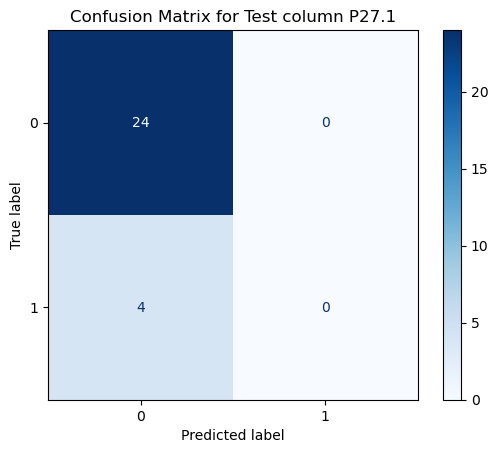

Training MLP model for H35.1 with 5-fold cross-validation
Fold 1/5
Best Parameters: {'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (64,), 'learning_rate': 'constant', 'solver': 'adam'}
F1 Score (Train): 0.89
F1 Score (Val): 0.84
F1 Score (Test): 0.90

f1: nan



/tmp/ipykernel_54919/4054149289.py:80: RuntimeWarning: invalid value encountered in scalar divide
  precision = TP / (TP + FP)


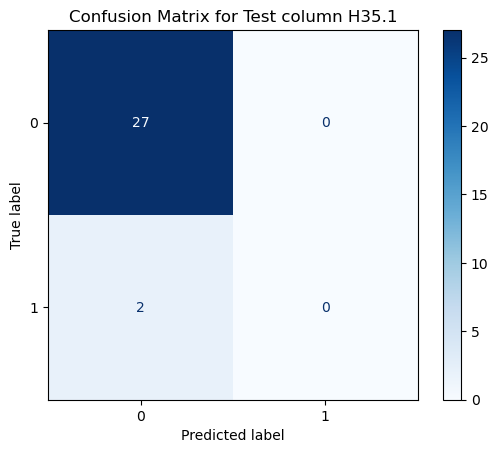

Fold 2/5
Best Parameters: {'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (64,), 'learning_rate': 'constant', 'solver': 'adam'}
F1 Score (Train): 0.85
F1 Score (Val): 0.89
F1 Score (Test): 0.95

f1: nan



/tmp/ipykernel_54919/4054149289.py:80: RuntimeWarning: invalid value encountered in scalar divide
  precision = TP / (TP + FP)


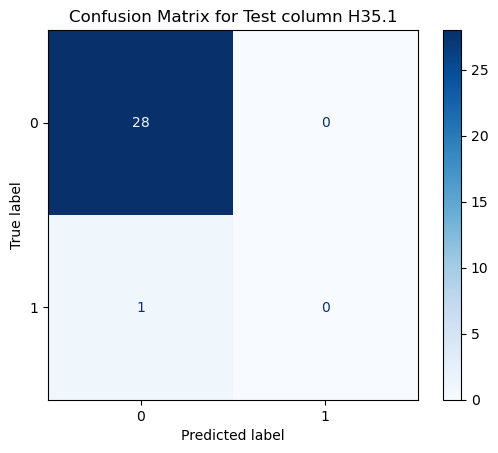

Fold 3/5
Best Parameters: {'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (128,), 'learning_rate': 'constant', 'solver': 'adam'}
F1 Score (Train): 0.85
F1 Score (Val): 0.89
F1 Score (Test): 0.95

f1: nan



/tmp/ipykernel_54919/4054149289.py:80: RuntimeWarning: invalid value encountered in scalar divide
  precision = TP / (TP + FP)


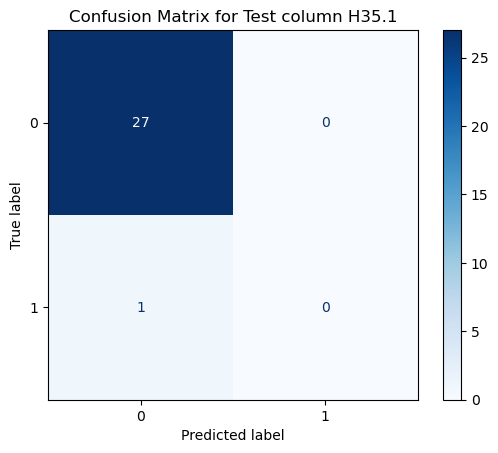

Fold 4/5


/home/michaltajak/anaconda3/envs/tensorplease/lib/python3.9/site-packages/sklearn/model_selection/_split.py:684: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(


Best Parameters: {'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (64,), 'learning_rate': 'constant', 'solver': 'adam'}
F1 Score (Train): 0.93
F1 Score (Val): 0.89
F1 Score (Test): 0.74

f1: nan



/tmp/ipykernel_54919/4054149289.py:80: RuntimeWarning: invalid value encountered in scalar divide
  precision = TP / (TP + FP)


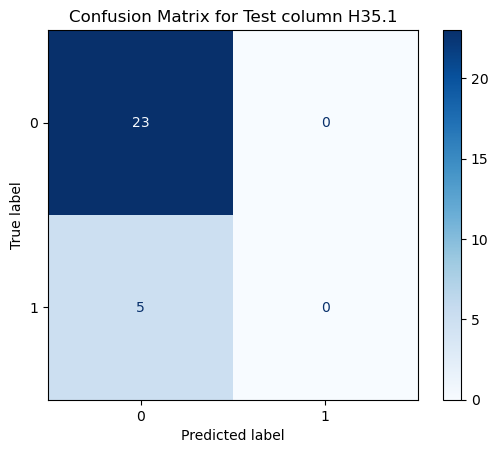

Fold 5/5
Best Parameters: {'activation': 'relu', 'alpha': 0.01, 'hidden_layer_sizes': (32,), 'learning_rate': 'constant', 'solver': 'adam'}
F1 Score (Train): 0.84
F1 Score (Val): 1.00
F1 Score (Test): 0.89

f1: nan



/tmp/ipykernel_54919/4054149289.py:80: RuntimeWarning: invalid value encountered in scalar divide
  precision = TP / (TP + FP)


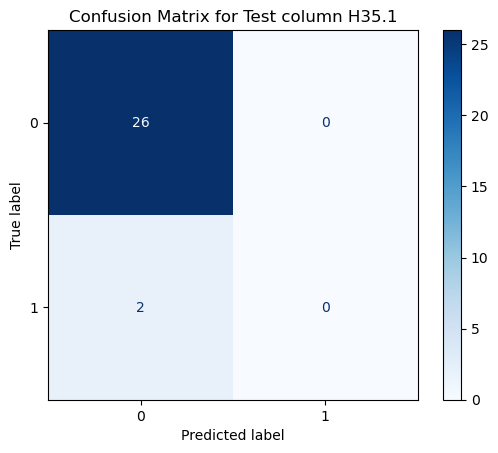

In [27]:
import warnings
from sklearn.exceptions import ConvergenceWarning

# Wyłącz ostrzeżenia typu ConvergenceWarning
warnings.filterwarnings("ignore", category=ConvergenceWarning)

import pandas as pd
import numpy as np
from sklearn.metrics import f1_score, confusion_matrix
from sklearn.model_selection import train_test_split, GridSearchCV, KFold
from sklearn.preprocessing import MinMaxScaler
from sklearn.neural_network import MLPClassifier
from sklearn.ensemble import IsolationForest
import matplotlib.pyplot as plt
from sklearn.metrics import ConfusionMatrixDisplay

# Define regression and classification target columns
reg = ['HC - WYPI', 'HC (pc) -WYPI', 'HC (Z Score) -WYPI', 'dni  hospitalizacji']
cla = ['P27.1', 'H35.1']

# Hyperparameters grid for MLP classification
param_grid_mlp_cla = {
    'hidden_layer_sizes': [(64,), (128,), (32,)],  
    'activation': ['relu', 'tanh'],  
    'solver': ['adam', 'lbfgs'],  
    'alpha': [0.0001, 0.001, 0.01, 0.1],  
    'learning_rate': ['constant', 'invscaling'], 
}

# Function to detect anomalies using Isolation Forest
def detect_anomalies(X, contamination=0.05):
    """
    Detect anomalies using Isolation Forest method.
    
    Parameters:
    X: Feature matrix (numpy array or DataFrame)
    contamination: Proportion of outliers in the data
    
    Returns:
    anomalies: Indices of the detected anomalies
    """
    model = IsolationForest(contamination=contamination, random_state=43)
    model.fit(X)
    predictions = model.predict(X)
    
    # Anomalies are marked as -1
    anomalies = np.where(predictions == -1)[0]
    
    return anomalies

# MLP classification evaluation function focusing on F1-score
def evaluate_classification_model(X_train, X_val, X_test, y_train, y_val, y_test, model, param_grid):
    grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=5, n_jobs=-1, verbose=0)
    grid_search.fit(X_train, y_train)
    best_model = grid_search.best_estimator_

    # Training evaluation
    y_train_pred = best_model.predict(X_train)
    f1_train = f1_score(y_train, y_train_pred, average='weighted')

    # Validation evaluation
    y_val_pred = best_model.predict(X_val)
    f1_val = f1_score(y_val, y_val_pred, average='weighted')

    # Test evaluation
    y_test_pred = best_model.predict(X_test)
    f1_test = f1_score(y_test, y_test_pred, average='weighted')

    best_params = grid_search.best_params_

    print(f"Best Parameters: {best_params}")
    print(f"F1 Score (Train): {f1_train:.2f}")
    print(f"F1 Score (Val): {f1_val:.2f}")
    print(f"F1 Score (Test): {f1_test:.2f}\n")

    cm_val = confusion_matrix(y_val, y_val_pred)
    cm_test = confusion_matrix(y_test, y_test_pred)
        
    TN, FP, FN, TP = cm_test.ravel()
    precision = TP / (TP + FP)
    recall = TP / (TP + FN)
        
    # Obliczanie F1 score
    f1 = 2 * (precision * recall) / (precision + recall)
    print(f"f1: {f1:.2f}\n")
        
    disp_test = ConfusionMatrixDisplay(confusion_matrix=cm_test)
    disp_test.plot(cmap='Blues', values_format='d')
    plt.title(f"Confusion Matrix for Test column {y_col}")
    plt.show()

    return grid_search.best_params_, f1_train, f1_val, f1_test

# Cross-validation for MLP classification focusing on F1-score
def cross_validate_classification(X, y, model, param_grid, cv=5):
    X = X.values
    kf = KFold(n_splits=cv, shuffle=True, random_state=43)
    scaler = MinMaxScaler()
    X_scaled = scaler.fit_transform(X)
    
    fold = 1
    for train_idx, test_idx in kf.split(X_scaled):
        print(f"Fold {fold}/{cv}")
        X_train, X_test = X_scaled[train_idx], X_scaled[test_idx]
        y_train, y_test = y.iloc[train_idx].values, y.iloc[test_idx].values
        
        # Detect and remove anomalies from the training set
        anomalies_train = detect_anomalies(X_train)
        X_train_cleaned = np.delete(X_train, anomalies_train, axis=0)
        y_train_cleaned = np.delete(y_train, anomalies_train, axis=0)
        
        # Further split the training data into train/val sets
        X_train, X_val, y_train, y_val = train_test_split(X_train_cleaned, y_train_cleaned, test_size=0.25, random_state=43)
        
        best_params, f1_train, f1_val, f1_test = evaluate_classification_model(
            X_train, X_val, X_test, y_train, y_val, y_test, model, param_grid)
        
        fold += 1

# Loop through classification targets with MLP
for y_col in cla:
    print(f"Training MLP model for {y_col} with 5-fold cross-validation")
    model = MLPClassifier(max_iter=3000)
    cross_validate_classification(X, y[y_col], model, param_grid_mlp_cla, cv=5)
